# Concatenate capture loss logs

In [2]:
import os
import pandas as pd

In [3]:
# Define the source directory containing capture loss logs
source_dir = "/root/capture_loss_iotd20_logs"

# Define the output file
output_file = "/root/capture_loss_iotd20_logs/concatenated_logs.csv"

In [4]:
# Create an empty list to store DataFrames
dfs = []
# Iterate through each JSON file in the source directory
for file_name in os.listdir(source_dir):
    if file_name.endswith(".log"):
        file_path = os.path.join(source_dir, file_name)
        
        # Load the JSON file into a pandas DataFrame
        df = pd.read_json(file_path, lines=True)
        
        # Add a new column with the file name
        df['file_name'] = file_name
        
        # Append the DataFrame to the list
        dfs.append(df)

In [5]:
# Concatenate all DataFrames into a single DataFrame
concatenated_df = pd.concat(dfs, ignore_index=True)


In [6]:
concatenated_df.to_csv(output_file, index=False)
print("Concatenation completed. Output file:", output_file)


Concatenation completed. Output file: /root/capture_loss_iotd20_logs/concatenated_logs.csv


In [9]:
print("Número de filas en el DataFrame:", df.shape[0])


Número de filas en el DataFrame: 34


In [14]:
csv_file = output_file
df = pd.read_csv(csv_file)

# List the rows with the highest values in the percent_lost column
top_percent_lost = df.nlargest(34, 'percent_lost')  # Change 10 to the desired number of rows
selected_columns = ['ts_delta', 'gaps', 'acks', 'file_name', 'percent_lost']
top_percent_lost_selected = top_percent_lost[selected_columns]

print(top_percent_lost_selected)

      ts_delta  gaps   acks                            file_name  percent_lost
16   60.661418  1341   1932  mirai-hostbruteforce-5-dec-logs.log     69.409938
28   60.004220  1493   2523  mirai-hostbruteforce-4-dec-logs.log     59.175585
30   60.011806   741   1331  mirai-hostbruteforce-3-dec-logs.log     55.672427
0    60.044936    96    196    mirai-httpflooding-3-dec-logs.log     48.979592
14   60.044936    96    196    mirai-httpflooding-1-dec-logs.log     48.979592
4    60.044936    96    196     mirai-ackflooding-3-dec-logs.log     48.979592
12   60.044936    96    196     mirai-ackflooding-1-dec-logs.log     48.979592
24   60.007081    96    196     mirai-udpflooding-1-dec-logs.log     48.979592
6    60.001468    96    196     mirai-udpflooding-3-dec-logs.log     48.979592
21  240.761748  1775   3625     mirai-udpflooding-2-dec-logs.log     48.965517
9   240.761748  1775   3625     mirai-ackflooding-4-dec-logs.log     48.965517
11  240.761748  1775   3625     mirai-udpflooding-4-

In [15]:
# Ordenar primero por el nombre del archivo y luego por el porcentaje perdido
top_percent_lost_sorted = top_percent_lost_selected.sort_values(by=['file_name', 'percent_lost'], ascending=[True, False])

print(top_percent_lost_sorted)

      ts_delta  gaps   acks                            file_name  percent_lost
12   60.044936    96    196     mirai-ackflooding-1-dec-logs.log     48.979592
13   62.069589    36     84     mirai-ackflooding-1-dec-logs.log     42.857143
3   240.761748  1775   3625     mirai-ackflooding-2-dec-logs.log     48.965517
2    60.021998   246    582     mirai-ackflooding-2-dec-logs.log     42.268041
4    60.044936    96    196     mirai-ackflooding-3-dec-logs.log     48.979592
5    62.069589    36     84     mirai-ackflooding-3-dec-logs.log     42.857143
9   240.761748  1775   3625     mirai-ackflooding-4-dec-logs.log     48.965517
8    60.021998   246    582     mirai-ackflooding-4-dec-logs.log     42.268041
22   60.003933   851   1862  mirai-hostbruteforce-1-dec-logs.log     45.703545
23  243.685141   335   4666  mirai-hostbruteforce-1-dec-logs.log      7.179597
19  250.798704  2404   8760  mirai-hostbruteforce-2-dec-logs.log     27.442922
18   60.013508   482   2647  mirai-hostbruteforce-2-

Análisis de los missed bytes

In [25]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [4]:
main_directory = "/root/bbdd/logs-zeek/iotd20-logs/logs-original/"

In [19]:
# Function to process a conn.log file
def process_conn_log(folder_path):
    conn_log_path = os.path.join(folder_path, "conn.log")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        df = pd.read_json(conn_log_path, lines=True)
        
        # Convert timestamp to datetime if needed
        # df["timestamp"] = pd.to_datetime(df["timestamp"])
        
        # Create a dot plot of missed_bytes evolution
        plt.scatter(df["ts"], df["missed_bytes"], s=10, marker='o')
        plt.xlabel("Timestamp")
        plt.ylabel("Missed Bytes")
        plt.title(f"Evolution of Missed Bytes - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df["missed_bytes"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df.nlargest(15, "missed_bytes")
        print("\nTop 15 highest missed_bytes:")
        print(top_15[["uid", "missed_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
    else:
        print(f"conn.log not found in {folder_path}")

In [40]:
def process_conn_log(folder_path, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)]):
    conn_log_path = os.path.join(folder_path, "conn_stadistics.log")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        df = pd.read_json(conn_log_path, lines=True)

        # Sample 5 flows with NaN values in either orig_bytes or resp_bytes before dropping
        nan_flows = df[df['orig_bytes'].isnull() | df['resp_bytes'].isnull()].head(5)
        if not nan_flows.empty:
            print("Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:")
            print(nan_flows[["uid","missed_bytes","orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Notify and count rows with NaN values in both orig_bytes and resp_bytes columns
        nan_count = df[df['orig_bytes'].isnull() & df['resp_bytes'].isnull()].shape[0]
        if nan_count > 0:
            print(f"{nan_count} rows with NaN values in both orig_bytes and resp_bytes columns.")
        
        # Calculate missed_bytes ratio
        df['missed_ratio'] = np.where(df['missed_bytes'] == 0, 0, df['missed_bytes'] / (df['orig_bytes'] + df['resp_bytes']))        
        
        # Sort DataFrame by missed_ratio in descending order
        df_sorted = df.sort_values(by='missed_ratio', ascending=False)
        
        # Create a dot plot of missed_bytes ratio evolution
        plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o')
        plt.xlabel("Rank Position (sorted by missed ratio)")
        plt.ylabel("Missed Bytes Ratio")
        plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df_sorted["missed_ratio"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df_sorted.head(15)
        print("\nTop 15 highest missed_bytes ratios:")
        print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        print("\nLeast 15 flows based on missed bytes ratio:")
        least_15 = df_sorted.tail(15)
        print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Initialize lists to store counts for each threshold range
        threshold_counts = [0] * len(thresholds)
        
        # Count number of flows in each threshold range
        for i, (lower, upper) in enumerate(thresholds):
            if upper is None:
                num_flows = (df_sorted['missed_ratio'] >= lower).sum()
            else:
                num_flows = ((df_sorted['missed_ratio'] >= lower) & (df_sorted['missed_ratio'] <= upper)).sum()
            threshold_counts[i] = num_flows
        
        # Create grouped bar plot for the number of flows exceeding each threshold range
        threshold_ranges = [f"{int(lower * 100)}% - {int(upper * 100)}%" if upper is not None else f"> {int(lower * 100)}%" for lower, upper in thresholds]
        plt.bar(threshold_ranges, threshold_counts)
        plt.xlabel("Missed Bytes Ratio Threshold Range")
        plt.ylabel("Number of Flows")
        plt.title(f"Number of Flows Exceeding Missed Bytes Ratio Thresholds - {folder_name}")
        plt.show()

    else:
        print(f"conn.log not found in {folder_path}")

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6   C4p4Av1rhjqr9EGw05             0         NaN         NaN  192.168.0.16   
7   CEiS5a3HVD7sxgB9wc             0         NaN         NaN  192.168.0.16   
8    CzkHD11qLcqjMmjg4             0         NaN         NaN  192.168.0.19   
14  C7d5704HOQ8opZxGti             0         NaN         NaN  192.168.0.16   
18  CL3MWW2EUHPx0JSQ19             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


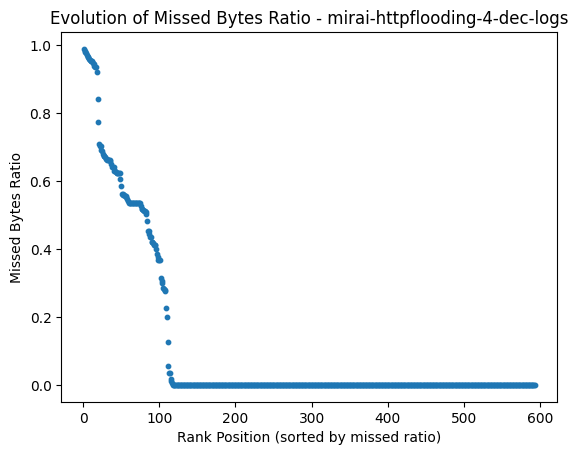

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84   CUIqN11jEkc7DMkm08      0.989859  192.168.0.16      56376   
421  CNcG272xMZAFaxTKwf      0.985129  192.168.0.24      52939   
560   CjXWoCP444khJY2j8      0.981245  192.168.0.24      51252   
431  CLyeyR2NDOObVQdau8      0.976523  192.168.0.24      36865   
363  CWhQS93pKXdOATZ4vd      0.972353  192.168.0.24      53894   
208  C51OKs4mynojRW7cK3      0.966788  192.168.0.24      48383   
194  Co1tgZ2dGDZlPfUhx6      0.965684  192.168.0.16      56386   
377   CKy19D7mEPJkALRFd      0.959631  192.168.0.16      56419   
316  CVlUNS2CWH76A1yBPj      0.958046  192.168.0.16      56414   
247   CBVEwXrDIeX2joKze      0.954322  192.168.0.24      44546   
580  CLvz4K33FMAxUSUfz2      0

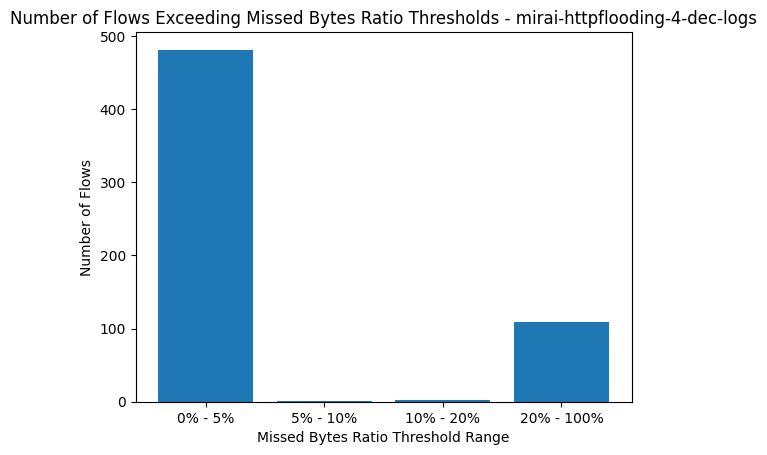

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   CL149e1LXsWWHJU8je             0         NaN         NaN  192.168.0.19   
1   CxxRPj1Qo4giA3clS2             0         NaN         NaN  192.168.0.19   
3    CUaq2KUqNFe7yjoZj             0         NaN         NaN  192.168.0.19   
6   CnXYMd4HHtCcvWGcd5             0         NaN         NaN  192.168.0.19   
11  CfpJPp2v9UpYaA3Qse             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


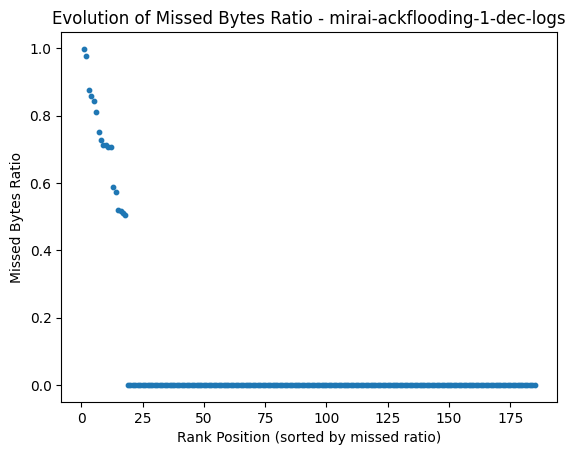

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39   CLmy1p10ZtByF9Ulz5      0.998111  192.168.0.24      43278   
4    CsxNxo2n1kFX34fTqk      0.977721  192.168.0.24      40541   
116   CXn1uye8qpzQ7B4hf      0.877538  192.168.0.16      56344   
75    Cnjgq63U7lcTIMvFs      0.858365  192.168.0.16      56340   
103  CLOuq73sGLOlAuLy8l      0.843209  192.168.0.16      56343   
163   COCnBumqeL771BTad      0.811155  192.168.0.16      56345   
105  Cd0iCu3wE0N56Z81v7      0.750518  192.168.0.16      56342   
73   CIA4lg2tx00iZBazIg      0.728187  192.168.0.16      56338   
63    CwUBV42upa3iJQin3      0.711898  192.168.0.16      52045   
65    CKfHmwma5xh5GrSoe      0.711898  192.168.0.16      52046   
100  C8MJXS2hJdpHSdFVK4      0

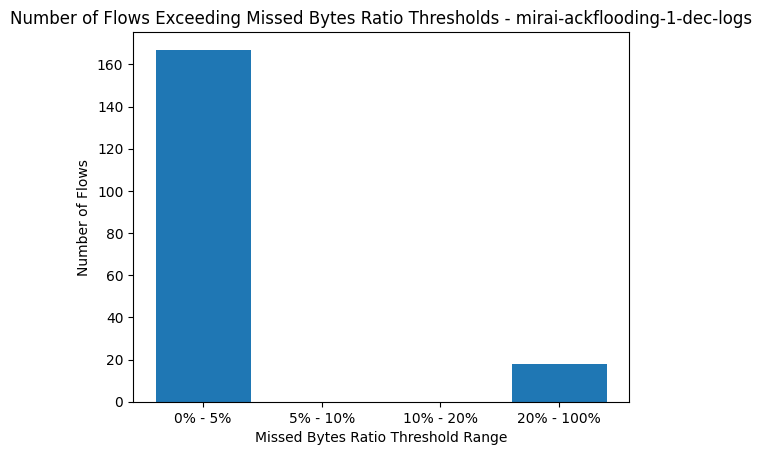

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   CCy2QE14s0LDjezP35             0         NaN         NaN  192.168.0.19   
1    CRfELRwpsPJTGcxF7             0         NaN         NaN  192.168.0.19   
3   CyyHe11SeioSZDigEc             0         NaN         NaN  192.168.0.19   
6   CN3mrq4hQ6In8ibd5d             0         NaN         NaN  192.168.0.19   
11  CSiBNh1873jYuCyKd5             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


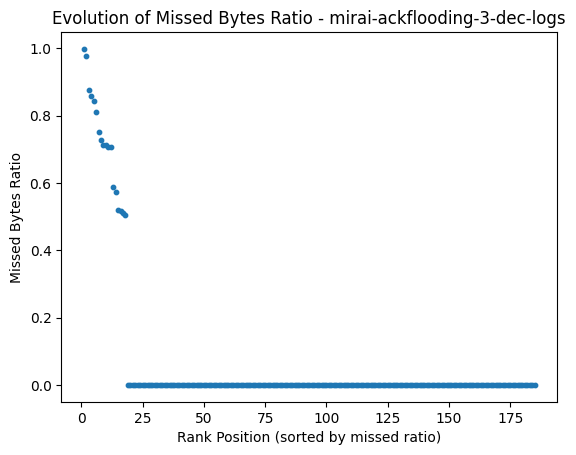

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39    CtXFUY1lnNIGBbW09      0.998111  192.168.0.24      43278   
4    CP5AmH3Pn7KSq9K6Se      0.977721  192.168.0.24      40541   
116  CvZLJL2nzMWOm2oGi8      0.877538  192.168.0.16      56344   
75   CV6tnh4AzPo8ZQ384e      0.858365  192.168.0.16      56340   
103  ClYuP51ux6Ld5g03le      0.843209  192.168.0.16      56343   
133  CBwS853YS5Ww1eaLWh      0.811155  192.168.0.16      56345   
105  C26dWi1JaqCcBkKlPh      0.750518  192.168.0.16      56342   
73    Cw8mkoqkF1h6rBNP1      0.728187  192.168.0.16      56338   
63   CRqMem4BwGjlNTZTg6      0.711898  192.168.0.16      52045   
65   CD1ocw33qCdtrzNPWl      0.711898  192.168.0.16      52046   
100  CPJpx04jSzJUo6VME8      0

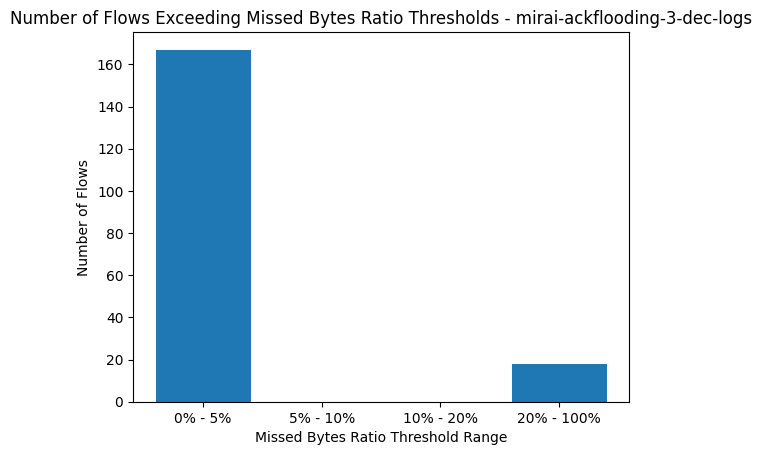

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    CZ49os2H9QpW4lqsI             0         NaN         NaN  192.168.0.16   
7   CUzd6q2W2lONUsusz8             0         NaN         NaN  192.168.0.16   
8   CI2gC32CqYEqrp4Cl1             0         NaN         NaN  192.168.0.19   
14   CYn61b83OG2JgglGi             0         NaN         NaN  192.168.0.16   
18   CdpqTr4VWDcV1NrQc             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


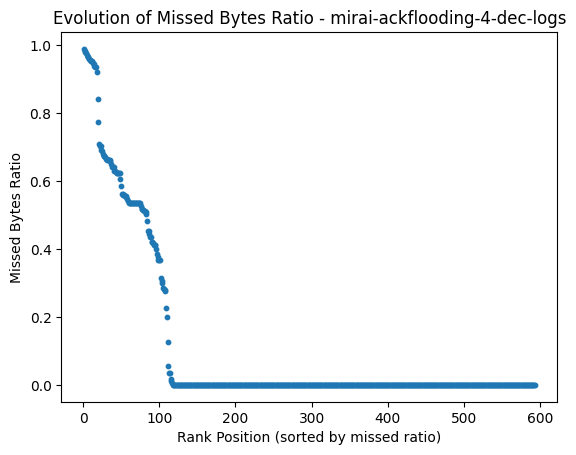

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84   CGuJUo3rGny0lOHA4a      0.989859  192.168.0.16      56376   
421   C51Uoqr5ynIrqA5ih      0.985129  192.168.0.24      52939   
553   CwUzUZ2EE8ERFfShM      0.981245  192.168.0.24      51252   
431  Cj3tUo1uR7JWj5Cyz7      0.976523  192.168.0.24      36865   
363   ClZ1xYUJglnvWtXL3      0.972353  192.168.0.24      53894   
207  Cs9wQo1SlElGogUIWa      0.966788  192.168.0.24      48383   
194  CyMHVl2pSGnes49Tvc      0.965684  192.168.0.16      56386   
377  C8s37L12bEjI4mlAnh      0.959631  192.168.0.16      56419   
316  CggJt01Sz5pY3iUyS3      0.958046  192.168.0.16      56414   
247  CDK0OC399uibYvsyCd      0.954322  192.168.0.24      44546   
488  C3QGKL3kobvopPt1Fh      0

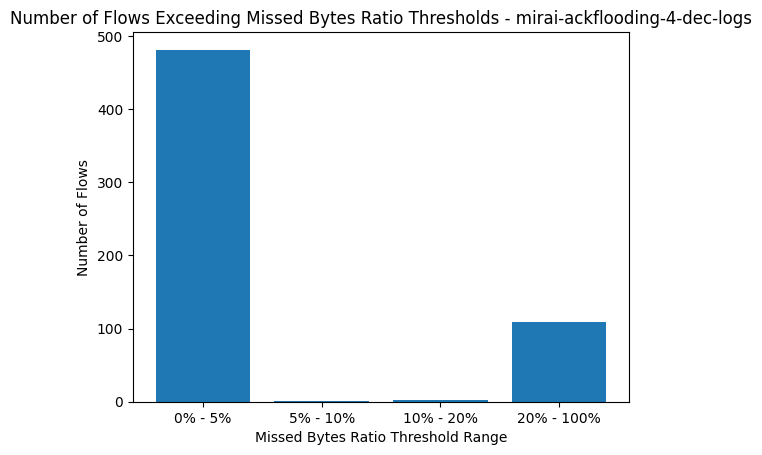

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6   CwVI6S2Bg5nEmwc23e             0         NaN         NaN  192.168.0.16   
7   C3S18T1SHFloY0sZWe             0         NaN         NaN  192.168.0.16   
8   C7fkNE3H7KzyMw0jXe             0         NaN         NaN  192.168.0.19   
14  CisuDk3jV1XrHgCLm5             0         NaN         NaN  192.168.0.16   
18  CqgBsQ3BEiFoASdLIc             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


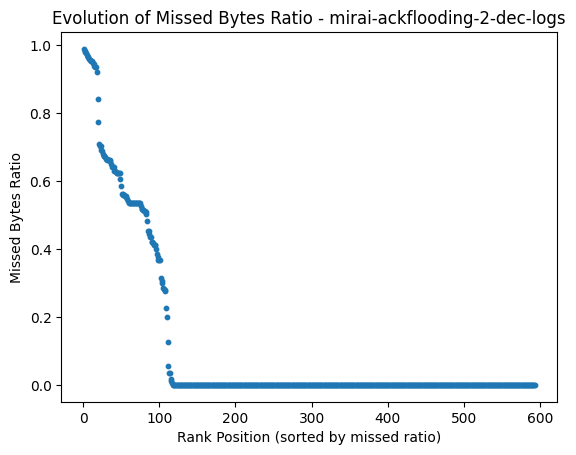

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84   C339SD2NDdEu6hqG44      0.989859  192.168.0.16      56376   
421  CoJdRq3zg3koJtyQcf      0.985129  192.168.0.24      52939   
549   C8nGAJiG3plLLUjM2      0.981245  192.168.0.24      51252   
431  CrY9Sk4a2F9OYb3m86      0.976523  192.168.0.24      36865   
363  C353Rs2pMy7Jjmr3ab      0.972353  192.168.0.24      53894   
208  CtZRnX2y6VbHdUI6Aj      0.966788  192.168.0.24      48383   
194  CNefWa1EPMU5NRirh4      0.965684  192.168.0.16      56386   
377  CfFSIz1uEjPLaW4xC2      0.959631  192.168.0.16      56419   
316  CLM94A3iBfO2exGyq1      0.958046  192.168.0.16      56414   
247  CTTk3l1eRmUGuTI9b7      0.954322  192.168.0.24      44546   
561  CBx2XG2myCODAktql4      0

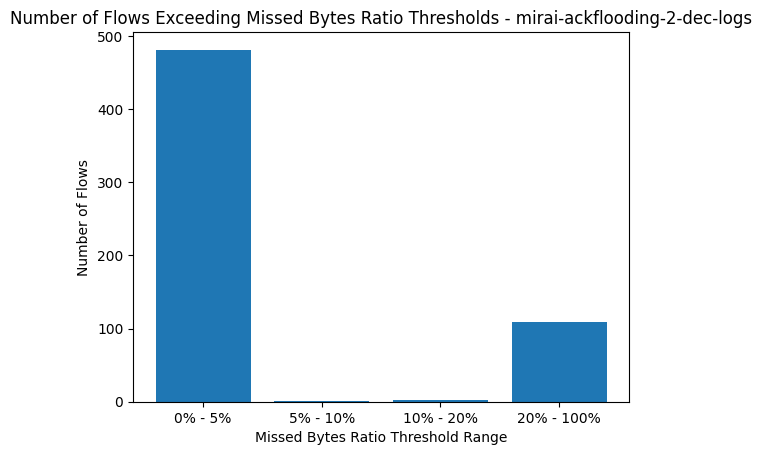

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
1   C64GE719Yip8G10xk8             0         NaN         NaN    192.168.0.24   
16  CyDriz4peq7hKrSyO1             0         NaN         NaN    192.168.0.13   
19  C0peqr1ntkb2Aj4Tij             0         NaN         NaN    192.168.0.13   
21  CI5DX91TgJIotB4TCe             0         NaN         NaN    192.168.0.13   
30  CLwXZT10n3XdC7tyo5             0         NaN         NaN  211.188.147.64   

    id.orig_p       id.resp_h  id.resp_p proto  
1       43112  223.39.118.149        443   tcp  
16       9020    192.168.0.16      10233   tcp  
19       9020    192.168.0.16      10049   tcp  
21       9020    192.168.0.16      10009   tcp  
30        349    192.168.0.24      64985   tcp  
65 rows with NaN values in both orig_bytes and resp_bytes columns.


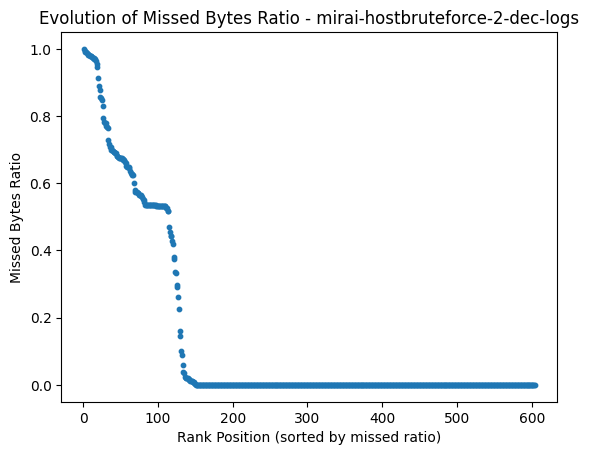

Statistics:
count    604.000000
mean       0.139853
std        0.279657
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000800
max        0.999771
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
549  CsC3d93tAupoQDFDT3      0.999771  192.168.0.24      38880   
475  CvrfVv2DWu7SwX5Mud      0.993079  192.168.0.24      54887   
524   CQQujwNRiIWVCcJA9      0.991812  192.168.0.24      47532   
494  Cbx36W1p5WzIVYaDCb      0.989787  192.168.0.24      56286   
55   CayVEB1yFBuoq1Qsl3      0.988819  192.168.0.24      45410   
551  CLKbID2t7qC2Xo4esk      0.984087  192.168.0.24      49932   
95   CXLqee1YcxfMxX28Mh      0.982207  192.168.0.24      34086   
543  CgZ73e1WxlVbv9dp3l      0.981282  192.168.0.24      34556   
257  CGKQnY34sOpp0Hddp6      0.979692  192.168.0.24      40567   
114  CBf7u93fuvmStMjuXh      0.978207  192.168.0.24      53666   
63   CWQsKv2vnQGcd75vcf      0

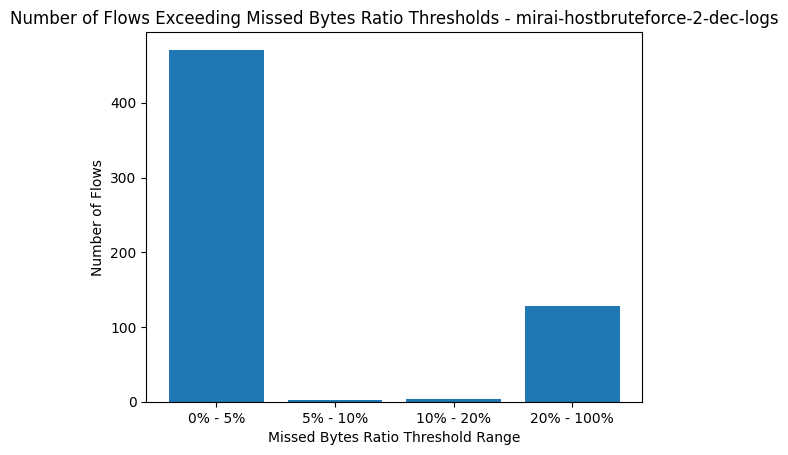

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
16   C0I6sMRdDQ0OvDeKh             0         NaN         NaN    192.168.0.24   
27  CqD2EX12rxPdsKioDb             0         NaN         NaN  223.39.123.245   
39  CHcasJ3sjqM7iUrCKl             0         NaN         NaN    192.168.0.16   
43  CoGcP63xnksZhqiI5l             0         NaN         NaN    192.168.0.13   
47  CFAcUN22pjKSCv9OCc             0         NaN         NaN    192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
16      33435  223.39.118.176        443   tcp  
27       7000    192.168.0.24      20000   tcp  
39       6979    192.168.0.13      27964   tcp  
43      13118    192.168.0.16      17843   tcp  
47       9020    192.168.0.16      28462   tcp  
94 rows with NaN values in both orig_bytes and resp_bytes columns.


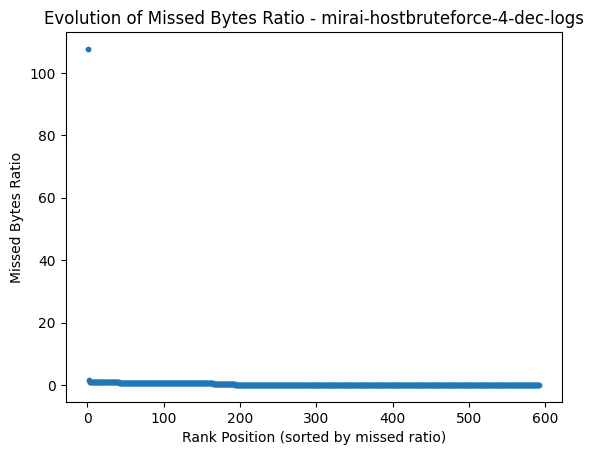

Statistics:
count    592.000000
mean       0.380783
std        4.429832
min        0.000000
25%        0.000000
50%        0.000000
75%        0.530829
max      107.718894
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
372  CI7Og42Y0BGNjqpfCd    107.718894  192.168.0.24      53632   
581   CAxpxomUA2iRcE9Ng      1.550531  192.168.0.24      34887   
25   C7Cv5v1h49phYdxoxf      0.997177  192.168.0.24      46238   
51   CHwTkH17u2IJpxeRbh      0.996974  192.168.0.24      51114   
548   COu2RzfYWIvNR1Wbc      0.989139  192.168.0.24      37297   
327  CGHPQ63VWtRSuH8XW8      0.988443  192.168.0.24      38218   
421  C6fp3o1d5UY316unr8      0.987595  192.168.0.24      51111   
491  CHJzFi2q1YhcbBoGL2      0.987136  192.168.0.24      51586   
91    Csw1Wj329N2ESZqfa      0.986387  192.168.0.24      43987   
466  CCD7k41IXfuxbJm7N2      0.985493  192.168.0.23      42834   
381  CNSEy74wnLM0pcWqxi      0

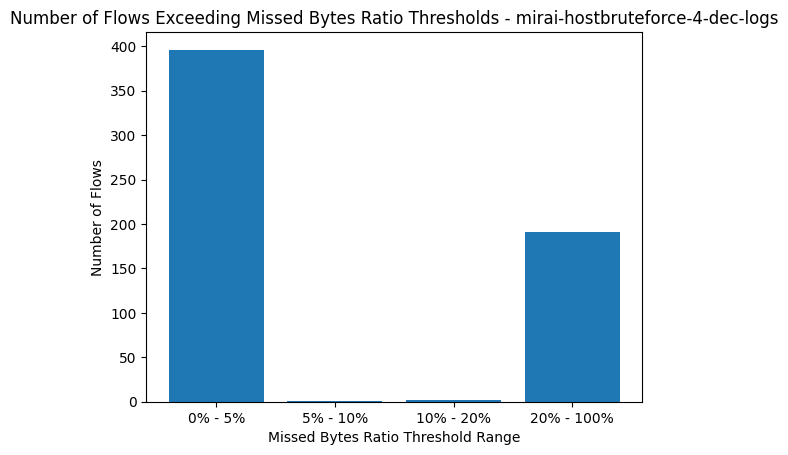

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   CHGIBe4BBoPxrl9Zsj             0         NaN         NaN  192.168.0.19   
1    CqjNqXkZJcf86JzYl             0         NaN         NaN  192.168.0.19   
3    C2DxzGfV5jTaq1x0i             0         NaN         NaN  192.168.0.19   
6   CrSaGe33VRim7Xn6fe             0         NaN         NaN  192.168.0.19   
11  CAIwhb3kKN3NtgEUoi             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


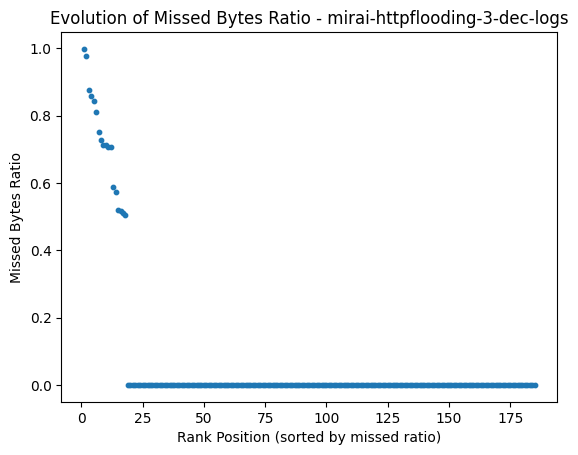

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39    CnShW6zCWtH3xdVUk      0.998111  192.168.0.24      43278   
4     CU9I9ZzkmXWjK3gkf      0.977721  192.168.0.24      40541   
116  Cl7GGh2qIiy6Udtz24      0.877538  192.168.0.16      56344   
75   CcydMH3F0T5MsOOfo4      0.858365  192.168.0.16      56340   
103  CrwVBu2KpvNkR6lWEk      0.843209  192.168.0.16      56343   
151   CpMra7ecPzRNoD9O1      0.811155  192.168.0.16      56345   
105    CwcviPqtwoq8qoYY      0.750518  192.168.0.16      56342   
73   CuJElT2lu0EpMLV5U5      0.728187  192.168.0.16      56338   
63   CFvraj2wOQqRfUCqcb      0.711898  192.168.0.16      52045   
65   CFauSH3P5Vq9S6j1Ji      0.711898  192.168.0.16      52046   
100   CnbYDZdqdd7jdxGH4      0

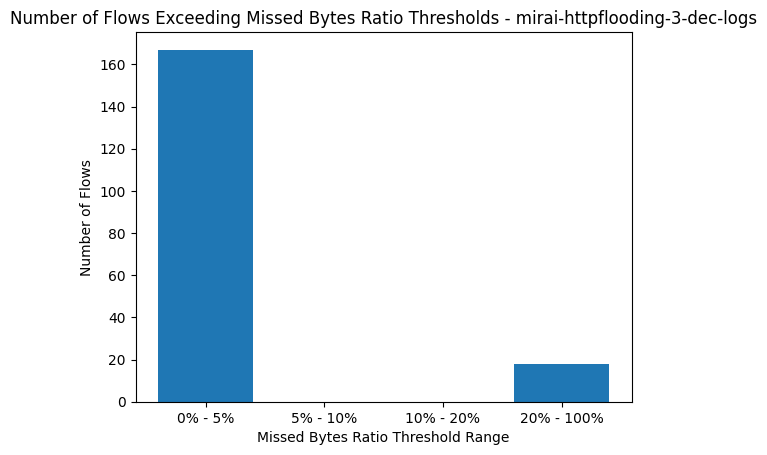

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0    Cba6wYiQ27D0Y0Waj             0         NaN         NaN  192.168.0.19   
1   CZjtXH1gETG86w310d             0         NaN         NaN  192.168.0.19   
3   CF53vz3xj7p8vsmlZe             0         NaN         NaN  192.168.0.19   
6    CWju0P3UHwJ0Ziqfh             0         NaN         NaN  192.168.0.19   
11  CpUfzt26YLcsRxFy5b             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


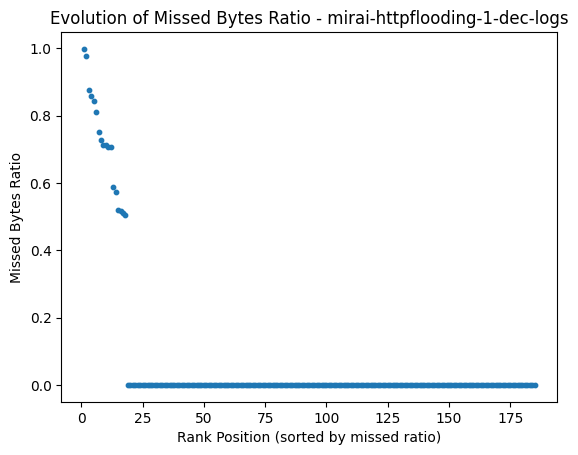

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39   CEVyJE1wP2NGlYNNhg      0.998111  192.168.0.24      43278   
4     CIh9hF1ukpWJj3smK      0.977721  192.168.0.24      40541   
116  CDP58z37QTUN3ccq6h      0.877538  192.168.0.16      56344   
75   CkU6O32BTdpdrkNI2j      0.858365  192.168.0.16      56340   
103   ColIY6YkfE602T1Cg      0.843209  192.168.0.16      56343   
133  CyexCo2yzbRsC1EH2d      0.811155  192.168.0.16      56345   
105  CBCQn82bLqYPeXSaT5      0.750518  192.168.0.16      56342   
73   CCn9yN3j1P4d7BlOrf      0.728187  192.168.0.16      56338   
63   C2xgCg3K5CQMMRYhpa      0.711898  192.168.0.16      52045   
65   CK0Bwp116FX5odW0Cl      0.711898  192.168.0.16      52046   
100  CJMFZg3wf3uFA560Se      0

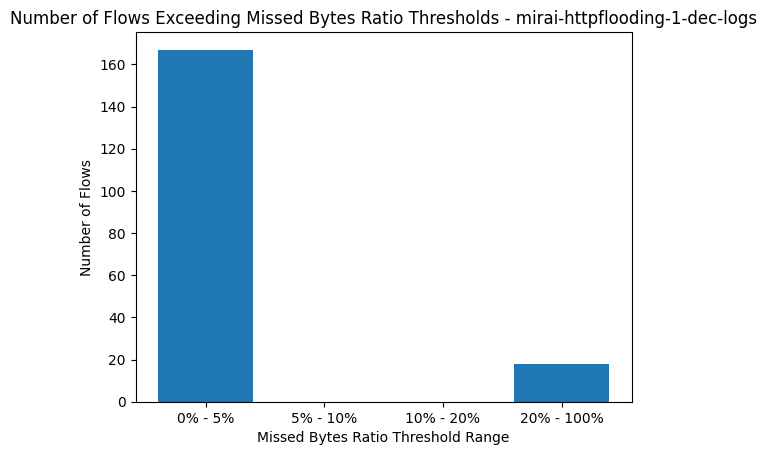

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes        id.orig_h  \
1    C5NKtL3hH7URKvdR8             0         NaN         NaN     192.168.0.24   
2   ClALoh2Qf51f0ufjAc             0         NaN         NaN     192.168.0.51   
3    C65NCTVXEXQxixH6k             0         NaN         NaN     192.168.0.23   
7   CbWIE64AwosKRoFTCf             0         NaN         NaN  188.172.201.158   
27  Cl7sxF2j9wEAzL7yij             0         NaN         NaN     192.168.0.51   

    id.orig_p       id.resp_h  id.resp_p proto  
1       53726    211.237.6.43        443   tcp  
2       57662    185.188.32.3         80   tcp  
3       39682  13.209.250.102        443   tcp  
7        5938    192.168.0.51      57667   tcp  
27      58070     163.152.1.1         53   udp  
68 rows with NaN values in both orig_bytes and resp_bytes columns.


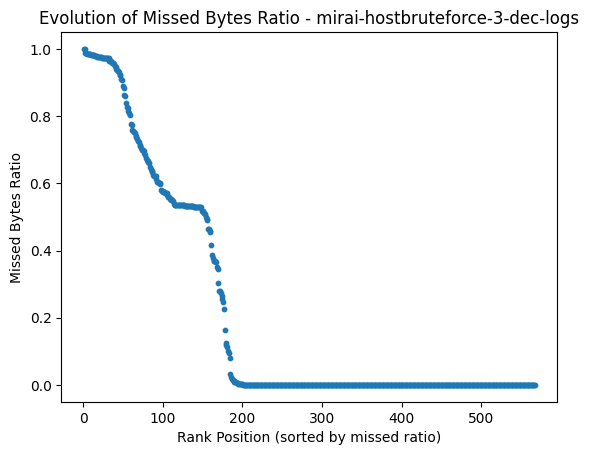

Statistics:
count    567.000000
mean       0.214511
std        0.337218
min        0.000000
25%        0.000000
50%        0.000000
75%        0.530973
max        0.999994
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
565  CkZxNj1DmdA52UnjDb      0.999994  192.168.0.24      33244   
487  Cq7S6F2Lli2aQeNoT1      0.999956  192.168.0.23      47480   
28    Czp0Bo3NuDQWebCQj      0.988732  192.168.0.24      53726   
46    ClOtZQMZdVkkhoeF1      0.988538  192.168.0.24      43322   
128  C28j2D3GTiGzxOh617      0.986364  192.168.0.24      59978   
297  C9IpPh2ALX4q6DgAA8      0.985369  192.168.0.23      47442   
521  C1edgh3J31rzg3KZ7e      0.984932  192.168.0.23      47438   
554   CfUDa81A0V00gEtKp      0.984789  192.168.0.24      35533   
541  CKrH124oR1nEYeTFAb      0.984299  192.168.0.24      57848   
59   CvCqfd41Lv1hcpK0zh      0.982072  192.168.0.24      35914   
329  CbUhpZ2mFQNFQ5SZt4      0

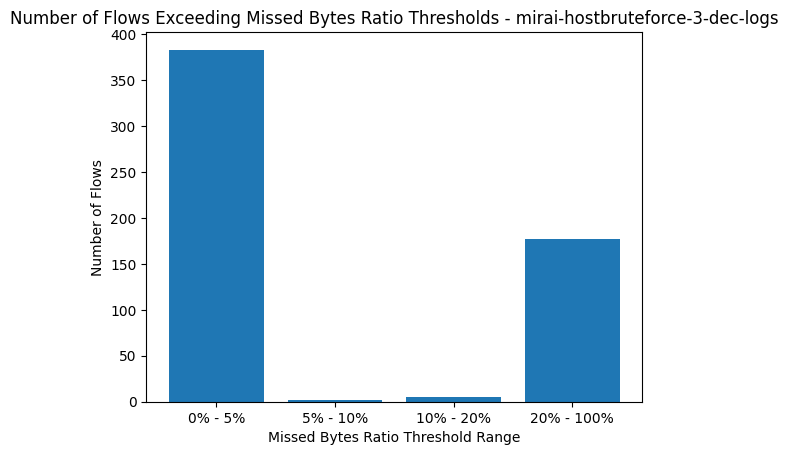

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6   CePf2M2l9eye804vvg             0         NaN         NaN  192.168.0.16   
7   CBUZQL2swcC0e0VNWa             0         NaN         NaN  192.168.0.16   
8    C3GZFS67mL7IZvFv6             0         NaN         NaN  192.168.0.19   
14  CbLMu52tKZlNrVWUOh             0         NaN         NaN  192.168.0.16   
18  CKkhj63Y3PPDSdPqV9             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


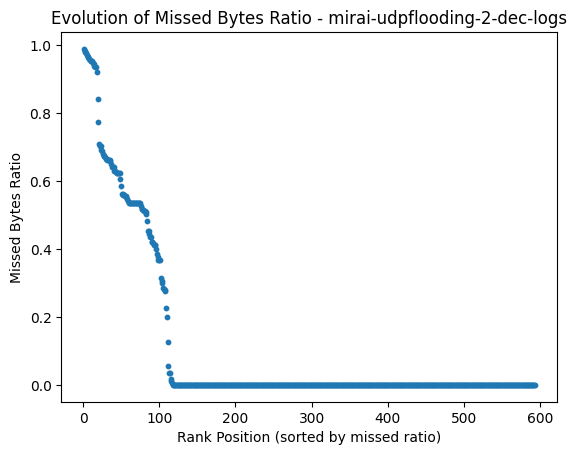

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84    CtDlPM3Ot8gVWtGMs      0.989859  192.168.0.16      56376   
421   C2TgPfvAlvS0Xyzc4      0.985129  192.168.0.24      52939   
575    Csy0ItaCGdM3QmJR      0.981245  192.168.0.24      51252   
431   CXvDUqP53Ly6je7fh      0.976523  192.168.0.24      36865   
363  CRgRvw1TiRmf46nkT1      0.972353  192.168.0.24      53894   
206  CAjzdC38J5eRLYvPG7      0.966788  192.168.0.24      48383   
194  C9Am9D1M4Qc8yOgx9i      0.965684  192.168.0.16      56386   
377  CoIXhG1xomq7hpvF97      0.959631  192.168.0.16      56419   
316   Cqr9ebCrYgO8AkrJ8      0.958046  192.168.0.16      56414   
247  CudAn1252k6gOuMhLd      0.954322  192.168.0.24      44546   
502   CNTIPumbQ426jzw15      0

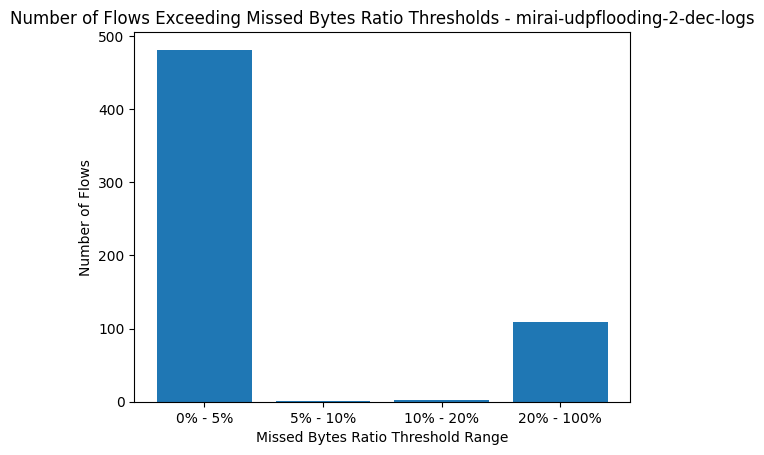

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
1   CErncp147xRrB11GK8             0         NaN         NaN  104.74.213.186   
2   CSleuQ2vyTmWU9ckwj             0         NaN         NaN    192.168.0.24   
7   CjpBQ51oqve4NAynlg             0         NaN         NaN    192.168.0.24   
9    C2NBQy529ScezUKd2             0         NaN         NaN    192.168.0.24   
10  C3pUoa4zkI1hlREJs9             0         NaN         NaN    192.168.0.23   

    id.orig_p       id.resp_h  id.resp_p proto  
1       25013    192.168.0.24       6636   tcp  
2       51875  104.74.213.186        291   tcp  
7       51875  104.74.213.186      16059   tcp  
9        2584  104.74.213.186      11717   tcp  
10      60204  209.85.200.188       5228   tcp  
47 rows with NaN values in both orig_bytes and resp_bytes columns.


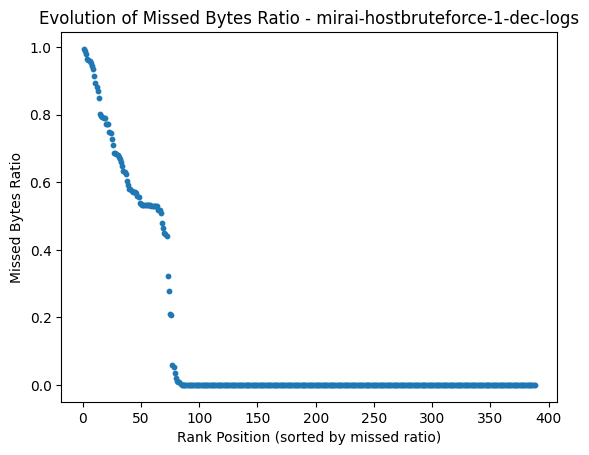

Statistics:
count    388.000000
mean       0.127537
std        0.269762
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.994921
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
63    CosZ0C2ZCfclRkJYH      0.994921  192.168.0.24      60138   
358  CzvsGe4NVhnokbnGCl      0.987590  192.168.0.24      59183   
372  Cqw9F33IrGiL1b3005      0.978877  192.168.0.24      60039   
301  C8MMXR13dRmXA8EPW8      0.964439  192.168.0.23      44024   
302  Cyxwxb2JnVQSdzS7Ze      0.961093  192.168.0.23      44022   
300  C5VfAP1JMiyKigelmh      0.960618  192.168.0.23      44028   
299  CbrGcv2G5r8fGjBVae      0.953239  192.168.0.23      44026   
383   Czb9zg1UVbwbVNiMF      0.943508  192.168.0.24      52454   
74   C5Nmx61GHSGr9v46mg      0.934769  192.168.0.24      46007   
338  CzVGs73hCWNUNhCKqe      0.913368  192.168.0.23      52962   
337  CqmcDg4q2pjwQQDNsj      0

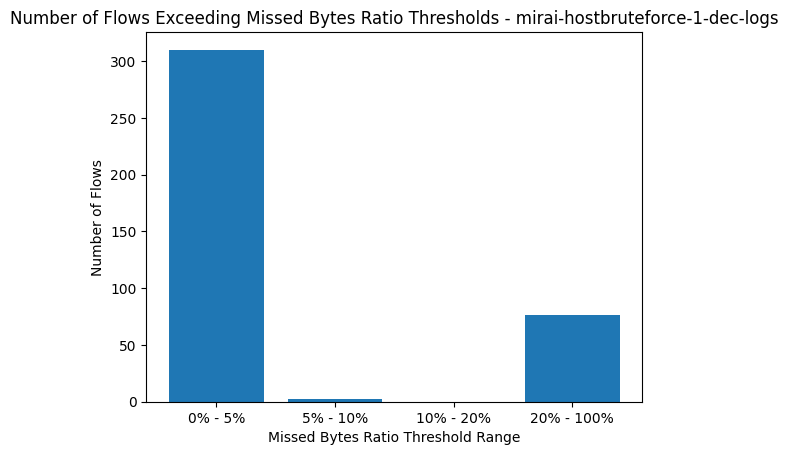

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    CBkdg4xsxNAvK2owj             0         NaN         NaN  192.168.0.16   
7    C1tHx9T2mMN5zgnp2             0         NaN         NaN  192.168.0.16   
8   CQdzrP3DLYQrNr9Rjg             0         NaN         NaN  192.168.0.19   
14  C9tUK13MN2y8kcIU19             0         NaN         NaN  192.168.0.16   
18  CIDQaz4See2PZO50rk             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


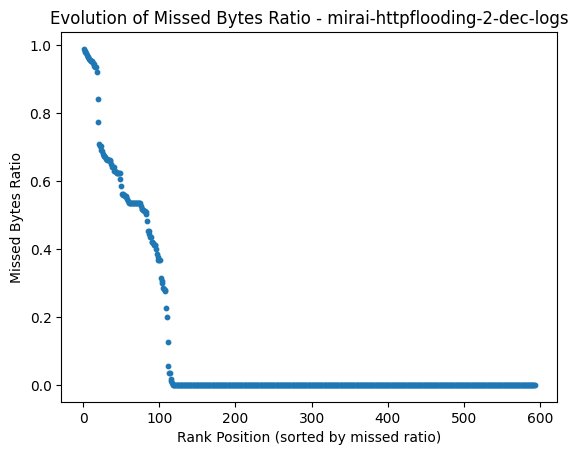

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84    CdIAJ12pRZChpJhHL      0.989859  192.168.0.16      56376   
421  Cp7LIB1F6bMKlzeJUf      0.985129  192.168.0.24      52939   
548  Cmxwca3677ylWxtga3      0.981245  192.168.0.24      51252   
431  Clk8T62F9Ugo6EIChl      0.976523  192.168.0.24      36865   
363   ClkEjzR89pFBdIcm8      0.972353  192.168.0.24      53894   
208  CFRe232M11HRT39mtg      0.966788  192.168.0.24      48383   
194   CNLcDb07sgmLTBrij      0.965684  192.168.0.16      56386   
377  CqWugx4nVUEqytmT48      0.959631  192.168.0.16      56419   
316  CNOpoD2ZsJ1c53SMej      0.958046  192.168.0.16      56414   
247  Cq32963zTrBfK0F4d6      0.954322  192.168.0.24      44546   
486  CVf8ck1MV2TlzXXtH6      0

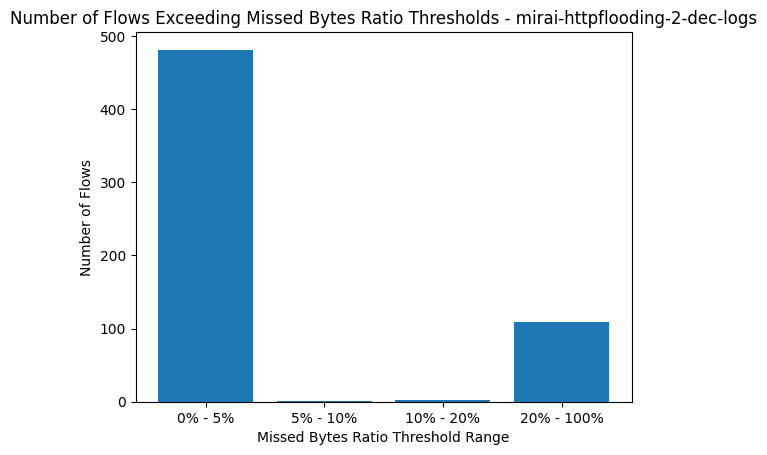

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   CVGKlt1XuZo15iP5ae             0         NaN         NaN  192.168.0.19   
1   CZPAIy1YFcDxcCaFmf             0         NaN         NaN  192.168.0.19   
3   ChLoAx3Z4SzsMSgrN7             0         NaN         NaN  192.168.0.19   
6    CDcehE2KtckWHLRaB             0         NaN         NaN  192.168.0.19   
11  CklwRh2sH2QOsHAb88             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


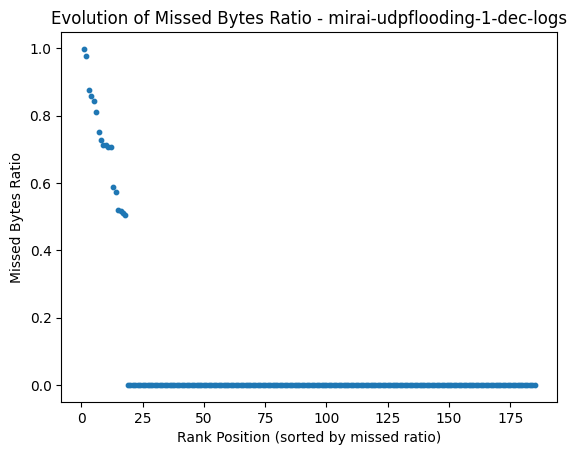

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39   C6kcee1Y7tC1bWsdj3      0.998111  192.168.0.24      43278   
4    CdyyoZ3chbYmbDqDVl      0.977721  192.168.0.24      40541   
116   CtfjFtAu3Hm0kUwFe      0.877538  192.168.0.16      56344   
75   C0Wisi4ezJcJgaLBha      0.858365  192.168.0.16      56340   
103  CHWhPa4Z9YStUSgKs3      0.843209  192.168.0.16      56343   
148   CNGWwqRidI9Ud6xQ7      0.811155  192.168.0.16      56345   
105  Cpwz9k4gQnTRrgPsXg      0.750518  192.168.0.16      56342   
73   CT5aTP31ffPRj6ZYIa      0.728187  192.168.0.16      56338   
65    CWkyrDys3ytseg8L1      0.711898  192.168.0.16      52046   
63    CtAg4f64TC5dtKj4i      0.711898  192.168.0.16      52045   
100  CCmMgt3FgdMg9xcQi2      0

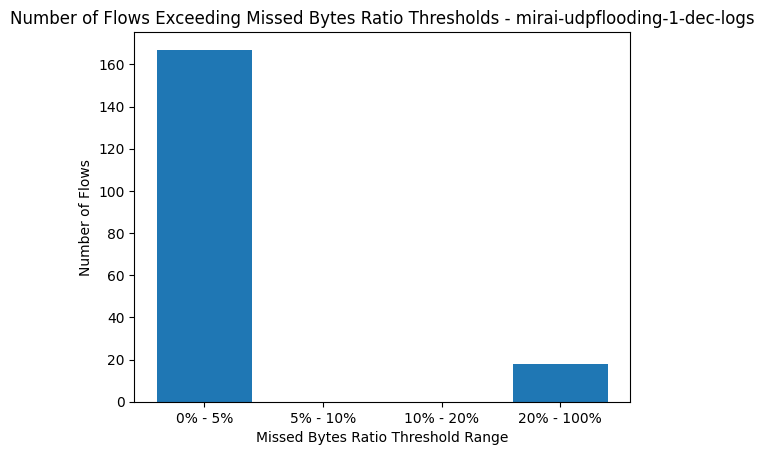

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
11   Cbi2R93vuBtGqauEa7             0         NaN         NaN  192.168.0.51   
18    C3iv5eScEz7Cjsxe4             0         NaN         NaN  192.168.0.51   
51   C9TUBG4xv4otqnNDV2             0         NaN         NaN  192.168.0.24   
103  Cn6fnE1hgMW7IWUpEe             0         NaN         NaN  192.168.0.14   
125  C1Meyb4XkJ0OSybdSh             0         NaN         NaN  192.168.0.23   

     id.orig_p       id.resp_h  id.resp_p proto  
11       54547     163.152.1.1         53   udp  
18       58834    163.152.11.6         53   udp  
51       38542  223.39.118.149        443   tcp  
103      63429     163.152.1.1         53   udp  
125       1186     163.152.1.1         53   udp  
77 rows with NaN values in both orig_bytes and resp_bytes columns.


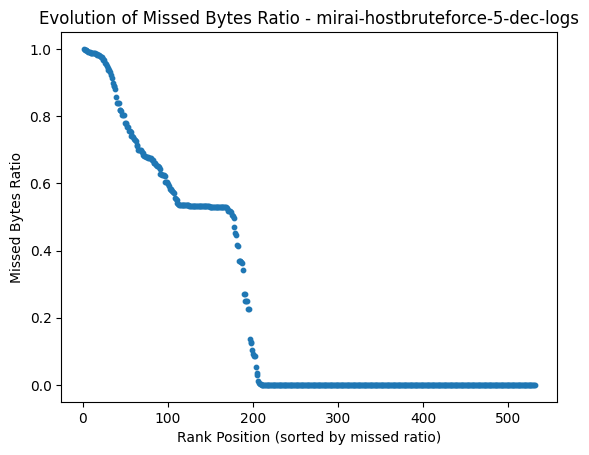

Statistics:
count    531.000000
mean       0.242528
std        0.336117
min        0.000000
25%        0.000000
50%        0.000000
75%        0.532005
max        0.999998
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
406  C8XEgF4gBe5UdyoVil      0.999998  192.168.0.24      58451   
20   CVo8vb11gIn8Wupsyj      0.997993  192.168.0.23      42846   
362  C5OcYi2HbIkbOIXA29      0.995547  192.168.0.24      42540   
26   CR1Vda450QTQO80ZA4      0.995308  192.168.0.24      40277   
300  C3lSIZ1M8INwKa87Ck      0.993720  192.168.0.24      53847   
519  C7at0g3973spb4jUA5      0.991130  192.168.0.23      42852   
17   CmPauY2yFZrAaQ4ark      0.989529  192.168.0.24      38133   
336   CbaJLArdxo0ebKpyl      0.989350  192.168.0.24      40251   
399  CPaAzB4ZBUqLu4Jm71      0.988176  192.168.0.24      38112   
112  C7byd52MunLxwY6B4j      0.987007  192.168.0.23      42856   
142  CT5Mng4R7fCW9Fz9b1      0

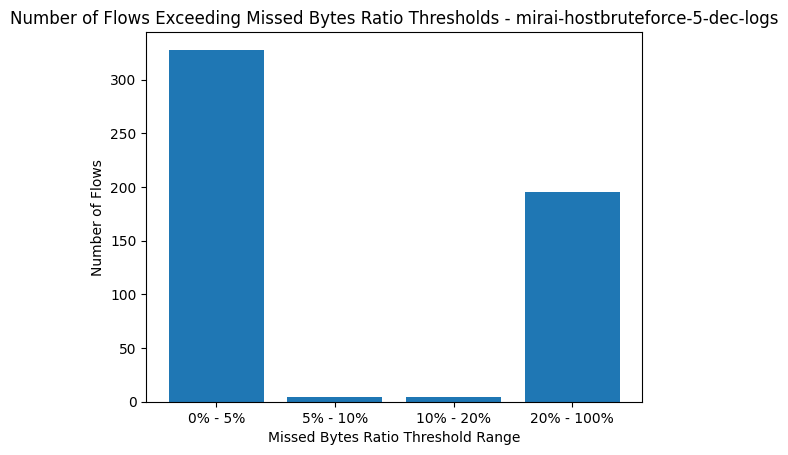

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    CXqsv3n92gfl3BHmg             0         NaN         NaN  192.168.0.16   
7   CkgX6N2BhpXTdNUK7h             0         NaN         NaN  192.168.0.16   
8   CvVpDL3Any4lFbrFuk             0         NaN         NaN  192.168.0.19   
14  Ck2RnA3cwD1WYSHky8             0         NaN         NaN  192.168.0.16   
18  CPkwK43UbpyX4ZZdBh             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
14      61745     163.152.1.1         53   udp  
18       4708    34.206.211.8        443   tcp  
161 rows with NaN values in both orig_bytes and resp_bytes columns.


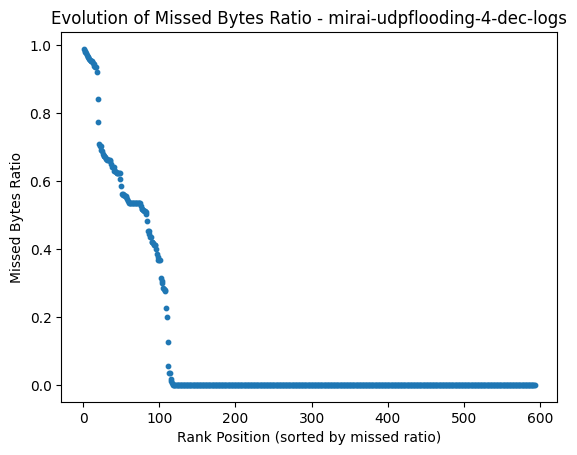

Statistics:
count    593.000000
mean       0.111976
std        0.248590
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.989859
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
84   Chl1kd4fVqvrWMWAy4      0.989859  192.168.0.16      56376   
421  CKz9a437kg5E5fjOrd      0.985129  192.168.0.24      52939   
547  CuNiLc2BLDNShgjjw5      0.981245  192.168.0.24      51252   
431  CjlnTZ13nEOYV7rnQa      0.976523  192.168.0.24      36865   
363  C1ad712BSL91km9Q0a      0.972353  192.168.0.24      53894   
207  CUrMaB1p4Aliyp1ZMc      0.966788  192.168.0.24      48383   
194   COwZTAmBSWmwy5oQh      0.965684  192.168.0.16      56386   
377  CUWAAl4GS0OEAhTETb      0.959631  192.168.0.16      56419   
316   CkrvyX2TSkrI7deIj      0.958046  192.168.0.16      56414   
247  CTWBQz2X6rbXrAGhpa      0.954322  192.168.0.24      44546   
485   COfmNpZRIey8aARX2      0

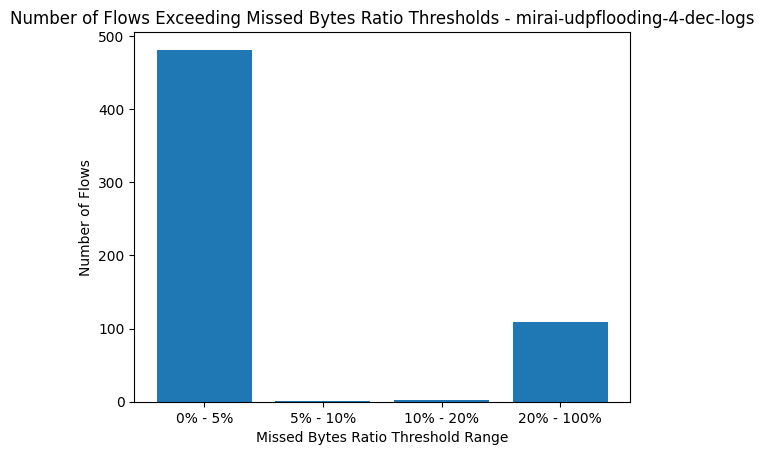

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0    ChtLXcFtX2eZIqlqa             0         NaN         NaN  192.168.0.19   
1   CQg4ls2bdertzlGc2e             0         NaN         NaN  192.168.0.19   
3    CWHeNWg34FnWYZHo6             0         NaN         NaN  192.168.0.19   
6    Cr1pGijHbePCOmMx6             0         NaN         NaN  192.168.0.19   
11  CRmINt1fMHuGDkPBBe             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
74 rows with NaN values in both orig_bytes and resp_bytes columns.


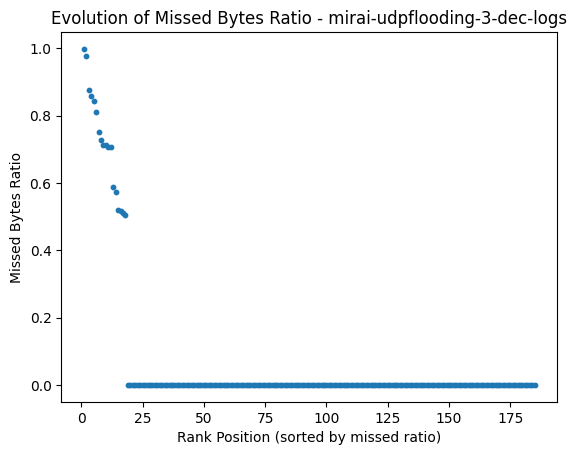

Statistics:
count    185.000000
mean       0.069715
std        0.218243
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
39   CkM3zq3G6r0V1j53n8      0.998111  192.168.0.24      43278   
4    Cwo5Bt2Ok6X8G6kBNb      0.977721  192.168.0.24      40541   
116  CctFvb4Fer8BMS2aka      0.877538  192.168.0.16      56344   
75    CC2YdmtpNhbUbsW0l      0.858365  192.168.0.16      56340   
103  CnzP9U223tMmDB6HIa      0.843209  192.168.0.16      56343   
135  Cwk82n2cT7MuVCh06k      0.811155  192.168.0.16      56345   
105  CkZgF22n1hAL4Em19c      0.750518  192.168.0.16      56342   
73   CFihnF1wGmFWolIwMh      0.728187  192.168.0.16      56338   
63   CO24aQ3AiNPT0A6CSd      0.711898  192.168.0.16      52045   
65   Cw7HY24ksGxpgUeGse      0.711898  192.168.0.16      52046   
100  Cr7bUP2p2Lf6BEKd1f      0

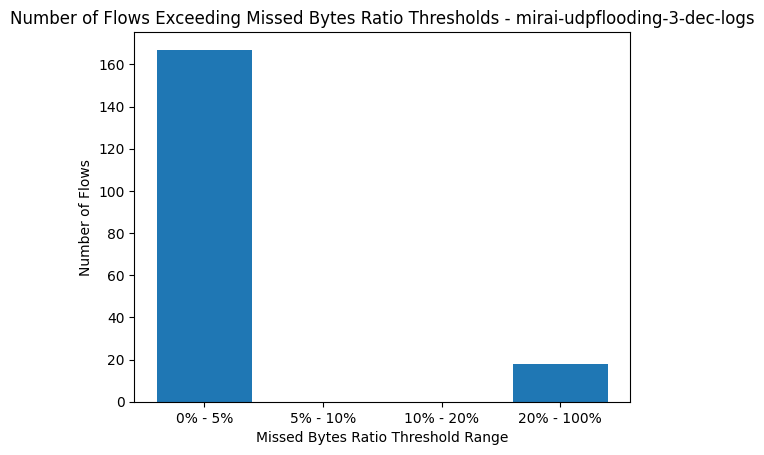

In [41]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

In [33]:
# Lists to store statistics for all files
all_folder_names = []
all_total_missed_bytes = []
all_mean_missed_bytes = []
all_std_dev_missed_bytes = []

In [35]:
# Function to process a conn.log file
def process_conn_log(folder_path):
    conn_log_path = os.path.join(folder_path, "conn.log")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        df = pd.read_json(conn_log_path, lines=True)        
        # Sum up missed_bytes for each fil
        
         # Calculate total missed bytes, mean, and standard deviation
        total_missed_bytes = df["missed_bytes"].sum()
        mean_missed_bytes = df["missed_bytes"].mean()
        std_dev_missed_bytes = df["missed_bytes"].std()
        
        # Append to the lists
        all_total_missed_bytes.append(total_missed_bytes)
        all_mean_missed_bytes.append(mean_missed_bytes)
        all_std_dev_missed_bytes.append(std_dev_missed_bytes)
        all_folder_names.append(folder_name)
         # Print statistics
        print(f"Total missed bytes for {folder_name}: {total_missed_bytes}")
        print(f"Mean missed bytes for {folder_name}: {mean_missed_bytes}")
        print(f"Standard deviation of missed bytes for {folder_name}: {std_dev_missed_bytes}")
        print("----------------------------------------------------")
        
    else:
        print(f"conn.log not found in {folder_path}")


Total missed bytes for mirai-httpflooding-4-dec-logs: 7697286
Mean missed bytes for mirai-httpflooding-4-dec-logs: 12980.246205733558
Standard deviation of missed bytes for mirai-httpflooding-4-dec-logs: 173107.82370628946
----------------------------------------------------
Total missed bytes for mirai-ackflooding-1-dec-logs: 1925973542
Mean missed bytes for mirai-ackflooding-1-dec-logs: 10410667.794594595
Standard deviation of missed bytes for mirai-ackflooding-1-dec-logs: 141580557.35581803
----------------------------------------------------
Total missed bytes for mirai-ackflooding-3-dec-logs: 1925973542
Mean missed bytes for mirai-ackflooding-3-dec-logs: 10410667.794594595
Standard deviation of missed bytes for mirai-ackflooding-3-dec-logs: 141580557.35581803
----------------------------------------------------
Total missed bytes for mirai-ackflooding-4-dec-logs: 7697286
Mean missed bytes for mirai-ackflooding-4-dec-logs: 12980.246205733558
Standard deviation of missed bytes for m

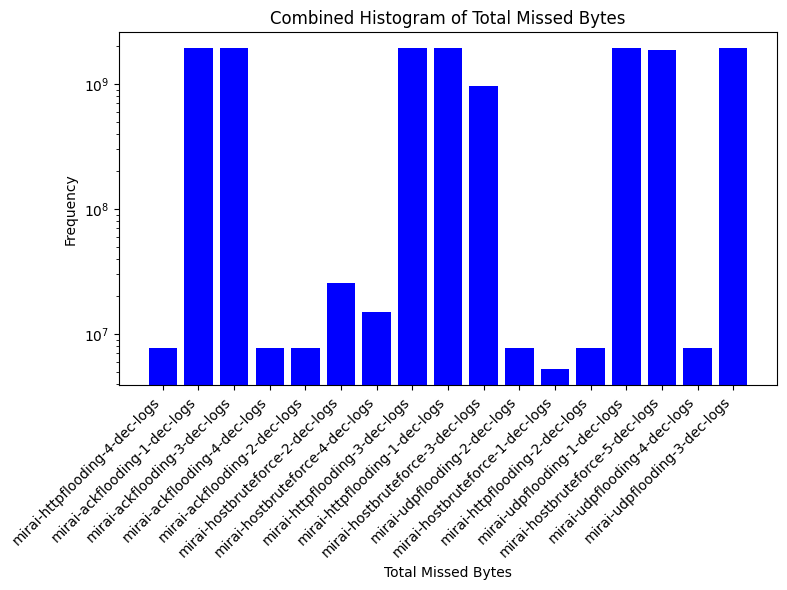

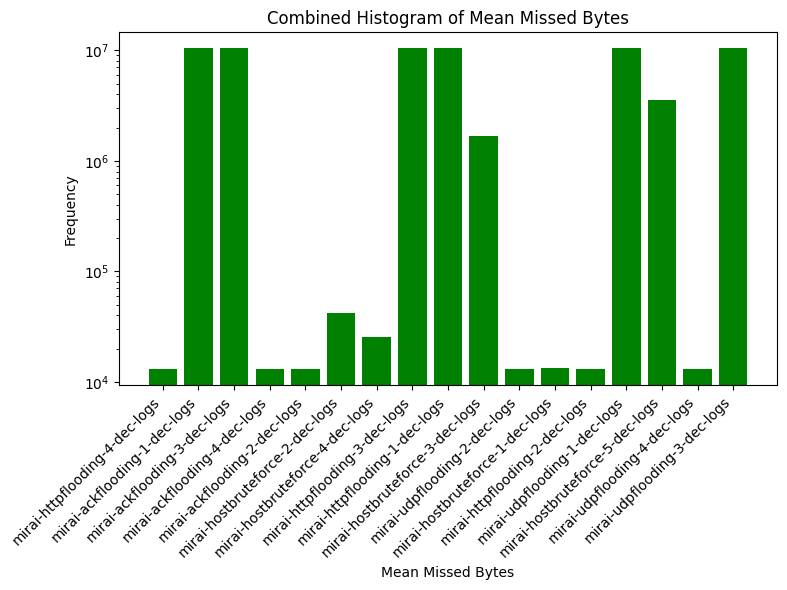

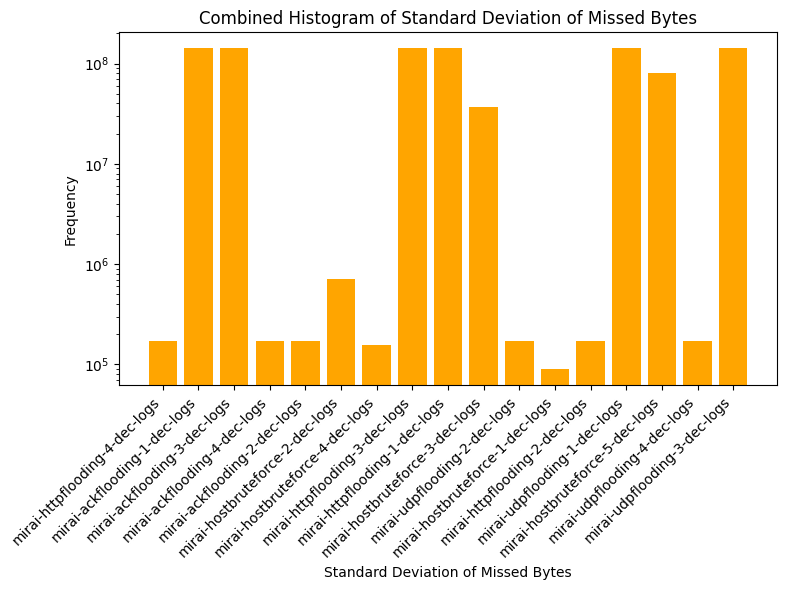

In [39]:
# Main directory containing folders
main_directory = "/root/bbdd/logs-zeek/iotd20-logs/logs-original/"

# Iterate over each folder in the main directory
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

# Create combined histogram for total missed bytes
plt.figure(figsize=(8, 6))
plt.bar(all_folder_names, all_total_missed_bytes, color='blue')
#plt.hist(all_total_missed_bytes, bins=20, color='blue', alpha=0.7)
plt.xlabel("Total Missed Bytes")
plt.ylabel("Frequency")
plt.title("Combined Histogram of Total Missed Bytes")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.yscale('log')
plt.show()

# Create separate histograms for mean missed bytes
plt.figure(figsize=(8, 6))
plt.bar(all_folder_names, all_mean_missed_bytes, color='green')
#plt.hist(all_mean_missed_bytes, bins=20, color='green', alpha=0.7)
plt.xlabel("Mean Missed Bytes")
plt.ylabel("Frequency")
plt.title("Combined Histogram of Mean Missed Bytes")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.yscale('log')
plt.show()
# Create separate histograms for standard deviation of missed bytes
plt.figure(figsize=(8, 6))
plt.bar(all_folder_names, all_std_dev_missed_bytes, color='orange')
#plt.hist(all_std_dev_missed_bytes, bins=20, color='orange', alpha=0.7)
plt.xlabel("Standard Deviation of Missed Bytes")
plt.ylabel("Frequency")
plt.title("Combined Histogram of Standard Deviation of Missed Bytes")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.yscale('log')
plt.show()

# Ya etiquetados

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

In [1]:
main_directory = "/root/bbdd/logs-zeek/iotd20-logs/logs-original/"

In [7]:
def process_conn_log(folder_path, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)]):
    conn_log_path = os.path.join(folder_path, "conn_stadistics_labeled.csv")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        #df = pd.read_json(conn_log_path, lines=True)
        df = pd.read_csv(conn_log_path)

        # Sample 5 flows with NaN values in either orig_bytes or resp_bytes before dropping
        nan_flows = df[df['orig_bytes'].isnull() | df['resp_bytes'].isnull()].head(5)
        if not nan_flows.empty:
            print("Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:")
            print(nan_flows[["uid","missed_bytes","orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Notify and count rows with NaN values in both orig_bytes and resp_bytes columns
        nan_count = df[df['orig_bytes'].isnull() & df['resp_bytes'].isnull()].shape[0]
        if nan_count > 0:
            print(f"{nan_count} rows with NaN values in both orig_bytes and resp_bytes columns.")
        
        # Calculate missed_bytes ratio
        df['missed_ratio'] = np.where(df['missed_bytes'] == 0, 0, df['missed_bytes'] / (df['orig_bytes'] + df['resp_bytes']))        
        
        # Sort DataFrame by missed_ratio in descending order
        df_sorted = df.sort_values(by='missed_ratio', ascending=False)
        
        # Create a dot plot of missed_bytes ratio evolution
        plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o',c=df['binary-label'].apply(lambda x: 'red' if x == 1 else 'green'))
        plt.xlabel("Rank Position (sorted by missed ratio)")
        plt.ylabel("Missed Bytes Ratio")
        plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df_sorted["missed_ratio"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df_sorted.head(15)
        print("\nTop 15 highest missed_bytes ratios:")
        print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        print("\nLeast 15 flows based on missed bytes ratio:")
        least_15 = df_sorted.tail(15)
        print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Initialize lists to store counts for each threshold range
        threshold_counts = [0] * len(thresholds)
        
        # Count number of flows in each threshold range
        for i, (lower, upper) in enumerate(thresholds):
            if upper is None:
                num_flows = (df_sorted['missed_ratio'] >= lower).sum()
            else:
                num_flows = ((df_sorted['missed_ratio'] >= lower) & (df_sorted['missed_ratio'] <= upper)).sum()
            threshold_counts[i] = num_flows
        
        # Create grouped bar plot for the number of flows exceeding each threshold range
        threshold_ranges = [f"{int(lower * 100)}% - {int(upper * 100)}%" if upper is not None else f"> {int(lower * 100)}%" for lower, upper in thresholds]
        plt.bar(threshold_ranges, threshold_counts)
        plt.xlabel("Missed Bytes Ratio Threshold Range")
        plt.ylabel("Number of Flows")
        plt.title(f"Number of Flows Exceeding Missed Bytes Ratio Thresholds - {folder_name}")
        plt.show()

    else:
        print(f"conn.log not found in {folder_path}")

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    CaG3BLvUCphlhwGx7             0         NaN         NaN  192.168.0.16   
7   CbqQr63YIkZfVrC4l3             0         NaN         NaN  192.168.0.16   
8    CcyePszMif0iQWmXh             0         NaN         NaN  192.168.0.19   
18   CyXVV1KI3al7zHksh             0         NaN         NaN  192.168.0.19   
21  Cf3dXp2UecDNa7G1qh             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
743 rows with NaN values in both orig_bytes and resp_bytes columns.


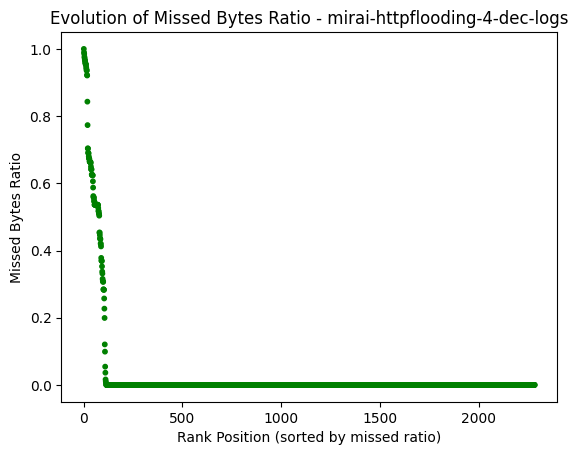

Statistics:
count    2282.000000
mean        0.027875
std         0.133203
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
2164  CqkeT13bI2bv8rbbo5      0.999973  192.168.0.24      51252   
85    CL1yIz39ZcyHX09NP5      0.989859  192.168.0.16      56376   
1910   CKAGBvybQkGdPDk69      0.985129  192.168.0.24      52939   
1923  CT01tF4cvoHt6T5aH8      0.976523  192.168.0.24      36865   
1474  C4SfQE2O08SzPqky5h      0.972353  192.168.0.24      53894   
215   CXk3Bb1GYLV9h1SQq6      0.966788  192.168.0.24      48383   
199   CGJ0gi3ZKBe3brULsg      0.965684  192.168.0.16      56386   
1865  C4yESd3JPNryUO2ulf      0.959631  192.168.0.16      56419   
327   CjLkJB3iZ10Z6SBVg7      0.958046  192.168.0.16      56414   
259   CYgDxC2wA5FkQ1fTH4      0.954322  192.168.0.24      44546   
2136  CgZTQ

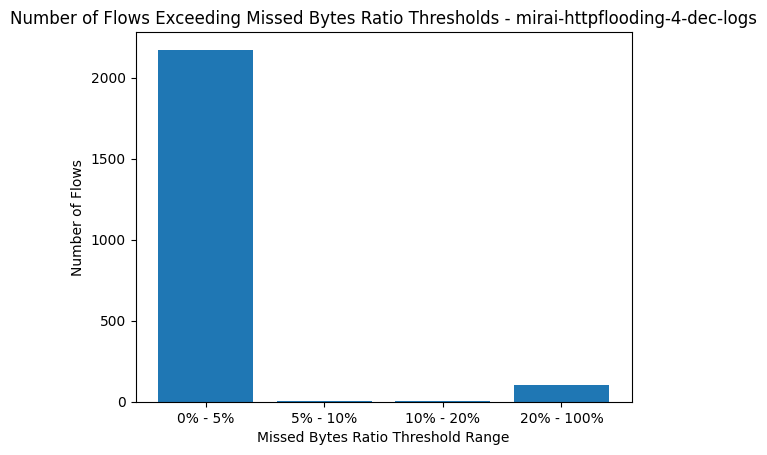

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   C4Grjt1XVmD4ZFWwO7             0         NaN         NaN  192.168.0.19   
1   CeobuM3RiKs7nnx5J1             0         NaN         NaN  192.168.0.19   
3    CWunIB1WfSvnGh9HG             0         NaN         NaN  192.168.0.19   
6   CPXBoT3EG5La6gwuDb             0         NaN         NaN  192.168.0.19   
11   Ctizabqn57ml0TAJh             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
875 rows with NaN values in both orig_bytes and resp_bytes columns.


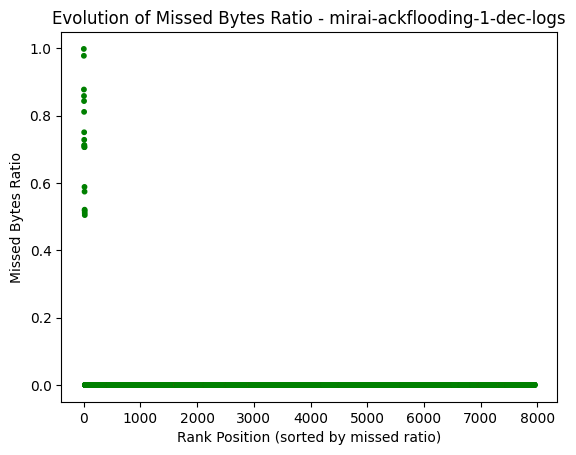

Statistics:
count    7955.000000
mean        0.001621
std         0.034817
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
40   CITIeh1a8IqNaz1HJk      0.998111  192.168.0.24      43278   
4    C5dlDX2UyxuvLS0ql1      0.977721  192.168.0.24      40541   
118  C0lM9c4My6qVxbqVA1      0.877538  192.168.0.16      56344   
77    CWIVqXNUb2ySYPTz4      0.858365  192.168.0.16      56340   
105   CSYUR01DprNqdc3gY      0.843209  192.168.0.16      56343   
136  CCMaTQ2IM04KzwP2Y7      0.811155  192.168.0.16      56345   
107  C3IhYS3pHFZec9Kyth      0.750518  192.168.0.16      56342   
75   CV1N6D37PUoexeg5Xf      0.728187  192.168.0.16      56338   
67    Cl7AliYjvTB5z7Kaj      0.711898  192.168.0.16      52046   
64   CHop9l1EtKJDs5hUn5      0.711898  192.168.0.16      52045   
78   CIc5zB1oJTf95PvKn

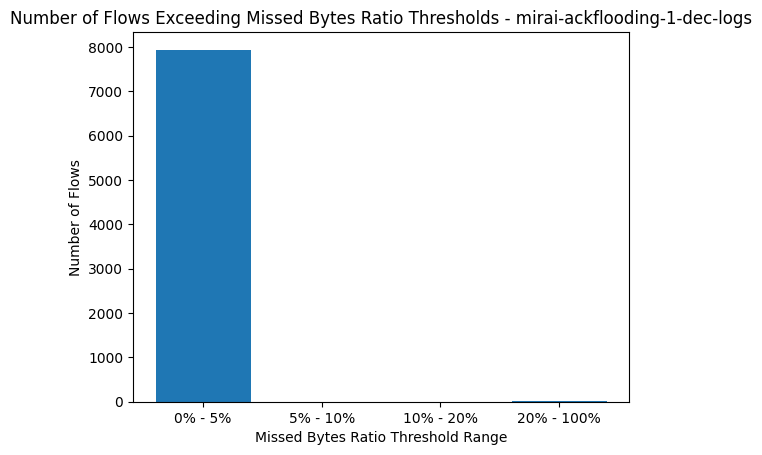

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   ChLMid2Mrw65adAK7i             0         NaN         NaN  192.168.0.19   
1   CxafT732Ke9ZfdkdZ8             0         NaN         NaN  192.168.0.19   
3   CfE9633JeF5I7pLmI9             0         NaN         NaN  192.168.0.19   
6   CwEmJ22d0etlAntn2k             0         NaN         NaN  192.168.0.19   
11   CSCmS12XVrgvUMjT8             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
875 rows with NaN values in both orig_bytes and resp_bytes columns.


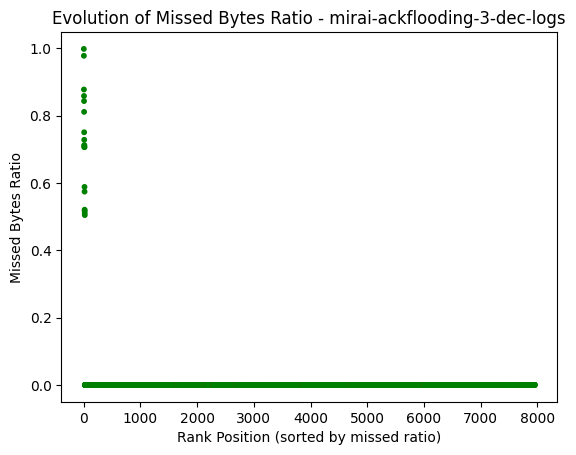

Statistics:
count    7955.000000
mean        0.001621
std         0.034817
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
40   CrKqbd1hYeCnlC61tj      0.998111  192.168.0.24      43278   
4    CY4BTM3omlk8A4nPHd      0.977721  192.168.0.24      40541   
118  CAu06B1LviYRqHbLM2      0.877538  192.168.0.16      56344   
76   CI380g1fZ4xPjEFOE7      0.858365  192.168.0.16      56340   
105  CiWIeD1hEeHaWZvJZi      0.843209  192.168.0.16      56343   
139  Cbyuvs2Eu4g5QjZwml      0.811155  192.168.0.16      56345   
107  CnSpWz4c2ViMuKeICf      0.750518  192.168.0.16      56342   
74   CeFjkk3Jla4DmimRqb      0.728187  192.168.0.16      56338   
66   CKemgs1R7Bh6XC4Kik      0.711898  192.168.0.16      52046   
64    CWc9jWgJDuIgRY1yb      0.711898  192.168.0.16      52045   
77    CEajtKdnqsiXRrKu

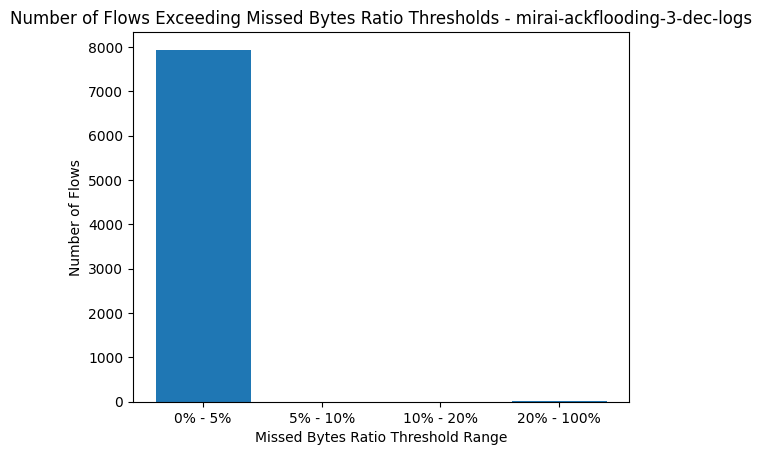

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6   C3rDld10ntKjpNJVK3             0         NaN         NaN  192.168.0.16   
7   CSzc6A1VwFcGbtCQk2             0         NaN         NaN  192.168.0.16   
8   CRQFEY3PhKqtLv0516             0         NaN         NaN  192.168.0.19   
18   CvXlu2ZPy5JRK81Gj             0         NaN         NaN  192.168.0.19   
21   CuZxyKWenmboGN435             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
7377 rows with NaN values in both orig_bytes and resp_bytes columns.


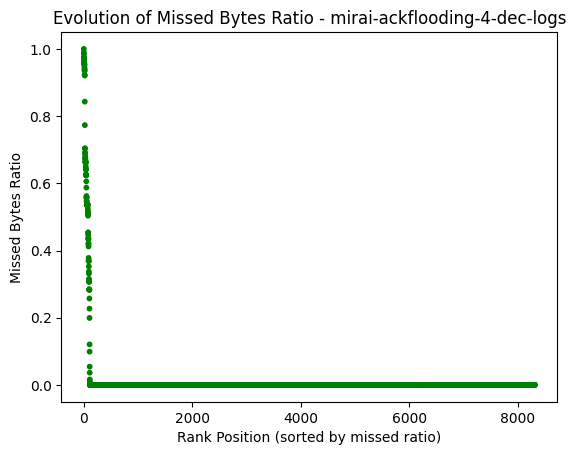

Statistics:
count    8317.000000
mean        0.007648
std         0.070862
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
4126  C76vte1SVX7Wpd0aDa      0.999973  192.168.0.24      51252   
85    CpfQAT3n3rFF6TBhoh      0.989859  192.168.0.16      56376   
438   CTJ9aG2Np05WsybEnf      0.985129  192.168.0.24      52939   
451   CS5Ou93e1Lme1XgHDd      0.976523  192.168.0.24      36865   
378    CFZeskiq5y8vsvC17      0.972353  192.168.0.24      53894   
217    CYowfCetF7w2rC7V9      0.966788  192.168.0.24      48383   
201   CvGJ3X1o4SHu3jrcXj      0.965684  192.168.0.16      56386   
393    CALXVMX0NnRVG4Q79      0.959631  192.168.0.16      56419   
330   Cld5aW2yhg9qM8Y9xi      0.958046  192.168.0.16      56414   
262   CxtM4C11QpMy3KWYRl      0.954322  192.168.0.24      44546   
511   CaciM

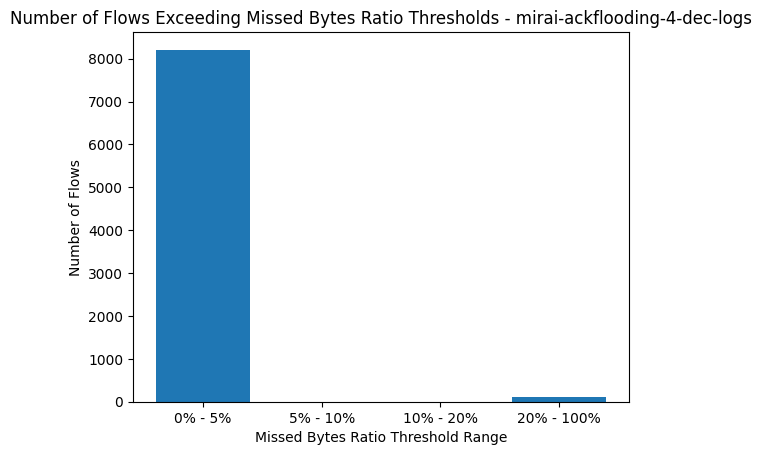

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6   CALXW73jXypI6yMA41             0         NaN         NaN  192.168.0.16   
7    CGh9TnO5GjPoI4y3h             0         NaN         NaN  192.168.0.16   
8   CnPRm83YkOgfu5ifDd             0         NaN         NaN  192.168.0.19   
18  CvSE0s2UebLpSwFwld             0         NaN         NaN  192.168.0.19   
21  CFAOQ225a261ngWGzi             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
7377 rows with NaN values in both orig_bytes and resp_bytes columns.


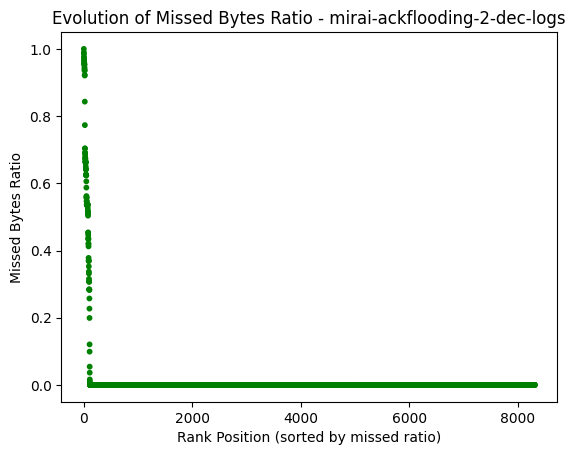

Statistics:
count    8317.000000
mean        0.007648
std         0.070862
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
3334  CvJthz2cHJfACWBJ84      0.999973  192.168.0.24      51252   
85    CasTFY2qBSKnul7kOi      0.989859  192.168.0.16      56376   
438   CObPft2cFrI4spxk6d      0.985129  192.168.0.24      52939   
451   Csj61H3n9kMaBMvB2e      0.976523  192.168.0.24      36865   
378   CI9jq221N37nY4cxt2      0.972353  192.168.0.24      53894   
215    CGOE87yqo8RAiOCE5      0.966788  192.168.0.24      48383   
199   C0QtKC3bWpbhEVlqtj      0.965684  192.168.0.16      56386   
393    CYYcj4EmgtHldvG9a      0.959631  192.168.0.16      56419   
328   CStpA43K5tYHbgI2Rh      0.958046  192.168.0.16      56414   
259   CPXUTb4QFRYdOOZ5V5      0.954322  192.168.0.24      44546   
1360   CcUf

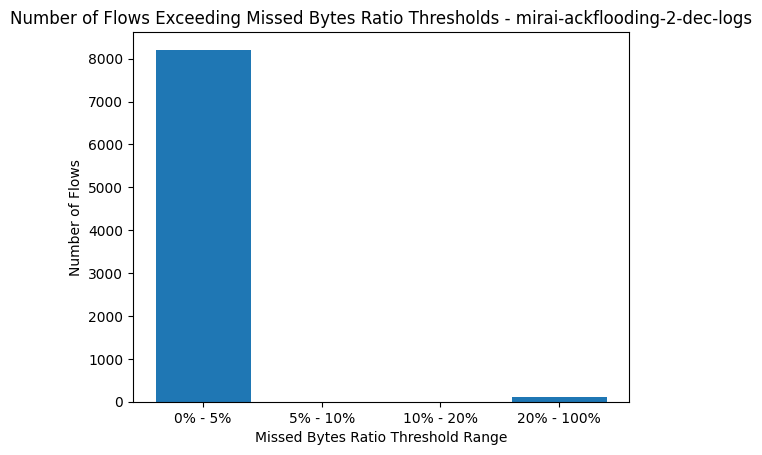

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes      id.orig_h  \
0     C948MOZ8whtVnjfj             0         NaN         NaN   192.168.0.13   
2   C87Iy7126lpWwP4t09             0         NaN         NaN   192.168.0.24   
19  CK4xgg1VzlRKy3BGYd             0         NaN         NaN  234.54.159.46   
21   CYoky89LSCgIgnHLc             0         NaN         NaN   192.168.0.13   
25   Ckt3RM6ZBzGwks431             0         NaN         NaN    64.81.93.51   

    id.orig_p       id.resp_h  id.resp_p proto  
0        9020    192.160.0.16      52919   tcp  
2       43112  223.39.118.149        443   tcp  
19       9020    85.245.35.16      10105   tcp  
21       9020    192.168.0.16      10009   tcp  
25      44117   97.158.50.178      11599   tcp  
168 rows with NaN values in both orig_bytes and resp_bytes columns.


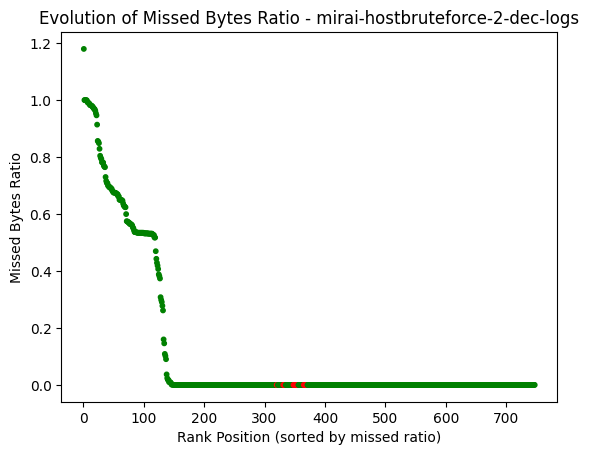

Statistics:
count    747.000000
mean       0.117782
std        0.264217
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.179596
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
255  CR7cGu3y0EL51Z4XPg      1.179596  192.168.0.16      52947   
551  CZv08b3xxVrvujBpZa      0.999995  192.168.0.24      47532   
665  CHMjUg1WhVaCjvlwO7      0.999962  192.168.0.24      44082   
155   CFsGZE8uiuMrxvKJc      0.999876  192.168.0.16      52942   
595  CUkt6g4VUKHR12nt41      0.999771  192.168.0.24      38880   
358  CaI67G16IVhuXvroe9      0.998974  192.168.0.16      52964   
505  CcW5bp1Y7ekx5DWFoe      0.993079  192.168.0.24      54887   
46   CMC6FD1cACNSSXHHKf      0.990538  192.168.0.16      10105   
524  Cfsus04TibAfEffvre      0.989787  192.168.0.24      56286   
55   CRE2vr3VULBsYLsZjf      0.987856  192.168.0.24      45410   
601   CIphbmCG1893mvWua      0

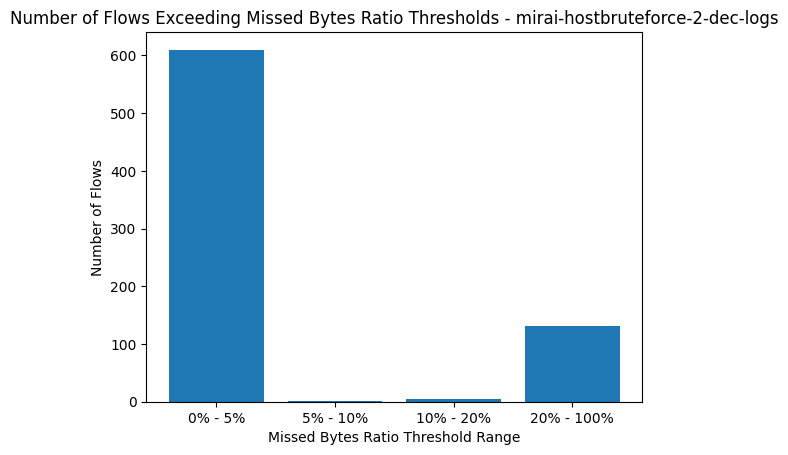

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
16  CY8OKW1Ydw3Ot1P658             0         NaN         NaN    192.168.0.24   
25  CQoSlc4SYq8lhwmueh             0         NaN         NaN    192.168.0.13   
29  CmLBgA3oQOJM53Hiy7             0         NaN         NaN  223.39.123.245   
33   CC2ybJHGWz3ehow63             0         NaN         NaN    97.187.78.93   
50  Ch9eVy1k3ja53QETY9             0         NaN         NaN    192.168.0.24   

    id.orig_p       id.resp_h  id.resp_p proto  
16      33435  223.39.118.176        443   tcp  
25      45769  192.168.96.180      39040   tcp  
29       7000    192.168.0.24      20000   tcp  
33      20391    12.71.104.69      51316   tcp  
50      49635  223.39.123.191        443   tcp  
203 rows with NaN values in both orig_bytes and resp_bytes columns.


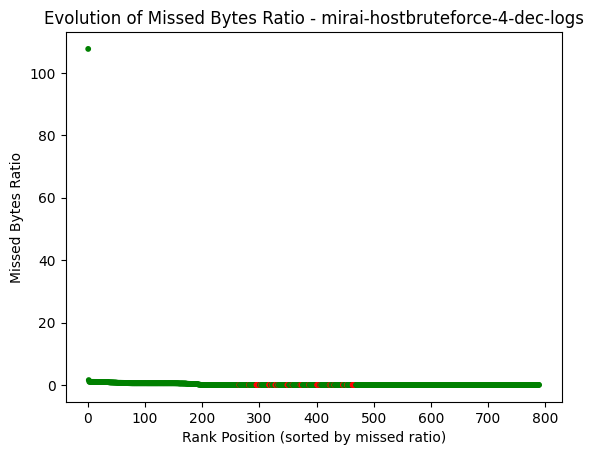

Statistics:
count    789.000000
mean       0.287409
std        3.840041
min        0.000000
25%        0.000000
50%        0.000000
75%        0.030280
max      107.718894
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
455  CwyZ6C3oxB1EGPYODh    107.718894  192.168.0.24      53632   
775  CPTtOt4gGvim6620xa      1.550193  192.168.0.24      34887   
376   CD6SD4UG5ghuGYLZ6      0.999943  192.168.0.24      59329   
51   C6QaPk3xs0l2QPfQUb      0.996974  192.168.0.24      51114   
633  CCXv1v34Pm63vUJSI3      0.988665  192.168.0.24      37297   
408  CU2kvr3WILwNSgTjOa      0.988443  192.168.0.24      38218   
510  CEhp6g2sl9O3h7lk4k      0.987595  192.168.0.24      51111   
88   CI8tam29oM4eQvm87j      0.986387  192.168.0.24      43987   
558  CltrVA3k3iXvbfYpCc      0.985493  192.168.0.23      42834   
471  Cyxi0X2WxPmBCISAr1      0.984857  192.168.0.23      39082   
370  C2NShL1i4Edx8oPr0b      0

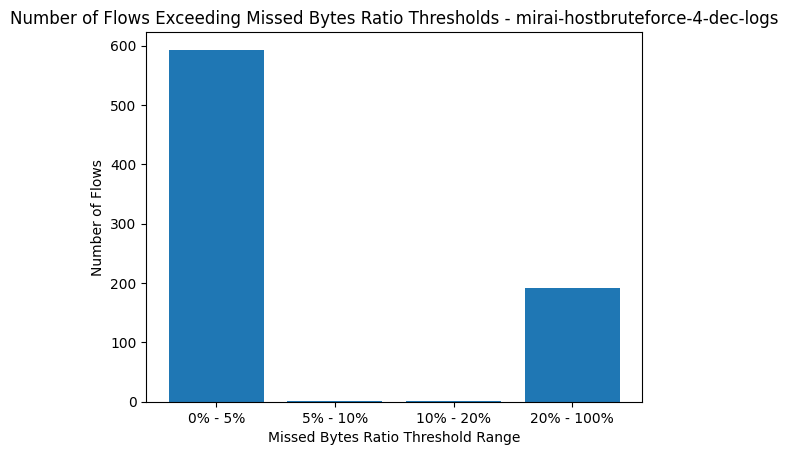

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0    CxALZ7nBZSqVOr3S7             0         NaN         NaN  192.168.0.19   
1   CMjIes14MmoIQj1wW2             0         NaN         NaN  192.168.0.19   
3   CGxhoQ2fdeme33SISh             0         NaN         NaN  192.168.0.19   
6   C2c7RZ2GGNgdBUPlZ8             0         NaN         NaN  192.168.0.19   
11   CYrKG395xCsLN20Jb             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
169 rows with NaN values in both orig_bytes and resp_bytes columns.


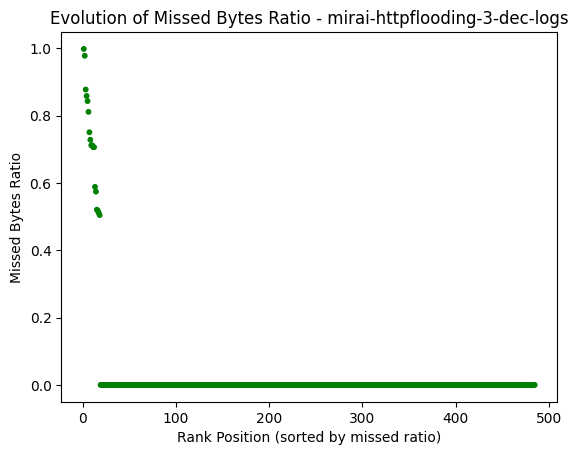

Statistics:
count    485.000000
mean       0.026592
std        0.138767
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
148  Cr602b4TyZ8iUiKlvc      0.998111  192.168.0.24      43278   
4    C5Xf5t432CGiUHMg3k      0.977721  192.168.0.24      40541   
332   CIRBaastO9iEL2dR5      0.877538  192.168.0.16      56344   
291   CTqQaJ1eAJAOfDeAZ      0.858365  192.168.0.16      56340   
319  Cwd7C11LACNW7JCz3h      0.843209  192.168.0.16      56343   
351  CKBLdg1Ps1MU1hne0b      0.811155  192.168.0.16      56345   
321  CzRXD51D4LnOC5wOod      0.750518  192.168.0.16      56342   
289  C3nXdy1ilTrAz3yMb6      0.728187  192.168.0.16      56338   
280  CgvHlF1BEyMdTelVsd      0.711898  192.168.0.16      52046   
277  CEaSwc2jlN5i6DjDP9      0.711898  192.168.0.16      52045   
316   CDYOJt2eQR2O1dBnO      0

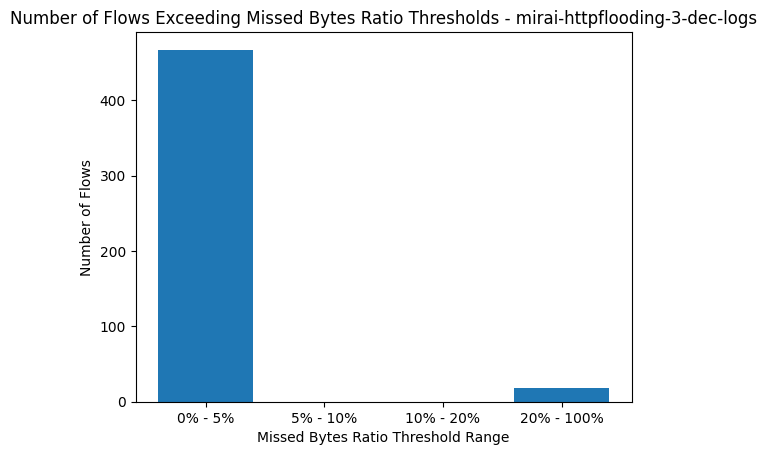

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   C8O7pQ1pxNq3C0btgj             0         NaN         NaN  192.168.0.19   
1   CCjTmA3u0WVPsrua34             0         NaN         NaN  192.168.0.19   
3   Cd3l5030tI2hVmrKpj             0         NaN         NaN  192.168.0.19   
6    CW9xAwHxLFHCXtgmj             0         NaN         NaN  192.168.0.19   
11  CD35Vn2j4ADpdOqDlg             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
169 rows with NaN values in both orig_bytes and resp_bytes columns.


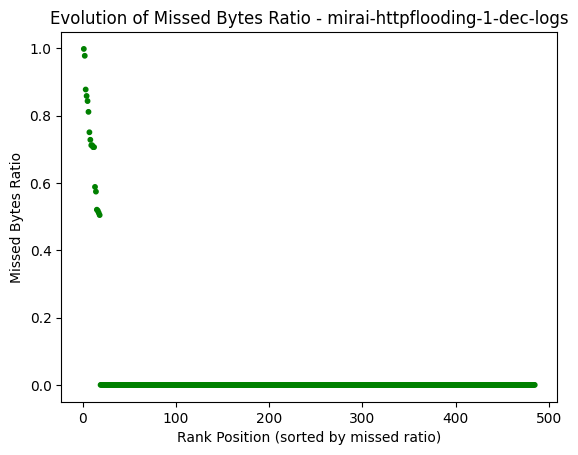

Statistics:
count    485.000000
mean       0.026592
std        0.138767
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
40   Ci3GxQ2eCRR3oy5Je7      0.998111  192.168.0.24      43278   
4    C4R60G2JzjogKJJuNh      0.977721  192.168.0.24      40541   
332  Clgmwr3bUkswjNUG8e      0.877538  192.168.0.16      56344   
275  CZpmvT3NnJmAd0wKsf      0.858365  192.168.0.16      56340   
319  Cwu3le45QVD8L3qRJg      0.843209  192.168.0.16      56343   
373  CJWJYu1iy27tV7x0j3      0.811155  192.168.0.16      56345   
321   CKE2lr4omwINYmvIv      0.750518  192.168.0.16      56342   
273  CivArS28vqVpZKoFx8      0.728187  192.168.0.16      56338   
174  CpuG341cm9bpbLYSCa      0.711898  192.168.0.16      52046   
172   CyAWAULWLlpzix0tl      0.711898  192.168.0.16      52045   
276  CY9Btq1MaF5XMudDMc      0

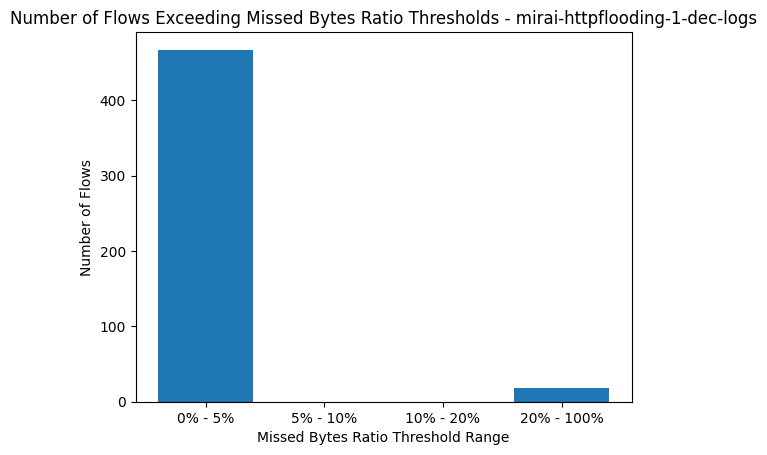

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes        id.orig_h  \
1   CoONM13iIrVOLxPMQ4             0         NaN         NaN     192.168.0.51   
2   CkuFaq3b68cUVg95Zj             0         NaN         NaN     192.168.0.23   
9   CRNjj73b2DaStsb104             0         NaN         NaN  188.172.201.158   
33   CYRavIdAVf9AaKYM8             0         NaN         NaN     192.168.0.51   
48   CB88OwdkPkFCz6YP1             0         NaN         NaN    192.168.0.141   

    id.orig_p        id.resp_h  id.resp_p proto  
1       57662     185.188.32.3         80   tcp  
2       39682   13.209.250.102        443   tcp  
9        5938     192.168.0.51      57667   tcp  
33      58070      163.152.1.1         53   udp  
48      42774  246.218.100.125        152   tcp  
164 rows with NaN values in both orig_bytes and resp_bytes columns.


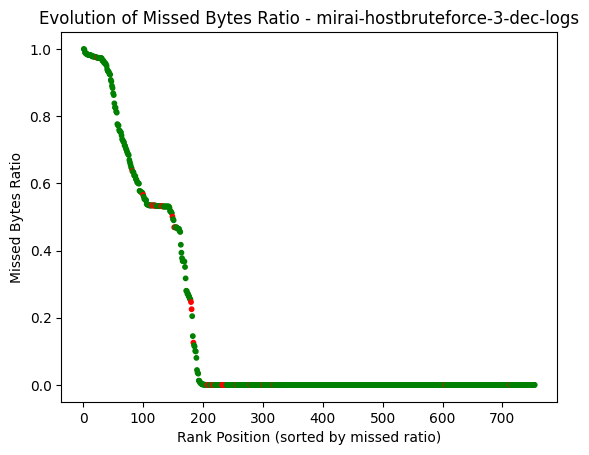

Statistics:
count    754.000000
mean       0.161291
std        0.303301
min        0.000000
25%        0.000000
50%        0.000000
75%        0.071426
max        0.999956
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
671  Cv0zIX3C3YLFeXTLJ1      0.999956  192.168.0.23      47480   
172   CieBcbjIR15S0MbF6      0.997850  192.168.0.24      59978   
34   Ct3bKi3LopmrI5T8g8      0.988732  192.168.0.24      53726   
67   C8yudR2PgEPcqI0eNi      0.988538  192.168.0.24      43322   
373  CZ91nj1XuH4oJ5skY2      0.985369  192.168.0.23      47442   
750  Cj7Y2p10N3uampIHL8      0.984789  192.168.0.24      35533   
578  CzLWHK2hgJLqe0WRal      0.984060  192.168.0.23      47438   
344  CBTwS333kO7i24uKCc      0.982183  192.168.0.16      10111   
89    CgBN5jLarHErFPVL3      0.982072  192.168.0.24      35914   
405  CObRun3sBo1DlzRGob      0.981810  192.168.0.24      59155   
371  C870EX3wXxrcv9XxAl      0

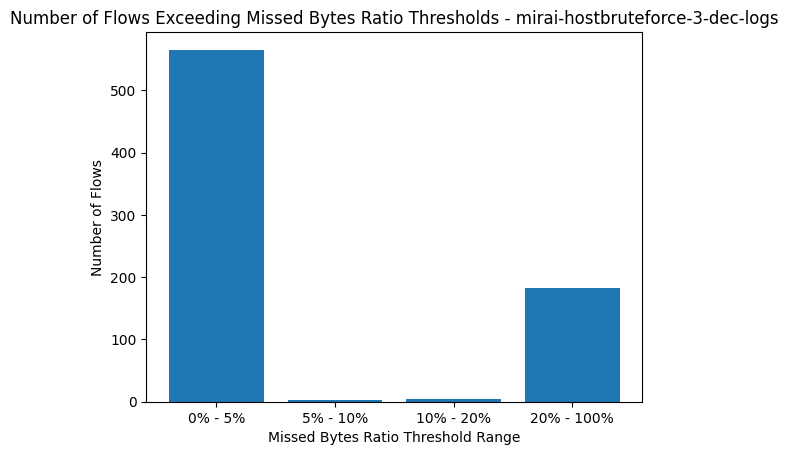

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    C3ShStBES3nt918ze             0         NaN         NaN  192.168.0.16   
7   CGBNLc2BstP74bTYti             0         NaN         NaN  192.168.0.16   
8   CIYb1y3zu6xHkONip9             0         NaN         NaN  192.168.0.19   
18   C4E6GezOpvDUvRmud             0         NaN         NaN  192.168.0.19   
21  C2zNhy4Y3Vw7pv2O9k             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
198 rows with NaN values in both orig_bytes and resp_bytes columns.


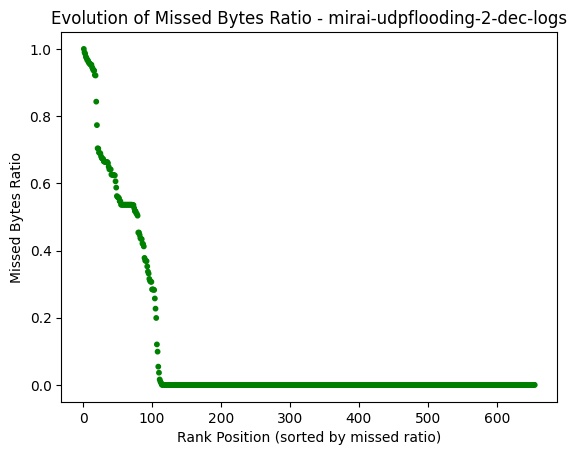

Statistics:
count    655.000000
mean       0.097117
std        0.234837
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
619  CXeMyF4AHXOnHGdh5b      0.999973  192.168.0.24      51252   
85   CSkiqv1Gnreu9MDwwl      0.989859  192.168.0.16      56376   
435   CpBjHTbVc1JGwifu3      0.985129  192.168.0.24      52939   
468  Cr0cUJ1S8iVLUlxRPd      0.976523  192.168.0.24      36865   
375  CT3rgR3BDa0SY8k4y9      0.972353  192.168.0.24      53894   
214  CV0g9X1uESskbXSZC8      0.966788  192.168.0.24      48383   
199  CLACTl4B0UenwyniZe      0.965684  192.168.0.16      56386   
390  Cfkczh1itgcnlYORb8      0.959631  192.168.0.16      56419   
327  C7FegR3CFhsMCiFbIi      0.958046  192.168.0.16      56414   
259  CDiFjs3VpQmvRK2yg7      0.954322  192.168.0.24      44546   
532   Cc7jsSLZYRUSyLJ35      0

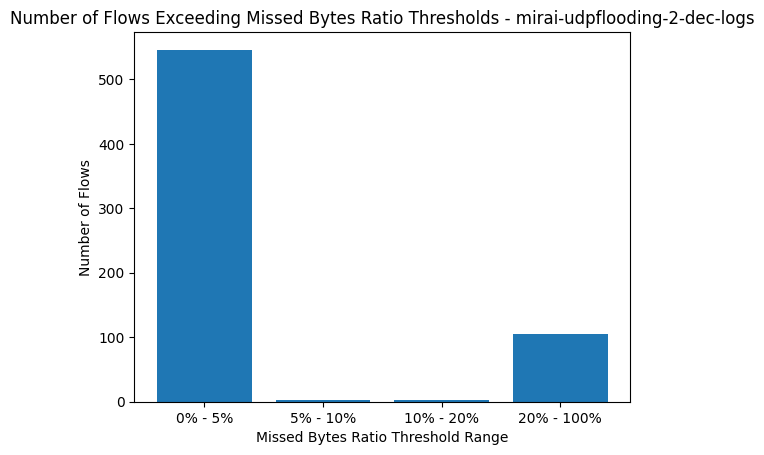

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
1   CtTKZm37yGgVK2Qpa7             0         NaN         NaN  104.74.213.186   
2   CHJkXV2XqBKGkEHHU3             0         NaN         NaN  104.74.213.186   
3   CA1qoJ3AEx3sx2Ftuj             0         NaN         NaN    192.168.0.24   
5   CGtRln1EqwXo9Nt0Db             0         NaN         NaN    129.171.0.24   
11  CR61A91U6PzS5aYCM8             0         NaN         NaN    192.168.0.23   

    id.orig_p       id.resp_h  id.resp_p proto  
1       10138   192.168.96.70      29998   tcp  
2       25013    192.168.0.24       6636   tcp  
3       51875  104.74.213.186        291   tcp  
5       51875   104.74.213.66        443   tcp  
11      60204  209.85.200.188       5228   tcp  
103 rows with NaN values in both orig_bytes and resp_bytes columns.


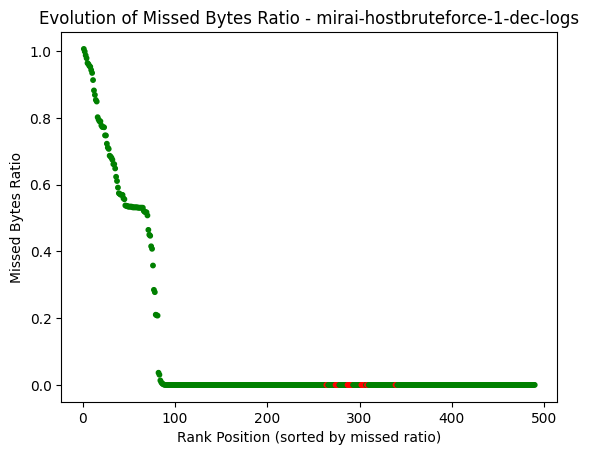

Statistics:
count    490.000000
mean       0.105151
std        0.248755
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.006736
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio        id.orig_h  id.orig_p  \
65   CLYna62e8WRpyMZajk      1.006736     192.168.0.24      60138   
156  CEFQdc1ZbA4oy2Bqvc      0.998809  163.152.127.193      10109   
437  CNkTDC19cNcaRu3Qq4      0.987590     192.168.0.24      59183   
474  CJcVMD112mzL9oV1y7      0.978877     192.168.0.24      60039   
356  CkXvA72fU04GEPcwN9      0.964439     192.168.0.23      44024   
357  CY9UH13FQH9n4wyhN9      0.961093     192.168.0.23      44022   
355  CKvaKj3tF6pqpWVR8i      0.956024     192.168.0.23      44028   
354  Cbu5ER2qoSc1z1wPaa      0.953239     192.168.0.23      44026   
462  ClCGSd2zjLchWKMYei      0.943508     192.168.0.24      52454   
77   Co6kw048qyU21j8Ak6      0.934769     192.168.0.24      46007 

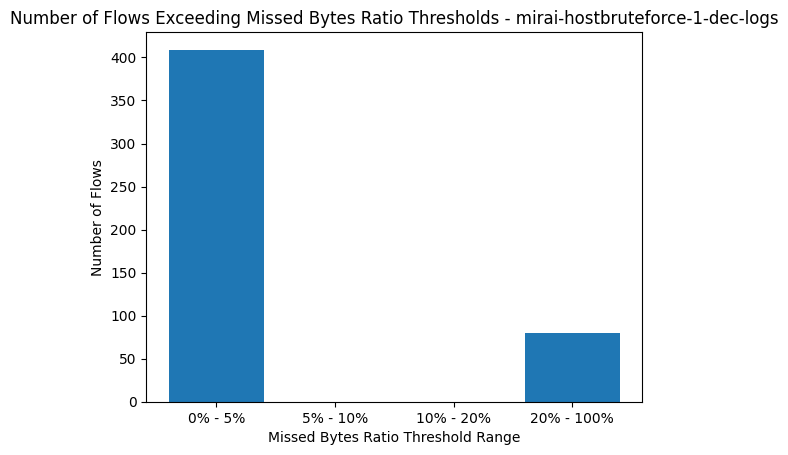

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    Ck3Hoq36fhx63RfWm             0         NaN         NaN  192.168.0.16   
7   CfSBAa3qBFRZSMsJy8             0         NaN         NaN  192.168.0.16   
8   CEBmkz4VhxJkvWkPR5             0         NaN         NaN  192.168.0.19   
18  CG4MlL3iLT4qerqiag             0         NaN         NaN  192.168.0.19   
21   C3s5ngNqC8pL7E9x5             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
743 rows with NaN values in both orig_bytes and resp_bytes columns.


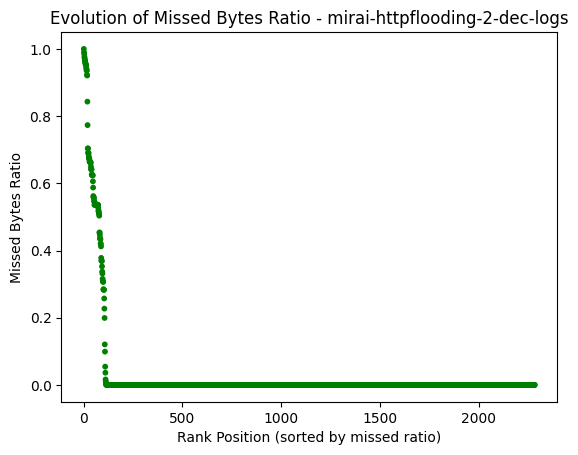

Statistics:
count    2282.000000
mean        0.027875
std         0.133203
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
2203  CF9rdv2l1oBv1Uuckf      0.999973  192.168.0.24      51252   
85    CuoTjX3MV2eapvJFFe      0.989859  192.168.0.16      56376   
1910   CBHmpToTWTkwDg5f7      0.985129  192.168.0.24      52939   
1923  Cb7exz1fofnUcwYGG4      0.976523  192.168.0.24      36865   
1850  CMpVY44UCgr6paCvh8      0.972353  192.168.0.24      53894   
1690   CHdUB82lad0MEndK7      0.966788  192.168.0.24      48383   
1674   CEb7A8Yz0RzJXgew4      0.965684  192.168.0.16      56386   
1865  C1KH2I2mvHecEoZdVa      0.959631  192.168.0.16      56419   
1802  CkLWYl3jPzsMETwXSh      0.958046  192.168.0.16      56414   
1734  CO84RO2d7rV2As3S74      0.954322  192.168.0.24      44546   
2002  CiLdW

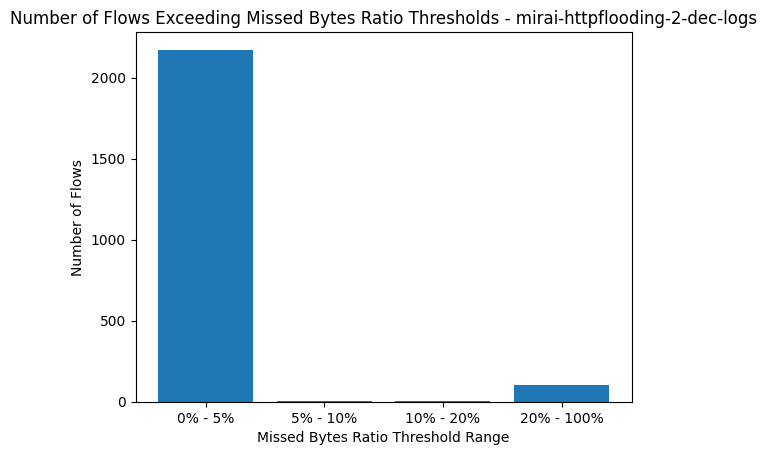

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   C3Vhtk2tCUne0I6fCk             0         NaN         NaN  192.168.0.19   
1   C1kO9643kwbDcM8e1d             0         NaN         NaN  192.168.0.19   
3   Cwli5D2C0QVB53yNa6             0         NaN         NaN  192.168.0.19   
6   CVj2Na4bYFzBCFKBje             0         NaN         NaN  192.168.0.19   
11  CZ0zyh2Oy6nLGLLckl             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
80 rows with NaN values in both orig_bytes and resp_bytes columns.


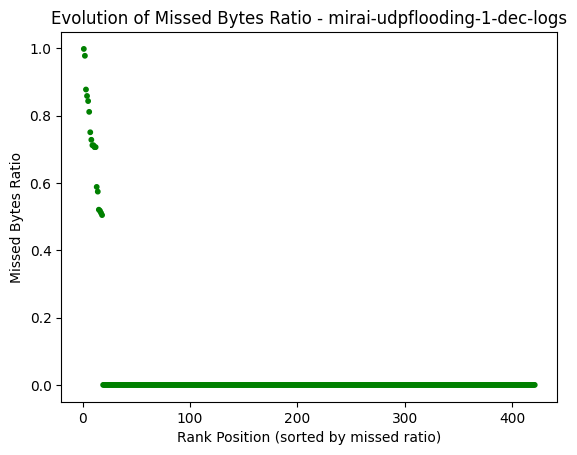

Statistics:
count    421.000000
mean       0.030635
std        0.148548
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
40   CL2izH3yBQF7rbtK2h      0.998111  192.168.0.24      43278   
4     CZC00YK3rlIJHKxO5      0.977721  192.168.0.24      40541   
117  CdhgcD3Ay86rTn06v6      0.877538  192.168.0.16      56344   
76   CW7ql21Y1TvgHYCup6      0.858365  192.168.0.16      56340   
104  CRLmTZ3WV0UiXQSHLa      0.843209  192.168.0.16      56343   
143  CD73kM2XppUXQCZNEg      0.811155  192.168.0.16      56345   
106  CinPKG3JOtApGjES02      0.750518  192.168.0.16      56342   
74   C5TsB532rORDW8WaZ6      0.728187  192.168.0.16      56338   
64    CoX2Y6owHU9T2SEah      0.711898  192.168.0.16      52045   
66   CPRPZr485pYfTtBcS4      0.711898  192.168.0.16      52046   
77   CjlxSe1zCkOSaJDdyf      0

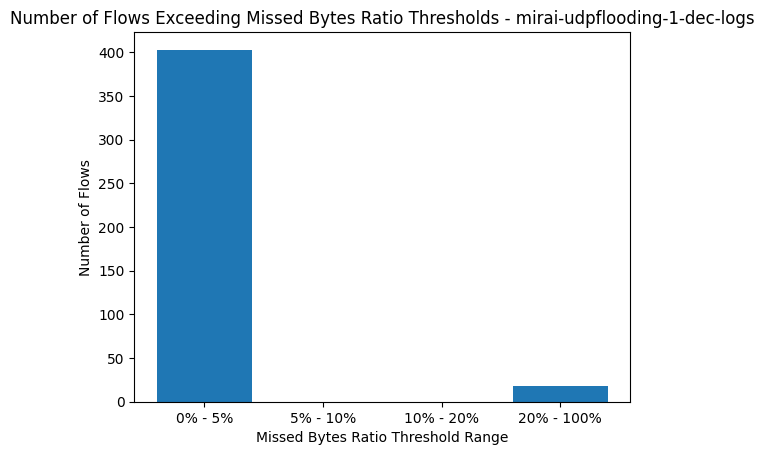

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
11   Cs9lIX3d8drYIivSQ             0         NaN         NaN    192.168.0.51   
18  CCfGgo4YyKWLvnRBHi             0         NaN         NaN    192.168.0.51   
22  CSwFQb1htRt0p17tR6             0         NaN         NaN  227.251.117.72   
52  CmYuox2LSzbvyfRto7             0         NaN         NaN    192.168.0.24   
64  CiZIhB4jrEdS40LY9b             0         NaN         NaN  223.39.123.193   

    id.orig_p        id.resp_h  id.resp_p proto  
11      54547      163.152.1.1         53   udp  
18      58834     163.152.11.6         53   udp  
22      12796  183.233.101.107      13777   tcp  
52      38542   223.39.118.149        443   tcp  
64        773    192.168.0.216       4687   tcp  
114 rows with NaN values in both orig_bytes and resp_bytes columns.


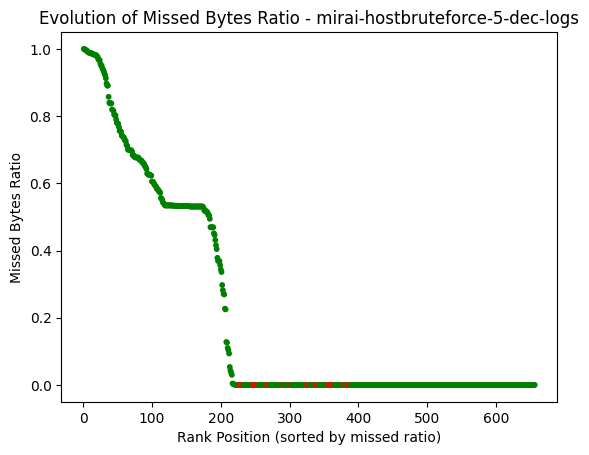

Statistics:
count    656.000000
mean       0.205893
std        0.318854
min        0.000000
25%        0.000000
50%        0.000000
75%        0.530973
max        0.999998
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
491   CPjpqAtnFSlCMIHm9      0.999998  192.168.0.24      58451   
465  C6cPip1S214Obdiay3      0.999217  192.168.0.24      55868   
20    C9kGqNlBvr8MAqExc      0.997993  192.168.0.23      42846   
446  CvSlGG2JEF7mN6HIbg      0.995547  192.168.0.24      42540   
27   C7CpLQ382ETqaHroBe      0.995308  192.168.0.24      40277   
349    CzKVChUJZXRK8PPu      0.993720  192.168.0.24      53847   
580  CFnlcH2zr7EjcJ7jFh      0.991130  192.168.0.23      42852   
418   CjFiGsVtFlWtjaXs2      0.989302  192.168.0.24      40251   
17   C3icVo4LT8BhJliaj8      0.988639  192.168.0.24      38133   
484  CyCVzM24O4YJT0ujPe      0.988176  192.168.0.24      38112   
114  CQLoKX2SxIPl1PSx3d      0

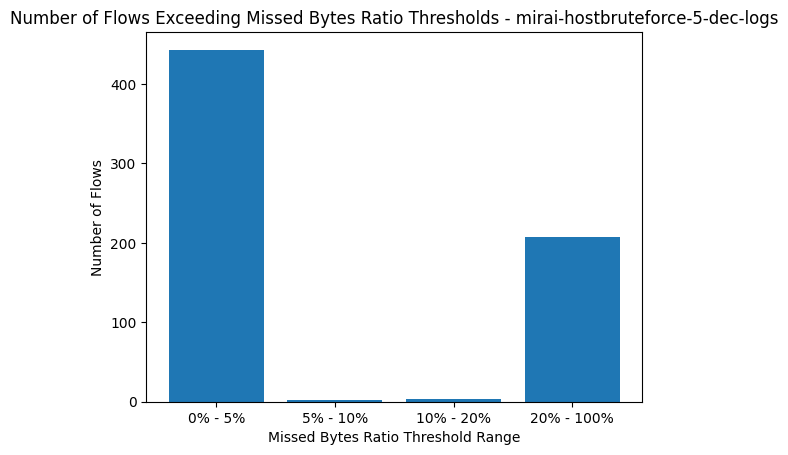

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    C7WwpddMdLUa8nRNh             0         NaN         NaN  192.168.0.16   
7   CYEeY91olrZf7SC596             0         NaN         NaN  192.168.0.16   
8    CCwcJJL51KfylAfnb             0         NaN         NaN  192.168.0.19   
18  CfIhRG1qKkk9u7rdSg             0         NaN         NaN  192.168.0.19   
21  CGbAt04TojRmbQwZfg             0         NaN         NaN  192.168.0.13   

    id.orig_p       id.resp_h  id.resp_p proto  
6       50788     163.152.1.1         53   udp  
7       59310     163.152.1.1         53   udp  
8        5616  217.146.12.133        443   tcp  
18       4708    34.206.211.8        443   tcp  
21      41797     163.152.1.1         53   udp  
198 rows with NaN values in both orig_bytes and resp_bytes columns.


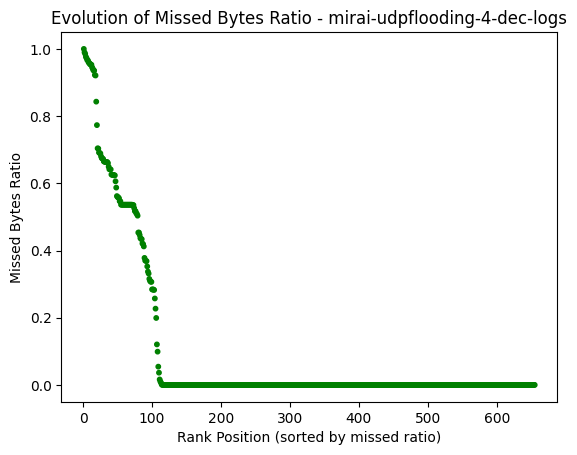

Statistics:
count    655.000000
mean       0.097117
std        0.234837
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.999973
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
592  CNYHSY2Jodpte2QWQ5      0.999973  192.168.0.24      51252   
85   C9cIiy28c4GhxKE2ba      0.989859  192.168.0.16      56376   
435   CRkV4BRMxkDgSszna      0.985129  192.168.0.24      52939   
468  C3e8862ERltMhFAeZi      0.976523  192.168.0.24      36865   
375  CWUvX62dTF3XKduss6      0.972353  192.168.0.24      53894   
214  CSdpuW1InuBW0RYPMc      0.966788  192.168.0.24      48383   
199  CIPGLO2cumMF6VmHN4      0.965684  192.168.0.16      56386   
390   CnL5CwimF4LEWskIl      0.959631  192.168.0.16      56419   
327  C1es4M1ca2ulESWUT6      0.958046  192.168.0.16      56414   
259   CstqXBVXSVehuRcU8      0.954322  192.168.0.24      44546   
574  CsQU5G2V6LU2CPYn2h      0

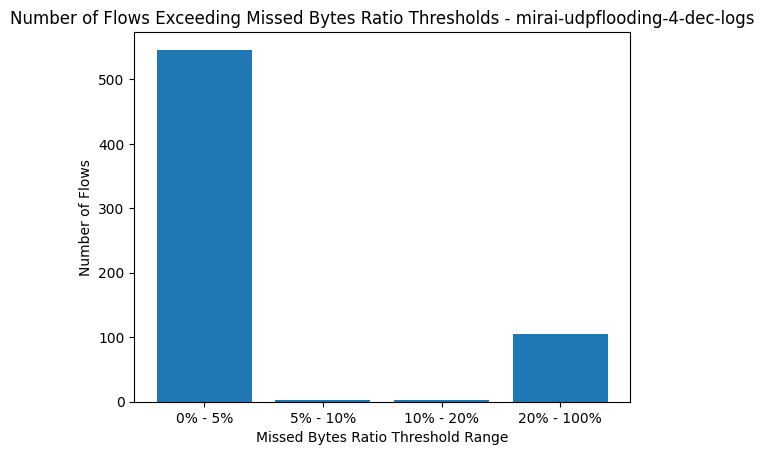

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0   C6NvDf4v0Pv6cAkWpk             0         NaN         NaN  192.168.0.19   
1   CPTx1z4HG0SjVd3pzb             0         NaN         NaN  192.168.0.19   
3   ChbtaB3z8P9BsS5w82             0         NaN         NaN  192.168.0.19   
6    CVIHQBQAB1EpA0Vbj             0         NaN         NaN  192.168.0.19   
11  CHCpIo1aHSpz655cKj             0         NaN         NaN  192.168.0.19   

    id.orig_p       id.resp_h  id.resp_p proto  
0        4575   222.239.21.60         80   tcp  
1        4989    20.36.222.39        443   tcp  
3        5001  130.198.91.101        443   tcp  
6        5014  37.252.229.168        443   tcp  
11       5028  37.252.229.169         80   tcp  
80 rows with NaN values in both orig_bytes and resp_bytes columns.


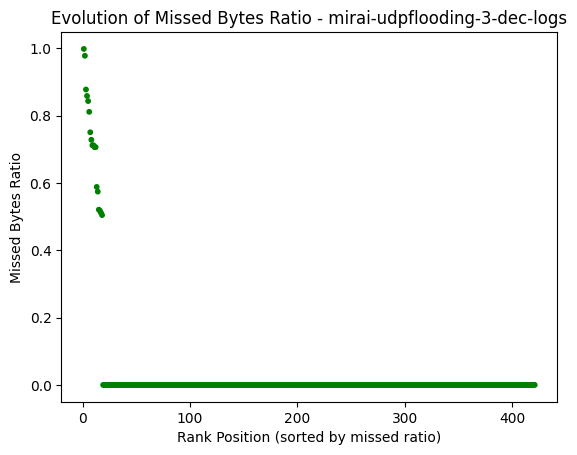

Statistics:
count    421.000000
mean       0.030635
std        0.148548
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.998111
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                    uid  missed_ratio     id.orig_h  id.orig_p  \
40    CaMmW79w3KUQgfRl8      0.998111  192.168.0.24      43278   
4    CGjWgQ33MQZQgcLCh5      0.977721  192.168.0.24      40541   
164  CZpK0o17ueX9BpC8Mj      0.877538  192.168.0.16      56344   
76   CDgm7q2Qz0WNdpAvJ2      0.858365  192.168.0.16      56340   
104  CIjnk239O7Y3CaY14l      0.843209  192.168.0.16      56343   
340  CAz6A44Sk7ULvO91vi      0.811155  192.168.0.16      56345   
106   C68wE92N95TLws3FH      0.750518  192.168.0.16      56342   
74    CUN28EXy6f5yBvWc9      0.728187  192.168.0.16      56338   
64   CsJ5D61sxuWDqLr0Of      0.711898  192.168.0.16      52045   
66   CyFvyW3Rjx8YNqmUr2      0.711898  192.168.0.16      52046   
77    CBU9DtCWhEP2Pu8fb      0

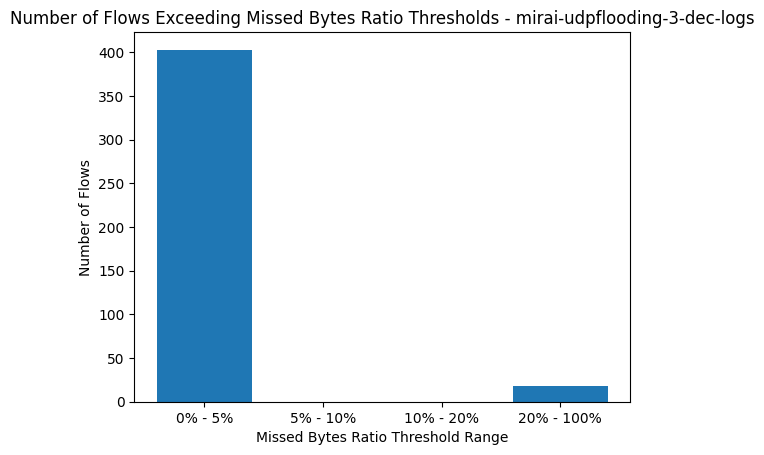

In [8]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

# Para Scan

In [9]:
main_directory = "/root/bbdd/logs-zeek/iotd20-logs/logs-scan/"

In [10]:
def process_conn_log(folder_path, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)]):
    conn_log_path = os.path.join(folder_path, "conn_stadistics_labeled.csv")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        #df = pd.read_json(conn_log_path, lines=True)
        df = pd.read_csv(conn_log_path)

        # Sample 5 flows with NaN values in either orig_bytes or resp_bytes before dropping
        nan_flows = df[df['orig_bytes'].isnull() | df['resp_bytes'].isnull()].head(5)
        if not nan_flows.empty:
            print("Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:")
            print(nan_flows[["uid","missed_bytes","orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Notify and count rows with NaN values in both orig_bytes and resp_bytes columns
        nan_count = df[df['orig_bytes'].isnull() & df['resp_bytes'].isnull()].shape[0]
        if nan_count > 0:
            print(f"{nan_count} rows with NaN values in both orig_bytes and resp_bytes columns.")
        
        # Calculate missed_bytes ratio
        df['missed_ratio'] = np.where(df['missed_bytes'] == 0, 0, df['missed_bytes'] / (df['orig_bytes'] + df['resp_bytes']))        
        
        # Sort DataFrame by missed_ratio in descending order
        df_sorted = df.sort_values(by='missed_ratio', ascending=False)
        
        # Create a dot plot of missed_bytes ratio evolution
        plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o',c=df['binary-label'].apply(lambda x: 'red' if x == 1 else 'green'))
        plt.xlabel("Rank Position (sorted by missed ratio)")
        plt.ylabel("Missed Bytes Ratio")
        plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df_sorted["missed_ratio"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df_sorted.head(15)
        print("\nTop 15 highest missed_bytes ratios:")
        print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        print("\nLeast 15 flows based on missed bytes ratio:")
        least_15 = df_sorted.tail(15)
        print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Initialize lists to store counts for each threshold range
        threshold_counts = [0] * len(thresholds)
        
        # Count number of flows in each threshold range
        for i, (lower, upper) in enumerate(thresholds):
            if upper is None:
                num_flows = (df_sorted['missed_ratio'] >= lower).sum()
            else:
                num_flows = ((df_sorted['missed_ratio'] >= lower) & (df_sorted['missed_ratio'] <= upper)).sum()
            threshold_counts[i] = num_flows
        
        # Create grouped bar plot for the number of flows exceeding each threshold range
        threshold_ranges = [f"{int(lower * 100)}% - {int(upper * 100)}%" if upper is not None else f"> {int(lower * 100)}%" for lower, upper in thresholds]
        plt.bar(threshold_ranges, threshold_counts)
        plt.xlabel("Missed Bytes Ratio Threshold Range")
        plt.ylabel("Number of Flows")
        plt.title(f"Number of Flows Exceeding Missed Bytes Ratio Thresholds - {folder_name}")
        plt.show()

    else:
        print(f"conn.log not found in {folder_path}")

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                  uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
0  CZyQMr1qY4WqAcIPXj             0         NaN         NaN    192.168.0.16   
1  CS9xcw1MVHi5r2ZaE5             0         NaN         NaN    192.168.0.13   
6  CCc6UF2eSESf83m5Be             0         NaN         NaN    192.137.0.13   
7  C4fIrD4QsNb0PIGZic             0         NaN         NaN  190.18.107.149   
8  Cki8ip2AJ7HYClubrl             0         NaN         NaN     224.0.0.251   

   id.orig_p        id.resp_h  id.resp_p proto  
0      53216     192.168.0.13       8984   tcp  
1      42245   128.237.42.171      57340   tcp  
6       9020     128.168.0.16      52704   tcp  
7      64521  227.125.168.136        369   tcp  
8      21737     192.168.0.23       5353   udp  
80 rows with NaN values in both orig_bytes and resp_bytes columns.


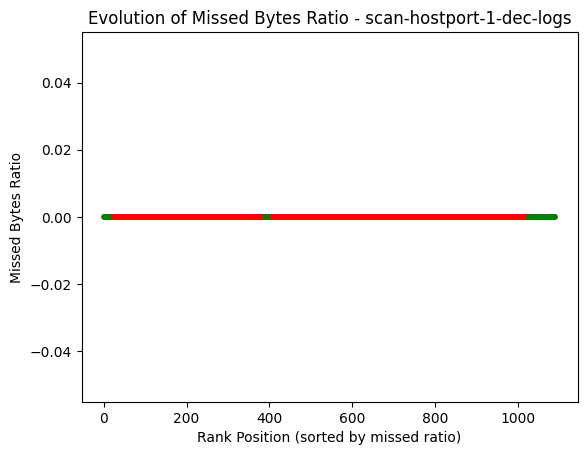

Statistics:
count    1089.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio       id.orig_h  id.orig_p  \
1088   C7SEdOpGK3foXXPw8           0.0   192.168.64.13       8508   
1049  CQHUtA4joHnmUcp7le           0.0   192.168.0.149       9020   
1050  CXLphm2VYVKQw3SXKj           0.0    30.205.78.13       9020   
1051  C9tdG21G80AbIpDvwl           0.0    192.168.0.16      57056   
1052  CP7UPa1UvVMdzxZ4D4           0.0  210.124.177.97       9600   
1053  CiTYfx1ykoVFFHNnFe           0.0   192.168.0.205      23640   
1054  CdkGLW1vNII7fKunv4           0.0    192.168.0.23      52492   
1055  CGe5Iu2gEIn1ix1cP6           0.0    192.168.0.16      52704   
1056  CJBKFR2sXnARvGPeag           0.0  136.205.35.155      18059   
1041  C024xE17YtndOGRYjh           0.0    192.40.128.7      41788   
1042  C8vC6N2YmOEFQ9OOR7     

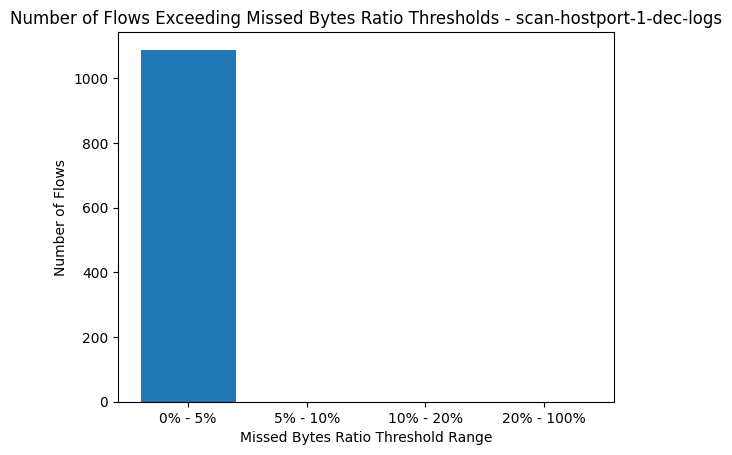

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                  uid  missed_bytes  orig_bytes  resp_bytes  \
0  CL4HS73KfmcpxAGxVa             0         NaN         NaN   
2  CgEOcp2a0R6oGxoYo5             0         NaN         NaN   
3  CvJKuJ3PMyUO4xMCDj             0         NaN         NaN   
4   C7s9OzE3veyrdXKi7             0         NaN         NaN   
5  CXkbNk3hD4Gs0aO8oe             0         NaN         NaN   

                   id.orig_h  id.orig_p       id.resp_h  id.resp_p proto  
0               192.168.0.16       3356    192.168.0.13      52718   tcp  
2               192.168.0.33       5353     224.0.0.251       5353   udp  
3  fe80::146d:b94e:456e:db49       5353        ff02::fb       5353   udp  
4             192.168.128.46      60382  219.145.82.201      55046   tcp  
5             78.252.182.156      63278   227.61.109.52      11159   tcp  
205 rows with NaN values in both orig_bytes and resp_bytes columns.


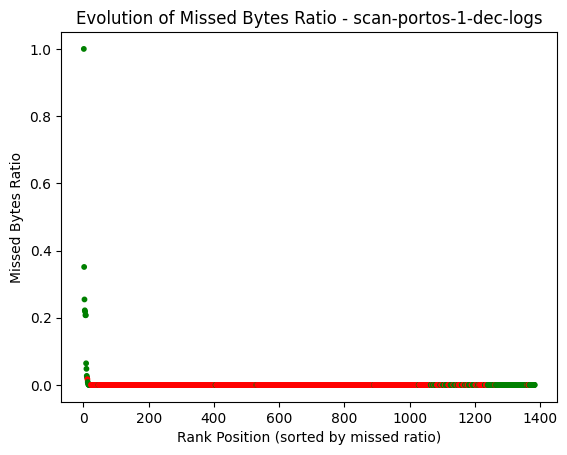

Statistics:
count    1384.000000
mean        0.001917
std         0.031516
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1365  Ca4ehQ2SpIPrl6Udz4      1.000000  192.168.0.15      51546   
1259   CLKyGmKuKQlLfIicj      0.351088  192.168.0.23      57292   
1243   CyV7CtIetJWlQB3Yb      0.254368  192.168.0.13      54568   
1317    CWDiiu79Lb6rpvna      0.221997  192.168.0.23      50212   
1138   CwImHsG5W1TeXfanc      0.217885  192.168.0.23      35584   
1318  C6tGyA4xYAfTUQfeJk      0.207547  192.168.0.23      40314   
1131  CQeSWR3P26Lwg4zzP3      0.207296  192.168.0.23      35580   
1171  CS4VBr2OLgcdtzhqQ3      0.064311  192.168.0.23      58352   
1323  C3fmI23ABARZN6evmj      0.047929  192.168.0.23      35564   
1117   CqSByzFO8ZlCVo4pg      0.026910  192.168.0.23      57796   
1118  CD01A

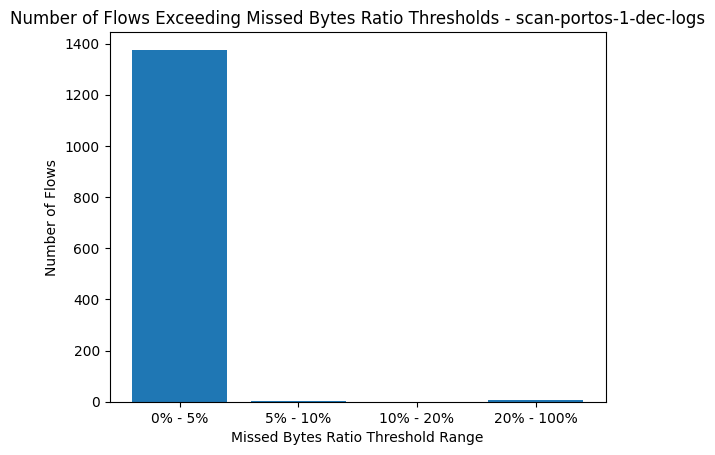

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
2   C8Pmit3mE3K209sMi3             0         NaN         NaN    192.168.0.87   
12  CGw9p22iQyZTQu5TP8             0         NaN         NaN  192.168.128.13   
17  Cw9Rv03ZLLFZYF6R49             0         NaN         NaN    192.168.0.16   
18    CzCzB2udONQVkRMX             0         NaN         NaN    192.168.0.16   
20  CZ1G5e1nF6Uz4fBT0k             0         NaN         NaN    192.168.0.16   

    id.orig_p       id.resp_h  id.resp_p proto  
2       11599  223.241.156.60      27023   tcp  
12      33044   192.170.40.16      20461   tcp  
17      26101    192.168.0.13      50504   tcp  
18       7589     64.171.0.13       9020   tcp  
20      36176    192.168.0.13      18648   tcp  
47 rows with NaN values in both orig_bytes and resp_bytes columns.


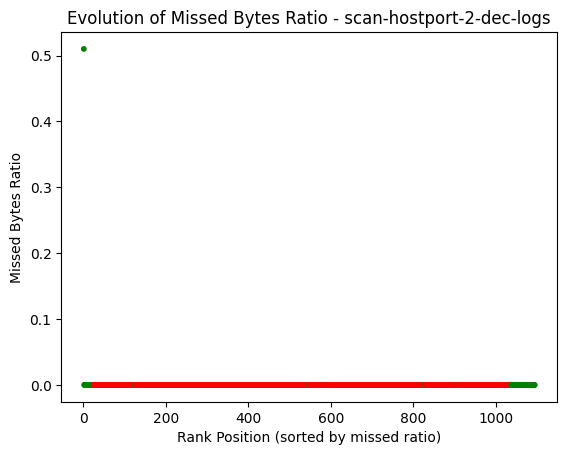

Statistics:
count    1095.000000
mean        0.000466
std         0.015413
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.510013
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p     id.resp_h  \
1073   CjwCzfHjBAh0XcPu1      0.510013  192.168.0.23      50024   52.17.14.59   
734   C1HCNJ3gkkOHmGVe2h      0.000000  192.168.0.15      43074  192.168.0.13   
733   C4uNnm4u61M514wzol      0.000000  192.168.0.15      43074  192.168.0.13   
732   CkgMO34QRfAA2MTpi4      0.000000  192.168.0.15      43074  192.168.0.13   
731   CEaQKK3Pu2zpQrwehk      0.000000  192.168.0.15      43074  192.168.0.13   
730    CCVXLAAqZjb2Wam6c      0.000000  192.168.0.15      43074  192.168.0.13   
729    CqkrtrGthAFHTWa7h      0.000000  192.168.0.15      43074  192.168.0.13   
728   CA33u31Okk2mPgLlrc      0.000000  192.168.0.15      43074  192.168.0.13   
726    CHwmT36fGOdx

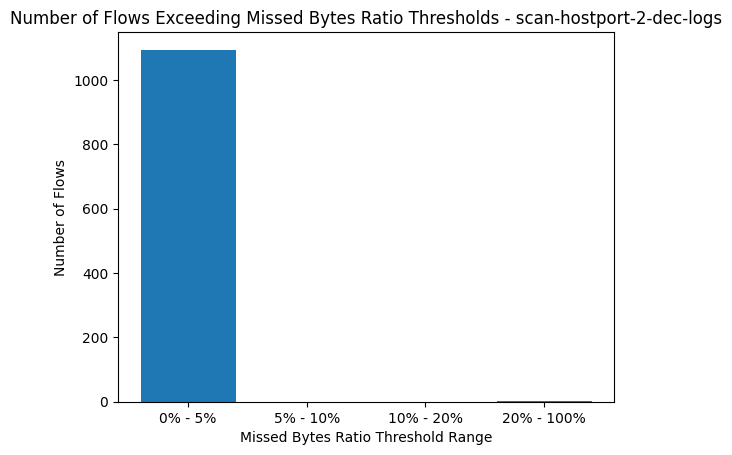

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0     CK7iFPXDEVGOYN1Ek             0         NaN         NaN  192.168.0.15   
31   CPvC4g1RWMyc9s5tG5             0         NaN         NaN  192.168.0.15   
72   CkIdAj3x1FBkVdsYV1             0         NaN         NaN  192.168.0.15   
73    CHUt183kDQ1RZRrYf             0         NaN         NaN  192.168.0.15   
324  CxqfJV38IVvPibOjmj             0         NaN         NaN  192.168.0.15   

     id.orig_p     id.resp_h  id.resp_p proto  
0        57929  192.168.0.13       3800   tcp  
31       57929  192.168.0.13      31110   tcp  
72       57929  192.168.0.13       2393   tcp  
73       57929  192.168.0.13       1075   tcp  
324      57929  192.168.0.13      65389   tcp  
183 rows with NaN values in both orig_bytes and resp_bytes columns.


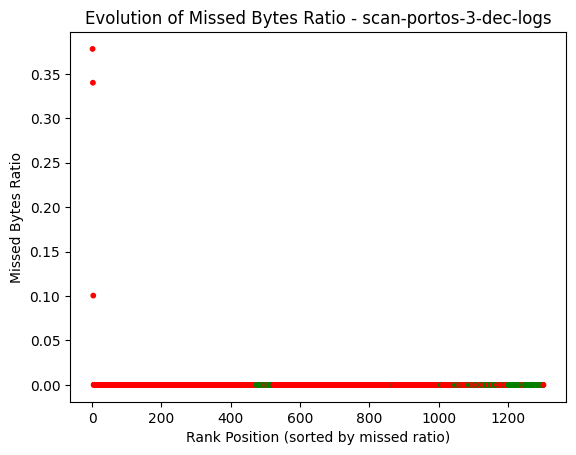

Statistics:
count    1303.000000
mean        0.000629
std         0.014354
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.378151
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1293  Crdky12d7hJG7PsWl4      0.378151  192.168.0.15      51860   
1167  CivLk542vctSm0VXt7      0.340110  192.168.0.23      39850   
1279  C1iT1M3lrj2EGTjn0i      0.100532  192.168.0.23      46948   
1278  Cwwm341xidBwcT1LR6      0.000185  192.168.0.23      46372   
855   CKjYB44kcP6kZsQR88      0.000000  192.168.0.15      57929   
871   CyJ4kp3FXfk8fIUKB2      0.000000  192.168.0.15      57929   
870   CQG4ke15sYXa1S39o3      0.000000  192.168.0.15      57929   
869    CTlcZcGp0TqSuBqD1      0.000000  192.168.0.15      57929   
868   CPmMt24FzannqXIKre      0.000000  192.168.0.15      57929   
867   Cceymw1lO2XLke2vT2      0.000000  192.168.0.13      20279   
866   Cd344

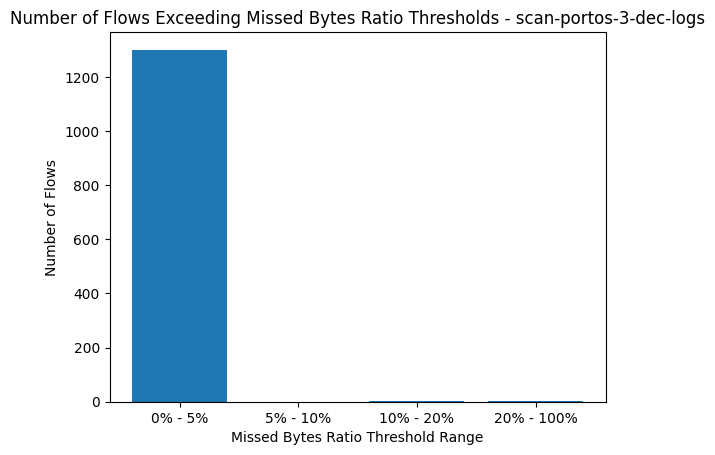

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes      id.orig_h  \
19   Cal29pYdyxFEyw53k             0         NaN         NaN  211.45.58.199   
33  CugWdf3IFhWh0f8pRk             0         NaN         NaN   192.168.0.15   
34  CBG2JH1xfKk2oGzPr4             0         NaN         NaN   192.168.0.15   
35  CowBvg3dxiAFUqGBYb             0         NaN         NaN   192.168.0.15   
36   C42CSmVu3ESvp87f9             0         NaN         NaN   192.168.0.15   

    id.orig_p       id.resp_h  id.resp_p proto  
19      14569  77.180.169.146      21526   tcp  
33      35878    192.168.0.24         22   tcp  
34      35878    192.168.0.24        993   tcp  
35      35878    192.168.0.24        135   tcp  
36      35878    192.168.0.24       8080   tcp  
112 rows with NaN values in both orig_bytes and resp_bytes columns.


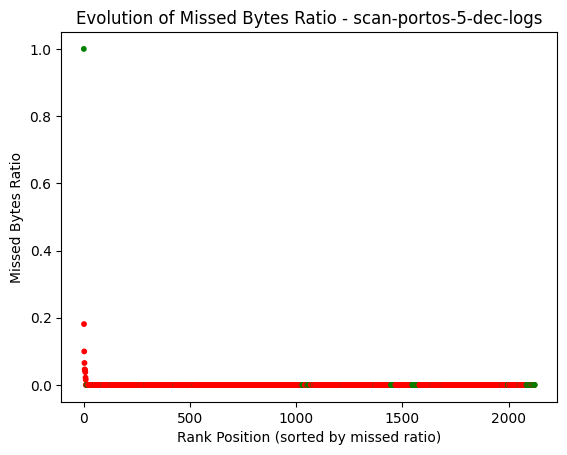

Statistics:
count    2123.000000
mean        0.000733
std         0.022285
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999876
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1028   CSeeuIxejVd2vjTo4  9.998761e-01  192.168.0.24      32855   
1689  CO3giD1EmTi4O28Iu1  1.810737e-01  192.168.0.24      38013   
2089   CxZ8PtSxekyZ7yfT2  9.965385e-02  192.168.0.23      48378   
2095   C8r6PTwIEGUd5cskg  6.531177e-02  192.168.0.23      44402   
2094  CfZaZE30fwhsscsYGa  4.621899e-02  192.168.0.23      44404   
1998   CAD1P47J0obWpixxa  4.463698e-02  192.168.0.24      32859   
2066  C9X14x1A4FrpsTqbg8  4.341771e-02  192.168.0.24      44424   
2091    C3rMQouJlQ0Er99W  3.810785e-02  192.168.0.23      55524   
2099  CRVqhq4tZ0xQjPYzD9  2.192734e-02  192.168.0.23      44396   
2114  Cs7Jd21xksrVH4QaTi  1.550831e-02  192.168.0.23      46536   
2092  CtGwO

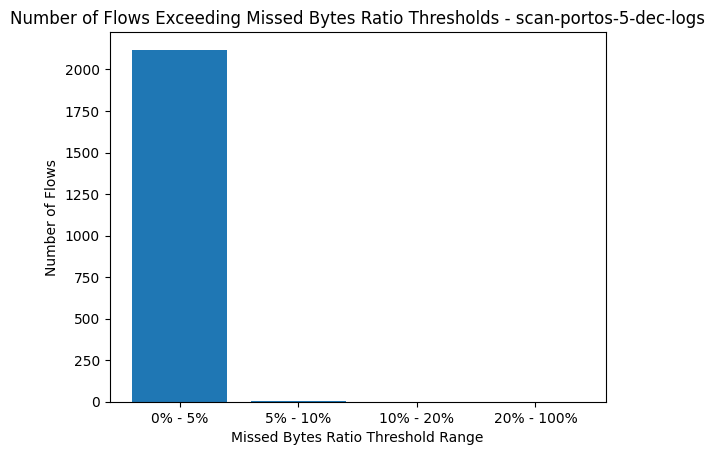

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
0     Cq3ai3S3v66n29W6j             0         NaN         NaN  192.168.0.15   
1    CIMkcp29vRbZy5QpNf             0         NaN         NaN  192.168.0.15   
350  CNUI7g4gIWllg4Gfnc             0         NaN         NaN  192.168.0.15   
351   CrP3IJgkqX3ddxg1b             0         NaN         NaN  192.168.0.15   
352  CznhfT2g6ai8tkHOee             0         NaN         NaN  192.168.0.15   

     id.orig_p     id.resp_h  id.resp_p proto  
0        55916  192.168.0.13       3071   tcp  
1        55916  192.168.0.13       5952   tcp  
350      55916  192.168.0.13       1094   tcp  
351      55916  192.168.0.13       1984   tcp  
352      55916  192.168.0.13       1163   tcp  
116 rows with NaN values in both orig_bytes and resp_bytes columns.


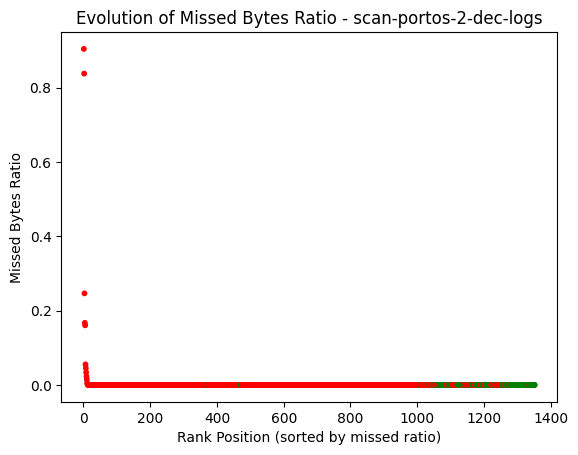

Statistics:
count    1352.000000
mean        0.001846
std         0.034806
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.904318
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1193  CqE1UG29Lvh4FPEW33      0.904318  192.168.0.16      52727   
1152  CWkfN626VJqzrAaMq9      0.837929  192.168.0.23      45924   
1331  CPArZM22R31lmxMVoh      0.246348  192.168.0.16      64539   
1334  C7QsJu3PS6GhzZFeo8      0.167084  192.168.0.16      64537   
1122  CDwSGm1lYlaXy5L2Rg      0.160377  192.168.0.16      64548   
1060  CQf9Gj4wvwnL8BbK27      0.055276  192.168.0.16      52721   
1138   CZpITA369i3ko9SU2      0.045218  192.168.0.16      64542   
1139  CHGi1D2YEDT4QWd92l      0.033739  192.168.0.16      64541   
1007   COloYl6EipCR4xxv1      0.023157  192.168.0.13      39830   
1131   CgcRqVFa7MnnKXEn8      0.014638  192.168.0.16      64545   
1333  CAl6y

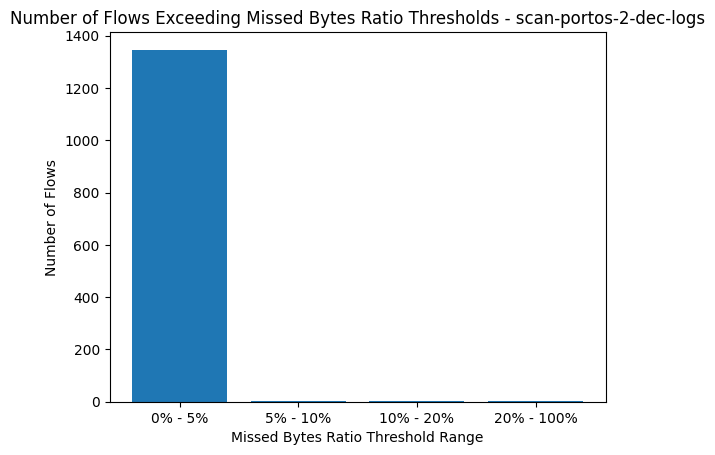

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
11  Cqvtw024G2XCYxqFJ6             0         NaN         NaN  192.168.0.14   
14  C1YB1Z3zMwbljmCPm1             0         NaN         NaN  192.168.0.33   
15  CpPSly3ziO51ftxd61             0         NaN         NaN  192.168.0.33   
16  CopHIM3JTdVrCxFxnb             0         NaN         NaN  192.168.0.33   
17  CAtX7C44oSM8OoNki7             0         NaN         NaN  192.168.0.33   

    id.orig_p    id.resp_h  id.resp_p proto  
11      51695  163.152.1.1         53   udp  
14      60292  27.0.236.87        443   tcp  
15      60293  27.0.236.87        443   tcp  
16      60294  27.0.236.87        443   tcp  
17      60295  27.0.236.87        443   tcp  
41 rows with NaN values in both orig_bytes and resp_bytes columns.


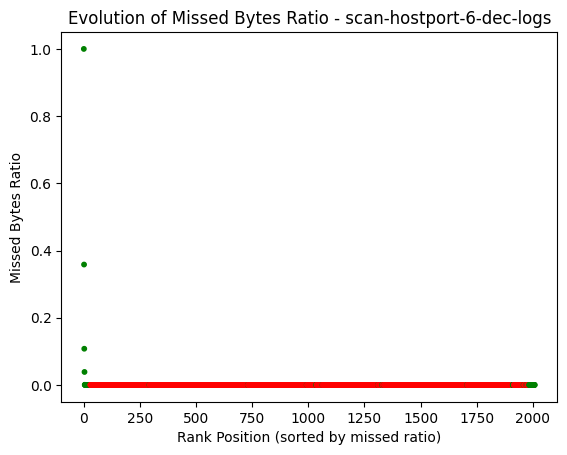

Statistics:
count    2008.000000
mean        0.000749
std         0.023836
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999979
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
8     CiixVJ3XLvQROqsED3      0.999979  192.168.0.13      57013   
1959   CVg0dnbiobAUs9Blh      0.358286  192.168.0.24      60920   
1913  CoR4744U5WaWFiFTJb      0.107701  192.168.0.23      55566   
1983  CyhTya1sOPm6hEjAb8      0.038580  192.168.0.24      52440   
27    CuM6lv3GL93WJdLoc3      0.000427  192.168.0.24      32862   
1334  CR0ycX2oPxJEmOryJh      0.000000  192.168.0.15      63794   
1335  C98fch4d0kVYQHHJJi      0.000000  192.168.0.24       1117   
1336  CsCNsq1nI0OusjceNd      0.000000  192.168.0.15      63794   
1337  C1y99m3vmwhhD3Ksjg      0.000000  192.168.0.15      63794   
1338  CH2fnT25yGWyHPwpS5      0.000000  192.168.0.15      63794   
1339  C76sM

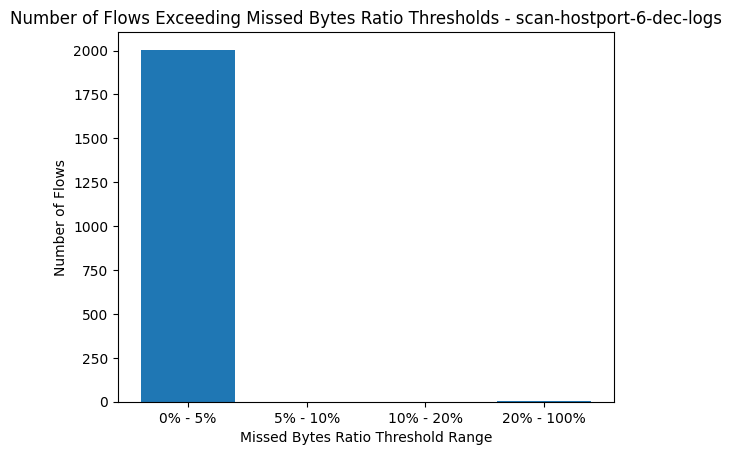

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
9   Cr2JVU3CKknVKCQKca             0         NaN         NaN  192.168.0.15   
10  CLzasL1WsJ43wDFC51             0         NaN         NaN  192.168.0.16   
22  Csrtqb27k83ReCZ79g             0         NaN         NaN  192.168.0.15   
23  Cgf4C519jbGGfi2974             0         NaN         NaN  192.168.0.15   
24   CeEpoX56KVMABfoyl             0         NaN         NaN  192.168.0.15   

    id.orig_p     id.resp_h  id.resp_p proto  
9       52887  192.168.0.13      27352   tcp  
10      30361  192.168.0.13       1062   tcp  
22      52887  192.168.0.13        111   tcp  
23      52887  192.168.0.13       8080   tcp  
24      52887  192.168.0.13       1723   tcp  
37 rows with NaN values in both orig_bytes and resp_bytes columns.


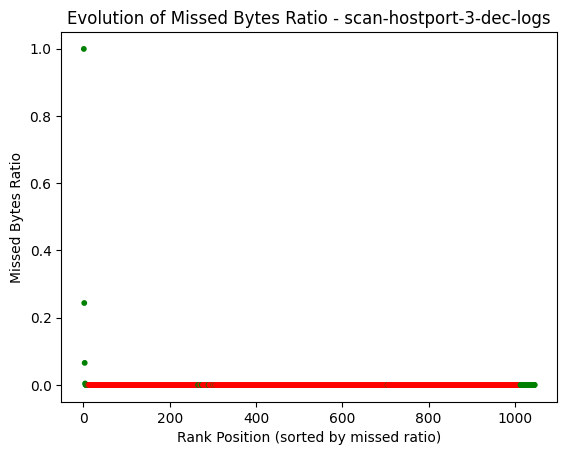

Statistics:
count    1046.000000
mean        0.001255
std         0.031848
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.998975
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1045  CfOlFB3Og4nJlhnkV3      0.998975  192.168.0.16      52739   
1027   Ce9Oh31AURrlp2n0i      0.243542  192.168.0.23      43634   
0     ChjNMl1CTsVAgnTWa4      0.065515  192.168.0.13      45059   
1033  CGczzp11Lk1Qt591Ug      0.004303  192.168.0.23      45930   
1042  Csh9C81mxCG8tDdTI1      0.000157  192.168.0.16      64566   
701   CLzCDd12eG10DoNrYd      0.000000  192.168.0.15      52887   
700   CYjTBE3ygoata5Syzi      0.000000  192.168.0.15      52887   
699    CSKZo64BOApfMfoXj      0.000000  192.168.0.15      52887   
698    CZMjDf4R88sdNurAc      0.000000  192.168.0.15      52887   
697   ClU0mO1iigWxInxmG7      0.000000  192.168.0.15      52887   
695   CcXV0

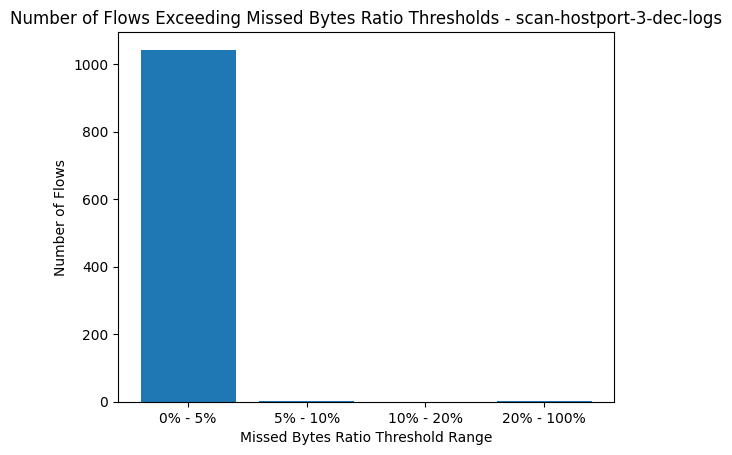

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
7   Crbgb52wbEtb1nUb5h             0         NaN         NaN  192.168.0.24   
9    CK25QA4ooUEwneTvx             0         NaN         NaN  192.168.0.14   
11  CZoNle151RJsXJPSxe             0         NaN         NaN  192.168.0.23   
12  COF3em1NXtf1XLTErj             0         NaN         NaN  192.168.0.23   
31  Cxw3xH1sFOiKlCvvcb             0         NaN         NaN  192.168.0.24   

    id.orig_p       id.resp_h  id.resp_p proto  
7       32836  223.39.123.245       7000   tcp  
9       49629     163.152.1.1         53   udp  
11      45747     163.152.1.1         53   udp  
12      54915     163.152.1.1         53   udp  
31      43734  210.220.163.82         53   udp  
25 rows with NaN values in both orig_bytes and resp_bytes columns.


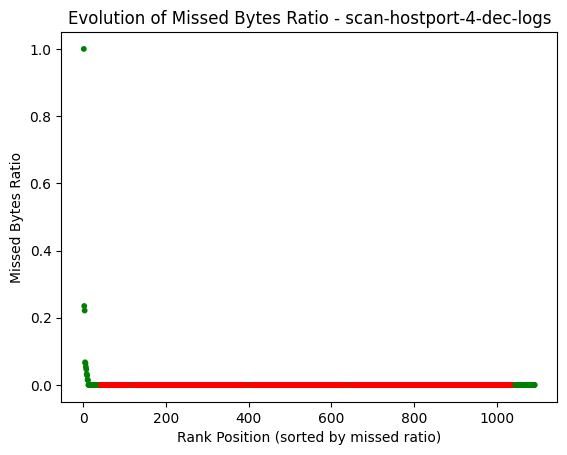

Statistics:
count    1092.000000
mean        0.001628
std         0.032000
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999971
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1088  CtJOjd124dtVKHIWH8      0.999971  192.168.0.24      37192   
24    C96jEh3E3KQtAUNRob      0.234854  192.168.0.23      35854   
4     CiRFx13HfQuUIzeYDg      0.221437  192.168.0.23      51112   
1073  Cy5Oko1EfsztKrbou5      0.067329  192.168.0.23      41038   
36    CYJop0241tMVQV5Rob      0.064064  192.168.0.24      32838   
3      CZEvz5wTqGokW97J9      0.053288  192.168.0.23      33318   
22    CeDWaN20hiK6L4l8w8      0.046641  192.168.0.24      44401   
1065  CggJjF4TtKMglVFP17      0.032462  192.168.0.23      55424   
1060  CSnD7I3Jbg8Pkd7vXj      0.027976  192.168.0.23      50654   
1074   C3Y6RAHjdZehAvdka      0.015361  192.168.0.23      55428   
32     C10s

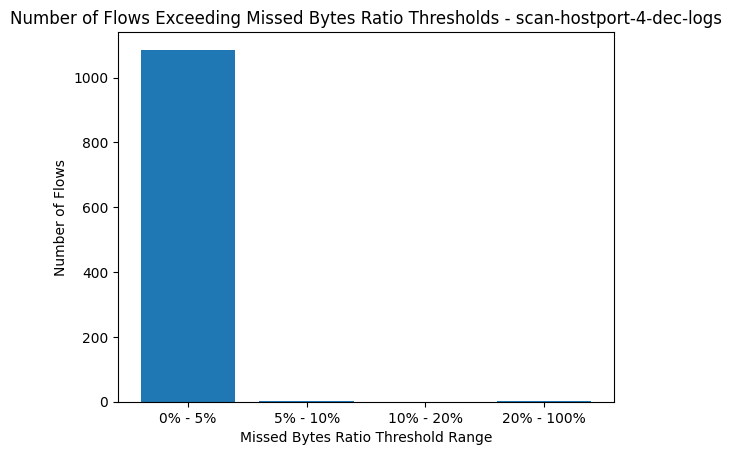

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
7    C0IeXn3NsALbHDDLLg             0         NaN         NaN  192.168.0.24   
214  CV6hci1J8NreI0ibY8             0         NaN         NaN  192.168.0.15   
314   CljTtx1UtscQOH0CT             0         NaN         NaN  192.168.0.15   
353  CA12pJ3WC0b0JbgaG1             0         NaN         NaN  192.168.0.24   
355   CKspkXFl0POAKjeyi             0         NaN         NaN  227.168.0.24   

     id.orig_p       id.resp_h  id.resp_p proto  
7        57522  223.39.123.191        443   tcp  
214      33414    192.168.0.24       2383   tcp  
314      16506   48.147.161.45      31163   tcp  
353      36739  192.168.192.52      50222   tcp  
355        163    192.168.0.15      33414   tcp  
27 rows with NaN values in both orig_bytes and resp_bytes columns.


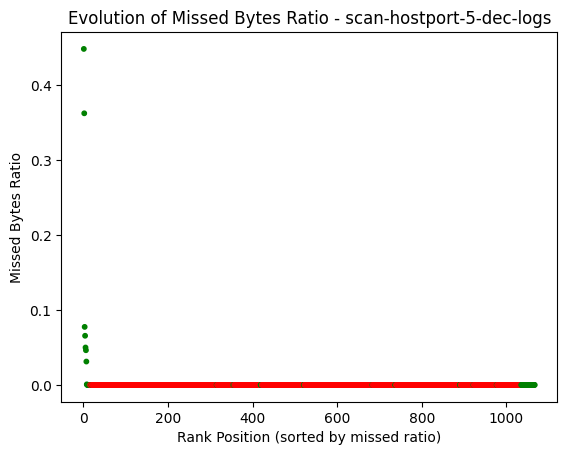

Statistics:
count    1067.000000
mean        0.001014
std         0.018050
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.448420
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1051  ChzP242ncX4DEfnpk4  4.484196e-01  192.168.0.23      54526   
1050  CjACLP2VE3Pi12TR3b  3.624935e-01  192.168.0.23      50290   
1052  CzsyFz3EWMnQQny7Ng  7.744653e-02  192.168.0.23      56318   
1064  CocC2J2EfoOtkbxx94  6.560930e-02  192.168.0.23      55488   
5     CXl1lu4O1nh7AdYpK9  4.995067e-02  192.168.0.24      48875   
1057  C1ILpr20WFySQldJyf  4.629479e-02  192.168.0.23      55486   
2      ChKJF2sY4RR3mHhrg  3.120377e-02  192.168.0.23      46390   
1      CxEgv1yPPWOzwmjG3  7.418609e-04  192.168.0.24      32849   
1045  CWj8uC4NEnYVZ1Ajcj  7.961485e-07  192.168.0.24      48640   
707   Cbgec02IaIH5Vk0yk1  0.000000e+00  192.168.0.15      33414   
708   CSmBF

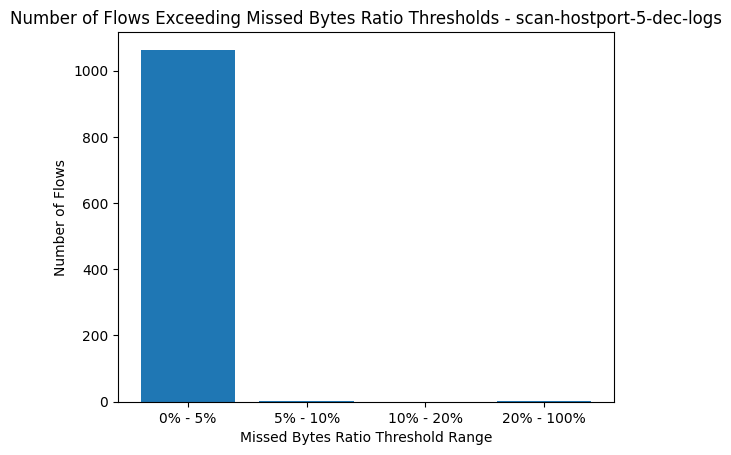

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
12   C57qIf1e5m09CadHd3             0         NaN         NaN  192.168.0.15   
13   C93U6i4F1DUF7eyoF4             0         NaN         NaN  192.168.0.15   
14   Cqk28m34puE9bHGMKc             0         NaN         NaN  192.168.0.15   
15    CMyThfjgqx0UMmaL1             0         NaN         NaN  192.168.0.15   
303  CwDI614aY53IXlmnu2             0         NaN         NaN  192.168.0.24   

     id.orig_p      id.resp_h  id.resp_p proto  
12       62974   192.168.0.24         23   tcp  
13       62974   192.168.0.24        199   tcp  
14       62974   192.168.0.24       4045   tcp  
15       62974   192.168.0.24       1594   tcp  
303      49053  192.168.0.255      52396   tcp  
47 rows with NaN values in both orig_bytes and resp_bytes columns.


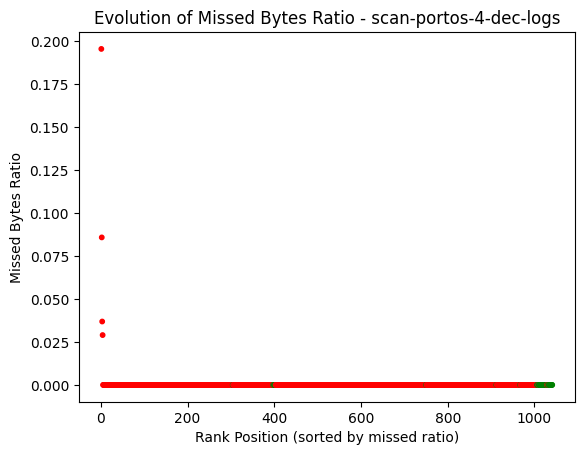

Statistics:
count    1041.000000
mean        0.000333
std         0.006763
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.195280
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
1023  CwgKE626gQEK3DKFZ2      0.195280  192.168.0.24      55248   
1033  CLP3Qm3Ypjeq2875pf      0.085733  192.168.0.23      55468   
1007  CitEyf4se4CR3hqG68      0.036853  192.168.0.23      46382   
1017  CN7Zan3UnDUkRuOcni      0.028973  192.168.0.24      32847   
698   COzB2k2NOltqP2tP91      0.000000  192.168.0.15      62974   
696   CrDC7G2h4p0MctTr4f      0.000000  192.168.0.15      62974   
695   CqkqPe39H20CfqbKFa      0.000000  192.168.0.15      62974   
694   CklCh735d3ADhzVN8d      0.000000  192.168.0.15      62974   
693    COnBREzlplnKuTPx6      0.000000  192.168.0.15      62974   
692   Cdf84q15ab6flfXodj      0.000000  192.168.0.15      62974   
691   CQJ8V

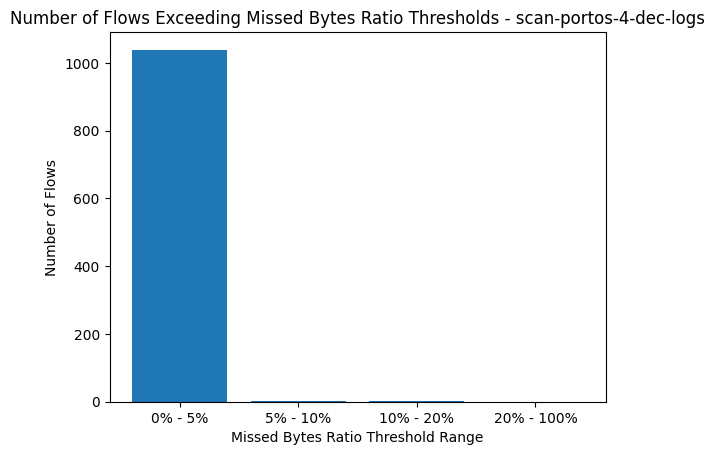

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
4   Cqe7Pw1qZL5mggSsA9             0         NaN         NaN  192.168.0.15   
5   CdqFGb4Zte1G6ORudb             0         NaN         NaN  192.168.0.15   
16  CIIqNS2Xk0YkxINaGl             0         NaN         NaN  192.168.0.24   
17  C6JS0p3y5w6fp8DV79             0         NaN         NaN  192.168.0.15   
19  CZ1Bok4jliNKDfOboj             0         NaN         NaN  192.168.0.24   

    id.orig_p     id.resp_h  id.resp_p proto  
4       57699  192.168.0.24        993   tcp  
5       57699  192.168.0.24         22   tcp  
16       1723  192.168.0.15      57699   tcp  
17      57699  192.168.0.24       8080   tcp  
19        993  192.168.0.15       8690   tcp  
122 rows with NaN values in both orig_bytes and resp_bytes columns.


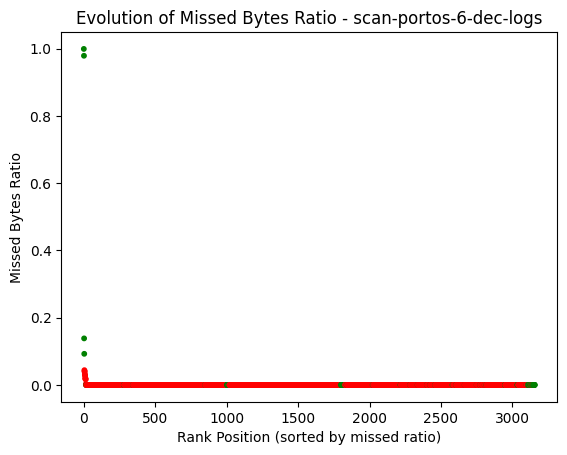

Statistics:
count    3156.000000
mean        0.000792
std         0.025129
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999386
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio     id.orig_h  id.orig_p  \
3137  Cc4xBt1ODNuLqeqhSh      0.999386  192.168.0.24      49302   
3127   CRsRQUAwvbJ4XJWrk      0.979056  192.168.0.24      51003   
3119  CNbN7V3yM0Jrpw4vi2      0.138385  192.168.0.24      32868   
3132   CFycf1GozaII0k6F3      0.092522  192.168.0.23      55582   
3149  CFLWcp2S1EvGfhewW5      0.043851  192.168.0.23      55574   
3153   CUzJw6Qg4kK48bwH6      0.040617  192.168.0.24      57727   
3113  Ca0dad4Q03HyjhgHUj      0.039286  192.168.0.24      49943   
3110  CB2iY01gsv59CYqJHb      0.032270  192.168.0.24      43153   
3124   CIMxDbEumQnUGWTr3      0.028910  192.168.0.24      46461   
1008  Cd9ZLs4rIsNQueXch8      0.028246  192.168.0.24      49486   
3037  C1i8g

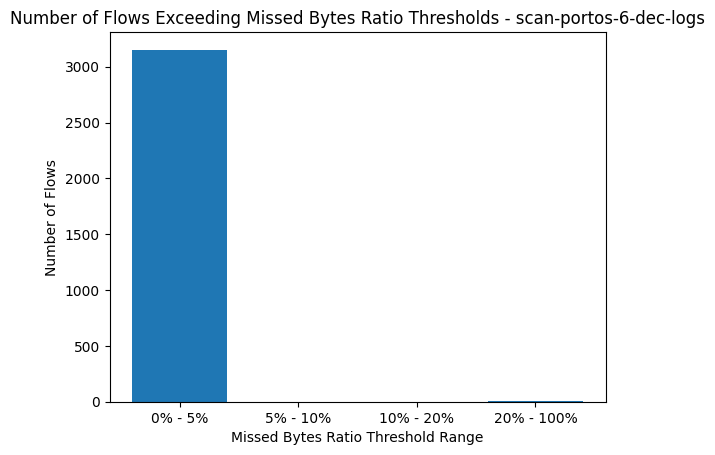

In [11]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

# Para DoS

In [12]:
main_directory = "/root/bbdd/logs-zeek/iotd20-logs/logs-dos/"

In [13]:
def process_conn_log(folder_path, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)]):
    conn_log_path = os.path.join(folder_path, "conn_stadistics_labeled.csv")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        #df = pd.read_json(conn_log_path, lines=True)
        df = pd.read_csv(conn_log_path)

        # Sample 5 flows with NaN values in either orig_bytes or resp_bytes before dropping
        nan_flows = df[df['orig_bytes'].isnull() | df['resp_bytes'].isnull()].head(5)
        if not nan_flows.empty:
            print("Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:")
            print(nan_flows[["uid","missed_bytes","orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Notify and count rows with NaN values in both orig_bytes and resp_bytes columns
        nan_count = df[df['orig_bytes'].isnull() & df['resp_bytes'].isnull()].shape[0]
        if nan_count > 0:
            print(f"{nan_count} rows with NaN values in both orig_bytes and resp_bytes columns.")
        
        # Calculate missed_bytes ratio
        df['missed_ratio'] = np.where(df['missed_bytes'] == 0, 0, df['missed_bytes'] / (df['orig_bytes'] + df['resp_bytes']))        
        
        # Sort DataFrame by missed_ratio in descending order
        df_sorted = df.sort_values(by='missed_ratio', ascending=False)
        
        # Create a dot plot of missed_bytes ratio evolution
        plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o',c=df['binary-label'].apply(lambda x: 'red' if x == 1 else 'green'))
        plt.xlabel("Rank Position (sorted by missed ratio)")
        plt.ylabel("Missed Bytes Ratio")
        plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df_sorted["missed_ratio"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df_sorted.head(15)
        print("\nTop 15 highest missed_bytes ratios:")
        print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        print("\nLeast 15 flows based on missed bytes ratio:")
        least_15 = df_sorted.tail(15)
        print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Initialize lists to store counts for each threshold range
        threshold_counts = [0] * len(thresholds)
        
        # Count number of flows in each threshold range
        for i, (lower, upper) in enumerate(thresholds):
            if upper is None:
                num_flows = (df_sorted['missed_ratio'] >= lower).sum()
            else:
                num_flows = ((df_sorted['missed_ratio'] >= lower) & (df_sorted['missed_ratio'] <= upper)).sum()
            threshold_counts[i] = num_flows
        
        # Create grouped bar plot for the number of flows exceeding each threshold range
        threshold_ranges = [f"{int(lower * 100)}% - {int(upper * 100)}%" if upper is not None else f"> {int(lower * 100)}%" for lower, upper in thresholds]
        plt.bar(threshold_ranges, threshold_counts)
        plt.xlabel("Missed Bytes Ratio Threshold Range")
        plt.ylabel("Number of Flows")
        plt.title(f"Number of Flows Exceeding Missed Bytes Ratio Thresholds - {folder_name}")
        plt.show()

    else:
        print(f"conn.log not found in {folder_path}")

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
6    C9MXKUDkKrru9vZBi             0         NaN         NaN  192.168.0.24   
11  CFGVA01rZkMvCpveV1             0         NaN         NaN  192.168.0.23   
53  COSCIg3mjcd3QJRAIf             0         NaN         NaN  192.168.0.24   
54   CxinHmf4sZjXRfRO1             0         NaN         NaN  192.168.0.24   
85  COTkIq1TuKIm5ra6nl             0         NaN         NaN  192.168.0.24   

    id.orig_p        id.resp_h  id.resp_p proto  
6       46898   223.39.118.149        443   tcp  
11       9279      163.152.1.1         53   udp  
53      19604   111.223.82.184       5939   tcp  
54      19604  111.247.142.100       3993   tcp  
85      19604   111.203.174.85       3382   tcp  
254 rows with NaN values in both orig_bytes and resp_bytes columns.


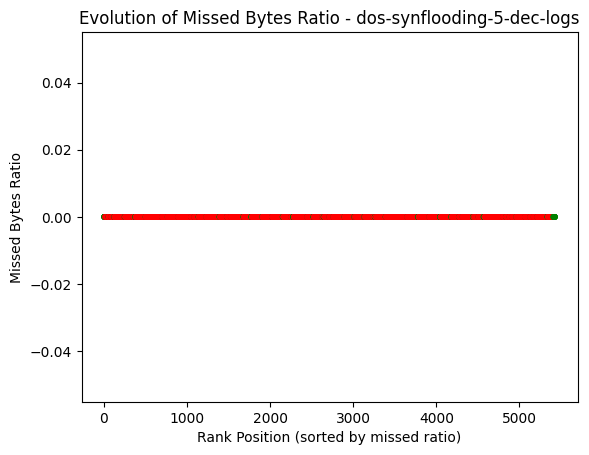

Statistics:
count    5427.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio                  id.orig_h  id.orig_p  \
5426   CPsDxYv5puwse9h2a           0.0                192.168.0.1      42360   
0     CCVKbi1oFUm00QR70j           0.0               192.168.0.14       5353   
1     C5WTOe2BhBVzdrKyu2           0.0  fe80::10cc:207d:e8e8:1062       5353   
2     CRzHSO1XahGLA24eUe           0.0               192.168.0.23      17819   
3     CkjYIu19Om8rrb1mP1           0.0               192.168.0.23       5019   
4     CQVPAK2JE7kAgKDZGc           0.0               192.168.0.23      48407   
5     CdewIO3RFnals5EYKj           0.0               192.168.0.23      41475   
6      C9MXKUDkKrru9vZBi           0.0               192.168.0.24      46898   
7      CegamOIdkUuZn5fX9           0.0  fe80::4f82:dccb:9250:f2d2   

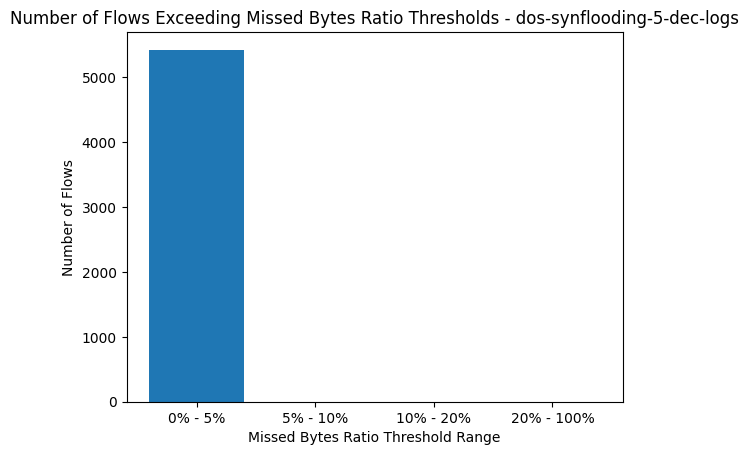

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                  uid  missed_bytes  orig_bytes  resp_bytes        id.orig_h  \
2  CUWGuE40D292Ymfutj             0         NaN         NaN    111.113.37.92   
3  CUDZsy3iuTjFD0pErd             0         NaN         NaN    111.6.205.209   
4   C1fWne3NMVifACqCY             0         NaN         NaN    111.247.21.29   
5   CpYrtPosL4UWUrI92             0         NaN         NaN    111.25.254.44   
9   CY8EuTMJnpr28XJa8             0         NaN         NaN  111.150.145.146   

   id.orig_p     id.resp_h  id.resp_p proto  
2       3794  192.168.0.13        554   tcp  
3       6416  192.168.0.13        554   tcp  
4       4702  192.168.0.13        554   tcp  
5       3159  192.168.0.13        554   tcp  
9       2703  192.168.0.13        554   tcp  
535 rows with NaN values in both orig_bytes and resp_bytes columns.


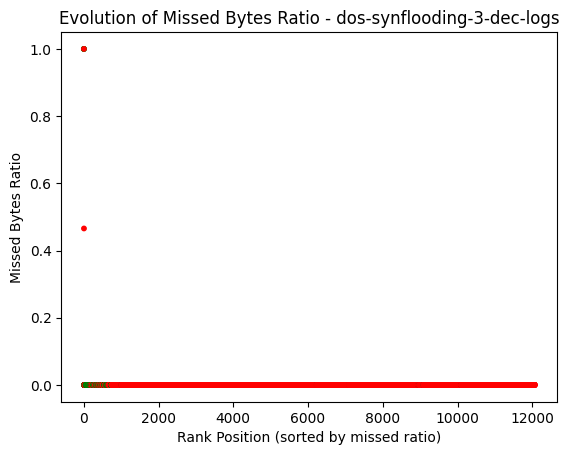

Statistics:
count    12066.000000
mean         0.000370
std          0.018691
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2169  CHmpSf3rQFWFwuJae3      1.000000   111.113.55.166       7346   
4085  CS4NVt4Cl3lT788uG8      1.000000  111.181.220.175       5300   
3568  Cb1Tyu4uh0tTAlPQDg      1.000000   111.79.218.140       4401   
5010   CmuBjSajDJiFWiYF4      1.000000  111.208.182.176       2197   
414   CzgLyc2NsGNrPWKCcg      0.465619     192.168.0.23      35854   
8037   CqO0CsyA1v5Z5hnsg      0.000000    111.38.14.255       4392   
8039  Crz0321ihUTYM3bDCl      0.000000   111.77.190.149       8705   
8040  CvcnD44PPTnpIvq0jg      0.000000   111.221.114.57       4855   
8041  C9Tpgd3nnQShfe6at7      0.000000   111.43.203.251       4432   
8042  CbuFEw1TrKVOzcG3Ph      0.000000  

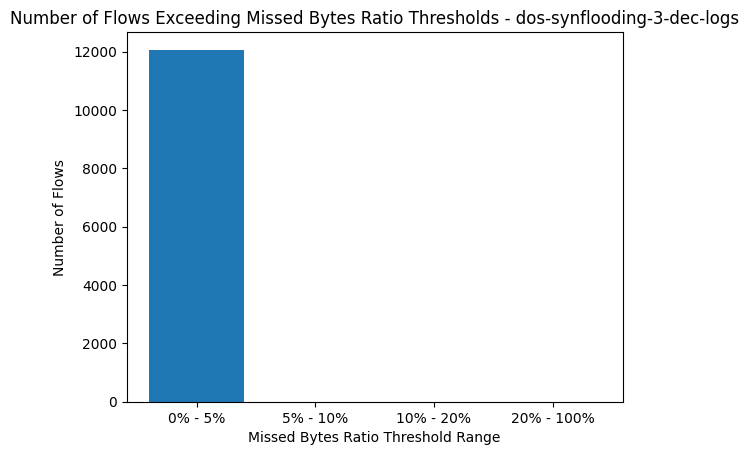

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                    uid  missed_bytes  orig_bytes  resp_bytes     id.orig_h  \
117  CuODk64oLmJE6bsRYf             0         NaN         NaN  192.168.0.24   
118   CP6S4W3CW3GTQWua9             0         NaN         NaN  192.168.0.24   
119  CSA3Tj14NYQhtqiHef             0         NaN         NaN  192.168.0.24   
120   Cqcqx34SfraRozMxy             0         NaN         NaN  192.168.0.24   
121  CxyzXM2lrfUbaHiKgk             0         NaN         NaN  192.168.0.24   

     id.orig_p        id.resp_h  id.resp_p proto  
117      19604   111.214.67.173       1512   tcp  
118      19604    111.34.203.95       6458   tcp  
119      19604   111.70.241.188       1904   tcp  
120      19604   111.192.234.72       8951   tcp  
121      19604  111.175.240.249       2225   tcp  
257 rows with NaN values in both orig_bytes and resp_bytes columns.


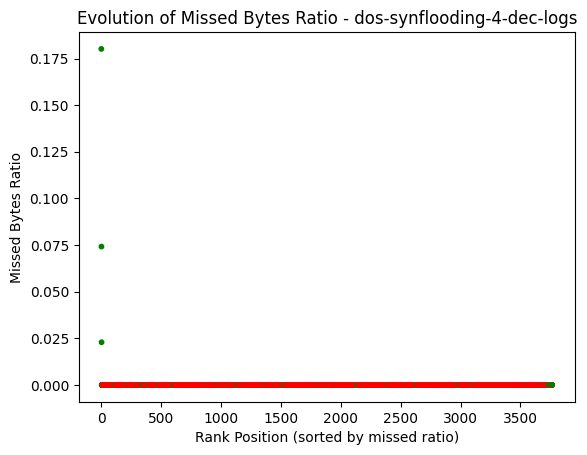

Statistics:
count    3765.000000
mean        0.000074
std         0.003196
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.180145
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
3748   Cbf26WD2VRfSbuesg      0.180145     192.168.0.23      36174   
1964  C7fupl3Z0FygeCe6K1      0.074173     192.168.0.23      35432   
3740  CLae4R2SZyWm8kCzTk      0.022881     192.168.0.23      39880   
2501  C7L3Qu19tMvfaEdRy1      0.000000     111.93.245.6       6437   
2502  CsrjQR15qCr1o10hjl      0.000000   111.248.170.83       8002   
2503   CHiuKEhGJ7lGxxgN2      0.000000   111.255.244.10       7384   
2504   CQHiDUaytBXw7fetd      0.000000   111.135.88.117       7935   
2505  Ces1OR1sVll22ZZd91      0.000000  111.136.140.174       2780   
2506  Cdzp753UgMTSxpjwnd      0.000000    111.55.139.58       2692   
2507  CngH9x3vjh1e7jydFl      0.000000   111.212

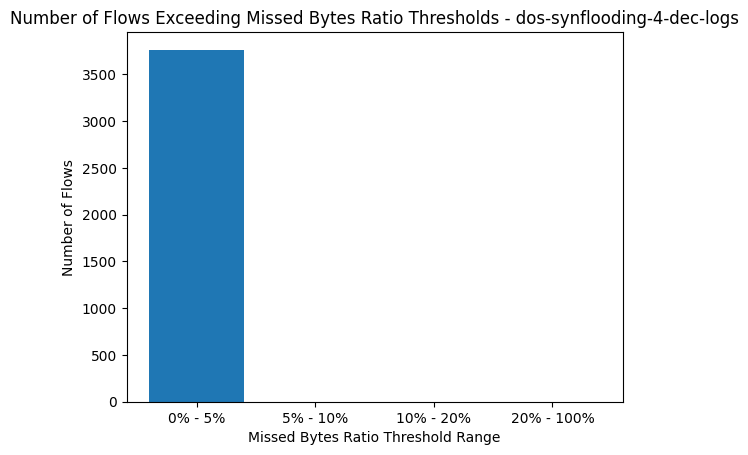

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
22  CXO7qR2nHzNGmCo9S7             0         NaN         NaN  111.164.201.59   
26  Cj79Rr1xiYEbUQWVpa             0         NaN         NaN    192.168.0.24   
48  C9AeSy4Np0F8CG08ka             0         NaN         NaN    192.168.0.24   
49  C5NMKy27Ro8zUzNZ6g             0         NaN         NaN    192.168.0.24   
51  CIQy8O36DamvqmtDW9             0         NaN         NaN    192.168.0.24   

    id.orig_p       id.resp_h  id.resp_p proto  
22       4835    192.168.0.24      19604   tcp  
26      15508  111.164.201.59       4835   tcp  
48      19604  111.184.66.149       1880   tcp  
49      19604  111.148.203.99       1503   tcp  
51      19604  111.195.210.13       1880   tcp  
200 rows with NaN values in both orig_bytes and resp_bytes columns.


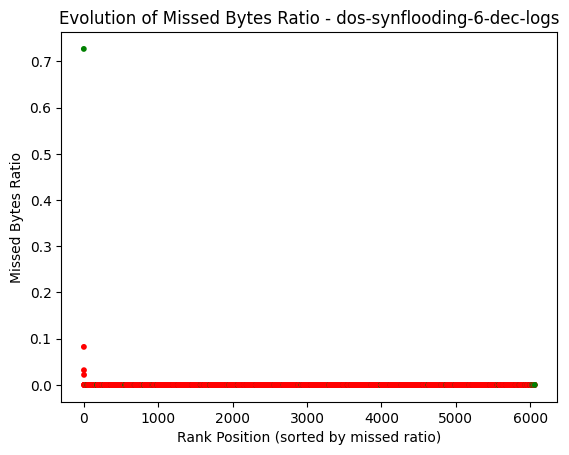

Statistics:
count    6060.000000
mean        0.000142
std         0.009410
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.726911
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio       id.orig_h  id.orig_p  \
5931  C3sDJn48BznEb2KnLi      0.726911    192.168.0.24      41902   
5962   ChlFSq1K5CdMa263R      0.082275    192.168.0.24      51372   
2885  CH09yv1LB1rzCntadk      0.031915    192.168.0.23      34860   
6021   CKul9XdM41PWrtUJd      0.021729    192.168.0.23      34866   
6025  CBqu9J2AQFSvsZcjD8      0.000124    192.168.0.23      34868   
4042    CQQY539sYCoohDp7      0.000000  111.207.112.92       6627   
4041  CcyDIc3z2LjNLHYYpd      0.000000   111.52.30.158       5308   
4040   CC9hffER0KjYGYO2f      0.000000  111.148.70.233       3206   
4023  Cf5Rup2e6DF0hXbkQ3      0.000000   111.2.136.252       4532   
4039   CHkNqYRsGmoXCFUQ5      0.000000  111.113.65.144    

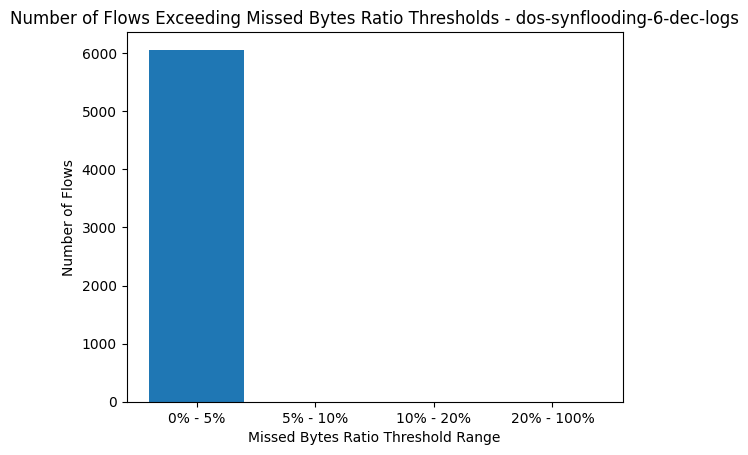

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                  uid  missed_bytes  orig_bytes  resp_bytes       id.orig_h  \
5  Cp7P5q4y2lCSjBvMYc             0         NaN         NaN  222.44.143.247   
6   CYJtEj4XPRfZsINLn             0         NaN         NaN  222.14.182.156   
7  CbQl9a4pEDKmhTFEXk             0         NaN         NaN   222.128.29.90   
8  CJnCZI2l6vUbKQk4kc             0         NaN         NaN  222.27.191.141   
9   Clba434TVKzAwutSb             0         NaN         NaN  222.140.175.95   

   id.orig_p     id.resp_h  id.resp_p proto  
5       5141  192.168.0.13        554   tcp  
6       5237  192.168.0.13        554   tcp  
7       3358  192.168.0.13        554   tcp  
8       3072  192.168.0.13        554   tcp  
9       7494  192.168.0.13        554   tcp  
918 rows with NaN values in both orig_bytes and resp_bytes columns.


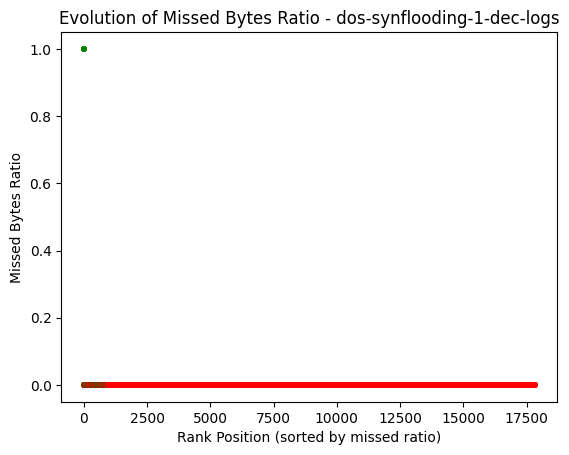

Statistics:
count    17819.000000
mean         0.000281
std          0.016749
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
15961  CJuiX94O0D6NQr7Dcf           1.0  222.176.179.181       1396   
3874   C1fbkb3duAkCIvhth4           1.0   222.207.91.137       1479   
3191   C7njwh3PGhYPhHhxUh           1.0    222.24.30.241       2532   
3241   CXfCYt3I3taPoFE5V3           1.0   222.11.216.137       7589   
17745  C1qFhR2d4FGtBWDRW2           1.0    222.19.78.125       8492   
11872  CtVuYY2MkjD9ET0cwg           0.0    222.213.7.104       8860   
11873  C5wjM94M7YRaHR92ph           0.0  222.110.236.254       5587   
11874   CFruJZdhsPHvyTibe           0.0  222.133.134.195       6209   
11875  Cc1ZB13vm8TteulB18           0.0   222.210.97.176       5233   
11876  CPXMd14vcttRrk53vd     

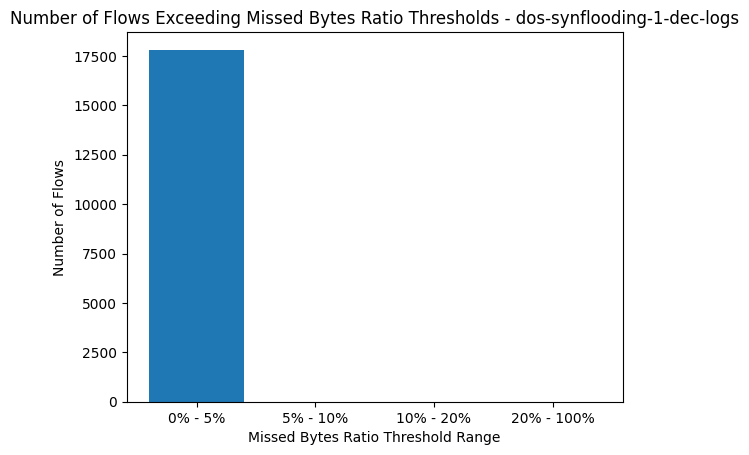

Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:
                   uid  missed_bytes  orig_bytes  resp_bytes        id.orig_h  \
13   CfWxwAAmr3xiy6O9a             0         NaN         NaN  222.122.116.176   
16   CKDgxr2JI5TEo5iG6             0         NaN         NaN  222.188.245.183   
19   CMAGlz75dfe55lWtj             0         NaN         NaN  222.242.211.144   
20  CLFW8R35mOph2hXm27             0         NaN         NaN   222.245.215.30   
21  C8R9iP1Zx59rua4RDe             0         NaN         NaN     192.168.0.13   

    id.orig_p      id.resp_h  id.resp_p proto  
13       5552   192.168.0.13        554   tcp  
16       7893   192.168.0.13        554   tcp  
19       8169   192.168.0.13        554   tcp  
20       7083   192.168.0.13        554   tcp  
21        554  222.34.32.121       1347   tcp  
1056 rows with NaN values in both orig_bytes and resp_bytes columns.


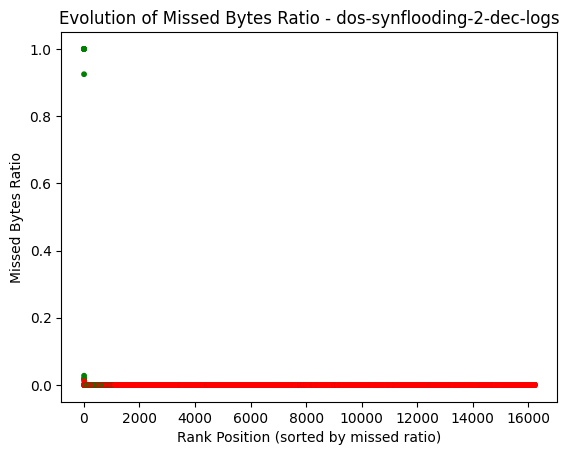

Statistics:
count    16230.000000
mean         0.000556
std          0.023355
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
11346  CDSTTS3IhzM5RlhHCc      1.000000  222.120.115.231       5410   
4533   CgMtrE3iv13c9Bpx6g      1.000000     222.95.96.70       8431   
3149   CZGBj93t5qwa4Mn79i      1.000000    222.79.80.230       4660   
10817  CdzDTS10aeFPOloJOl      1.000000   222.204.16.247       2929   
14349  CsVI993jmmJBOfIRTg      1.000000  222.117.183.126       2581   
13178   CDJd5NM2PsUAwgXQ8      1.000000    222.218.143.2       7349   
2057   CxiWt94LfoBQSbHjJ4      1.000000     222.189.4.31       8664   
8744   Ctemwk47i6iXvkSvFk      1.000000   222.170.54.227       1594   
14779   CJP3yvBpMMR6NOQw5      0.924695     192.168.0.23      48094   
480    CgJPgK3NcEpmiNjTM1     

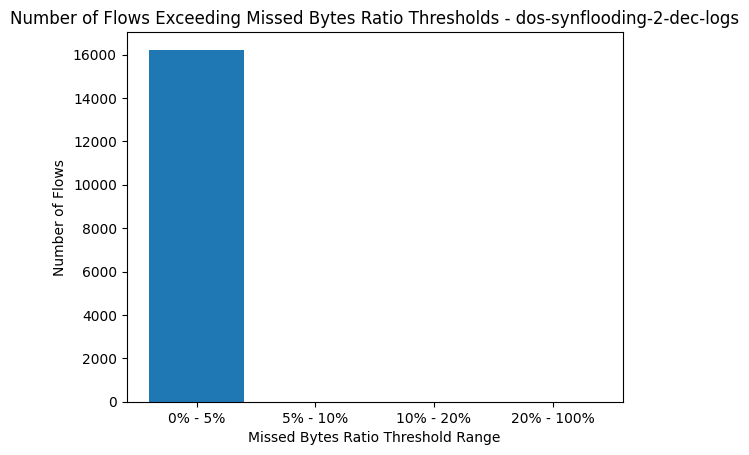

In [14]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Para MITM de momento no

# Para IoT23

In [2]:
! pip install bokeh
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from bokeh.plotting import figure, show, output_file
from bokeh.models import HoverTool

pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

     |████████████████████████████████| 7.0 MB 5.0 MB/s eta 0:00:01
     |████████████████████████████████| 81 kB 32 kB/s s eta 0:00:01


In [5]:
main_directory = "/root/bbdd/logs-zeek/iot-23-logs/labeled-csv/"

In [23]:
def process_conn_log(folder_name, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)], columns=["uid", "missed_bytes", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto", 'binary-label']):
    conn_log_path = os.path.join(main_directory, folder_name)
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        
        # Create Bokeh plot
        p = figure(title=f"Evolution of Missed Bytes Ratio - {folder_name}", x_axis_label="Rank Position (sorted by missed ratio)", y_axis_label="Missed Bytes Ratio")

        # Add hover tool
        hover = HoverTool()
        hover.tooltips = [("Index", "$index"), ("Missed Bytes Ratio", "@missed_ratio")]
        p.add_tools(hover)


        for chunk in pd.read_csv(conn_log_path, usecols=columns, chunksize=50000):
            # Calculate missed_bytes ratio
            chunk['missed_ratio'] = np.where((chunk['missed_bytes'].isna()) | (chunk['missed_bytes'] == 0), 0, pd.to_numeric(chunk['missed_bytes']) / (pd.to_numeric(chunk['orig_bytes']) + pd.to_numeric(chunk['resp_bytes'])))
            if chunk['missed_ratio'].isnull().values.any():
                print("Warning: NaN value detected in missed_ratio column!")
            # Define color based on binary-label
            colors = ['green' if label == 0 else 'red' for label in chunk['binary-label']]
            # Add scatter plot for the chunk
            p.scatter(list(range(1, len(chunk) + 1)), chunk["missed_ratio"], size=10, color=colors, alpha=0.5)

        # Show plot for the chunk
        output_file(f"{folder_name}.html")
        show(p)
        print(f"Saved in: {folder_name}.html")
        # Sort DataFrame by missed_ratio in descending order
        #df_sorted = df_all_chunks.sort_values(by='missed_ratio', ascending=False)
        
        # Print top 15 highest values
        #top_15 = df_sorted.head(15)
        #print("\nTop 15 highest missed_bytes ratios:")
        #print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        #print("\nLeast 15 flows based on missed bytes ratio:")
        #least_15 = df_sorted.tail(15)
        #print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Calculate statistics
        #stats = df_sorted["missed_ratio"].describe()
        #print("Statistics:")
        #print(stats)
        
        # Create a dot plot of missed_bytes ratio evolution
        #plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o',c=df['binary-label'].apply(lambda x: 'red' if x == 1 else 'green'))
        #plt.xlabel("Rank Position (sorted by missed ratio)")
        #plt.ylabel("Missed Bytes Ratio")
        #plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        #plt.show()
        

    else:
        print(f"conn.log not found in {folder_path}")

In [ ]:
json_files = [f for f in os.listdir(main_directory) if f.startswith("json")]
for json_file in json_files:
        process_conn_log(json_file)

SIN USAR BOKEH, QUE NO SE ABREN LOS HTML

In [5]:
main_directory = "/root/bbdd/logs-zeek/iot-23-logs/labeled-csv/"

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

def process_conn_log(folder_name, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)], columns=["uid", "missed_bytes", "orig_bytes", "resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto", 'binary-label']):
    conn_log_path = os.path.join(main_directory, folder_name)
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
       
        missed_ratio_values = []
        binary_labels = [] 
        for i, chunk in enumerate(pd.read_csv(conn_log_path, usecols=columns, chunksize=50000)):
            # Calculate missed_bytes ratio
            chunk['missed_ratio'] = np.where((chunk['missed_bytes'].isna()) | (chunk['missed_bytes'] == 0), 0, pd.to_numeric(chunk['missed_bytes']) / (pd.to_numeric(chunk['orig_bytes']) + pd.to_numeric(chunk['resp_bytes'])))
            if chunk['missed_ratio'].isnull().values.any():
                print("Warning: NaN value detected in missed_ratio column!")

            # Append missed ratio values and chunk number
            missed_ratio_values.extend(chunk['missed_ratio'])
            binary_labels.extend(chunk['binary-label'])
        

        # Define color based on binary-label
        colors = np.where(np.array(binary_labels) == 0, 'green', 'red')
        sorted_values = sorted(missed_ratio_values, reverse=True)

        # Plot missed ratio values against chunk numbers
        plt.figure(figsize=(10, 6))
        plt.scatter(list(range(1, len(sorted_values) + 1)), sorted_values, c=colors, s=10, alpha=0.5)
        plt.title(f"Missed Bytes Ratio vs Chunk Number - {folder_name}")
        plt.xlabel("Chunk Number")
        plt.ylabel("Missed Bytes Ratio")
        plt.savefig(f"{folder_name}_missed_ratio_vs_chunk.png")
        plt.show()

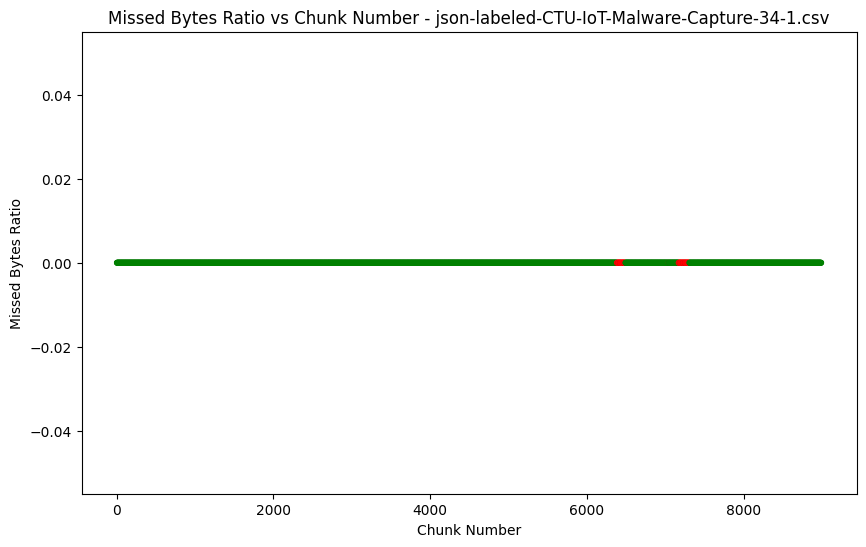

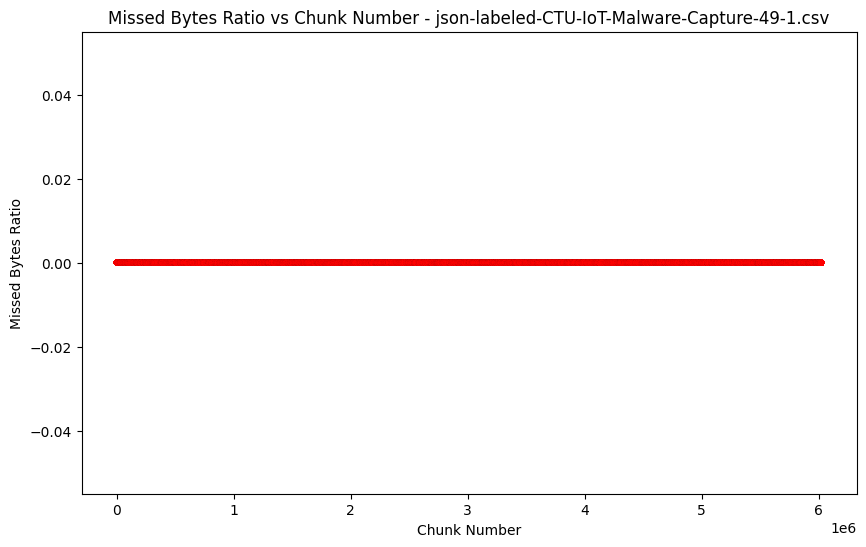

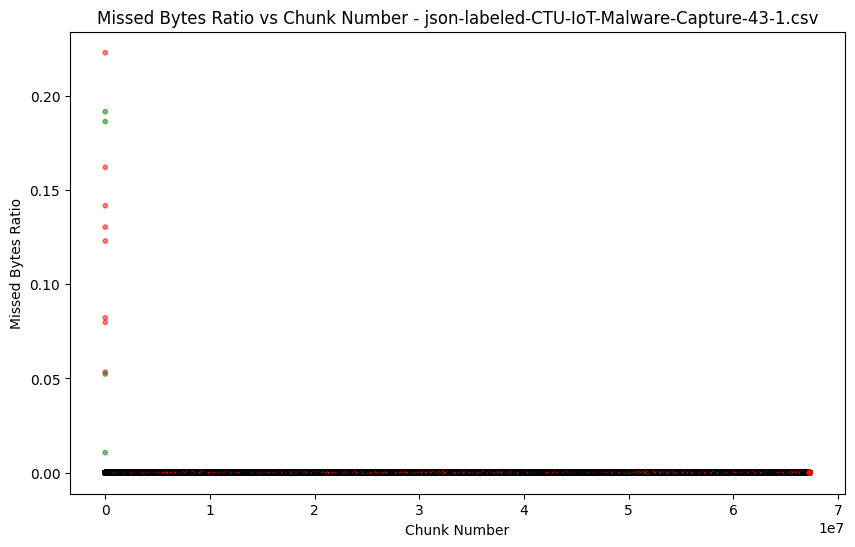

KeyboardInterrupt: 

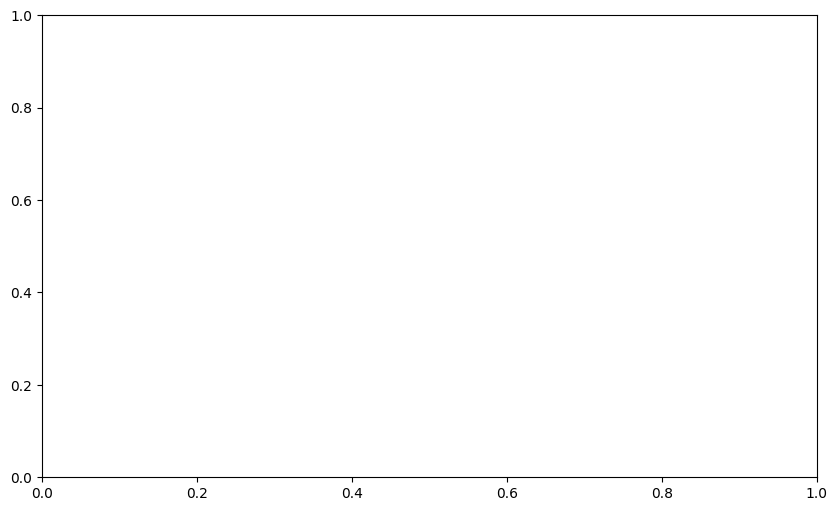

In [28]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Pruebecilla

In [29]:
import pandas as pd

In [33]:
df = pd.read_json("/root/bbdd/logs-zeek/iot-23-logs/CTU-IoT-Malware-Capture-44-1/conn_stadistics.log", lines=True)

In [36]:

# Check unique values in each column
column_name = df.columns[8]  # Assuming column index 8 is the one with mixed types
column_dtype = df[column_name].dtype
print(f"Data type of {column_name}: {column_dtype}")

unique_values = df[column_name].unique()
print(f"Unique values in {column_name}: {unique_values[:5]}")

Data type of proto: object
Unique values in proto: ['tcp' 'udp']


# CIC -IoT-23

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [4]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/mirai-greeth/"

In [5]:
def process_conn_log(folder_path, thresholds=[(0, 0.05), (0.05, 0.1), (0.1, 0.2), (0.2, 1)]):
    conn_log_path = os.path.join(folder_path, "conn_stadistics.log")
    
    # Check if conn.log file exists
    if os.path.exists(conn_log_path):
        # Extract file name from folder path
        folder_name = os.path.basename(folder_path)
        
        # Read conn.log into a DataFrame
        #df = pd.read_json(conn_log_path, lines=True)
        with open(conn_log_path, 'r') as file:
            header_line = file.readlines()[6].strip().split('\t')[1:]
        df = pd.read_csv(conn_log_path, sep='\t', skiprows=8, names=header_line, skipfooter=1, engine='python')

        # Sample 5 flows with NaN values in either orig_bytes or resp_bytes before dropping
        nan_flows = df[df['orig_bytes'].isnull() | df['resp_bytes'].isnull()].head(5)
        if not nan_flows.empty:
            print("Sample of 5 flows with NaN values in either orig_bytes or resp_bytes:")
            print(nan_flows[["uid","missed_bytes","orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Notify and count rows with NaN values in both orig_bytes and resp_bytes columns
        nan_count = df[df['orig_bytes'].isnull() & df['resp_bytes'].isnull()].shape[0]
        if nan_count > 0:
            print(f"{nan_count} rows with NaN values in both orig_bytes and resp_bytes columns.")
        # Función para identificar y manejar valores no numéricos
        
        def safe_to_numeric(series, column_name):
            # Identificar valores no numéricos
            non_numeric = pd.to_numeric(series, errors='coerce').isna() & series.notna()
            if non_numeric.any():
                print(f"Non-numeric values found in column {column_name}:")
                print(series[non_numeric])
            # Reemplazar valores no numéricos con NaN
            return pd.to_numeric(series, errors='coerce')

        # Convertir las columnas a tipo numérico de manera segura
        df['missed_bytes'] = safe_to_numeric(df['missed_bytes'], 'missed_bytes')
        df['orig_bytes'] = safe_to_numeric(df['orig_bytes'], 'orig_bytes')
        df['resp_bytes'] = safe_to_numeric(df['resp_bytes'], 'resp_bytes')

        # Calculate missed_bytes ratio
        df['missed_ratio'] = np.where((df['missed_bytes'].isna()) | (df['missed_bytes'] == 0), 0, (df['missed_bytes']) / (df['orig_bytes'] + df['resp_bytes']))      
        
        # Sort DataFrame by missed_ratio in descending order
        df_sorted = df.sort_values(by='missed_ratio', ascending=False)
        
        # Create a dot plot of missed_bytes ratio evolution
        plt.scatter(range(1, len(df_sorted) + 1), df_sorted["missed_ratio"], s=10, marker='o')
        plt.xlabel("Rank Position (sorted by missed ratio)")
        plt.ylabel("Missed Bytes Ratio")
        plt.title(f"Evolution of Missed Bytes Ratio - {folder_name}")
        plt.show()
        
        # Calculate statistics
        stats = df_sorted["missed_ratio"].describe()
        print("Statistics:")
        print(stats)
        
        # Print top 15 highest values
        top_15 = df_sorted.head(15)
        print("\nTop 15 highest missed_bytes ratios:")
        print(top_15[["uid", "missed_ratio", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])
        
        # Print the least 15 flows based on missed bytes ratio
        print("\nLeast 15 flows based on missed bytes ratio:")
        least_15 = df_sorted.tail(15)
        print(least_15[["uid", "missed_ratio", "orig_bytes","resp_bytes", "id.orig_h", "id.orig_p", "id.resp_h", "id.resp_p", "proto"]])

        # Initialize lists to store counts for each threshold range
        threshold_counts = [0] * len(thresholds)
        
        # Count number of flows in each threshold range
        for i, (lower, upper) in enumerate(thresholds):
            if upper is None:
                num_flows = (df_sorted['missed_ratio'] >= lower).sum()
            else:
                num_flows = ((df_sorted['missed_ratio'] >= lower) & (df_sorted['missed_ratio'] <= upper)).sum()
            threshold_counts[i] = num_flows
        
        # Create grouped bar plot for the number of flows exceeding each threshold range
        threshold_ranges = [f"{int(lower * 100)}% - {int(upper * 100)}%" if upper is not None else f"> {int(lower * 100)}%" for lower, upper in thresholds]
        plt.bar(threshold_ranges, threshold_counts)
        plt.xlabel("Missed Bytes Ratio Threshold Range")
        plt.ylabel("Number of Flows")
        plt.title(f"Number of Flows Exceeding Missed Bytes Ratio Thresholds - {folder_name}")
        plt.show()

    else:
        print(f"conn.log not found in {folder_path}")

Non-numeric values found in column orig_bytes:
4          -
6          -
8          -
11         -
12         -
          ..
3346639    -
3346640    -
3346643    -
3346644    -
3346647    -
Name: orig_bytes, Length: 3342113, dtype: object
Non-numeric values found in column resp_bytes:
4          -
6          -
8          -
11         -
12         -
          ..
3346639    -
3346640    -
3346643    -
3346644    -
3346647    -
Name: resp_bytes, Length: 3342113, dtype: object


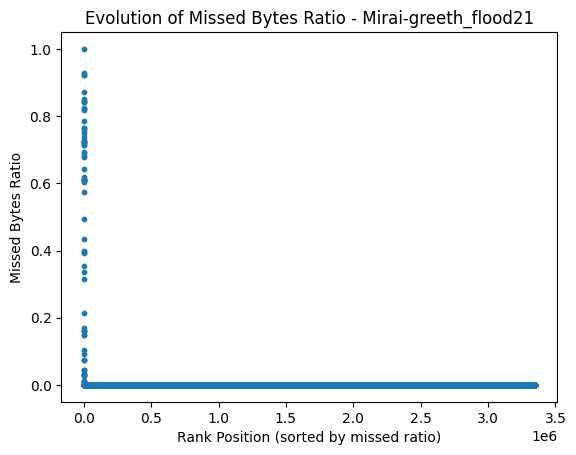

Statistics:
count    3.346652e+06
mean     1.029961e-05
std      2.665536e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999322e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
714544   CHQxz31dURSzn64834      0.999932  192.168.137.129      57237   
2847142   CwmRINuT8m2L2uY6j      0.929149   192.168.137.68      60478   
770026    Cc8JJF8mDv8nZVNig      0.921778   192.168.137.68      33076   
769911    CA0t4onOcZG1tuwPi      0.921778   192.168.137.68      47842   
2121247  CYT91143FldPpwHDX4      0.871903  192.168.137.103      60326   
769912   ClJpJu1UbP3Oimjnx5      0.852339  192.168.137.209      38794   
769948    Cn73pt4dVSUlFVz6e      0.845612  192.168.137.100      54625   
1036116  CAszez4EdDiVOH9QMk      0.843125   192.168.137.38      37134   
623210   C0ZhFL3DXwicmovUlh      0.843125   192.168.137.38      37088   
769929    

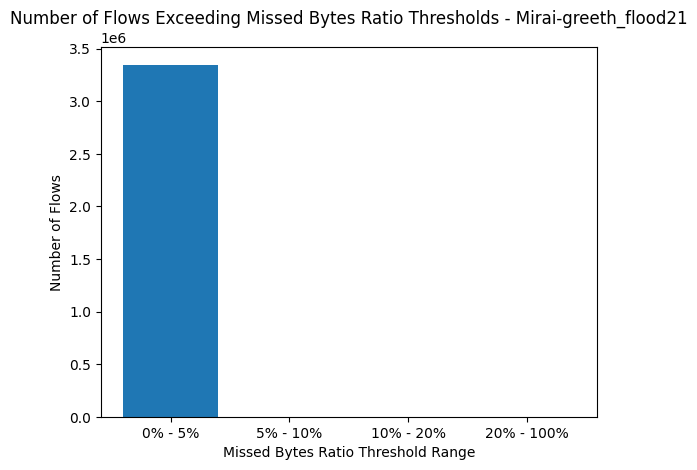

Non-numeric values found in column orig_bytes:
1          -
8          -
26         -
31         -
35         -
          ..
3346595    -
3346596    -
3346601    -
3346604    -
3346606    -
Name: orig_bytes, Length: 3340199, dtype: object
Non-numeric values found in column resp_bytes:
1          -
8          -
26         -
31         -
35         -
          ..
3346595    -
3346596    -
3346601    -
3346604    -
3346606    -
Name: resp_bytes, Length: 3340199, dtype: object


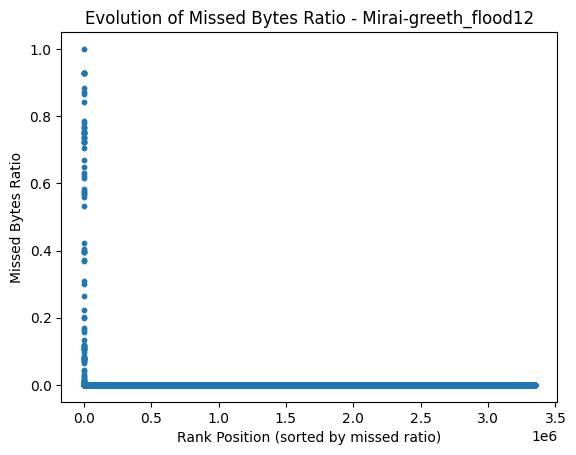

Statistics:
count    3.346608e+06
mean     1.138481e-05
std      2.739509e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2971244   CCtxeg4Y3njJCGFIj      1.000000  192.168.137.108      34486   
2971253  CxPJlA1GmzJfx8qKNi      0.929149   192.168.137.68      45578   
2971265  CbCAOL2JQVRDn1WX9e      0.929149   192.168.137.17      54264   
298912   CPcHCr28HK4idBaKYh      0.929138   192.168.137.17      39774   
298970   CwAi6P2iiWQNAliTUa      0.929138   192.168.137.68      57174   
298982    C9fgFv3Km5mAsZiTl      0.929138   192.168.137.17      37822   
298883   C3sTPC2wWmmiHZnnc4      0.883583   192.168.137.29      45350   
2971248  CcsBkQ1Ch4BWPLaZih      0.870310  192.168.137.191      44332   
298911   CLpUeY1Y69ZaC1T8a9      0.865106  192.168.137.108      59222   
1403260  C

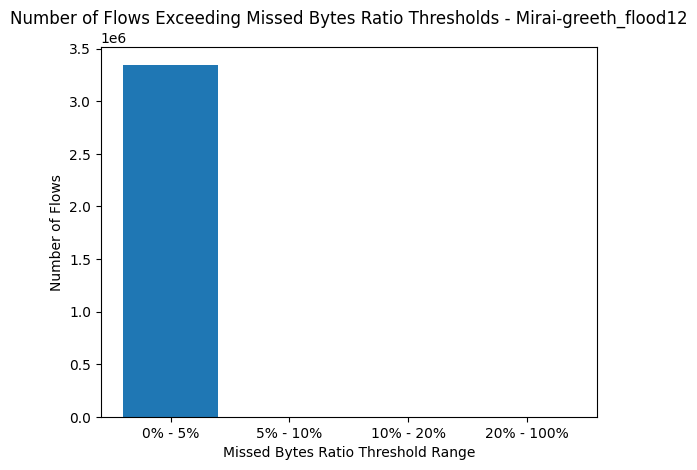

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
3          -
4          -
          ..
3354029    -
3354031    -
3354034    -
3354037    -
3354039    -
Name: orig_bytes, Length: 3350766, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
3          -
4          -
          ..
3354029    -
3354031    -
3354034    -
3354037    -
3354039    -
Name: resp_bytes, Length: 3350766, dtype: object


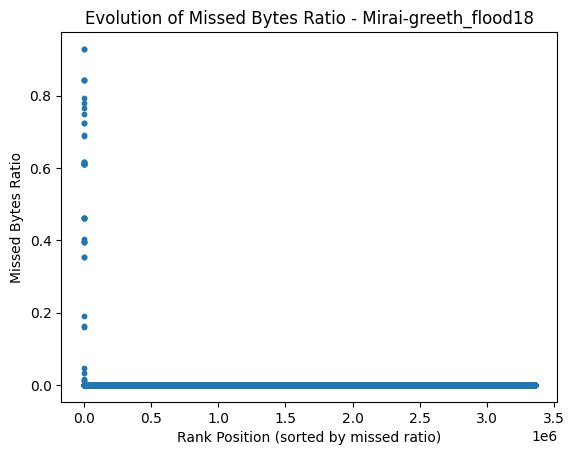

Statistics:
count    3.354041e+06
mean     6.396816e-06
std      2.029908e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.291486e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1718458   CQX1ZKaEEOalEJu1e      0.929149   192.168.137.68      44340   
1718490  CFSftl25XsKZAb53Nh      0.929149   192.168.137.17      36580   
2197278  CseLif1Z0q3pYPN4Mk      0.843333    192.168.137.1      47284   
2197279   CXDkRjHMMyDlHFNsg      0.843333    192.168.137.1      47285   
1078466   Cf3ihg7dkig79uNcj      0.843125   192.168.137.38      39948   
1986865  CX7qkl3vJ93f9l2k86      0.793103  192.168.137.206      57980   
3353389   CXLL61jJ82zpKXzu7      0.779299  192.168.137.162      43892   
1718444  CfRZcA3Qf9VFHYND3i      0.765316  192.168.137.120      35080   
1718443  CCZptM2M2vfgRuPbf7      0.748744  192.168.137.120      36036   
678345   C

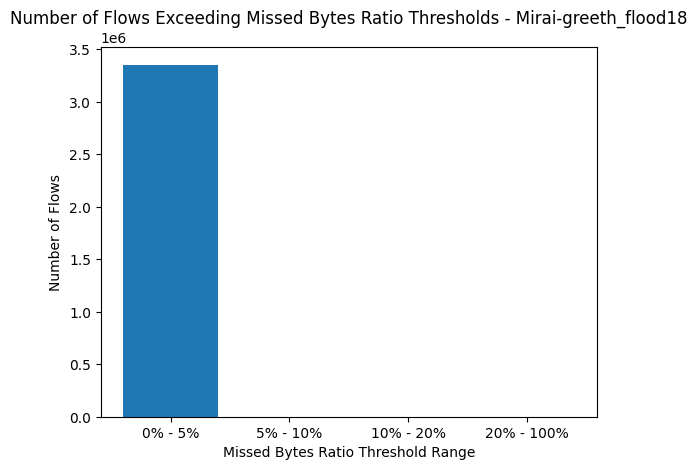

Non-numeric values found in column orig_bytes:
2          -
10         -
11         -
12         -
14         -
          ..
3355772    -
3355773    -
3355777    -
3355779    -
3355780    -
Name: orig_bytes, Length: 3351454, dtype: object
Non-numeric values found in column resp_bytes:
2          -
10         -
11         -
12         -
14         -
          ..
3355772    -
3355773    -
3355777    -
3355779    -
3355780    -
Name: resp_bytes, Length: 3351454, dtype: object


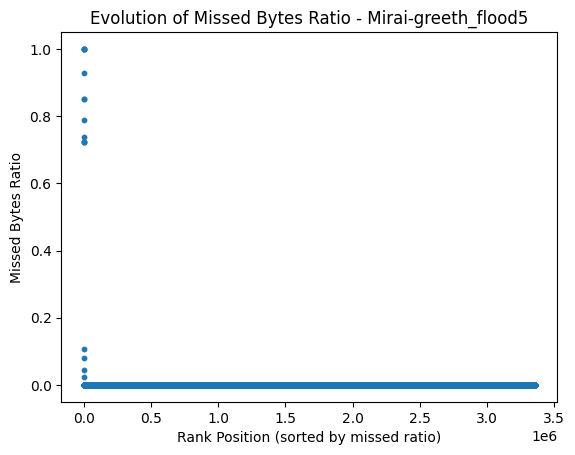

Statistics:
count    3.355782e+06
mean     3.154008e-06
std      1.643833e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999998e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
979066   COzEKo37F6GBXuu72f      1.000000   192.168.137.29      40928   
930711   C7YV2O2Oh0v6SbmJu3      0.999999   192.168.137.29      40924   
865512   CdFlFl1MBsZh0hrPA1      0.999998   192.168.137.29      50923   
3355670  CAcovz4MinPJ1zipM5      0.999996  192.168.137.129      52229   
1332599  CZqAKU1a94AjxcqZae      0.929138   192.168.137.68      50914   
13        CwN00q331xWsjghv7      0.852144  192.168.137.190      54268   
2158279   C6zVElgZLV0juRBQ1      0.852144  192.168.137.190      54403   
2791481  CdliqV2vMpSYUBwvt3      0.787669   192.168.137.94      43454   
1632468    CDEMux7Jx8PzJyMa      0.737190   192.168.137.38      56950   
1337346  C

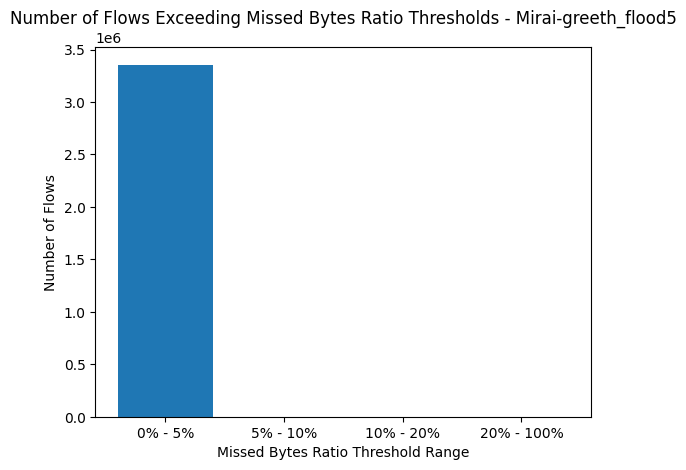

Non-numeric values found in column orig_bytes:
2          -
4          -
7          -
8          -
13         -
          ..
3353942    -
3353943    -
3353950    -
3353952    -
3353956    -
Name: orig_bytes, Length: 3349703, dtype: object
Non-numeric values found in column resp_bytes:
2          -
4          -
7          -
8          -
13         -
          ..
3353942    -
3353943    -
3353950    -
3353952    -
3353956    -
Name: resp_bytes, Length: 3349703, dtype: object


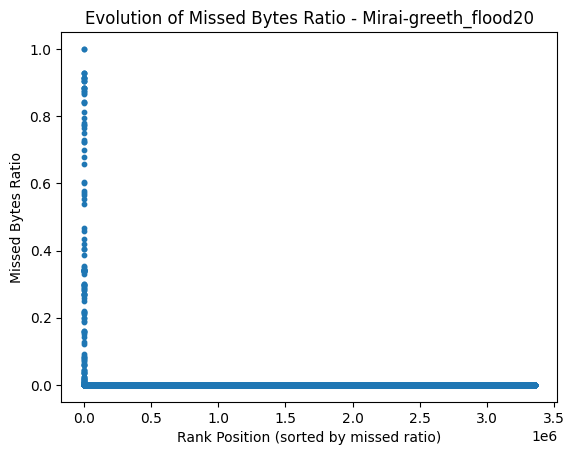

Statistics:
count    3.353962e+06
mean     1.550833e-05
std      3.149762e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999976e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2125640  CdMRh73PRyV8if3MO5      0.999998  192.168.137.129      57172   
1667371   Cvb8cSyB29HntCB8e      0.999990   192.168.137.80      51689   
65855    CHzvLy2hL7mVMQLvSc      0.929149   192.168.137.68      42812   
2084914   CCPkROD8IKe9HRMDi      0.927853  192.168.137.209      40233   
1016712  CfS5Ne3hLcoeTSYrXg      0.927458  192.168.137.209      47820   
736044   CpwhFB4D8GRWkDB9Z3      0.912283   192.168.137.58      51686   
738276   CHRxFz2Xy1IupzBBS5      0.912283   192.168.137.58      42204   
739823   CZzmDy2V3Pw5t4uvil      0.912283   192.168.137.58      43112   
737102    CVZYRsPRUHo9EHQq5      0.912126   192.168.137.58      57722   
738597    

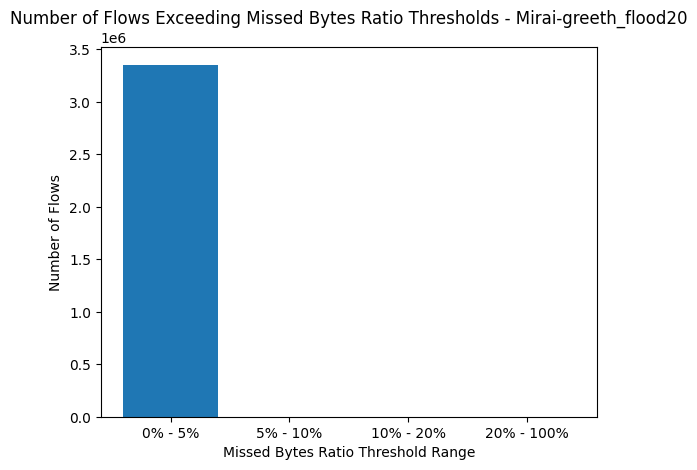

Non-numeric values found in column orig_bytes:
0          -
1          -
3          -
4          -
5          -
          ..
3362145    -
3362146    -
3362149    -
3362155    -
3362157    -
Name: orig_bytes, Length: 3357150, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
3          -
4          -
5          -
          ..
3362145    -
3362146    -
3362149    -
3362155    -
3362157    -
Name: resp_bytes, Length: 3357150, dtype: object


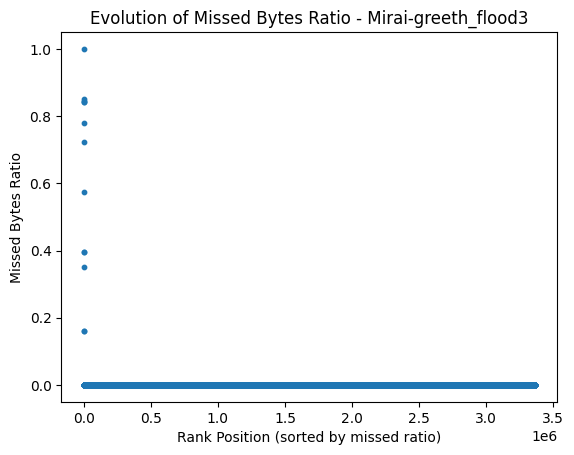

Statistics:
count    3.362159e+06
mean     2.357648e-06
std      1.314721e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999997e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1100769  Ch0HNo4UHUHiI0oc6l      1.000000  192.168.137.112      61748   
793294   CRKL6C11VfT12HUaKg      0.852144  192.168.137.190      54041   
8        CFV18B4vLoyS69Xn4g      0.845628  192.168.137.100      53324   
600133   Cr8oG92mB38HP2wDS1      0.843125   192.168.137.38      54020   
1570500  CbNs084LmnZYyB0rbi      0.843125   192.168.137.38      51028   
1101395  CUtfN63XFCAc4MMRHi      0.778813   192.168.137.58      43552   
1860671  C53mKe3LosHMdi6Nzc      0.723091  192.168.137.103      56647   
2862121   CYBDXw3LX0rcJClqe      0.573922  192.168.137.100      60740   
3362132   CPnfVBw27Scl0ZpF5      0.396070  192.168.137.100      43258   
1100765  C

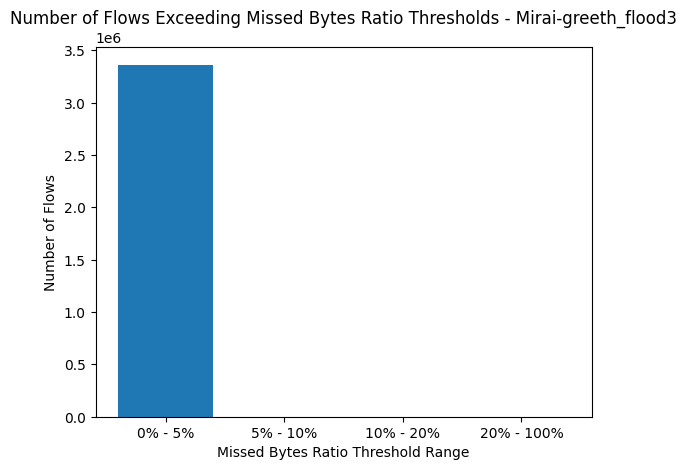

Non-numeric values found in column orig_bytes:
0          -
1          -
4          -
5          -
6          -
          ..
3320698    -
3320701    -
3320705    -
3320710    -
3320713    -
Name: orig_bytes, Length: 3311184, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
4          -
5          -
6          -
          ..
3320698    -
3320701    -
3320705    -
3320710    -
3320713    -
Name: resp_bytes, Length: 3311184, dtype: object


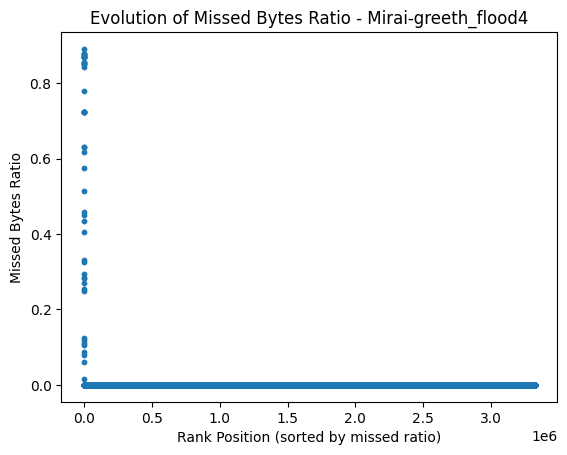

Statistics:
count    3.320719e+06
mean     8.083952e-06
std      2.408569e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      8.909666e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
746415   ClP1of4YX3ldvLCY8e      0.890967  192.168.137.103      55917   
746519   CJ1Arp4tY6ueBXalLk      0.878475  192.168.137.103      58660   
2842228  CowA6A1eSkRrNmBhC1      0.878475  192.168.137.103      40174   
2842182  CBux5S2OcUM4hYBdbf      0.878475  192.168.137.103      47064   
746414   CsRAbb43Pbvf5kFmz8      0.878475  192.168.137.103      58657   
662577   CdGBvq3pay5bQ7poC3      0.872514  192.168.137.217      53982   
2842214  CoAsuO3f0PmXoqUFbc      0.868886  192.168.137.103      45214   
2842183   CwmZtrI8j5fY6PEQ8      0.868886  192.168.137.103      45213   
2842855  C5QDeq2SMzVQSWccf8      0.868766  192.168.137.103      47066   
746357   C

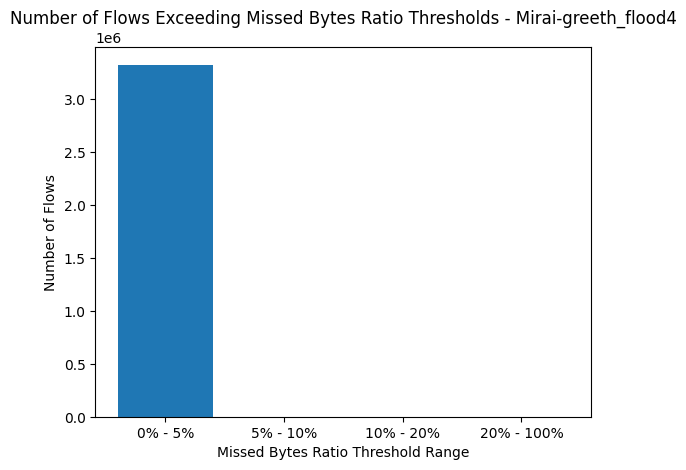

Non-numeric values found in column orig_bytes:
3          -
4          -
5          -
9          -
10         -
          ..
3307501    -
3307509    -
3307511    -
3307514    -
3307515    -
Name: orig_bytes, Length: 3299353, dtype: object
Non-numeric values found in column resp_bytes:
3          -
4          -
5          -
9          -
10         -
          ..
3307501    -
3307509    -
3307511    -
3307514    -
3307515    -
Name: resp_bytes, Length: 3299353, dtype: object


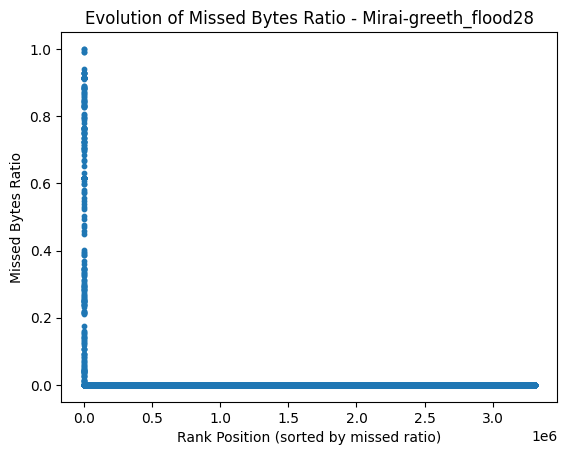

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3307517.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1887612  Ct1bpr1PVjzonh9zFg           inf  192.168.137.248      60652   
45164    CYbtdE3AjTD1sEqvAe      1.000000   192.168.137.29      43481   
3307333  CWPqb74Rcz4lDzUUMi      0.999992  192.168.137.254      53424   
321896   CKIbsL1OABC2lF7gxc      0.991599  192.168.137.129      60363   
321897   CGw3oN1Teiy4SlfYCl      0.991594  192.168.137.129      60364   
1762369  CJsdjR1mBvSqp2Myoi      0.941001  192.168.137.129      60372   
321879   C2lD112Gx6I9jbEXk5      0.929149   192.168.137.17      55472   
868137    CJDURhaLcQysry2ze      0.929138   192.168.137.17      51026   
321949    C8ZQAN0xKGS44bCpb      0.929138   192.168.137.68      36778   
120560   CtqHer2bf3QqLuv47j      0

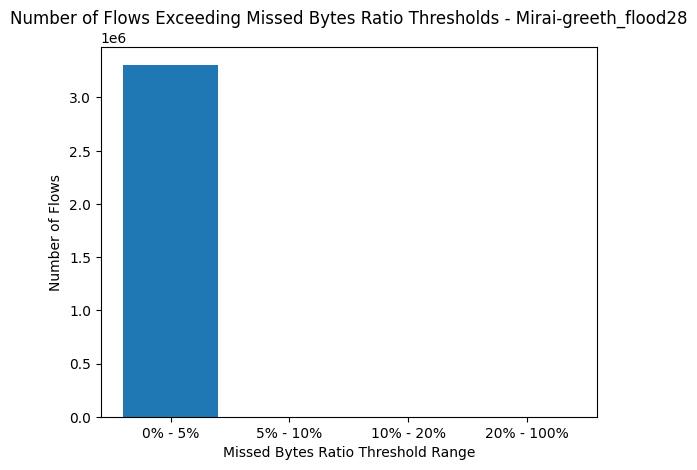

Non-numeric values found in column orig_bytes:
0          -
1          -
3          -
4          -
12         -
          ..
3346684    -
3346695    -
3346697    -
3346702    -
3346705    -
Name: orig_bytes, Length: 3338563, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
3          -
4          -
12         -
          ..
3346684    -
3346695    -
3346697    -
3346702    -
3346705    -
Name: resp_bytes, Length: 3338563, dtype: object


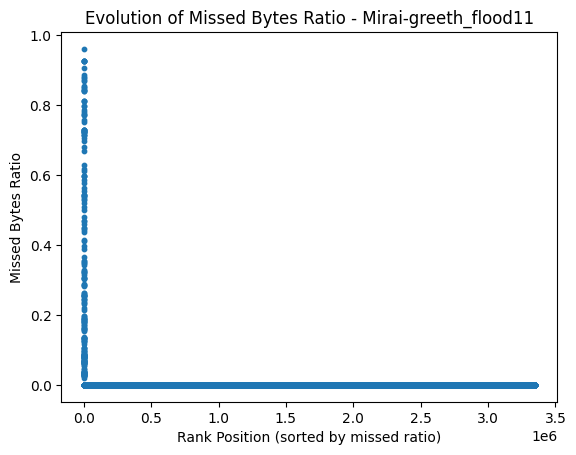

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3346708.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1382175  CmmTH63tktSfJVKWSe           inf  192.168.137.163      40671   
513318   ChlG6u1TXWnWDkkdsk      0.961355  192.168.137.142      49581   
2511826  C4bFWw3dXa5XjzN1y6      0.927739   192.168.137.77      46530   
2268144  C7yHsm2STr7VkHjMa7      0.927739   192.168.137.77      49623   
2212220   CAzEMi4KaGvn8HoUM      0.927739   192.168.137.77      46536   
2232899  CBoClg2OyLxovIVpNk      0.925408   192.168.137.77      54571   
516094   C2REqa2a9vKQvRYuCg      0.925408   192.168.137.77      49545   
2591394   C88PDf0zi53uxrVR8      0.907708  192.168.137.242      59074   
2511877  CBq4Vq3OUOWvNFVpSk      0.885961   192.168.137.94      38150   
2608696  C9Otzr2po8pxB0zFO9      0

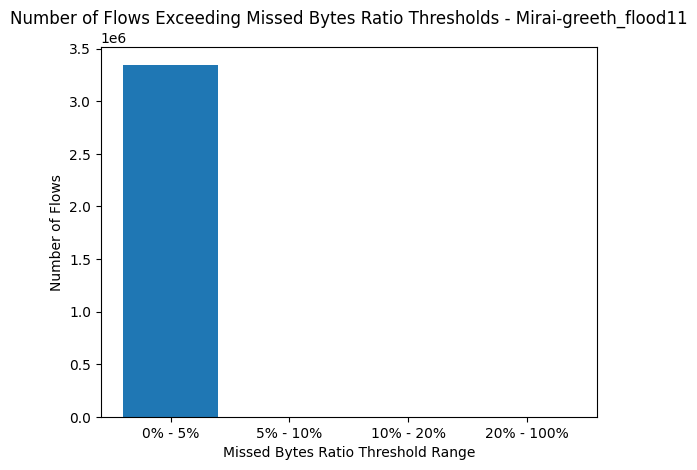

Non-numeric values found in column orig_bytes:
4          -
5          -
6          -
7          -
8          -
          ..
3352642    -
3352643    -
3352644    -
3352645    -
3352647    -
Name: orig_bytes, Length: 3349851, dtype: object
Non-numeric values found in column resp_bytes:
4          -
5          -
6          -
7          -
8          -
          ..
3352642    -
3352643    -
3352644    -
3352645    -
3352647    -
Name: resp_bytes, Length: 3349851, dtype: object


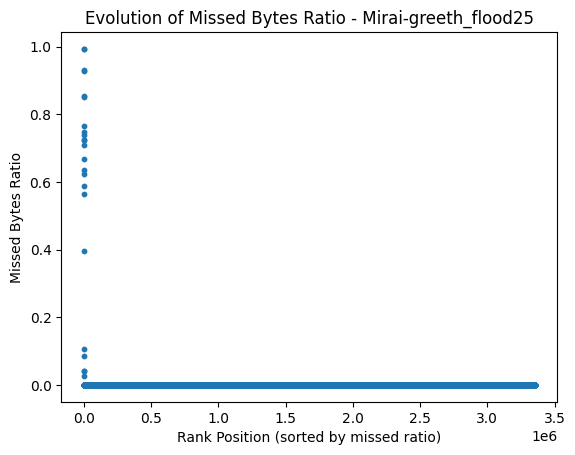

Statistics:
count    3.352649e+06
mean     4.094383e-06
std      1.767113e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.928977e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
3063300  CZkCzb4NO6maObVad7      0.992898  192.168.137.174      44732   
3063314  CfsYaQ1qe20hrBaDHb      0.991773  192.168.137.129      59648   
3063299  CkKaob3IrzLmDCz1N6      0.929149   192.168.137.17      57058   
3063321  CEKnv02X9eDF6CfOC9      0.929004   192.168.137.68      49212   
3063315  Cu0n5F4FV5XZH18mLl      0.854970  192.168.137.129      59647   
64873    ChsJSx1JQoRkQe8Q7j      0.852144  192.168.137.190      60973   
3063319  CeZCJf1paiLsWbeaM7      0.765316  192.168.137.237      58888   
3063333  CdNV0449Bsx53Q3NDe      0.748744  192.168.137.237      35109   
2242096   CfYslPrQhi6V4gtIb      0.737337   192.168.137.38      53526   
452057   C

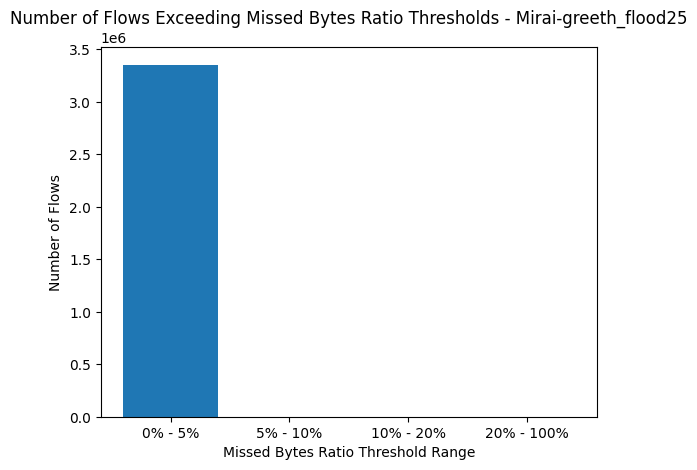

Non-numeric values found in column orig_bytes:
2          -
5          -
6          -
15         -
16         -
          ..
3332452    -
3332453    -
3332458    -
3332460    -
3332463    -
Name: orig_bytes, Length: 3325292, dtype: object
Non-numeric values found in column resp_bytes:
2          -
5          -
6          -
15         -
16         -
          ..
3332452    -
3332453    -
3332458    -
3332460    -
3332463    -
Name: resp_bytes, Length: 3325292, dtype: object


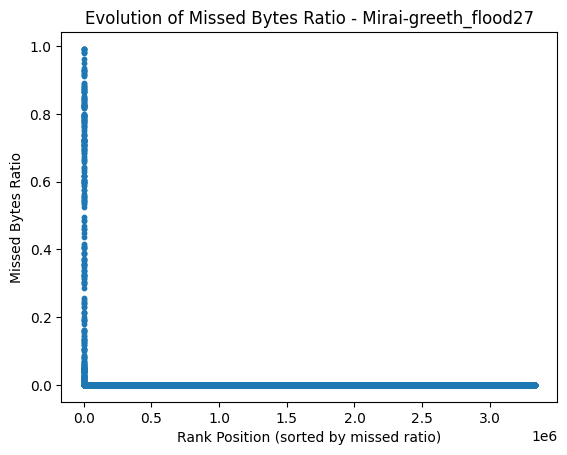

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3332468.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2129415   C8sc9MwtYFbDcOJ6f           inf  192.168.137.163      57390   
2613103  CYCYJz1ObneGX9QTec      0.991603  192.168.137.129      60288   
2613101  CKKoaO3r7vHKLouELe      0.991599  192.168.137.129      60292   
2613100  CqyQog2BchMBEh4Ht7      0.991597  192.168.137.129      60291   
2613098  CAJY1k4ACITzdPhcz3      0.991595  192.168.137.129      60294   
3332401  CWY1Z345FD5sqXLCzl      0.983953  192.168.137.129      60247   
2613102  CbRzVM38r7ppmGj3m1      0.981902  192.168.137.129      60296   
3332412   C7hLbL30A1h9ope1o      0.978454  192.168.137.129      60235   
2612965  CmpUcK2ORJtczyXfn4      0.962847  192.168.137.129      60281   
2612848  CtrgGf2iyIM47RU0F5      0

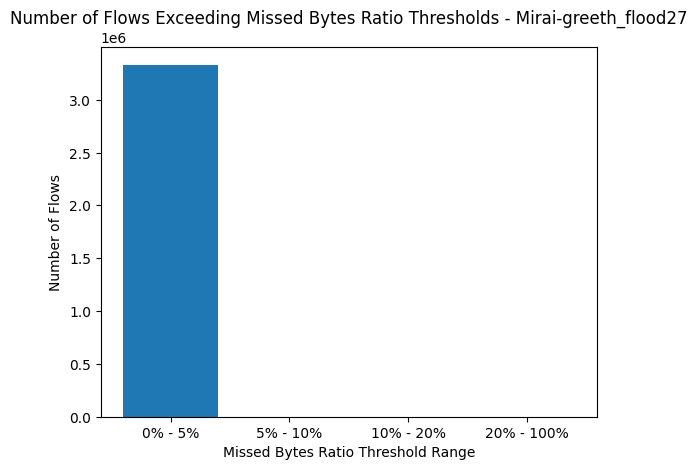

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
3          -
9          -
          ..
3360490    -
3360492    -
3360493    -
3360495    -
3360499    -
Name: orig_bytes, Length: 3357673, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
3          -
9          -
          ..
3360490    -
3360492    -
3360493    -
3360495    -
3360499    -
Name: resp_bytes, Length: 3357673, dtype: object


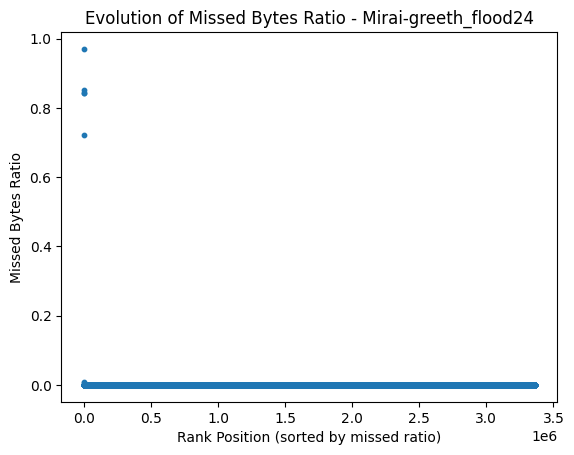

Statistics:
count    3.360502e+06
mean     1.264093e-06
std      1.036912e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.703690e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2355660  CurRdj1D6w4GjEnwAi      0.970369  192.168.137.142      49743   
131      CsOOw63BSqhdFP4yw4      0.852144  192.168.137.190      60786   
1121256  CH0ckS2tor3oRZYXma      0.843333    192.168.137.1       1324   
1121235  CZfNrA2SPFCDmW5Cj1      0.843333    192.168.137.1       1323   
16       CHwbOq1lboDI20Plbk      0.723091  192.168.137.103      44521   
271232   Cwvghf3nuLimeUm8a2      0.009202   192.168.137.80      35620   
2090339  CvJqC92KhZIZwWlBkk      0.006067   192.168.137.80      56411   
271209   CJJVBu4hUoTsaCZRW4      0.000441   192.168.137.47      52450   
271210   CLmsUz2kjkCBnmRooc      0.000007   192.168.137.47      52452   
2240338  C

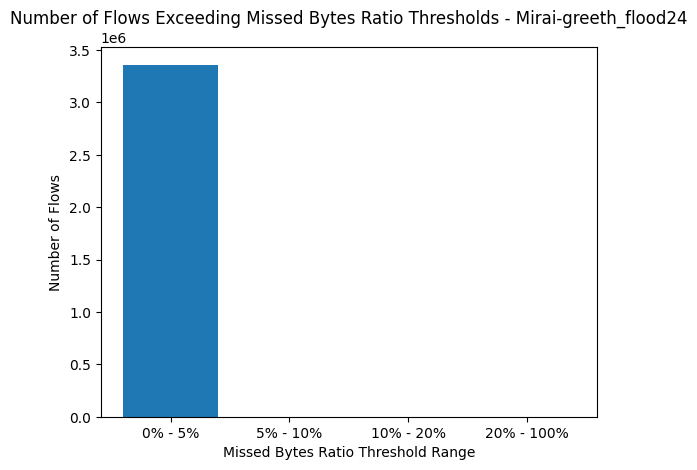

Non-numeric values found in column orig_bytes:
3          -
4          -
5          -
6          -
8          -
          ..
3336966    -
3336968    -
3336974    -
3336975    -
3336980    -
Name: orig_bytes, Length: 3332533, dtype: object
Non-numeric values found in column resp_bytes:
3          -
4          -
5          -
6          -
8          -
          ..
3336966    -
3336968    -
3336974    -
3336975    -
3336980    -
Name: resp_bytes, Length: 3332533, dtype: object


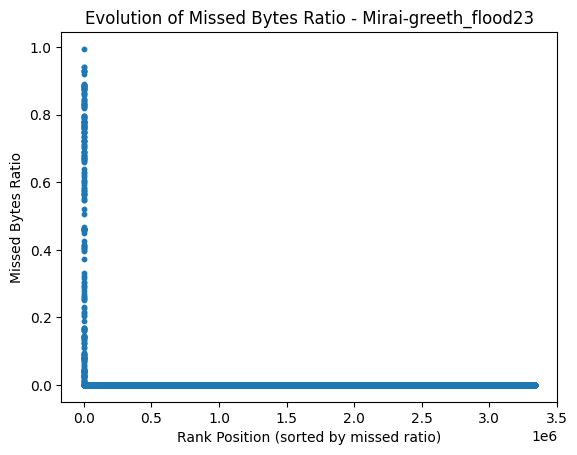

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3336982.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
209736    C9O9ZNbDZ2Bjdnyde           inf  192.168.137.163      53601   
748755    Ccl1VxjpbrOaUZwxg      0.994818  192.168.137.254      49200   
1022610  Co4C8o2ZbO7POVBWAc      0.940211  192.168.137.129      58348   
303844   CyYO7v3j9vXiMzCusg      0.939860   192.168.137.58       9932   
873355   CWJJXR3xe1iHynWFPc      0.929138   192.168.137.17      50960   
796206   CJ5c0S329tDjyaUFwl      0.929138   192.168.137.68      38874   
873586   CpxhZB4k0SlS7iii0f      0.929138   192.168.137.68      45120   
594093   CQGNFy1XISWGx41dYg      0.928905  192.168.137.209      54830   
873415   CvINRO24Q5XfP9oCY9      0.919194  192.168.137.174      36940   
1022519  CxpYDU2lwN5rNNmxSi      0

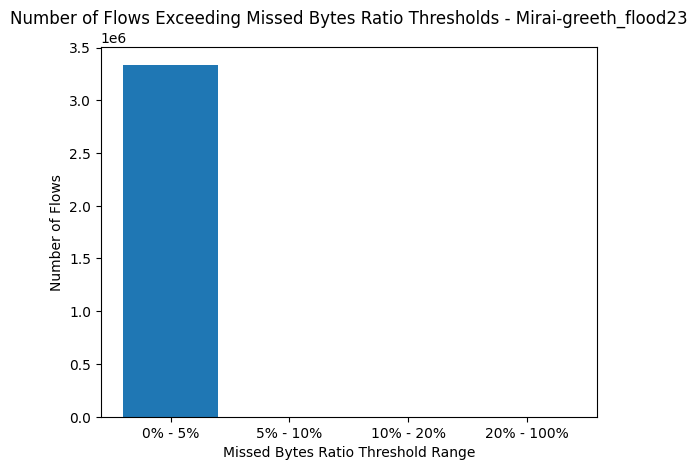

Non-numeric values found in column orig_bytes:
0          -
2          -
3          -
4          -
5          -
          ..
3354870    -
3354871    -
3354874    -
3354875    -
3354877    -
Name: orig_bytes, Length: 3349076, dtype: object
Non-numeric values found in column resp_bytes:
0          -
2          -
3          -
4          -
5          -
          ..
3354870    -
3354871    -
3354874    -
3354875    -
3354877    -
Name: resp_bytes, Length: 3349076, dtype: object


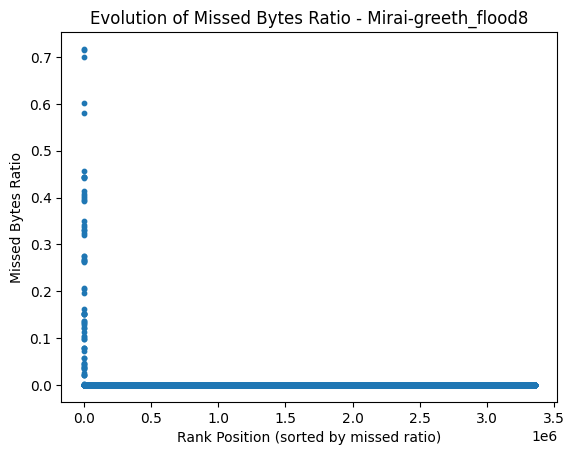

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3354879.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
746671   CEnG3B1JqJRoMXs5Xe           inf  192.168.137.190      41154   
693017   CZ9LsZ3lYQHhHbJoJf           inf  192.168.137.248      44050   
693370   CPgxxH3DifdTFpCX61      0.717489  192.168.137.248      44048   
2819031  CXEPJd31s97Fl9XUg8      0.715247  192.168.137.248      37936   
2743354  CMKRJX3piujP1g80u5      0.700464  192.168.137.100      55524   
3353696  ClDouT2NukGZle10Ni      0.601387  192.168.137.100      58488   
3354832  CmkUN83Z4toqAU1aDf      0.580127   192.168.137.61      24486   
421393   CNuqn84imPJROBKVTh      0.457258  192.168.137.142      49430   
693385    CpNGx9J4im9H1HZ9c      0.444070  192.168.137.248      41044   
693382    CI1LOd9A8FkTKNJle      0

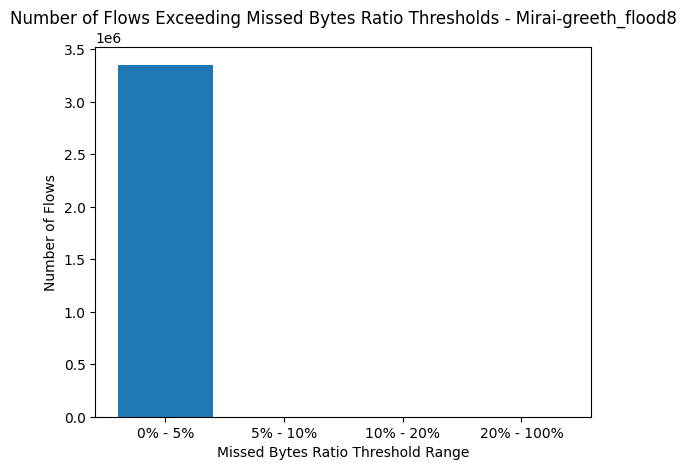

Non-numeric values found in column orig_bytes:
1          -
3          -
4          -
5          -
6          -
          ..
3359549    -
3359550    -
3359552    -
3359554    -
3359558    -
Name: orig_bytes, Length: 3355914, dtype: object
Non-numeric values found in column resp_bytes:
1          -
3          -
4          -
5          -
6          -
          ..
3359549    -
3359550    -
3359552    -
3359554    -
3359558    -
Name: resp_bytes, Length: 3355914, dtype: object


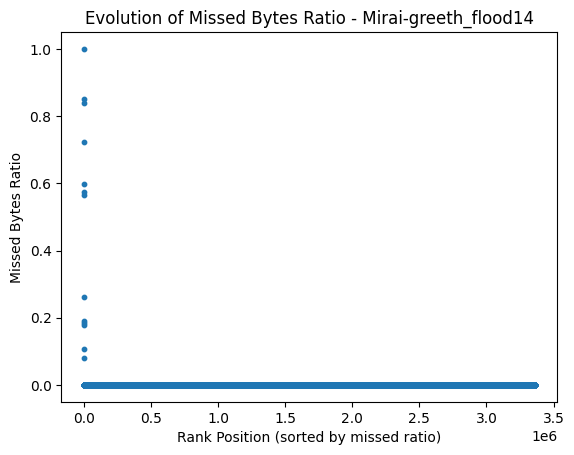

Statistics:
count    3.359560e+06
mean     1.831184e-06
std      1.110768e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999911e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2803053     CuYT8bLmvXa9fF2      0.999991  192.168.137.129      54843   
267105   C7dq8u1KI7eO4M6kdh      0.852144  192.168.137.190      33640   
3140397  Cq0y9D2YhQ2E8oU3f3      0.838333  192.168.137.100      58874   
1830849  Cv0fCG2PyL2wdVKZRc      0.723176  192.168.137.103      38046   
3178191  CfmbRX1ORyQzHXQAca      0.596795  192.168.137.100      58875   
1032902  CB1REt2iMeYTiCoZS2      0.573067  192.168.137.100      32925   
2790572    CENPJVEbrybA0Ctg      0.565027  192.168.137.129      54892   
2394383  CWee9H2a60jItgjZXa      0.263104  192.168.137.129      54880   
3359527  CCLGN04EUKizQb58l3      0.189633  192.168.137.100      43680   
3331721  C

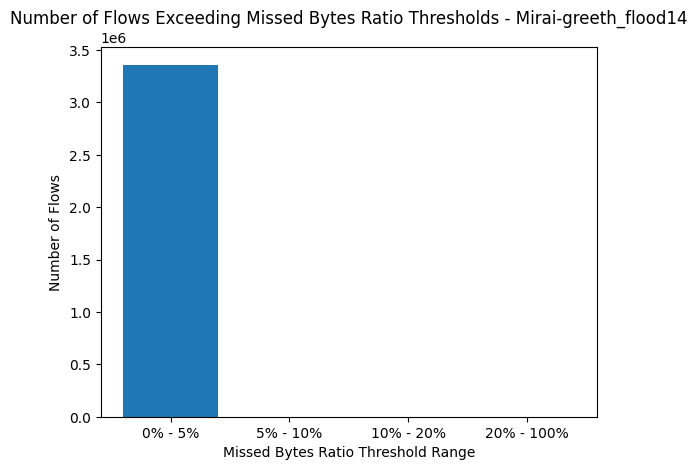

Non-numeric values found in column orig_bytes:
1          -
3          -
5          -
6          -
7          -
          ..
3327502    -
3327504    -
3327506    -
3327507    -
3327509    -
Name: orig_bytes, Length: 3315956, dtype: object
Non-numeric values found in column resp_bytes:
1          -
3          -
5          -
6          -
7          -
          ..
3327502    -
3327504    -
3327506    -
3327507    -
3327509    -
Name: resp_bytes, Length: 3315956, dtype: object


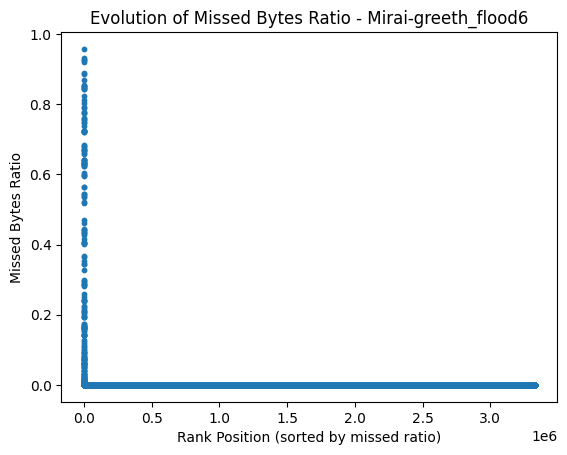

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3327511.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1301676  CTcx2X1kq3ISZud4Ti           inf  192.168.137.248      47844   
170667   CsuBeT3O7avTQyRr57      0.957758  192.168.137.100      60756   
3199294  CGSYO44Zwse3W7Wosa      0.933175   192.168.137.17      40834   
3327468  CbNCig2vgS1Csfym51      0.927458  192.168.137.209      47388   
1370273   CEa8mu4yob6eI2LER      0.925914  192.168.137.209      50682   
2395754  CPIimi3aGp2sodPOTe      0.921778   192.168.137.17      37932   
1360321   CXCauO7Qy50f4Qdnj      0.890409  192.168.137.209      34720   
1285859  Cw8MQU2s9wTN4nw5le      0.885961   192.168.137.94      46190   
2395899  C2VIzK1efQ4vbLwjJ2      0.869025  192.168.137.129      52496   
1266392  C135Vk3M97wXoeQ12l      0

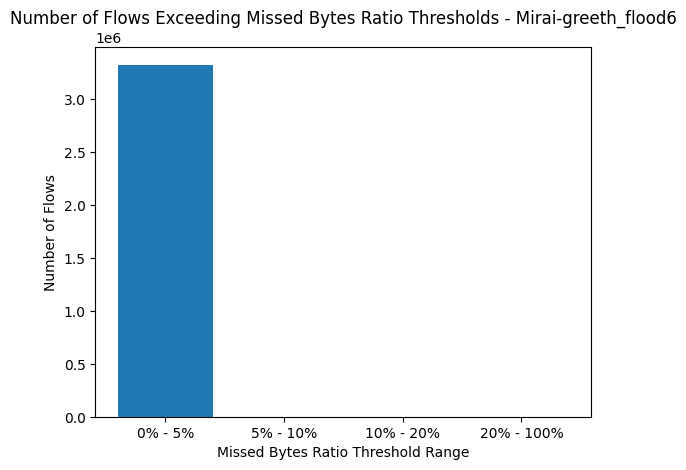

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
3          -
5          -
          ..
3324812    -
3324819    -
3324821    -
3324827    -
3324829    -
Name: orig_bytes, Length: 3318931, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
3          -
5          -
          ..
3324812    -
3324819    -
3324821    -
3324827    -
3324829    -
Name: resp_bytes, Length: 3318931, dtype: object


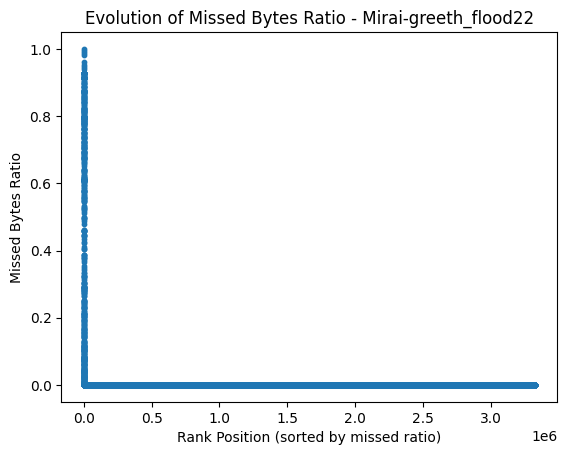

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3324836.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2352633  C5dBTY3SQlsj0dpnyh           inf  192.168.137.163      53535   
687604    CBasEs4QHhk4NFxJX           inf  192.168.137.248      38212   
2894819  C7ez944YYgwBY75BQk      0.999981  192.168.137.129      58091   
2255479  CBSRzP2YjpBlGQBeQd      0.992893  192.168.137.174      37752   
2749134  Cy3tva4FUi7YfMX3E3      0.988029   192.168.137.80      56366   
2685727   CfVJ9visiBzZEvri4      0.981308  192.168.137.129      58199   
2256614  C872oS2sXNvAGspR3a      0.960634   192.168.137.80      42489   
2270266  Cxnnjn3eCQWivXWlle      0.950663  192.168.137.129      58182   
2708197  CiHwMO1hVapQRfRNDc      0.945542   192.168.137.80      41682   
2764071  C628ZG2ORKzkrHbtMh      0

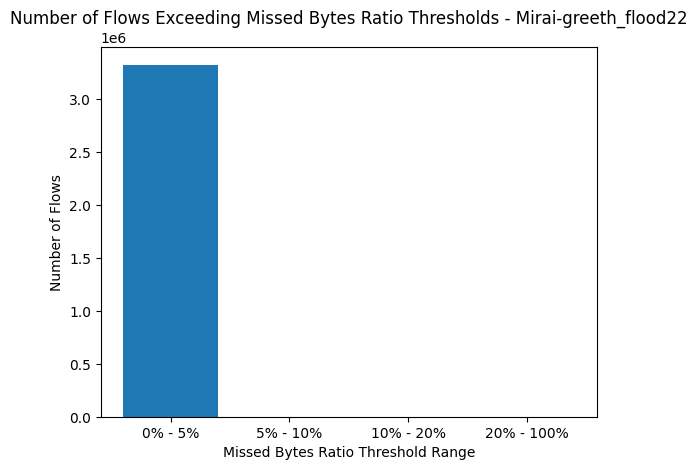

Non-numeric values found in column orig_bytes:
5          -
7          -
8          -
12         -
13         -
          ..
3358998    -
3359004    -
3359005    -
3359009    -
3359012    -
Name: orig_bytes, Length: 3355962, dtype: object
Non-numeric values found in column resp_bytes:
5          -
7          -
8          -
12         -
13         -
          ..
3358998    -
3359004    -
3359005    -
3359009    -
3359012    -
Name: resp_bytes, Length: 3355962, dtype: object


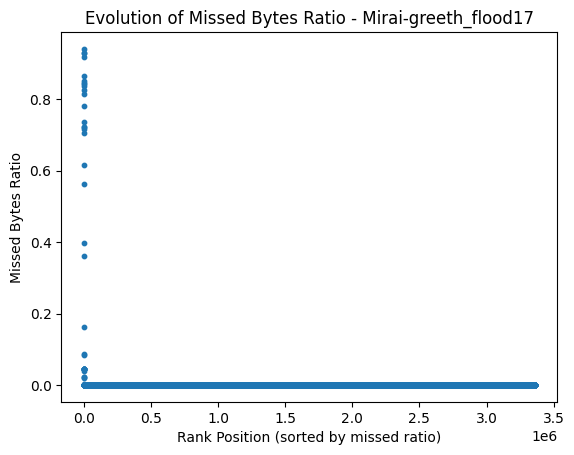

Statistics:
count    3.359014e+06
mean     4.980785e-06
std      1.941348e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.411203e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
3358971  C57gHe17jcvaOFglMh      0.941120  192.168.137.129      56907   
2545368   CwksfO8djuV3CDrIh      0.929149   192.168.137.17      53532   
2545331  C7LC9d3cN2RbWCUF8h      0.929149   192.168.137.68      40502   
2545326  C8Arps4gJZZhUY2Xe7      0.918255  192.168.137.129      56908   
2545350   CulSViIuGD9e5kAS3      0.865106  192.168.137.108      36870   
2173331  CM1aht4CVXlI26NJS8      0.852144  192.168.137.190      53122   
930134   CpDxN73ehtFfoXSDX7      0.845612  192.168.137.100      54921   
656483    CWZoewiaEfIXWqmF6      0.843125   192.168.137.38      36860   
2038715   Cimq3hAjEWPhqJI0j      0.838487  192.168.137.190      56901   
2545324  C

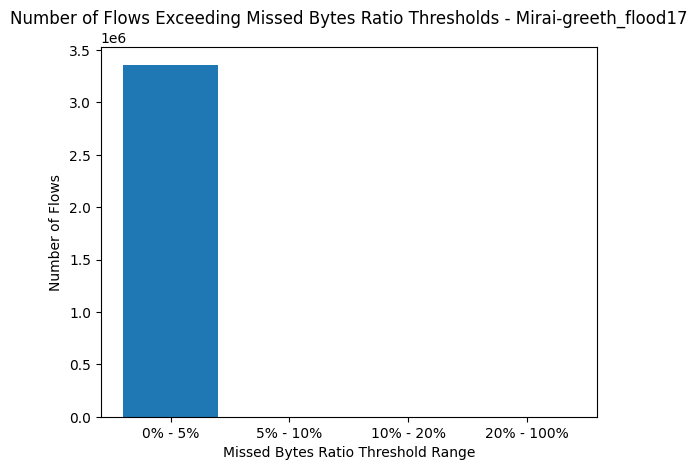

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
3          -
5          -
          ..
3357837    -
3357838    -
3357839    -
3357840    -
3357841    -
Name: orig_bytes, Length: 3354154, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
3          -
5          -
          ..
3357837    -
3357838    -
3357839    -
3357840    -
3357841    -
Name: resp_bytes, Length: 3354154, dtype: object


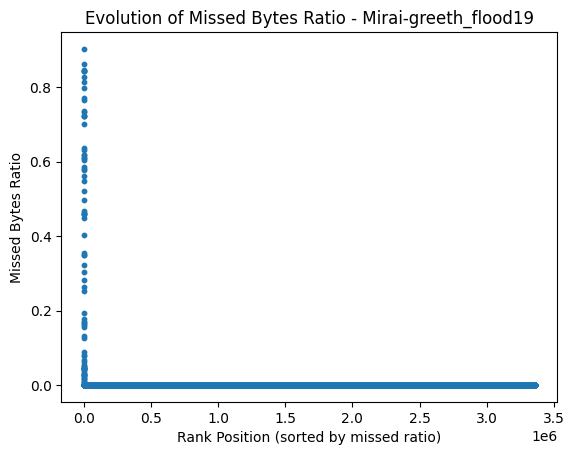

Statistics:
count    3.357842e+06
mean     8.899155e-06
std      2.318541e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.032563e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1267679  C4OVb84JFbCvlQ3GVe      0.903256  192.168.137.186      50070   
2152223   CbljM5Pe8WNPNuWia      0.863991  192.168.137.108      54840   
1451724  C4pH9v4wsmzEiP3Ep2      0.845628  192.168.137.100      54933   
2974434  Cr4lIB3VfAgDAHnWC1      0.843125   192.168.137.38      37008   
349530   C9UcCA2xSNbAoWQt08      0.843125   192.168.137.38      36986   
3309920  CVIjCw2kaDZe7QWxMb      0.843006  192.168.137.254      43286   
1391145   CmCq3iAQtAmbUMgLe      0.828671  192.168.137.185      51851   
2697288  C7Ydf42BEKrfFvrCeg      0.815593  192.168.137.254      37542   
2704464  Ceq3iv4CutjfXlKG1i      0.798578  192.168.137.185      53316   
2696571  C

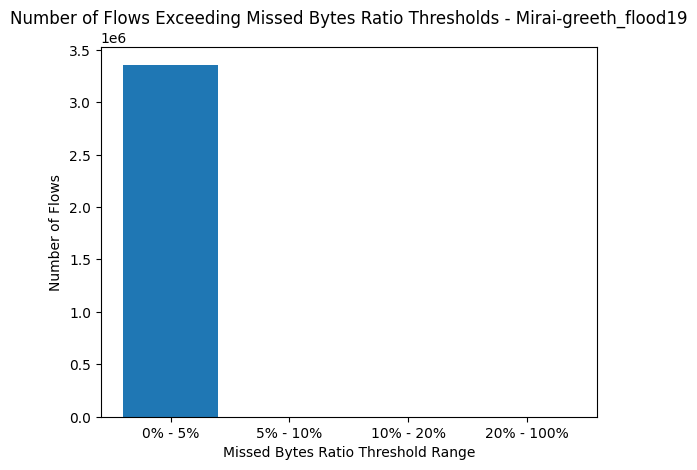

Non-numeric values found in column orig_bytes:
0          -
3          -
4          -
5          -
7          -
          ..
3357672    -
3357677    -
3357683    -
3357685    -
3357692    -
Name: orig_bytes, Length: 3350146, dtype: object
Non-numeric values found in column resp_bytes:
0          -
3          -
4          -
5          -
7          -
          ..
3357672    -
3357677    -
3357683    -
3357685    -
3357692    -
Name: resp_bytes, Length: 3350146, dtype: object


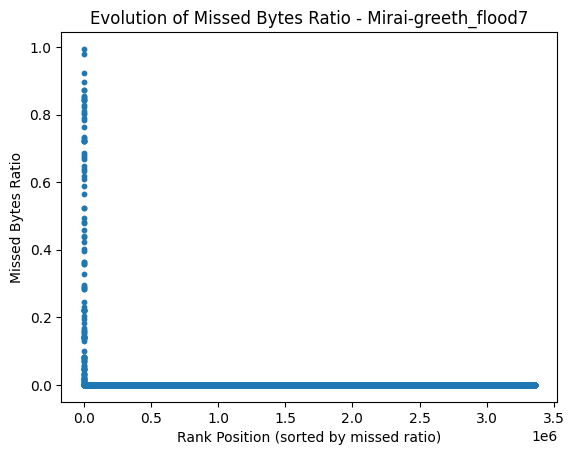

Statistics:
count    3.357695e+06
mean     1.300370e-05
std      2.840078e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.944882e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
622523   CnzkCv16dvETSl9Fqd      0.994488   192.168.137.68      56416   
3357636   C3MSMhlBJpfkm2og4      0.980215  192.168.137.142      49428   
834917   ClGZgw3GSnlsvo04v2      0.921778   192.168.137.68      54628   
1868489  C6qDIl3clR1d2R9ed8      0.895819  192.168.137.209      35123   
2935107   CjfVZmlBFATwM7jTa      0.873171  192.168.137.174      37714   
1078865   C1x09i8PVh6mBaAQb      0.872514  192.168.137.217      54038   
1612314  Cy5Tn22joo3wT9ALEg      0.856109  192.168.137.174      45912   
1420621  CwUgVk1z2N0ueXz8ok      0.852144  192.168.137.190      54675   
1738290   CHPWGvfpRNpvFTkxk      0.847857  192.168.137.185      56559   
2794629  C

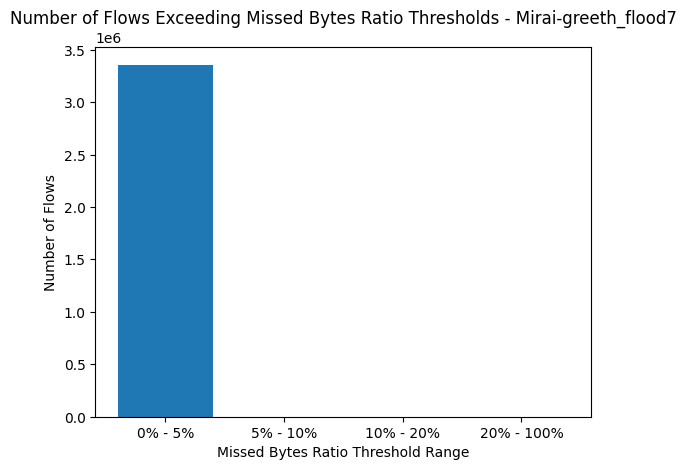

Non-numeric values found in column orig_bytes:
2          -
4          -
5          -
6          -
7          -
          ..
3348486    -
3348487    -
3348488    -
3348491    -
3348492    -
Name: orig_bytes, Length: 3344951, dtype: object
Non-numeric values found in column resp_bytes:
2          -
4          -
5          -
6          -
7          -
          ..
3348486    -
3348487    -
3348488    -
3348491    -
3348492    -
Name: resp_bytes, Length: 3344951, dtype: object


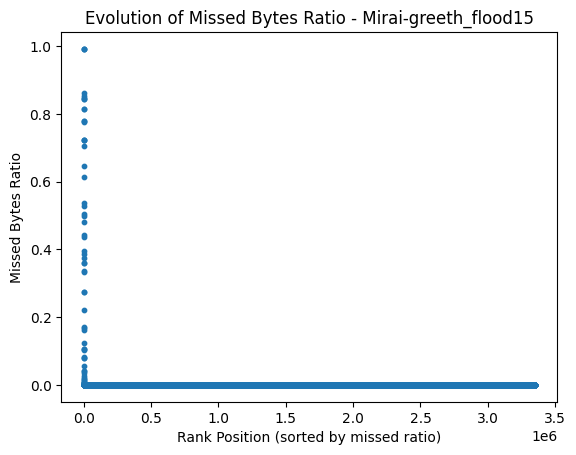

Statistics:
count    3.348494e+06
mean     7.032250e-06
std      2.153829e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.918046e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2170535  C6CtXl4OtksfSZz4v9      0.991805  192.168.137.129      56316   
670928   CkIm7Y3ImzrW7IfUig      0.991797  192.168.137.129      56306   
3066251  Cnt6uY3eloTJWgzCY6      0.990384  192.168.137.185      51747   
670927   CoIyOb2kYkjg8de3Dg      0.860591  192.168.137.129      56301   
1269052  Co9deB4BBs91lePH6i      0.852144  192.168.137.190      52851   
1461364  Ckv62b3w20R6zMAk43      0.845597  192.168.137.100      54907   
1608591  CmrduV2h5il4wzcn77      0.843125   192.168.137.38      39724   
2961358  CXfLhG3nUMsMwDwS51      0.843125   192.168.137.38      36726   
1600741  Cy2RnT2oyXMcbSxoNb      0.815593  192.168.137.254      38846   
1786596   

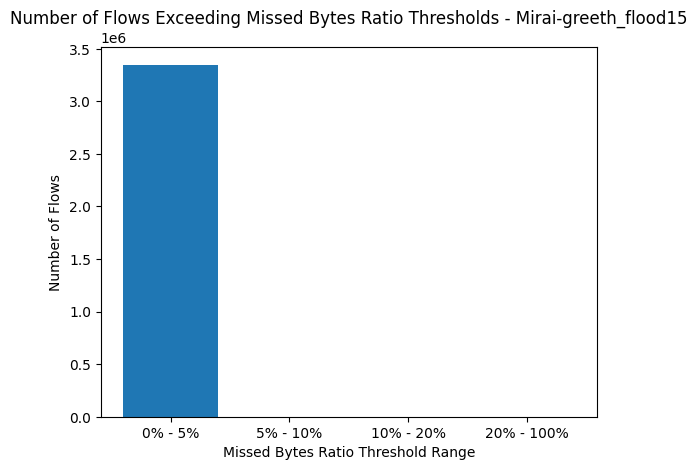

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
5          -
6          -
          ..
3345995    -
3345999    -
3346000    -
3346003    -
3346005    -
Name: orig_bytes, Length: 3340524, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
5          -
6          -
          ..
3345995    -
3345999    -
3346000    -
3346003    -
3346005    -
Name: resp_bytes, Length: 3340524, dtype: object


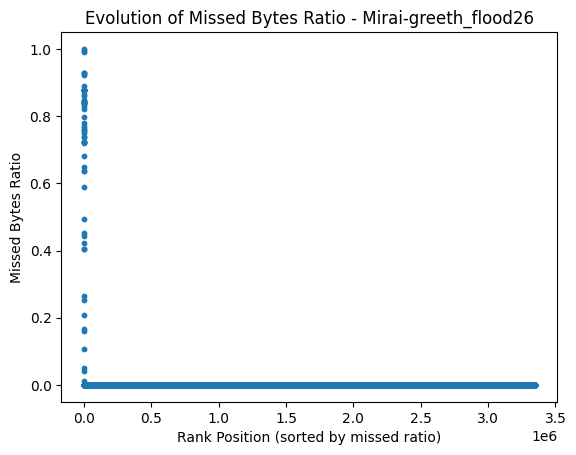

Statistics:
count    3.346007e+06
mean     1.550935e-05
std      3.526029e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999966e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1233646  C1dA4G1fKDsZP2A00i      0.999997  192.168.137.129      59705   
1393140  Ck3V8r1D8LIepXqTm3      0.992898  192.168.137.174      34920   
1393250   CwdL0l1sGJfyYVlyg      0.991759  192.168.137.129      59774   
1393183   CAeTrZIbkn0pnkKsi      0.929149   192.168.137.68      34698   
1930421  CmXf2z32MeNDaG7GCd      0.929128   192.168.137.68      48674   
1930395  CEc97e3zOsTxJt5PVa      0.929128   192.168.137.17      46978   
1393146  C40igA4iMbkfCupjLe      0.921789   192.168.137.17      44538   
1393225  CenGPp1NM4Dtv91Hja      0.888458  192.168.137.129      59775   
1393253   C0JFkMZxmhK2rN5Lf      0.879037  192.168.137.129      53960   
1393254  C

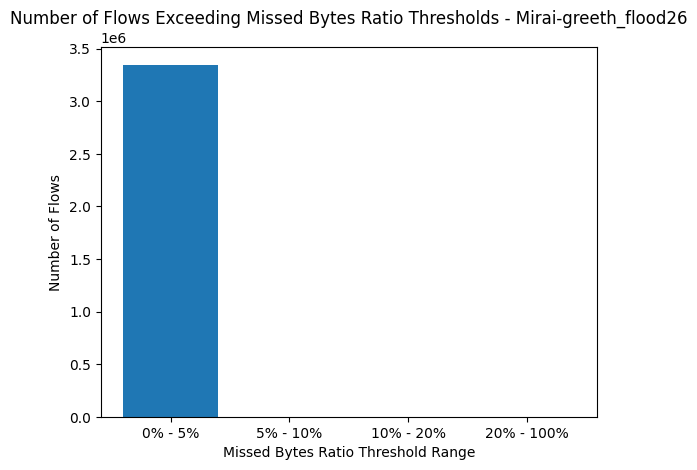

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
3          -
4          -
          ..
3357745    -
3357749    -
3357751    -
3357754    -
3357755    -
Name: orig_bytes, Length: 3353385, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
3          -
4          -
          ..
3357745    -
3357749    -
3357751    -
3357754    -
3357755    -
Name: resp_bytes, Length: 3353385, dtype: object


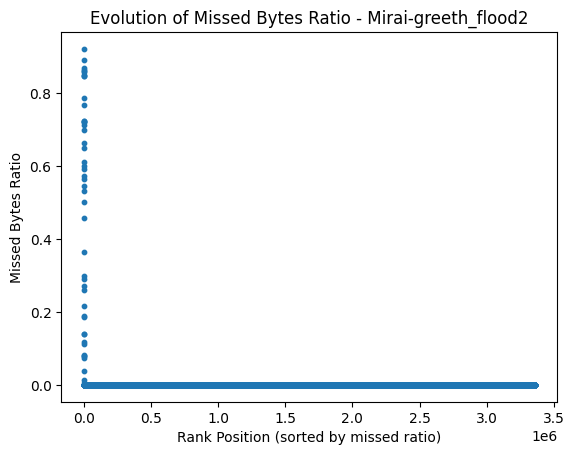

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3357758.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2019254  CUGfgd2N92dFwoXgdi           inf  192.168.137.163      35340   
2019229   CmIBsLYC1VG326Pe3      0.921634   192.168.137.68      54546   
2627904   Cmd70i37zsKm0M5iS      0.891094  192.168.137.129      51661   
2018304  CSpERf21DoIGcCoP7l      0.868084  192.168.137.174      32834   
2018767  CIuT9V194iETOZw2Fg      0.865106  192.168.137.108      57726   
2019079  ClsVdL2GgARJPpq45b      0.861877  192.168.137.129      51645   
2019444   CgktCbe86eBLdzbXi      0.858885  192.168.137.129      51667   
2565278  Ci8H4H27h1DlueDy0h      0.850783  192.168.137.206      59134   
2019076  Czd7eC1H34dsrf5gUl      0.846673  192.168.137.129      51637   
2019074   CVx1o5ZQoxr7PHkG6      0

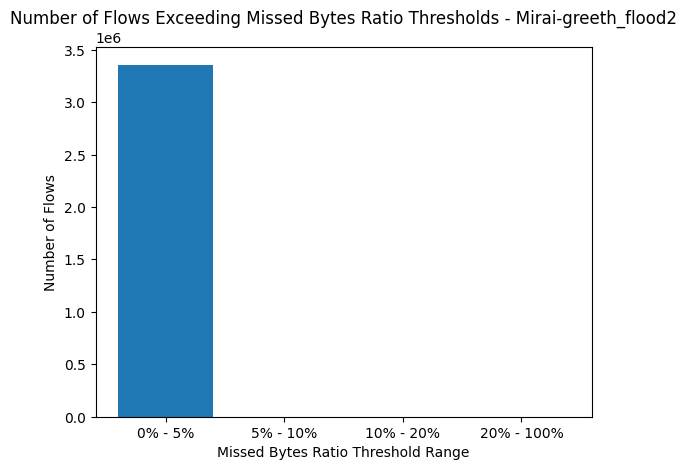

Non-numeric values found in column orig_bytes:
0          -
1          -
2          -
4          -
5          -
          ..
3259254    -
3259256    -
3259257    -
3259260    -
3259261    -
Name: orig_bytes, Length: 3253841, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
2          -
4          -
5          -
          ..
3259254    -
3259256    -
3259257    -
3259260    -
3259261    -
Name: resp_bytes, Length: 3253841, dtype: object


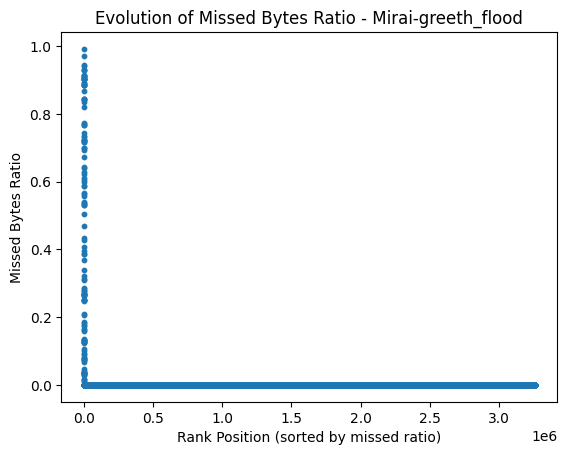

Statistics:
count    3.259265e+06
mean     1.950431e-05
std      3.654527e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.916781e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
886076   CA2W364DL5bVDiEf6f      0.991678  192.168.137.129      54959   
55664    C5SGOi1ikMtIiQHiKl      0.972000  192.168.137.129      54750   
886075   CzbFG53HA6MPT4Pipd      0.944054  192.168.137.129      54960   
860732   CdTURo47AKFYVO36Y6      0.941259   192.168.137.58      25220   
781       CUNuVI8CzgM0IpOUe      0.929138   192.168.137.68      56252   
497      CLxnoG3GcQ2EhlGP29      0.929138   192.168.137.17      40630   
847312    CFHFJ3VgL0CtQNQQa      0.929004   192.168.137.68      59034   
1880582  CDb5Jx44rqKN2OXGh8      0.913625  192.168.137.248      39376   
869166   C5YGMv1M67eXXyUmR8      0.912283   192.168.137.58      35842   
870682   C

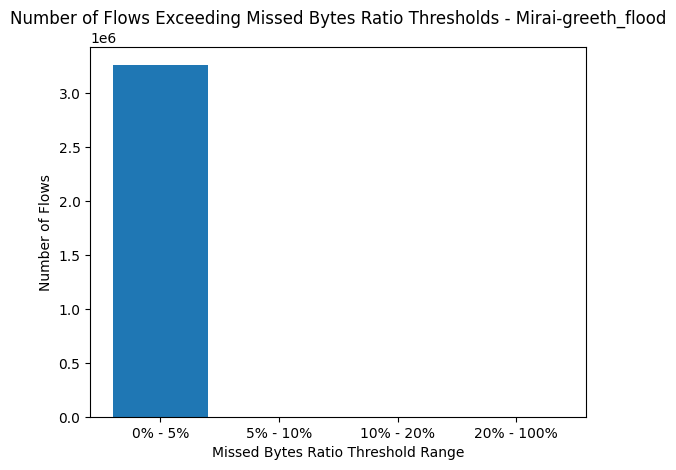

Non-numeric values found in column orig_bytes:
0          -
2          -
3          -
5          -
6          -
          ..
3305589    -
3305592    -
3305602    -
3305609    -
3305617    -
Name: orig_bytes, Length: 3301371, dtype: object
Non-numeric values found in column resp_bytes:
0          -
2          -
3          -
5          -
6          -
          ..
3305589    -
3305592    -
3305602    -
3305609    -
3305617    -
Name: resp_bytes, Length: 3301371, dtype: object


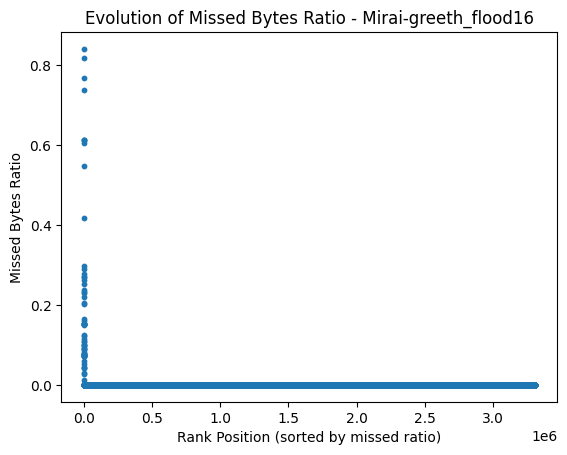

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3305623.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1905817  CaherU1qQVWPpwDFz7           inf  192.168.137.190      60306   
1906359   CX3SkeaQxjyrMIjjl           inf  192.168.137.190      46477   
1867173    CeOOm8dELk2ZUaTX      0.840426  192.168.137.162      54608   
3258546  CV0CEj3aZ2vphZNON2      0.818182   192.168.137.65      49584   
3126816  Cchk4A1f1U65yPySC3      0.768783  192.168.137.100      55141   
2542465  CUvXg43gf9h6FjDPWd      0.738213  192.168.137.248      47640   
3258549  CgCOGp1FHJUfoePgy1      0.612466  192.168.137.174      39260   
2292569  CgI9Lf4ElHF8o7qHp8      0.612069   192.168.137.87      61883   
3258563  Cegs9w2hkQKK5WSd1c      0.612069   192.168.137.87      61885   
3126821  CWzJT34P6Jph4WN4D3      0

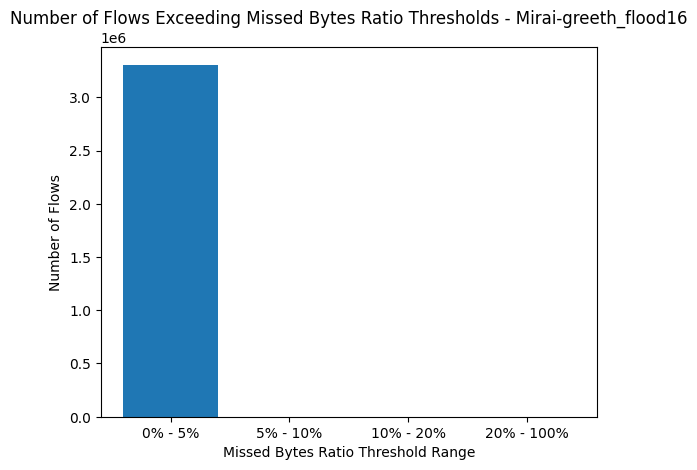

Non-numeric values found in column orig_bytes:
0          -
1          -
4          -
6          -
7          -
          ..
3315868    -
3315870    -
3315873    -
3315875    -
3315879    -
Name: orig_bytes, Length: 3306004, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
4          -
6          -
7          -
          ..
3315868    -
3315870    -
3315873    -
3315875    -
3315879    -
Name: resp_bytes, Length: 3306004, dtype: object


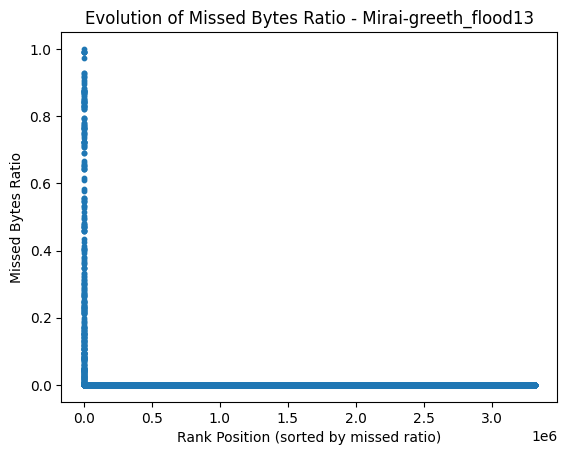

Statistics:
count    3.315881e+06
mean     3.576462e-05
std      4.738869e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999997e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
79607    C464FA1zOxV0C6AF1b      1.000000  192.168.137.112      62103   
302304   CuOmib3R1AiyK3B1z9      0.991594  192.168.137.129      54385   
302190   CHuOuj4zPQbCySSTEa      0.991565  192.168.137.129      54383   
302305   C3uvpt2BABjpyfX1Ve      0.991558  192.168.137.129      54384   
101252   C4KIDH34nfILyTiuqd      0.991553  192.168.137.129      54379   
302303   C6qWhC2HFHtYpkWb19      0.991535  192.168.137.129      54382   
78250    CGVVzb2LJUEkZD8Noc      0.971807   192.168.137.87      61821   
1453225   COEkFvizEmzCOUVal      0.929138   192.168.137.17      39976   
1453161  Ctqykx3EnIWk9EMAb5      0.929138   192.168.137.68      54032   
1191930  C

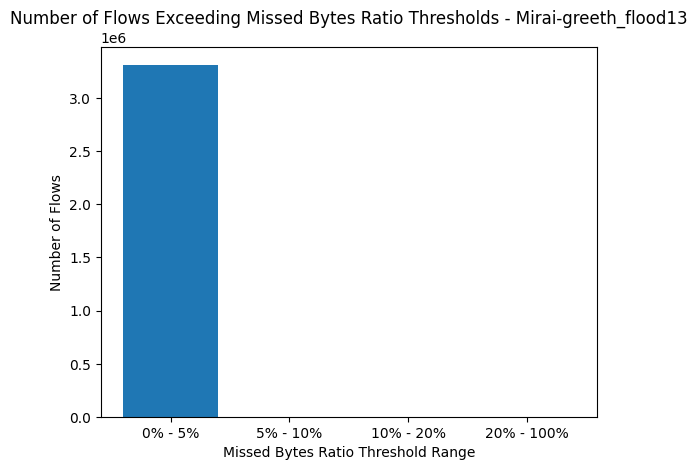

Non-numeric values found in column orig_bytes:
0          -
1          -
7          -
10         -
17         -
          ..
3345680    -
3345683    -
3345685    -
3345686    -
3345687    -
Name: orig_bytes, Length: 3337293, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
7          -
10         -
17         -
          ..
3345680    -
3345683    -
3345685    -
3345686    -
3345687    -
Name: resp_bytes, Length: 3337293, dtype: object


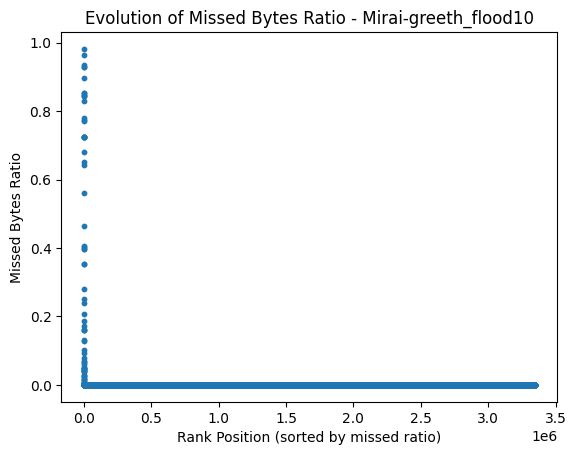

Statistics:
count    3.345689e+06
mean     7.519182e-06
std      2.267402e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.818977e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2234757  CMePni34ddVLle5291      0.981898  192.168.137.129      53674   
446492   CTbDTz1fx0MAxLw4x1      0.962894  192.168.137.184      56209   
444854   CDZgFY2WzKQ9MUIuva      0.935094  192.168.137.184      42204   
2738787  CebYg62EGHYiKuouz8      0.929149   192.168.137.68      45538   
2738755   CSfCP53tCQIAII7RY      0.929149   192.168.137.17      53436   
1999082   C3yM36DwGc1J1DKqg      0.896200  192.168.137.209      57026   
846560    CiXBmf9essSv89GG7      0.852144  192.168.137.190      55224   
1609443  CkJylV2Ay5Ow7wYhOa      0.852144  192.168.137.190      59287   
274547   CoZkSa2Eo4bqybwoFb      0.848607   192.168.137.17      35242   
504421   C

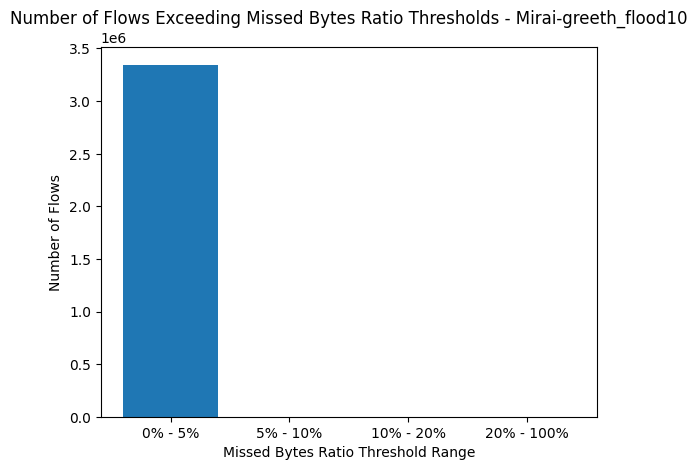

Non-numeric values found in column orig_bytes:
2          -
10         -
11         -
12         -
13         -
          ..
3320925    -
3320927    -
3320930    -
3320932    -
3320933    -
Name: orig_bytes, Length: 3309849, dtype: object
Non-numeric values found in column resp_bytes:
2          -
10         -
11         -
12         -
13         -
          ..
3320925    -
3320927    -
3320930    -
3320932    -
3320933    -
Name: resp_bytes, Length: 3309849, dtype: object


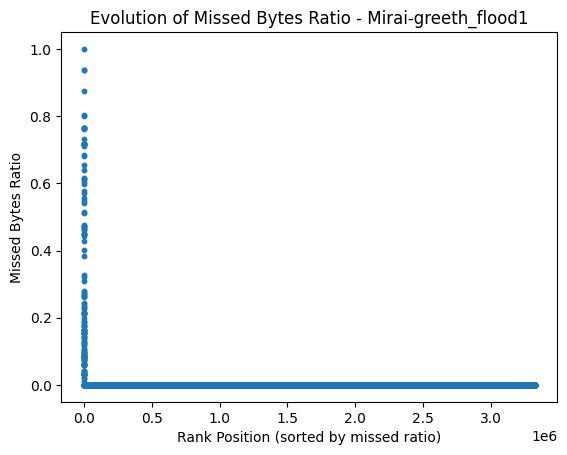

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3320936.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2685994   CK1EScziaJJLiL23j           inf  192.168.137.248      38966   
66       CCdOH03qDUrsl7D5Hi      1.000000   192.168.137.58      43359   
2811097  Commyi2VTdGIYS94j9      0.937500  192.168.137.243      57075   
2299804  CgevB41HvBFwYcthMj      0.937500  192.168.137.243      61372   
2857126  CAXVBA3yTzLggopfib      0.874709  192.168.137.243      53329   
2852576  CX7f332xdUwK9Cfr3c      0.803685    192.168.137.1      49285   
3320852  CoeTo71WSvGpReqFS2      0.800647  192.168.137.162      43372   
2337132   CR3DlVwTSDtUpX304      0.765926  192.168.137.206      38906   
2306968  CJTcAB4flVLe11GRf5      0.765926  192.168.137.206      34530   
2299268   CBcZ2GYZbruxpu9N4      0

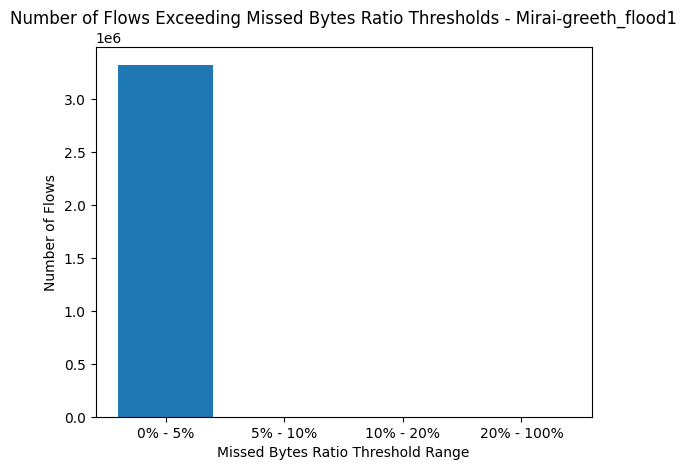

Non-numeric values found in column orig_bytes:
0          -
1          -
4          -
9          -
22         -
          ..
3330792    -
3330793    -
3330794    -
3330795    -
3330796    -
Name: orig_bytes, Length: 3318397, dtype: object
Non-numeric values found in column resp_bytes:
0          -
1          -
4          -
9          -
22         -
          ..
3330792    -
3330793    -
3330794    -
3330795    -
3330796    -
Name: resp_bytes, Length: 3318397, dtype: object


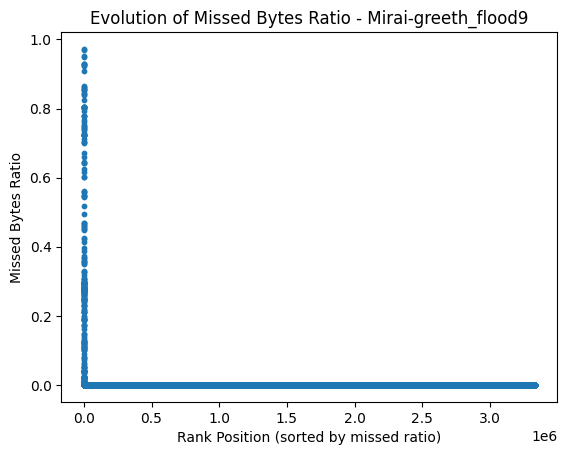

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3330800.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
799149   C5os6A3zdwe236anc6           inf    192.168.137.1      51198   
2607527   CmDs1HR3Edt1Fwgk7      0.972476  192.168.137.129      52950   
2196069  CR4L8S39HLXo76E3ul      0.968322  192.168.137.129      52910   
2196034  CQpeRe1UgeVvxTK1kb      0.952954  192.168.137.129      52877   
2196099  CvhQAr2OhCcaBxLR2l      0.949305  192.168.137.129      52907   
2054633  C00beI3ZMfFUTaKWWa      0.929138   192.168.137.68      53178   
1179500  CblZk6473hE8mQrgVi      0.929138   192.168.137.68      55692   
2195919  CbI97s1BURtYeGvuT8      0.929138   192.168.137.68      59388   
1972912  CUtGin4k78xALk0XXe      0.925957  192.168.137.206      58470   
2964878   CBPyaMGSwwdNMufB4      0

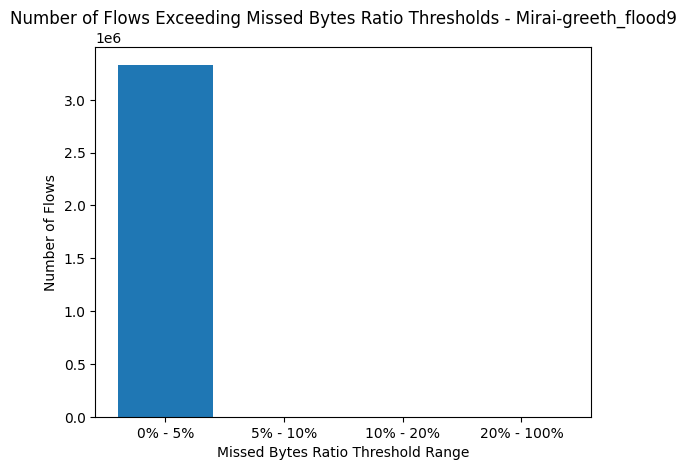

In [6]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Para greip

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/mirai-greip/"

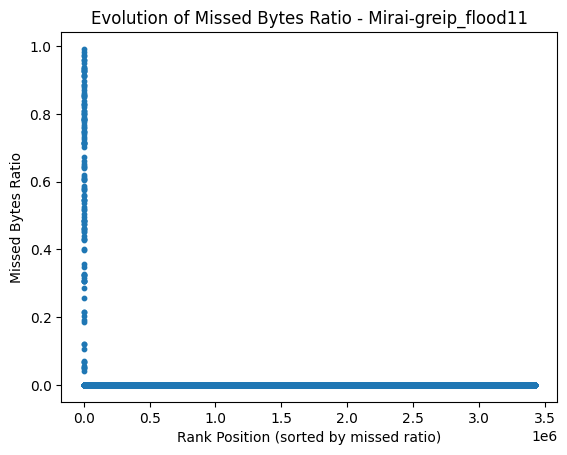

Statistics:
count    3.425700e+06
mean     2.280436e-05
std      4.031655e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.914869e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
817899    CFAI5xhsFFAglWNAi      0.991487  192.168.137.129      49978   
817900   CJ5MP84UenD366yQuf      0.982274  192.168.137.129      49979   
2684648  CwZehE2mNAayLCWUA1      0.973392  192.168.137.218      41940   
2703122  CtZz511gprqjobveB2      0.971464  192.168.137.175      34182   
2911940  CAkazP1AcLuE4z2Hpk      0.958805  192.168.137.218      56720   
3255168   CUFPZBMHFetZZIXMl      0.958495  192.168.137.100      40571   
2972582  CgOqBt3IWI0aJsMZji      0.951226  192.168.137.209      46010   
2696791    CH9MQWsnhzDdTivf      0.938320  192.168.137.209      55637   
2713267  CpHBlg3IyKLd98qj66      0.934212  192.168.137.129      50070   
1716455  C

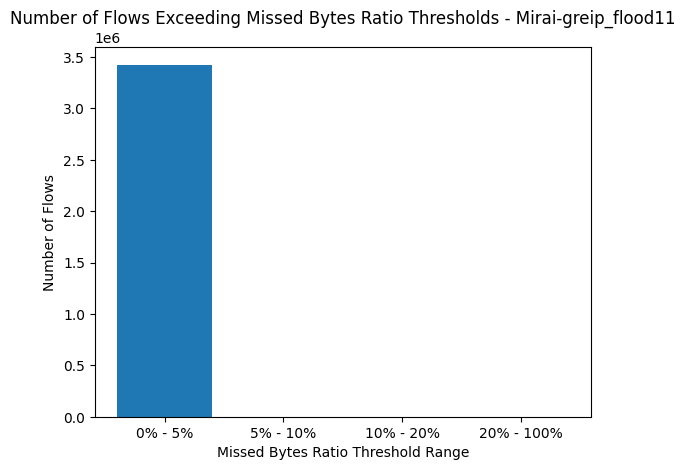

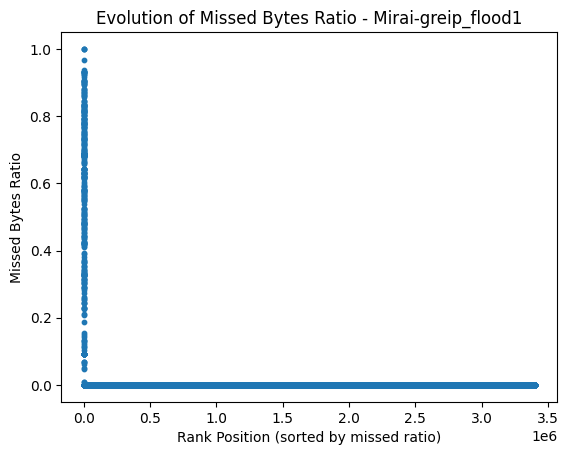

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3400622.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1317101  C0EYvd4nWrmAQMCCJf           inf    192.168.137.1      19534   
2414351   C2pNcE7gtf82G76Fc      1.000000   192.168.137.11      62056   
1472257  CMjRoI3tXseqHFhaDa      1.000000   192.168.137.96      37210   
1268112    C1hfKXFmpTAhhpW9      0.999996  192.168.137.123      58690   
1571526   CRlzIu46dHmvsJKf1      0.966879   192.168.137.96      46296   
2306480  ChLtL12ZCD9HH6YQJ3      0.937327  192.168.137.125      44446   
3032172  CeQIXk4jIjwHRJKCV3      0.931972  192.168.137.218      58417   
818639   CN4t461vOmRzrfhaXb      0.931908  192.168.137.218      37161   
2092724  C6c6ck1brFotFHdE62      0.931908  192.168.137.218      42730   
2690076  CThKEw2XMVwD276n7h      0

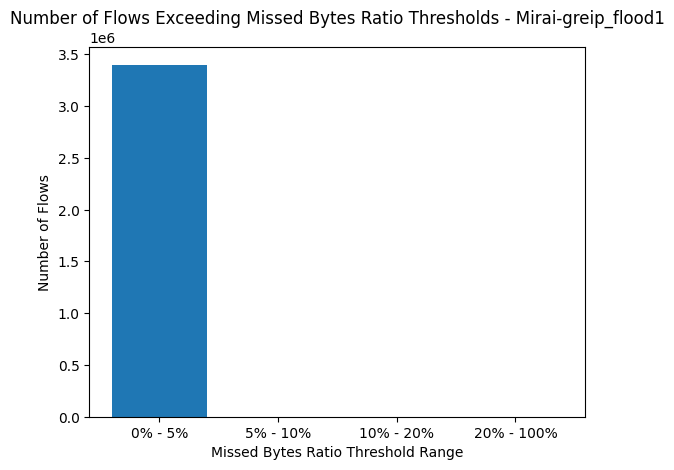

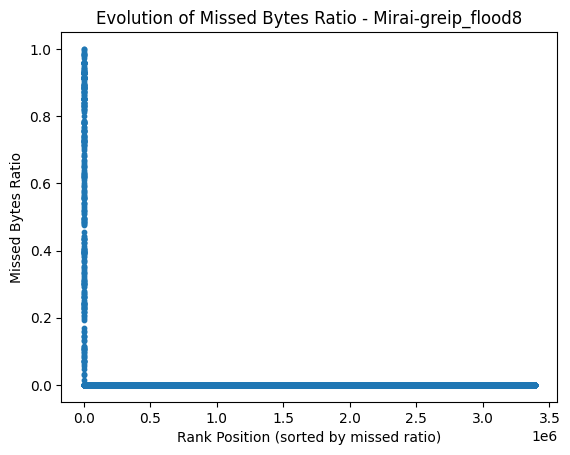

Statistics:
count    3.389634e+06
mean     5.896032e-05
std      6.606964e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999998e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
456058   C3Y7Sb1P3DxEYHr72h      1.000000   192.168.137.64      42917   
747466   CMKWCB3ISGNnVimx8l      1.000000   192.168.137.64      42928   
3389386  CaPLdh1tdH5pQFyuFj      0.992448  192.168.137.129      65312   
996441   C4gvUC1YUyN9vyX203      0.986408  192.168.137.209      57814   
2111900  CK7tJa4U7ie7sFFhyl      0.985634  192.168.137.175      60156   
995882    CmOojzmjRxUI9ggbj      0.984134   192.168.137.11      65406   
2111909  C6ZIgu1t0jieZT7BSf      0.982824  192.168.137.175      56412   
3207498   CzSATk2sLYg7ncV5w      0.982292  192.168.137.129      65286   
996368   C2IqB33U5ysg28f2V8      0.980367   192.168.137.96      51312   
3207806  C

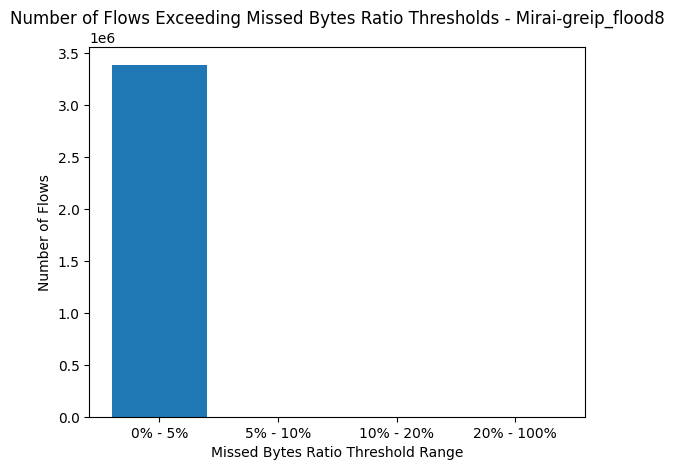

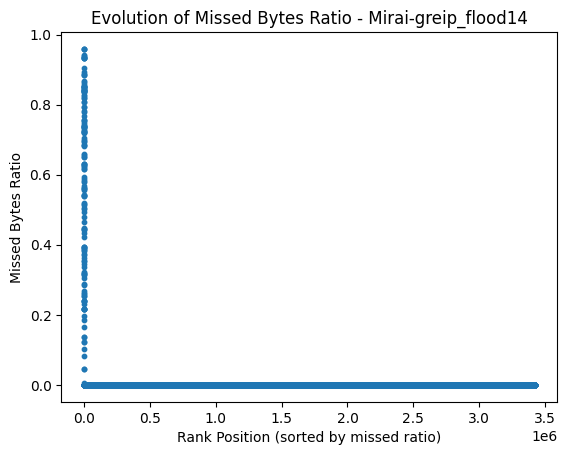

Statistics:
count    3.420414e+06
mean     2.616237e-05
std      4.233357e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.589550e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1274988  CzQq1u2LCC0lvS5Psa      0.958955  192.168.137.100      40605   
763959   CAQ9x34HmIeKdAeZw2      0.958805  192.168.137.218      46913   
344570    CavGzWVu4M7ZENamj      0.958805  192.168.137.218      56628   
150663    Coy60TzY6NfeYOP6a      0.941069   192.168.137.35      34252   
3132082  CaIRCr4DAxrpvxKKbf      0.938350  192.168.137.100      58404   
887196    CtMeJoznObLxKgHLh      0.937048  192.168.137.123      50230   
1100155  Cd6tfb1ZeCGohF6utb      0.934315  192.168.137.123      44890   
1275023  C9du8Y3OGqotH7vIq4      0.934315  192.168.137.123      50562   
1274995  Czc0Ni4WNSs3WivZkf      0.934315  192.168.137.123      43742   
174      C

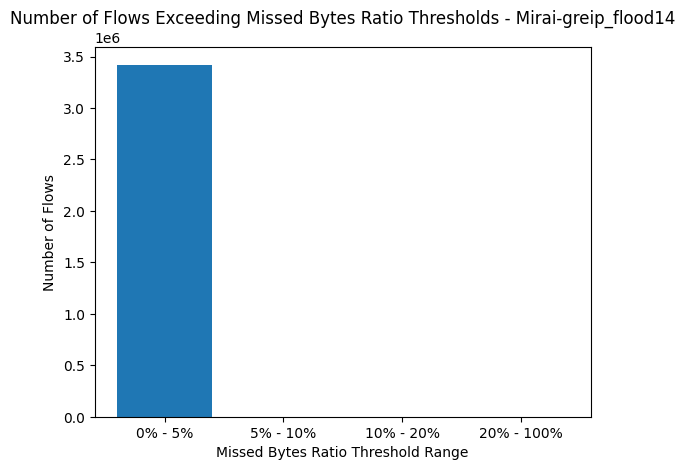

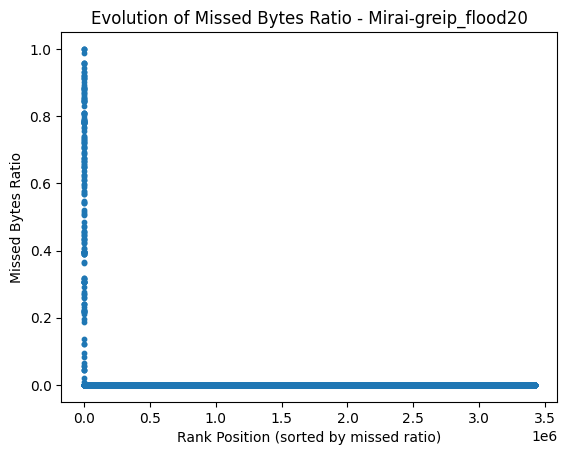

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3420899.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1394644  CyF1RP26MC7gvXV1yf           inf  192.168.137.138      34278   
1459425  CG61s73ZxBJSDv8NR6           inf  192.168.137.163      33564   
199710   ChJlHL1ZNvI6vEarLf      1.000000   192.168.137.29      37422   
2134093  CtEA5j4pjUeJg8MRQ5      1.000000  192.168.137.175      46682   
854095   CVNYDM2JLXTwozBwWb      0.999999   192.168.137.29      49998   
2098163   CawPLf0yHoeg3eF87      0.987212  192.168.137.165      45408   
2097343  CWQlf84txDYbWiW2Pe      0.958952  192.168.137.100      57353   
2944658  Cx6MDR3sC3dB3ASw1h      0.958805  192.168.137.218      39993   
1706138  C0LEyw2AaKsTxiHcfk      0.958805  192.168.137.218      47426   
1115391  CjjfA24DG6FNB4nIa7      0

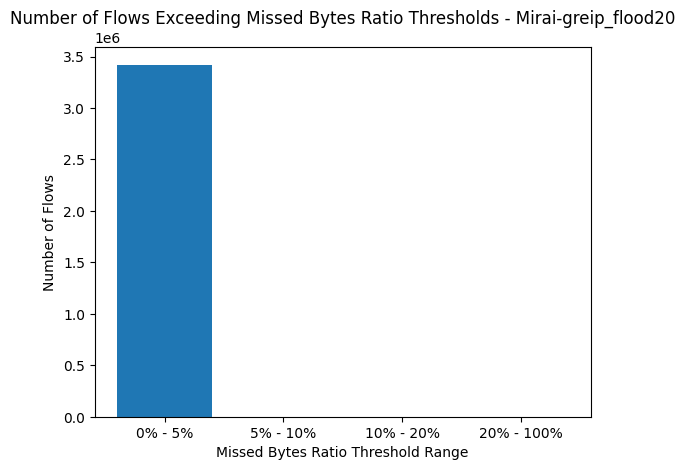

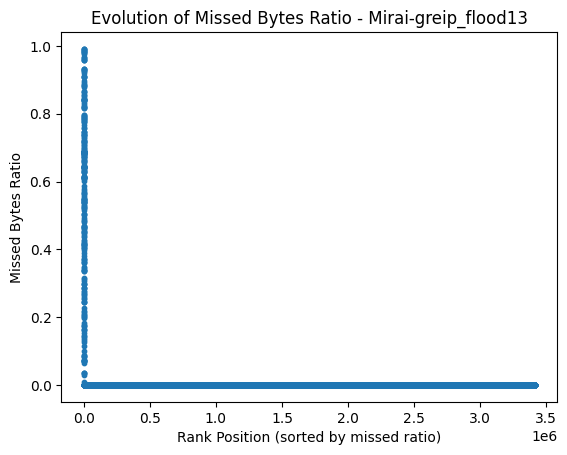

Statistics:
count    3.413844e+06
mean     4.613638e-05
std      5.614450e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.913644e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1177491  CZlgkI3h2uweKJJUek      0.991364  192.168.137.129      50617   
1629963  CZJ7QA3lcE3rqMJ4K7      0.991340  192.168.137.129      50649   
1176963   Cq6X9F4Ziy62O2qiy      0.989939  192.168.137.129      50616   
1784761  CAEGIe1TQAEteZuG7l      0.987343  192.168.137.129      50659   
1631931  CvEQWD4q4eP9nnTav6      0.985976  192.168.137.129      50655   
1618030  CImbrx3runeFPxU3wl      0.985769  192.168.137.129      50645   
1618031  CleVSh4ooMdTrNxA83      0.982174  192.168.137.129      50644   
1630424  C3VhZ73kl63mFVIt83      0.982099  192.168.137.129      50651   
1346996  CK8dXf4f83bM7LyvBi      0.979275  192.168.137.175      52186   
1784760  C

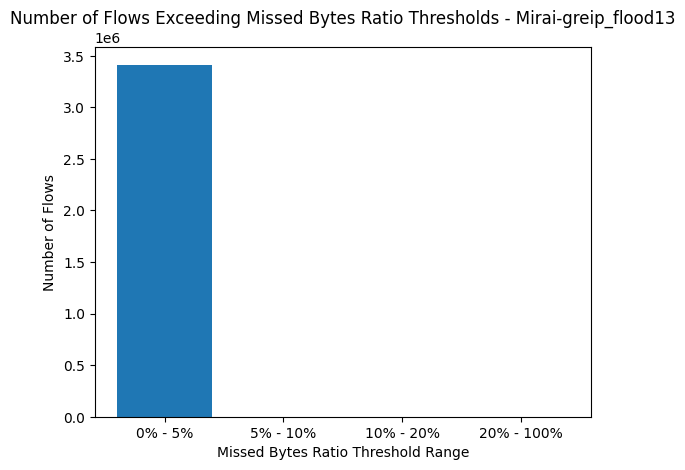

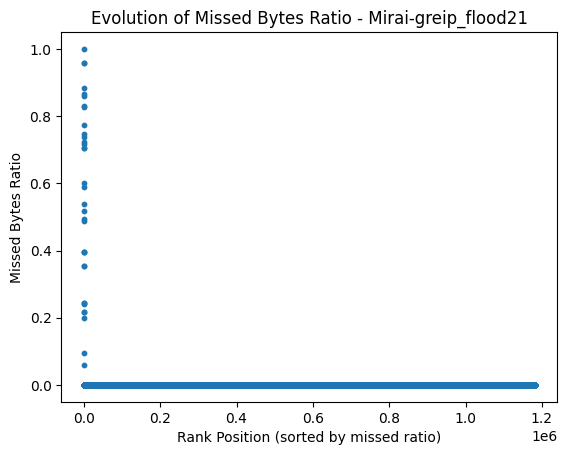

Statistics:
count    1.181160e+06
mean     1.602890e-05
std      3.318177e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999994e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1180246   CJqzK7JPTjpMhzfN3      0.999999  192.168.137.129      53975   
1159817   CUpnorGtROAJubkCa      0.958944  192.168.137.100      52471   
700304   CMFS901ez5C3LUfCC3      0.958805  192.168.137.218      50109   
1181047  CZiTfp2xpuT3CUCLK2      0.884920   192.168.137.29      37668   
1173123  CpLjij1XulolBLMIqh      0.866417  192.168.137.209      43209   
1174092   Cibmsgvb5fDhGhiD8      0.858841  192.168.137.100      52470   
1145192  CNVqlv4gREV5BcVtb4      0.828761  192.168.137.231      61659   
1178401  Cux7th4WQ6djU0YQd3      0.827891  192.168.137.108      39142   
244648   CwNTel4Cufl3I9s0C9      0.772220  192.168.137.165      47126   
961624   C

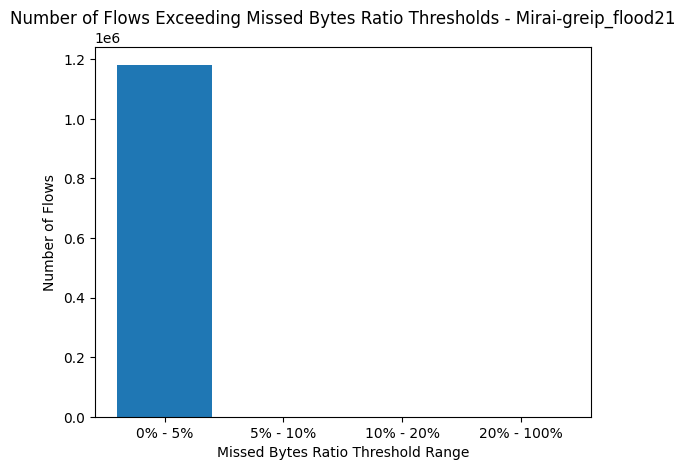

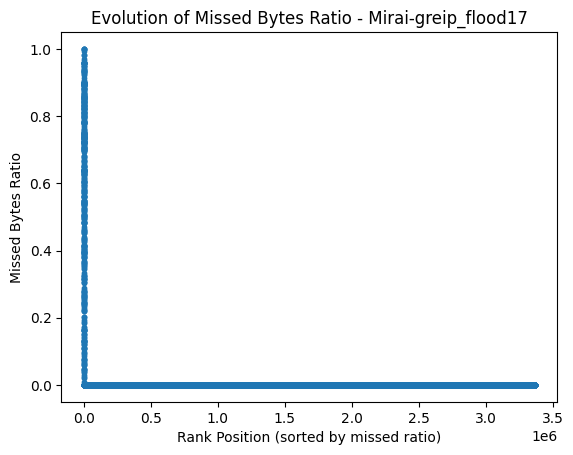

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3367057.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
88219     CZAwoQ15PAgZHgeg7           inf  192.168.137.163      34026   
97        CVgTFjpyG11nP0Se3           inf  192.168.137.163      40093   
581951   CWeeaJ1fh5SAtcx9T5      1.000334  192.168.137.144      51496   
2768827  CPL71W3ko24vSwfYP4      1.000000   192.168.137.29      38880   
34        CwJxVLTznR6RSZQ6d      1.000000   192.168.137.29      36300   
678866   CHVzRu1iKWYxDJgP3k      0.999979  192.168.137.185      61095   
3366992   C3KbtySjpRAV7czG6      0.995362  192.168.137.100      56150   
80194    CuXNCj1fMSSvQpVtg1      0.981832  192.168.137.129      52733   
177644   CG7LxQ2pyOlDR6bOse      0.981790  192.168.137.129      52735   
745232    CCbxYEWGUfcmXqtIj      0

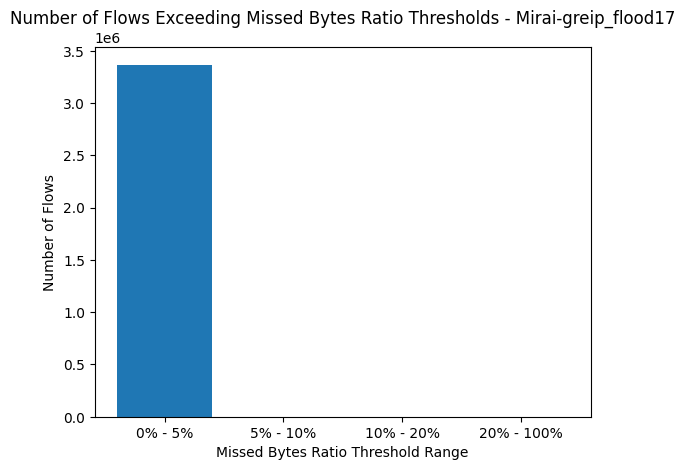

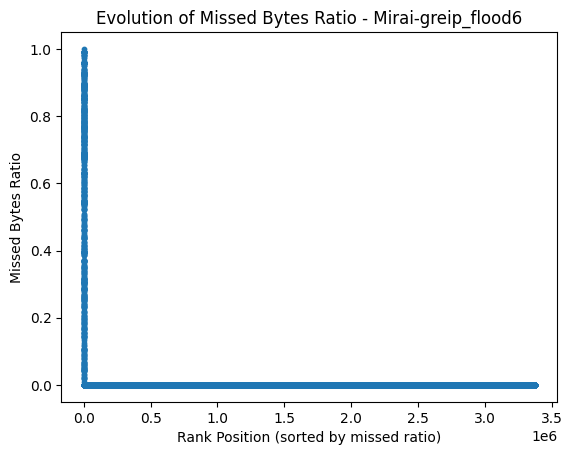

Statistics:
count    3.373915e+06
mean     1.125807e-04
std      8.966062e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999994e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio       id.orig_h  id.orig_p  \
1290823  CAA6t641bx5DG3B1P6      0.999999  192.168.137.64      41971   
2921943   CPQuANmF1eaQx5Ju4      0.991676  192.168.137.11      65280   
2963973  CunbdU35SBs2BCEGS5      0.991659  192.168.137.11      65288   
2607965   CvhjO2dDMqJ7eKXB7      0.991657  192.168.137.11      65274   
2921941  C5NaHX1q8wKOUyIG89      0.991646  192.168.137.11      65284   
2921939   CaLIrPxWkkGrk9Q19      0.991642  192.168.137.11      65282   
2935539  Cpjt6s3Cafyty0ObAl      0.991641  192.168.137.11      65286   
3254989  C0cAev2Ugvp4dyxjQ2      0.991602  192.168.137.11      65314   
2974801  C7ot781GOSLbJ6xck6      0.991307  192.168.137.11      65291   
2921940   CbtczJR1IY

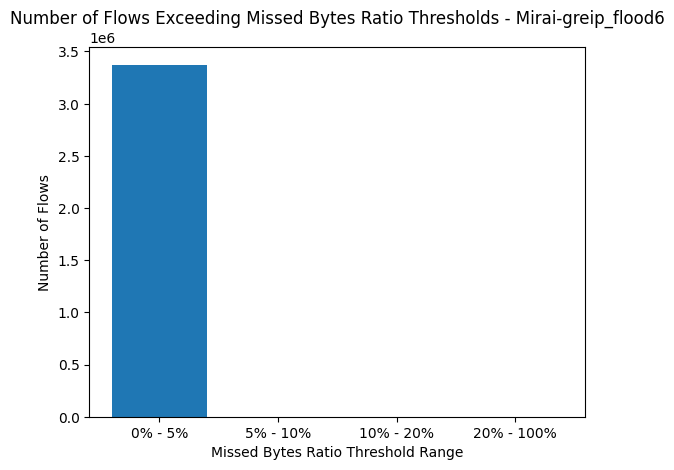

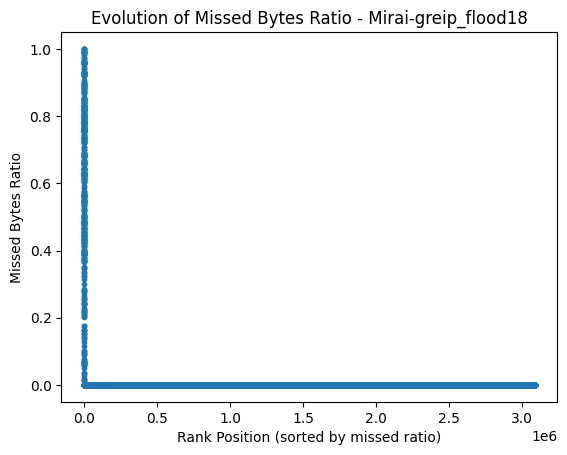

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3084979.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1624653  C9tNVI3oP8WJWakJCk           inf  192.168.137.163      40727   
1575015   CYh6ETPN0FT9IfAV7           inf  192.168.137.163      40714   
1624305  Cn2hii3vEq4CTMs73i           inf  192.168.137.163      40723   
1034093  CTYbzU3xIHOUR6eVwf      1.000000   192.168.137.29      39061   
755531   CKlun94WBnT2IoOMF3      1.000000   192.168.137.29      36495   
783871   C4rg161uD5ujjcuCEe      1.000000   192.168.137.29      39004   
1169651  COPqwH2K1uaAuHyp8c      1.000000   192.168.137.29      39081   
2163043  CIlJrh3AoCFHtdkDa3      0.991982  192.168.137.129      55771   
1642247   CtjQ8zodDvAaHt6q1      0.991863  192.168.137.129      55946   
1757480   CAV2uXFxcqQmnJE38      0

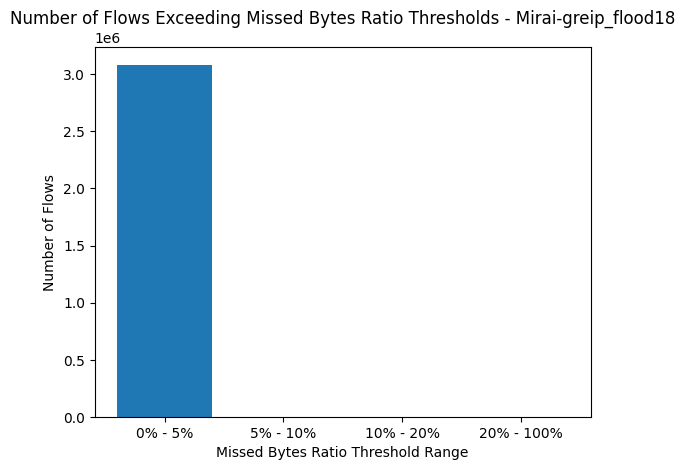

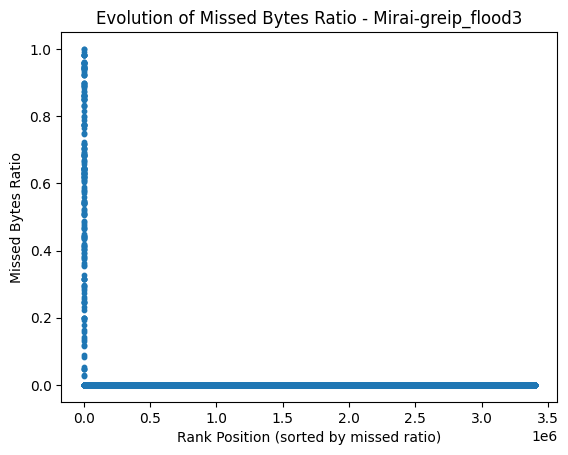

Statistics:
count    3.400174e+06
mean     3.759403e-05
std      5.195389e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999996e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
51044    CwMpK73wGipjrrbxnb      1.000000   192.168.137.89      47315   
1132328  CaPqGa2xt8z7etScSh      0.999995   192.168.137.11      62644   
136876   Cfv8ky3ApLIwNCtkEe      0.991377   192.168.137.11      62556   
131884   CEcTjo2EnMpHmz4jaj      0.981973   192.168.137.11      62554   
1030238  CkUVIJ3S11jUKQWyN7      0.981385  192.168.137.105      58138   
1031711   CaUGIqbZxaFOzOLck      0.981302  192.168.137.105      34664   
1026238   CLjagxsHcA6DyOnee      0.981070  192.168.137.105      40386   
1028784  CT0Zvv3MKqY62kdusb      0.980992  192.168.137.105      44620   
1023707  CHQoVb240fBy8Z2WS1      0.980942  192.168.137.105      40380   
1337646   

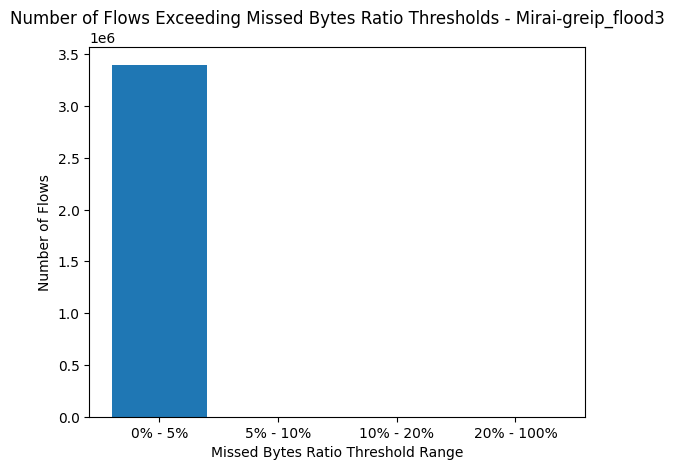

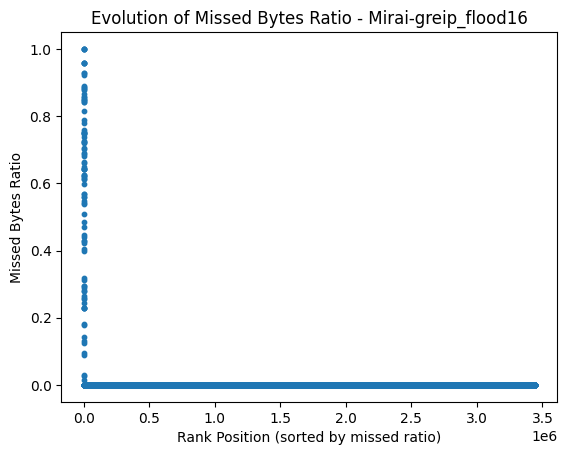

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3441221.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
407615   Ck0xKx2S7589As6Hp5           inf  192.168.137.163      40008   
138331   Cidqhu1SKF8kJJOm26           inf  192.168.137.163      40004   
86       CIEt4P3sxWZHRq3s31           inf  192.168.137.163      40000   
665156   CmqPts2QhiYgb8A1Di           inf  192.168.137.163      40013   
3210547  CCAblP1wzpNM17FQS3      1.000000   192.168.137.29      38790   
1027937   ClIwXi4JXvWSv6CuB      1.000000  192.168.137.175      50698   
1222804  CM0VAQ1VG8U4DqEdw9      0.999997  192.168.137.175      37134   
977140   COXY7i2pMDHbh4Ijaj      0.999985  192.168.137.175      50552   
2424594  CeXTG010FMj7EZV1i5      0.959304   192.168.137.63      41898   
1102432   CL77tY3ijGPLwU67s      0

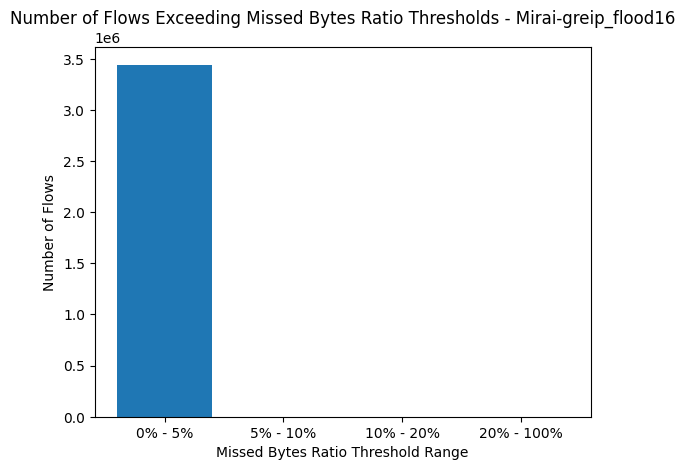

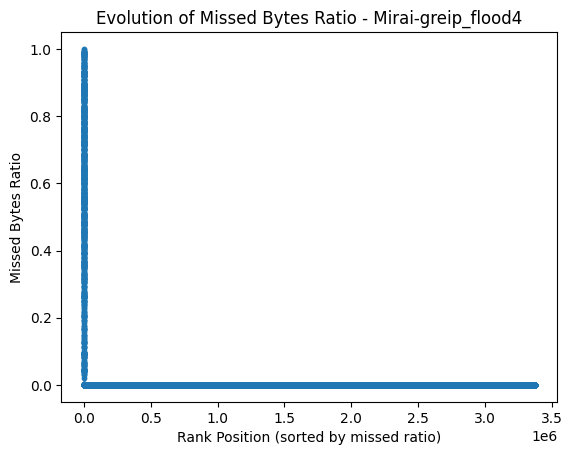

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3370922.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
2449166  CWQiVc1GLMUA61nK38           inf    192.168.137.1      56626   
1212928  Cb4ahv2dK785NE8Va7           inf   192.168.137.96      41594   
1726291  CYGjfb3fhEKpiITRI8           inf    192.168.137.1      56106   
992068   C1O7982s6bPE8JcMyh           inf  192.168.137.125      46708   
2374725  CBrTWc4WEjI0MhKSpl           inf  192.168.137.177      37636   
2305941  C1DP9s3tIzghLd6BYi           inf  192.168.137.138      41324   
1218856  CIdQAg2gTq6mE1dxai           inf  192.168.137.177      37626   
2490606  CfJlG43P1zdHPbOkRf      1.000000   192.168.137.11      63973   
2514917  CyRSJz2IWk30Co8Rg8      0.997465   192.168.137.11      64009   
2350163   COtsooiJoX0Amz2E9      0

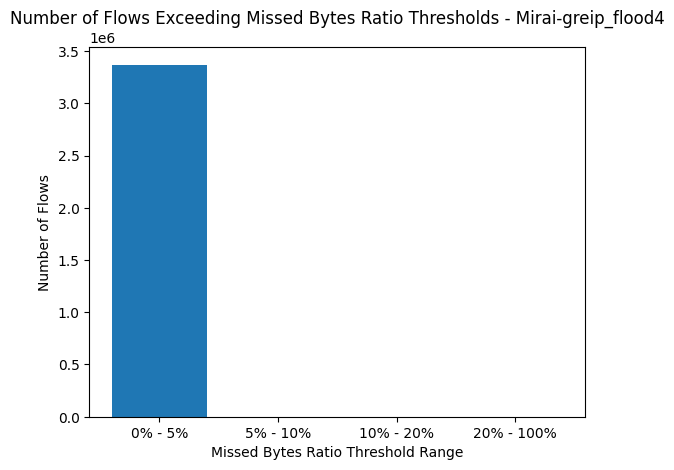

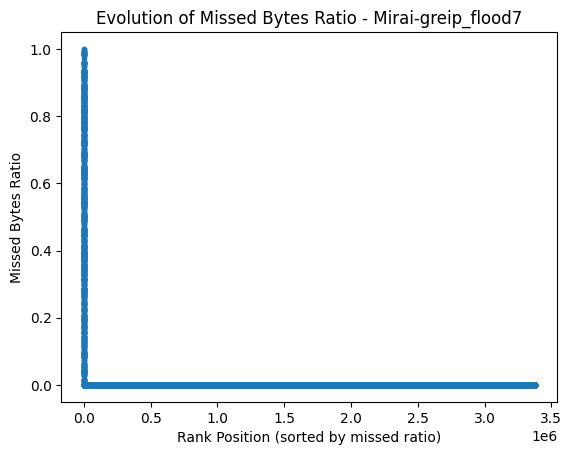

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3375710.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
502647    C7BZ8v8WtgkPUdMSc           inf  192.168.137.138      45304   
1917002   CK0ABZ2hxLv66k34z           inf  192.168.137.177      37684   
2354505  C3hjYh26As46QjEP73      1.000000  192.168.137.100      49941   
270831    CaOrzzvnMbwxEgHK1      0.998010  192.168.137.209      40397   
2428347  Ch3cXT2nNM1W1IYQZ4      0.991643   192.168.137.11      65360   
1016782  CfcUoy42ApqxLjdTLh      0.991306   192.168.137.11      65348   
1804834   CG9qVUkC5sM3siFIa      0.991292   192.168.137.11      65350   
1804838  CmMFWw1v3rFwjggKhl      0.991284   192.168.137.11      65351   
1804835  CVmNSa3akj9skm7yF6      0.985436   192.168.137.11      65353   
1804836  CDIxBe38xBwlqODko4      0

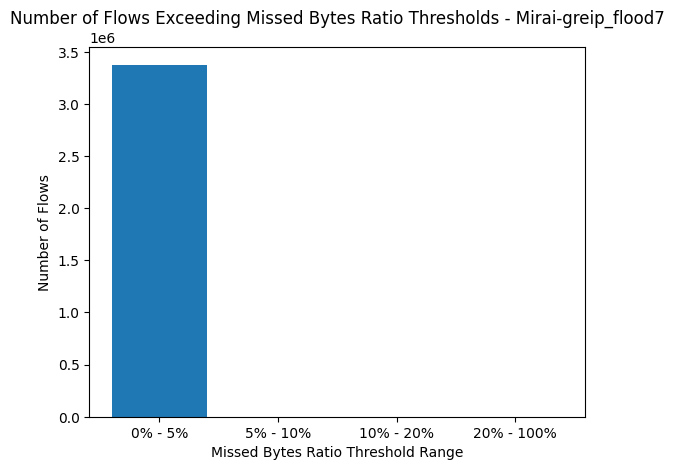

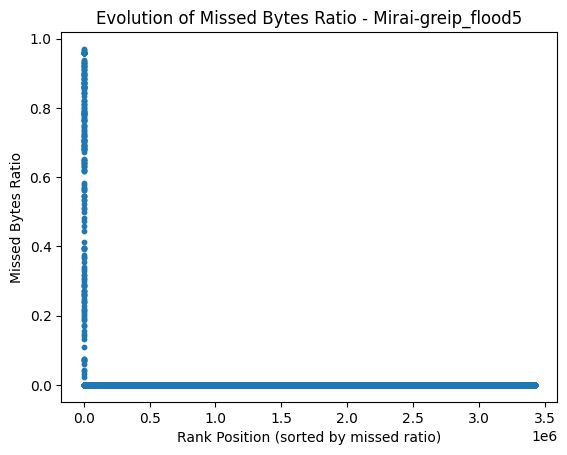

Statistics:
count    3.425623e+06
mean     3.863116e-05
std      5.358492e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.706267e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
3425596  C5Wro047kUMyHRH5vj      0.970627   192.168.137.96      45234   
3425584  CB8Yjz3XKCsckX0o48      0.968322   192.168.137.61      65306   
1302302  CZ5myP26BkIWarwTx2      0.964397   192.168.137.96      48838   
2184277   CMsztn1gr9mSA8DzL      0.960677   192.168.137.96      60922   
1736263  CPN8hk2Z3Rm5ejVCl3      0.960110   192.168.137.11      64449   
3098667  CdA0FC1EWxOWjoMpEj      0.958963  192.168.137.100      46575   
944716   C0EQ0q4mO0KbfSeU0l      0.958949  192.168.137.100      46570   
404337   C5BF6W2iNnY7Mj0jK3      0.958776  192.168.137.218      51918   
121       CHdQuOJmlkxnHliZa      0.958776  192.168.137.218      50580   
770151    

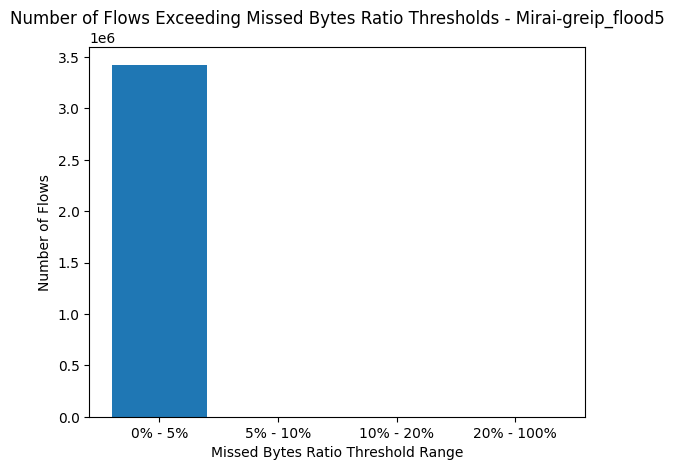

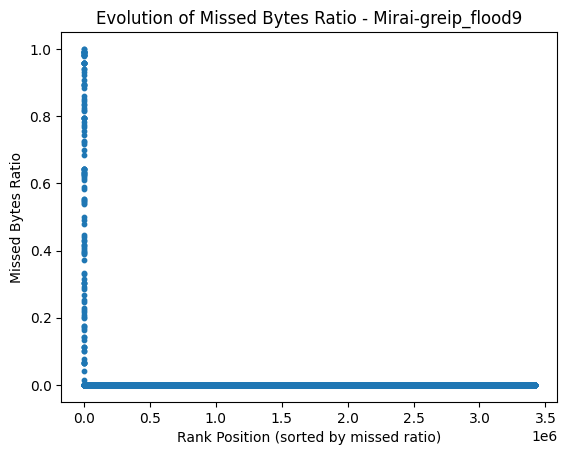

Statistics:
count    3.419276e+06
mean     2.262678e-05
std      4.118361e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999999e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1030247  CdxTgT2tI5PzASvKNl      1.000000   192.168.137.29      54267   
2629226   C8UhvO0753ffTcypi      1.000000   192.168.137.29      38297   
2836539  C4TJ1C4aF9hxxafSCd      0.991368  192.168.137.129      49171   
2836182  Cps9Ad3uPn3u53tur3      0.991058  192.168.137.129      49164   
2836626   CGOmRPrL7ocGtU7bh      0.991047  192.168.137.129      49180   
2836559  CtShNf36yosieq18N4      0.991045  192.168.137.129      49174   
2836549  CLRJrc2C88Ocldthx7      0.991042  192.168.137.129      49173   
2835921  CuSMQr4DJKMOmqNGPh      0.991040  192.168.137.129      49159   
2836339   CUFF3vaMtSzEa7pNc      0.991038  192.168.137.129      49168   
2836009  C

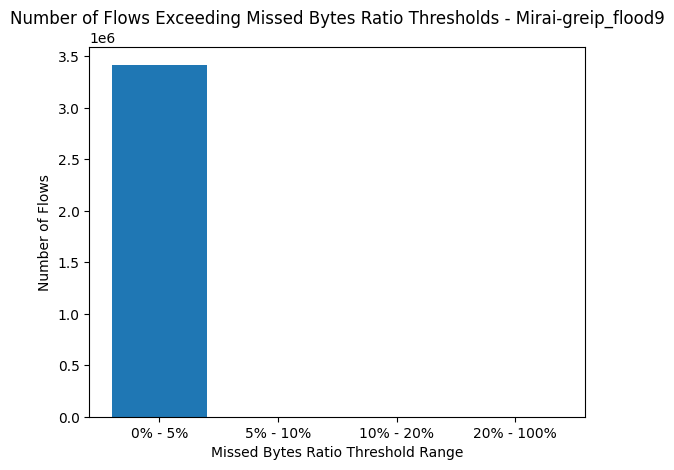

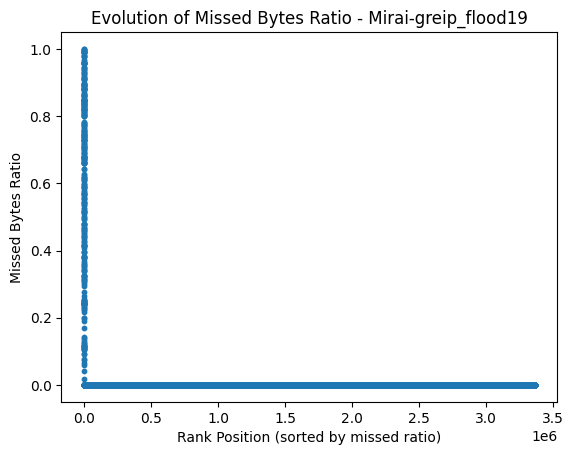

Statistics:
count    3.362021e+06
mean     6.076905e-05
std      6.631387e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1882798  CYvEvS3Ph4hFLKONle      1.000000   192.168.137.29      39868   
3361906  CESqx41DN4KadzEaVe      0.999308  192.168.137.108      52288   
2745933  CXcx9c4xDurKzVfNq5      0.997340  192.168.137.209      33989   
1148582  C6WhHf3SzCSPNmy13k      0.996339  192.168.137.129      51021   
1148872  C2A8pP1JE8H01s1bYh      0.996223  192.168.137.129      51022   
3092623  CCSAPh1XfgPEkoM7ea      0.991666  192.168.137.129      51302   
644360   CR1PMd4qGDMv2y1v4i      0.991580  192.168.137.129      51014   
3092818  CdCJ0w2XyYbMvOheY6      0.991358  192.168.137.129      51303   
2221363  Ci6QWl1EPlJcZwFn83      0.991353  192.168.137.172      47404   
2219086  C

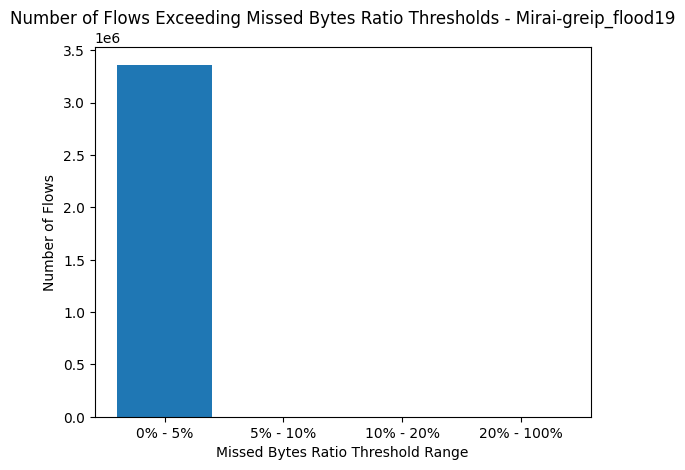

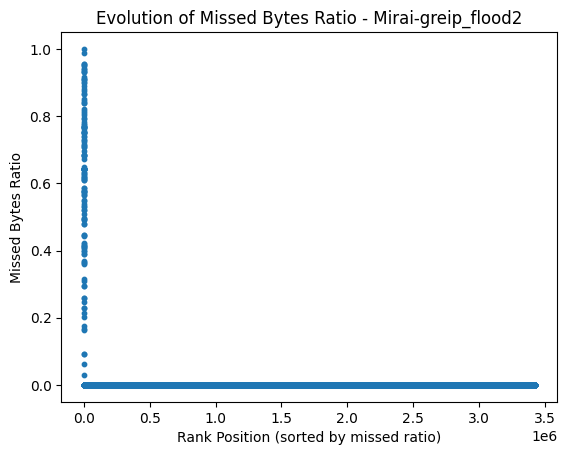

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3424337.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1480246  CRno2D46i0gWfxLnhb           inf    192.168.137.1      20036   
3408590   CCbP7PZNRxyMY3Vul      0.999998   192.168.137.29      51854   
10610    CYZmgF3ahEG5xbeoT4      0.988682  192.168.137.218      35348   
1480166  Crfc6A33wgvoqVH4Gh      0.953887   192.168.137.96      56004   
1480170   CoXnhf8gAZbX5t4d9      0.953855   192.168.137.96      48966   
1480225  CGfWwM2RHLsaKkEMhi      0.951984   192.168.137.96      52070   
1480229   Cv65LOIqcqLW1Fplj      0.949384  192.168.137.125      51754   
1480222   CvalndpBAxBttoLyf      0.940733   192.168.137.96      41740   
10611    CjqIRm3FZAOwXsfAn1      0.939003   192.168.137.96      55028   
3424257   CHeyv2CCRgY947LBe      0

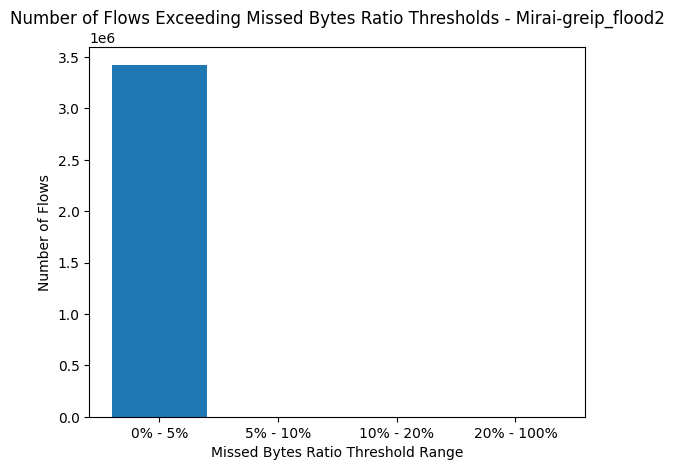

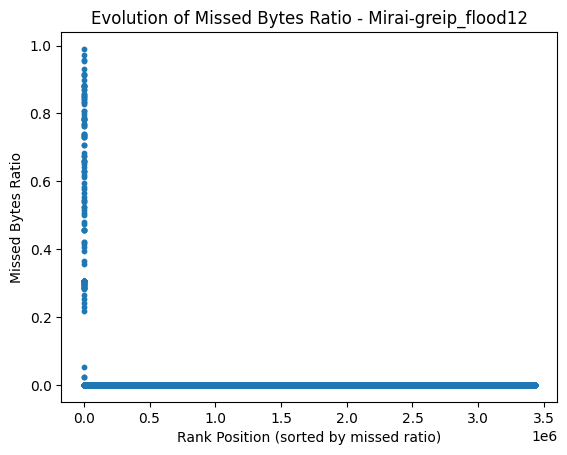

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3430339.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
914329   CoZizs3nhzudp0AaOi           inf    192.168.137.1       8857   
2315340  CHFMu84eNxPISFoIjj      0.990033   192.168.137.90      49195   
3430241  C6ewK72SqGLGkhKa3e      0.970823  192.168.137.175      47776   
610737   CUKOB52qSYXzfKA5Sk      0.958805  192.168.137.218      36845   
914331   CBfE2x3FoH6D19PWkg      0.953459  192.168.137.175      35504   
2343112   Cv7izU25vTugPi0BU      0.931964  192.168.137.218      54956   
914330   CEriPq4rAWUxs3k2g3      0.916236  192.168.137.175      42296   
3430292  CkcG5a4exLdF8wZYq2      0.914166   192.168.137.63      33282   
14756     CZcT1T0mujP5wPvvj      0.912690  192.168.137.175      38862   
914311    CrCzLj4Z4PehMjlr1      0

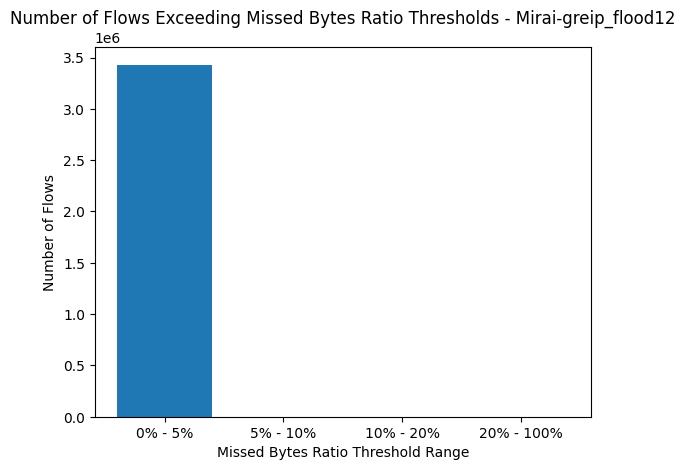

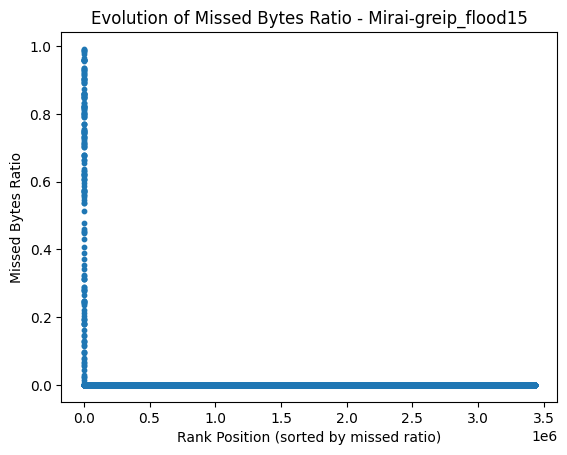

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3430991.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
3250855  CvoRYV3F9CoU4p0q55           inf  192.168.137.163      39996   
1040160  ClYAYj4pEoiCOz1MY3      0.991665  192.168.137.129      52031   
1040108  CE3apu16vGl1u1E1z9      0.989587  192.168.137.175      35186   
1040107  Cx6L4r2B9LattjEzv4      0.989587  192.168.137.175      35184   
2664356   CxJ00IdXWnkyBoYZ3      0.986558  192.168.137.175      48224   
1761993  Cf1eWa4lBH1bjZMeth      0.981122  192.168.137.175      36652   
1042993  CeqDZH1AEo1U3duMz7      0.977674  192.168.137.123      32804   
1040097  CXtuUT11TC0ZisRU3f      0.965590  192.168.137.175      49102   
527410    CENI711GRI4oFKFW8      0.959565  192.168.137.175      60962   
2807707  Cpgiq91KB6UVEL6hd3      0

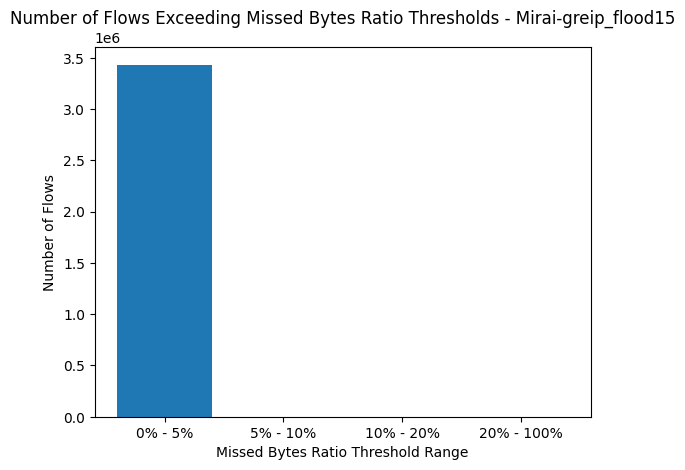

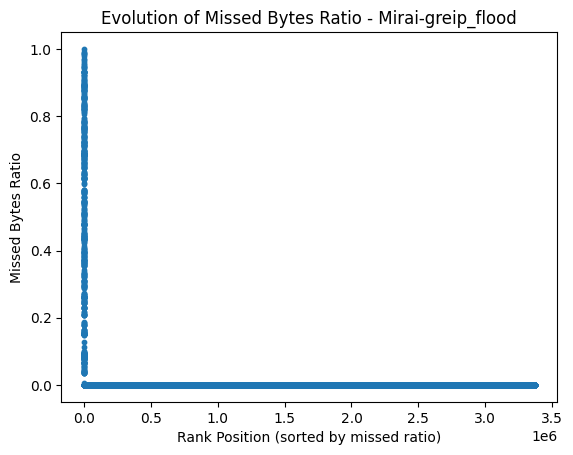

Statistics:
count    3.369788e+06
mean     7.696619e-05
std      7.048159e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1307703  ClPqjp41CcNRvGZxT9      1.000000   192.168.137.29      36497   
1037679  CH1CeB1cA7vMVB8621      0.989965  192.168.137.123      59302   
1038978   C0AxaijkrBJ8FFMa9      0.988546  192.168.137.123      59480   
1108566  CYqGkP18zaffxVLtKc      0.986299  192.168.137.118      60530   
1133238  CEGvEf2jtR1oFw5IMf      0.983590    192.168.137.3      33994   
1168494  CDf3aD1HKLXJRajNGh      0.978411   192.168.137.11      61631   
312802   CYCGLq32qoO50QCDQj      0.969581   192.168.137.96      38296   
744194   Cr5BA12zVELFOhemui      0.967381  192.168.137.118      47663   
750845   CP78XC2HgUHSGIPQQ1      0.959732   192.168.137.96      56120   
566122   C

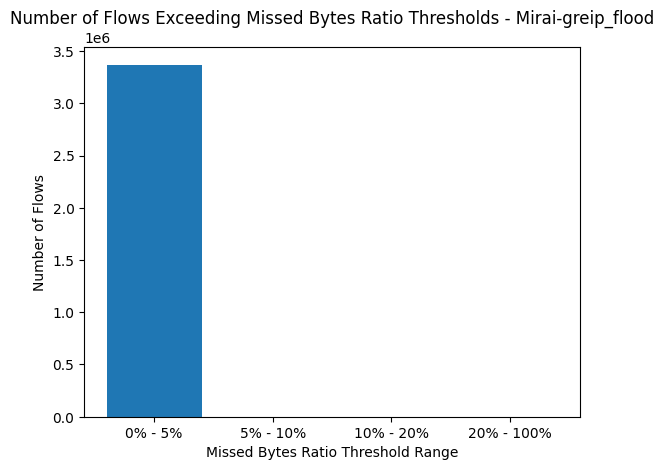

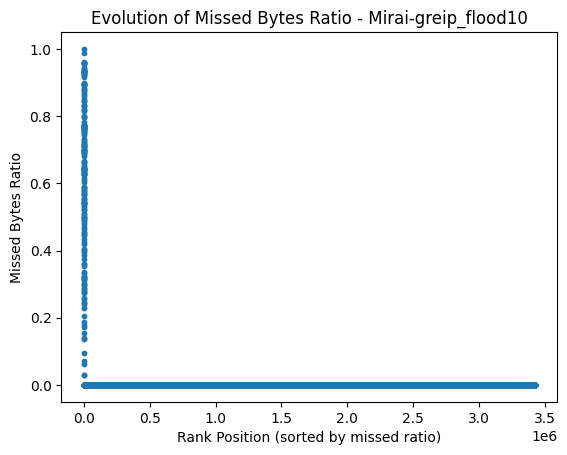

Statistics:
count    3.423291e+06
mean     3.566124e-05
std      5.018138e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999997e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
3021139  CQNB9G2JZ0BHLyOXqa      1.000000   192.168.137.64      43910   
2030679  CPkpqM2fWRppDev0Il      0.986978  192.168.137.129      49557   
2376721  CuYQFw2ncRY3na8zv8      0.960410  192.168.137.175      40538   
1863388  CyccpR1wemSIcmJefd      0.958955  192.168.137.100      40532   
1190616  CvZrbf3nyOF9c3tGqc      0.958805  192.168.137.218      56076   
1736499  CV3P0G2r9CNhwEqlN4      0.958805  192.168.137.218      57736   
1828219  CrHsZH1jkL2PfYPBP4      0.958805  192.168.137.218      34966   
40        Cqg1VozyaX2ZRdgQe      0.958805  192.168.137.218      57727   
2445138  C5dmRv1Oe3eUW2yda9      0.954572  192.168.137.100      50832   
2440119  C

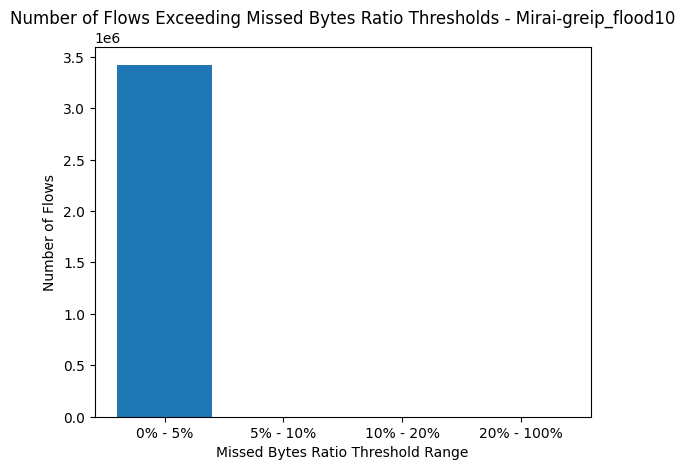

In [6]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Para udpplain

In [7]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/mirai-udpplain"

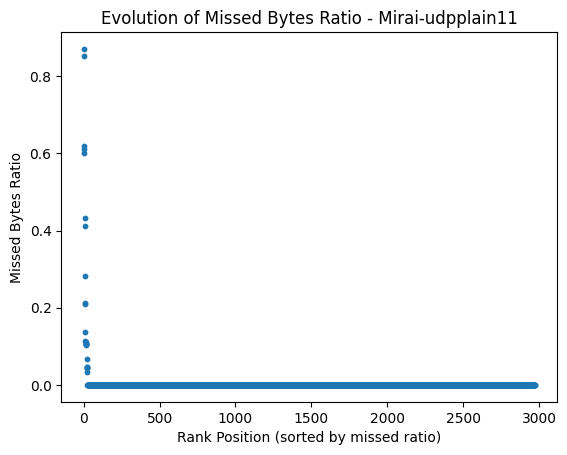

Statistics:
count    2971.000000
mean        0.002112
std         0.032978
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.870414
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2963   CdeQmqlyh5fzX9OX5      0.870414    192.168.137.1      26985   
2733  Cx68o63GWY8irDjLnk      0.852246  192.168.137.100      37705   
2960  C9wi1k2K7wUoaR2Ymh      0.619316  192.168.137.108      47112   
1911  CBpywB1bVi3SHoxycd      0.612069  192.168.137.237      62343   
2728   C6rcprxV85mRY7lPd      0.601580  192.168.137.100      37706   
1086  CfO6lY1qWSb9eAoMj4      0.431267  192.168.137.100      41778   
2758   CKo9uAkchICCLJtZ7      0.412879  192.168.137.189      41248   
2634  CwiwXi4J1HAwAQN3t9      0.283043  192.168.137.254      49134   
2579  CFNfWk30LIe11M1lna      0.213031   192.168.137.91      59413   
2348   CIrocH2Cibc1djBpn      0.210058  192.168.

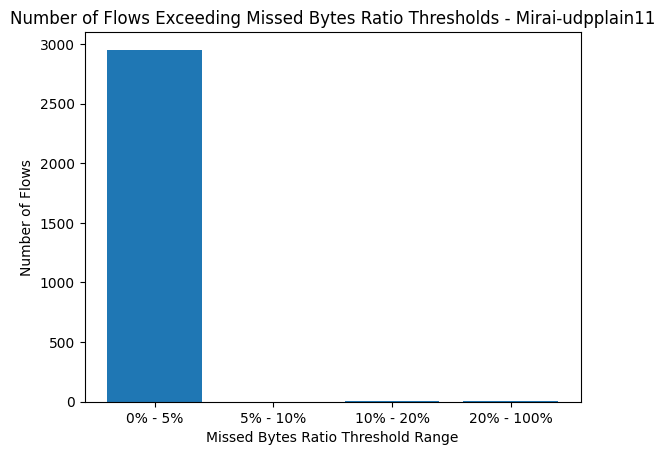

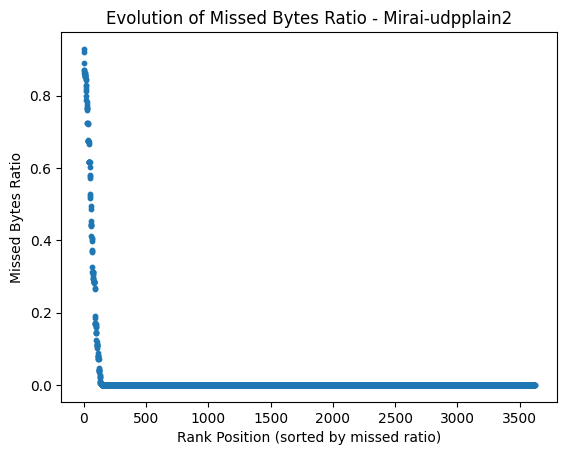

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    3620.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
3072  Cjd2uO28rxOgmqpdx1           inf  192.168.137.162      55406   
2485   CvvmP4pBJgR5UmYO3      0.929138   192.168.137.17      35398   
2683  CeVudP2pE9snIJLoEb      0.921634   192.168.137.17      35412   
1480  CAliEl4nkwLXgP5oGd      0.890967  192.168.137.103      51696   
1482  CmNyuq4i9hxQ4Ndq97      0.872019  192.168.137.103      35361   
1483  CLexY51eXa0IFHxI8e      0.872019  192.168.137.103      53131   
1080  CHq1822xzYqMrCi7vb      0.863210  192.168.137.129      51204   
1481  CwOk9g1HMGB43D13Se      0.862452  192.168.137.103      59508   
1479  CSW7kA3wH7UXi8w2Yf      0.862452  192.168.137.103      56014   
1123  Cf7sPO1MTfpKak6bBd      0.856112  192.168.137.103      54217   
1122  C03Uue4WMhjv

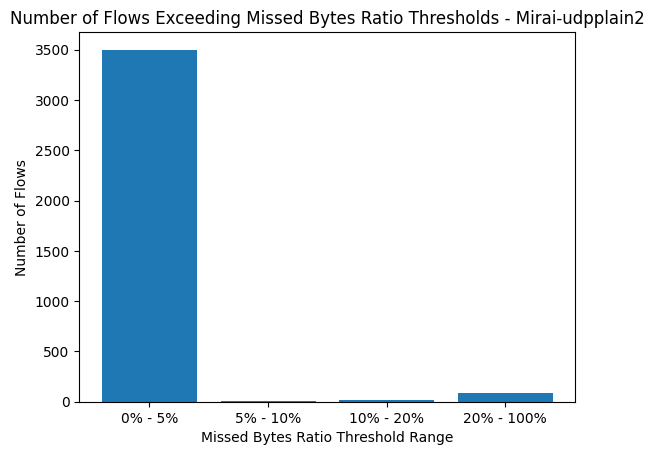

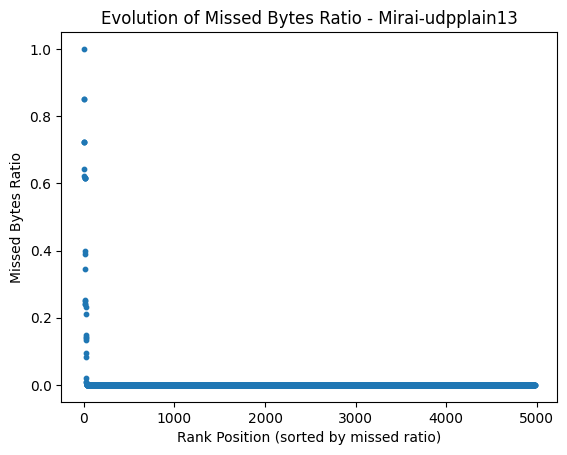

Statistics:
count    4976.000000
mean        0.002401
std         0.037987
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1408  CQt3ld2AuAmlqNHlEb      1.000000  192.168.137.224      56268   
3071  CNJVGf1Dvl2eBf123e      0.852144  192.168.137.190      34149   
6     CQLZ432XHtTJWsiMu1      0.852144  192.168.137.190      33968   
819   CSXT0S3H5h8OmjRIrj      0.722923   192.168.137.49      42006   
2539  C8yhrD13ZTDxySNkE6      0.722923   192.168.137.49      42467   
3585  C07e3m3kZ8KMpRyzbe      0.722923   192.168.137.49      40043   
3642    CJfW4GPwnWjCZGRS      0.642676  192.168.137.254      53208   
2775   C8IZ5RZoKNfNLbLki      0.621765  192.168.137.140      51612   
1491  CVuNFn2r69XrTdO13c      0.617106  192.168.137.140      40791   
1468  CD3CNZ3wNuIrVbkzic      0.617106  192.168.

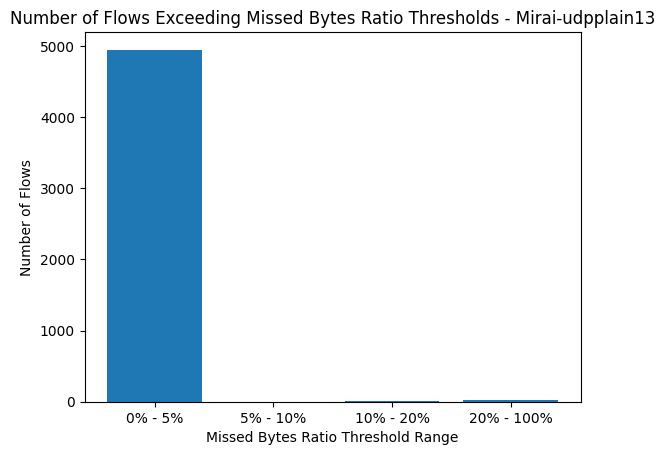

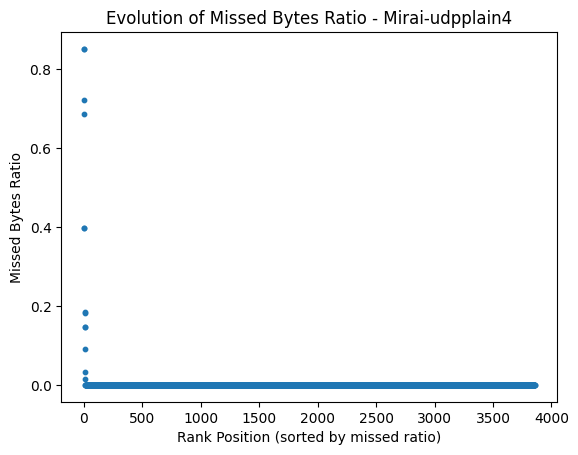

Statistics:
count    3857.000000
mean        0.001222
std         0.027329
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.852144
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
523   CadRAp2qr1LokMcNol      0.852144  192.168.137.190      60959   
2298  CIYwry4AW37DWQcdk3      0.852144  192.168.137.190      32980   
291   C1NOAB2Pi1byUiMjic      0.722923   192.168.137.49      56997   
953   CYjJi42JhHC9yw72nj      0.687287   192.168.137.75      46508   
3461  Cptwfx1aRJdR0Yshqh      0.398420  192.168.137.100      47704   
3729  CnGhsD2EcCQ64gru9e      0.398406  192.168.137.100      36906   
2044   CpAsfKs7ENr9q8JAg      0.185494   192.168.137.29      32768   
950     CJUgnRfh3VRHzLuR      0.182473  192.168.137.249      21746   
3730  CMivuC1lMaapyOqDXj      0.147754  192.168.137.100      36905   
835   CC6oNH3dBoxeFaHipg      0.147659  192.168.

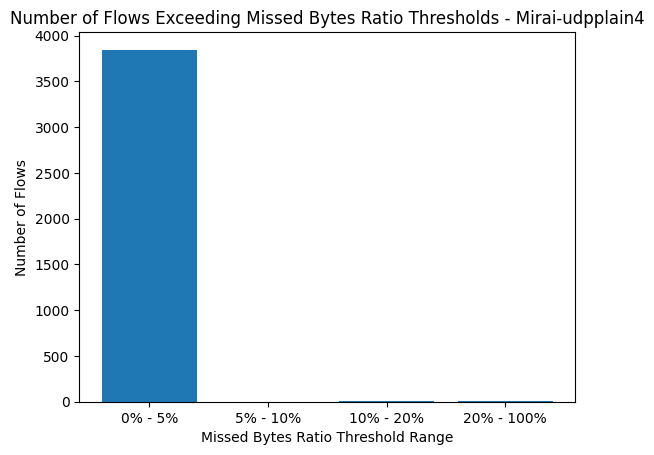

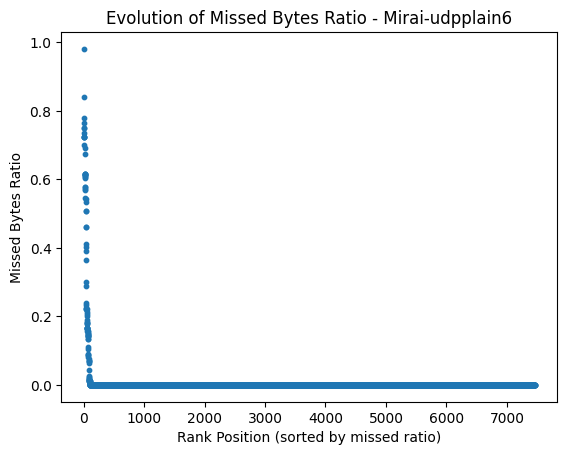

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    7460.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
6981  C49J203pHRprGu2Tfi           inf  192.168.137.163      35711   
901    CswgXn3YIjmiDF245           inf  192.168.137.190      44469   
902   CYGA5H1ljqamBndaff           inf  192.168.137.190      57358   
7405  C3ND694s06o3Je164l      0.980968  192.168.137.219      50226   
751   CprATP3bl2mePVfyab      0.841600  192.168.137.100      54434   
4987   CxQEcLsbE1Z5eOA26      0.778479  192.168.137.190      34414   
6135  CkPrYU1R34FXwVhJ81      0.765316  192.168.137.248      51540   
6134   CFPNriS2dY02d2ypl      0.748744  192.168.137.248      41035   
159    CjuBDaYDwBKNQQct8      0.748744   192.168.137.75      38369   
7402  CXb8Y44GtHOpea8wsa      0.736806   192.168.137.12      45914   
3132  CgMGws1QPknQ

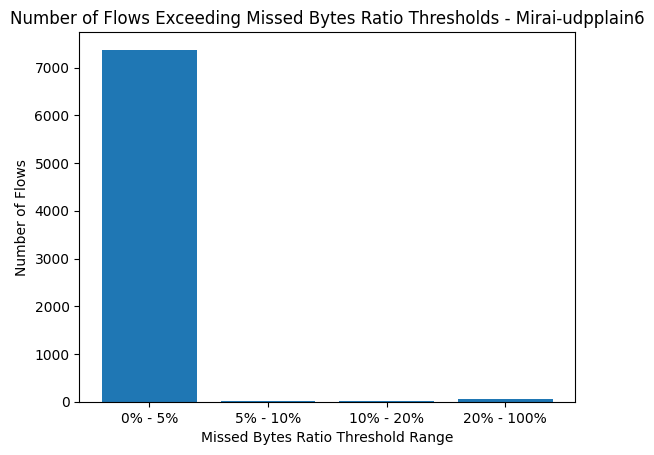

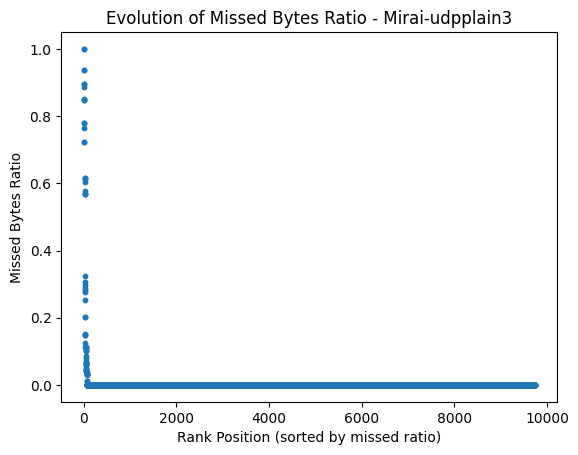

Statistics:
count    9737.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
7368  Cv3WsA28xebX6y3nvc           inf  192.168.137.206      49188   
8617  Clw3QT3F2pBELGiMu6           inf    192.168.137.1      60713   
7675  CVaHy14hAEuR8gPEUb      1.000000  192.168.137.206      43672   
457   Cya2M04b7B3D23T6Za      1.000000   192.168.137.29      40898   
2408   CoRaZAktuumorE1ze      0.937500  192.168.137.176      63822   
2693    CEEzVoEG0Ry7I9Ct      0.937500  192.168.137.176      65338   
8715  Cnsl9j23AAWUSOu3r1      0.895464   192.168.137.29      44298   
8748  CkNZO54UGz60CzU1Fi      0.895464  192.168.137.231      33122   
38     CrEwXfupkZ81DFcTl      0.888045  192.168.137.254      42788   
79     ChwcY3GZEvO9wfcAf      0.850992  192.168.137.209      42378   
75    C9dSnZ2bEmTR

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


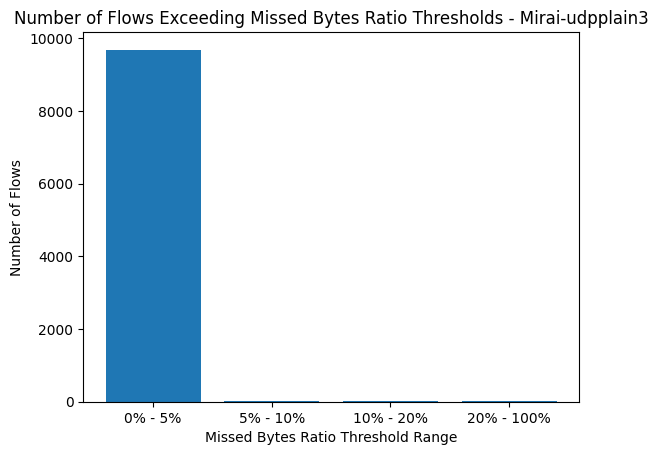

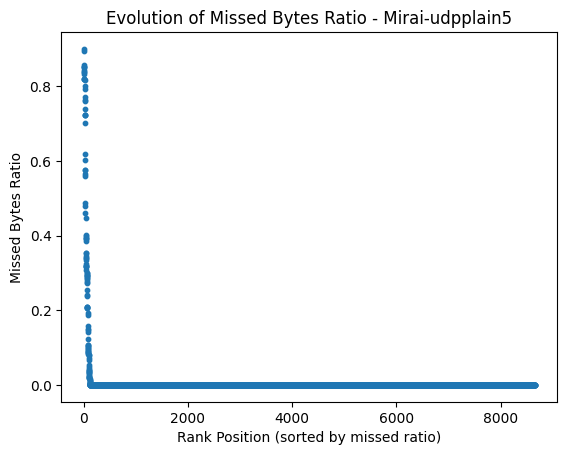

Statistics:
count    8654.000000
mean        0.004519
std         0.050732
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.899818
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
4161  CdFkjd3zIfBj1CARs8      0.899818   192.168.137.75      37659   
966   CRvgql1avZPFgFWjxg      0.895464   192.168.137.29      44318   
5461  CZEEEN1WTSQY7HykT4      0.857922   192.168.137.92      39558   
4363  CSh5wy1GnFP5bbmC4i      0.852144  192.168.137.190      33486   
7566   Ce9rZOfuSrgM9qCCk      0.852144  192.168.137.190      33850   
1338   CiCGXY2uekOKFCRht      0.852144  192.168.137.190      33239   
1193  CE7xEq38e07rgcWKii      0.844300  192.168.137.100      54422   
2494  Ca8nMg1Po40DWfRoGl      0.839353  192.168.137.254      41926   
972    COJDir1WaCRFYXEB6      0.837023  192.168.137.254      52830   
974   CJy2i5177InAJUz84g      0.831453  192.168.

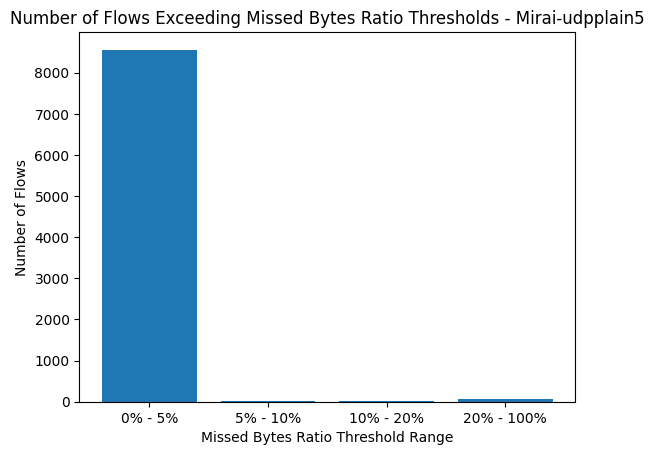

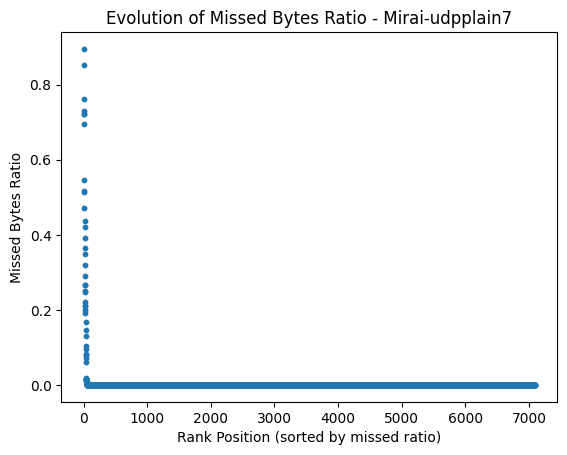

Statistics:
count    7092.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
6285  CHfGwg3HdaNAVNbMS6           inf  192.168.137.163      36907   
6256  Cbb44q32h8JM7kLm9d      0.895464   192.168.137.29      57326   
980    CGvd9gz6iLDRov1xk      0.852144  192.168.137.190      34696   
6275  CMMMyW2WJlie22UTrj      0.763197  192.168.137.108      46638   
3304  CrCFhb4qkms1M8QHKc      0.730534    192.168.137.1      65491   
274   CiIOv62sviqeg6eAy3      0.722923   192.168.137.49      52974   
4901  CXZefu3hZl46zTegG2      0.722923   192.168.137.49      56110   
2180  Cl6jHz17CdMANzdmec      0.696195   192.168.137.49      34977   
6255  CXmiZD45h1AiO1AFF9      0.546700  192.168.137.231      33922   
6241  CqULxG2njVNb7t2vkj      0.515588  192.168.137.129      50312   
6279  CeTuga25137L

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


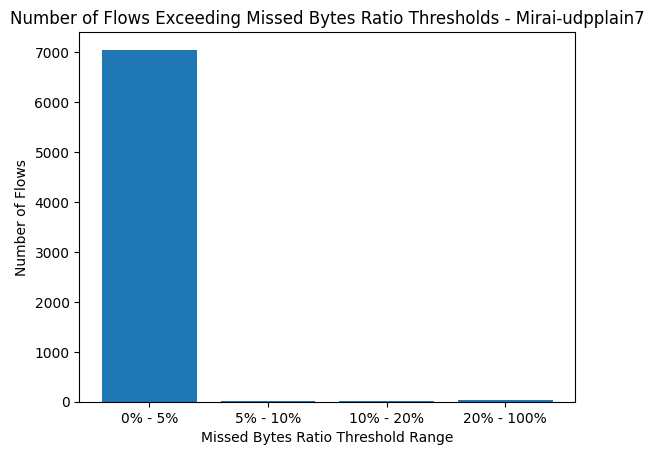

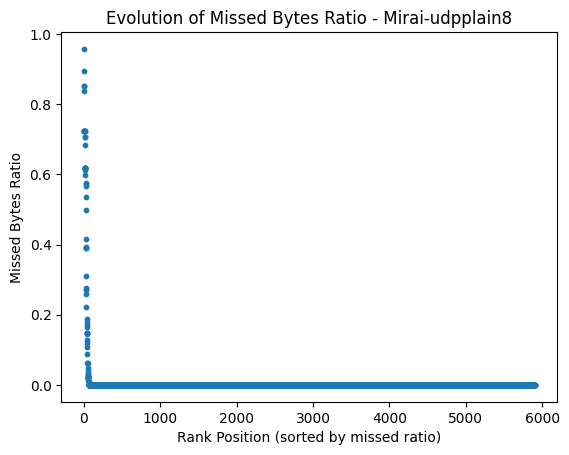

Statistics:
count    5902.000000
mean        0.004004
std         0.049031
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.957938
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
703    CxytYKnl7MPFGFCJ2      0.957938  192.168.137.100      41348   
4007  CG8wgJ1gpT9SDBEjD5      0.895464   192.168.137.29      44292   
3633  CnYNaT34sneWgv6e28      0.852144  192.168.137.190      46929   
679    Czj0b9eIq93TTWCF9      0.852144  192.168.137.190      46671   
2031  C0Jsvo4dQlO6gx5EU6      0.838487  192.168.137.190      48024   
52     CB9z2kjWJnEwn1Mij      0.722923   192.168.137.49      54250   
814    CTklRWShjQwqyRqpb      0.722923   192.168.137.49      42020   
4678   Cc9ts1njTygNH3OFk      0.722923   192.168.137.49      38809   
3687  CUEygC1w04ds2OKAT2      0.722923   192.168.137.49      39050   
2458  CcMsvP3kucSrycbl3b      0.722923   192.168

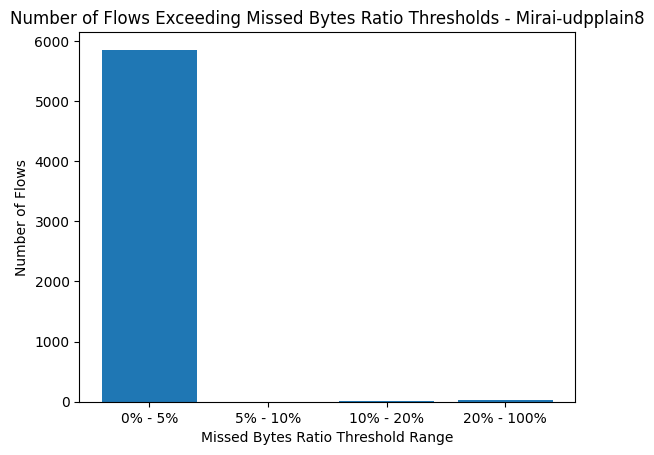

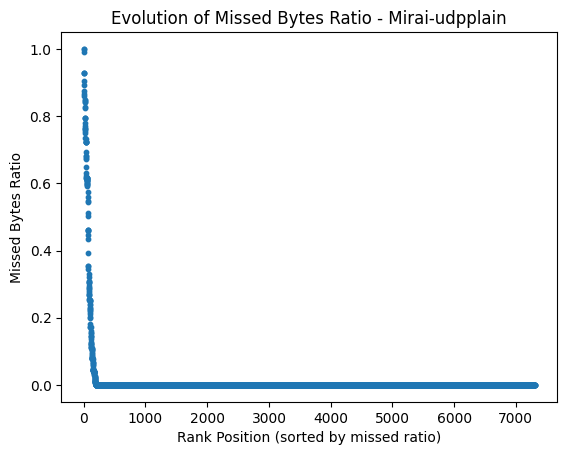

Statistics:
count    7306.000000
mean        0.008954
std         0.073199
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2508  CTGPKh3eeUbtoUtZi3      1.000000   192.168.137.29      44085   
5122  CszpJT1S8hRFmWfZJ6      0.999999   192.168.137.29      40623   
6400  CHZcVf1FCXxL5YbJjf      0.991576  192.168.137.129      61471   
6301   CY199lzzG7n3P3Zb9      0.929004   192.168.137.17      58356   
6086  Clc5Wc3K2JstjiSSV3      0.929004   192.168.137.17      53812   
6536  CvPZyh1iHXbrJhMAOh      0.929004   192.168.137.17      53822   
7292  CCsFwS3uiBoWYyFCi5      0.903595  192.168.137.209      36720   
2551   CYj4gBIMEcXAPZ6Ic      0.893269  192.168.137.184      51332   
5807   CqpuICZtZSwP62wWe      0.875796  192.168.137.237      37447   
6080  CvHUw02nW00h5J82th      0.865106  192.168.

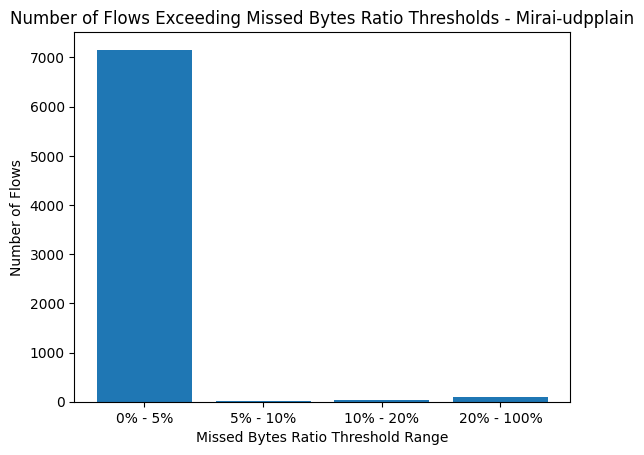

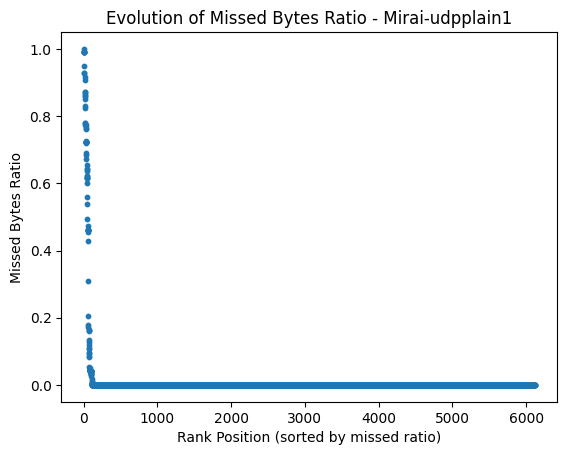

Statistics:
count    6117.000000
mean        0.007667
std         0.073626
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
4573   CP9AOq2hbwpB8BFC5      1.000000  192.168.137.112      54736   
2252  CFFYfn2qGcip8i0URj      0.991626  192.168.137.129      61600   
5301  C10Gs74oQeI1KItAx5      0.991612  192.168.137.129      61667   
5299  CE7YAU1CeHDfTz56Vc      0.991603  192.168.137.129      61664   
5300  CJUrtM3NjcbR30fTP4      0.991590  192.168.137.129      61663   
5302   Cc1spvodnov1AWyz2      0.991589  192.168.137.129      61665   
5304  C2pdZR17a6MKWy0aec      0.991583  192.168.137.129      61668   
5297  CWK7r53hEoiClkyaO2      0.950385  192.168.137.129      61666   
2144   Cc4Fyofe9z1xuO59e      0.929149   192.168.137.68      53432   
2249  CaOgek20Tmf1Hd6sk7      0.929149   192.168

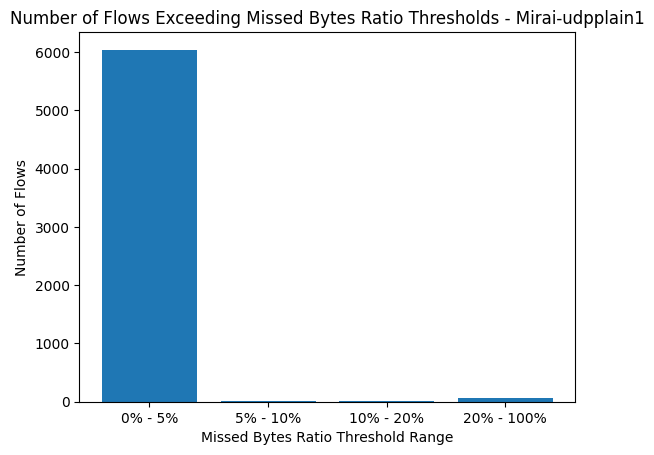

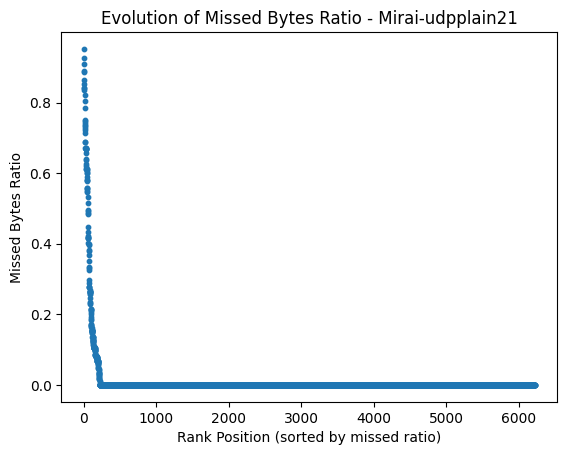

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    6216.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1678  CiFxi53Rs19kjVIZii           inf  192.168.137.121      45158   
4486  CNIo1a2UTduKl8Dbml           inf    192.168.137.1      32443   
2962  Cvy2q24g69OzkmWhAd           inf  192.168.137.121      33226   
3941  CK9kQg4AbavoueQpqh      0.952091  192.168.137.228      42368   
1251  CVbODB2VUgAGIHBfE6      0.925408   192.168.137.77      42668   
4685  Cp3UHq3kcOEbPKDaN6      0.910329    192.168.137.1      32416   
3612  CxZzT827F4MFGJr4g8      0.888567   192.168.137.12      60610   
2197  CI8n5K1lWLcwb59kY5      0.887878    192.168.137.1      32258   
2209  CpPKOk2r8ULX4D5tmc      0.863994   192.168.137.12      53916   
2200   CHzvXjjI8BjMVAXE4      0.852226  192.168.137.100      39767   
3669  CRWHDS2V7nzs

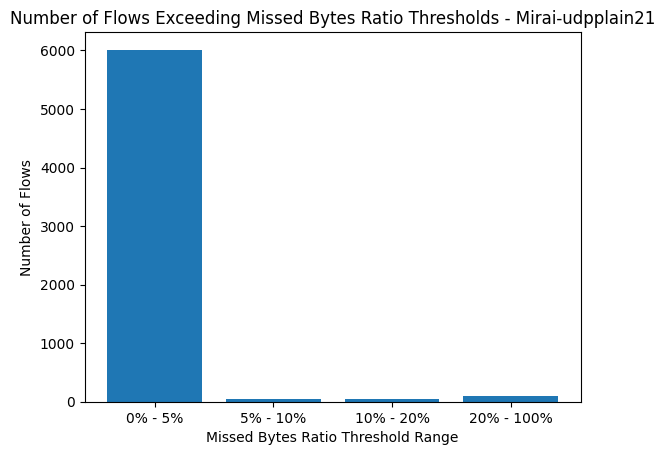

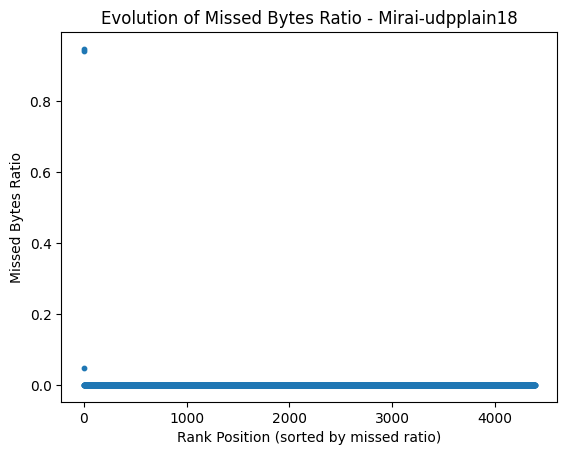

Statistics:
count    4385.000000
mean        0.000441
std         0.020145
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.946374
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
4371    CmqV4gELRex7kwge      0.946374    192.168.137.1      19013   
3214  CEfEQr42ncH8HI78a3      0.939170    192.168.137.1      18938   
4324  CiMRAj2u1yzBRXV1A4      0.047983  192.168.137.162      52886   
2928  C9uzlT2TudBclA5zS3      0.000000  192.168.137.242      32899   
2926   CceSM3opWZASYBD1k      0.000000  192.168.137.242      40092   
2925   C42uXe3V7LLx6nUvB      0.000000  192.168.137.123      40765   
2924  CT13Sp4UGglD5MHA2g      0.000000   192.168.137.91      54797   
2923   Cb2woFkxqOoC0FBge      0.000000  192.168.137.100      36041   
2922  CtEYgw3xoZgCl8Vesb      0.000000   192.168.137.91      54650   
2921   CMqiCe7yhjGG6Nurh      0.000000   192.168

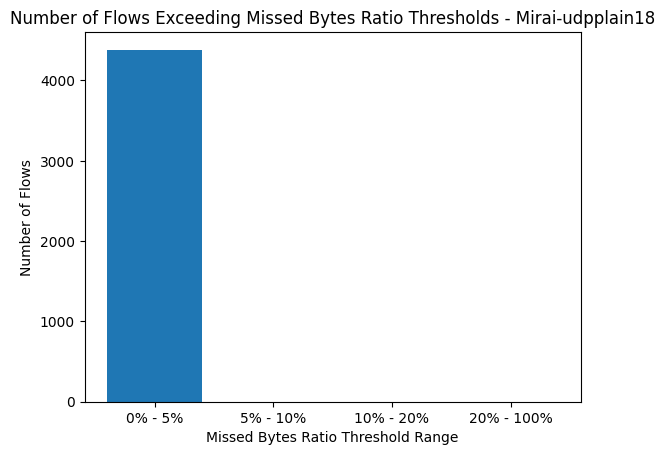

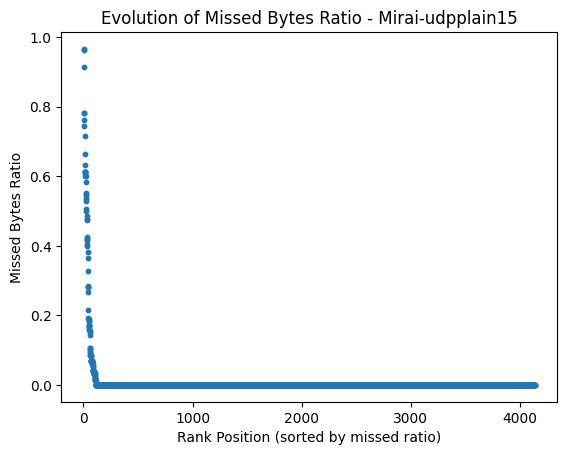

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    4134.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2140  CGrbcR2LcnYqnAvEs5           inf  192.168.137.121      42330   
3404   C7mpxsOvAGQNC4E4h           inf   192.168.137.12      48286   
3418  CQhJit4HCyqZDHGoif           inf  192.168.137.121      40390   
3966   CA7FLyeXq0JihBVAi      0.966135   192.168.137.12      40024   
2396  Cd5Ggc3D8WANFXjScl      0.964286   192.168.137.92      42842   
4063  CzIGxq3p9kJx99WHn2      0.912792    192.168.137.1      18185   
3116   C66mjx0YjRNb2ib75      0.782222  192.168.137.100      39346   
3974   C6FfJn64ZTdrDUsQg      0.781986  192.168.137.100      50149   
3354  Cl0Xvv4DODhMwN2tJd      0.761414   192.168.137.12      56994   
726   CNK5oa2W5LIYuxiTWf      0.745011  192.168.137.254      42180   
3535   CATGEpl6Xxr

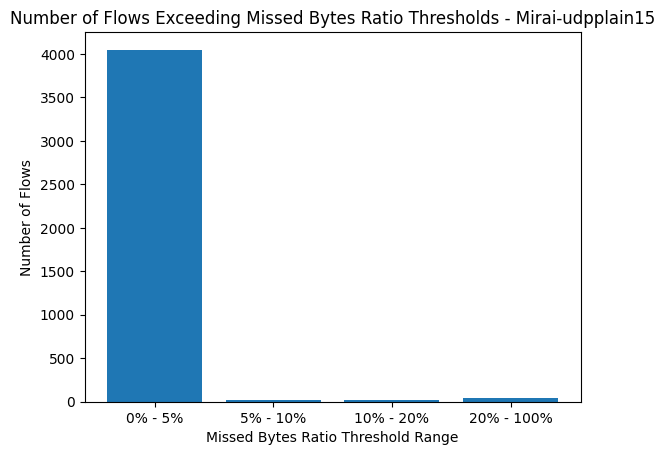

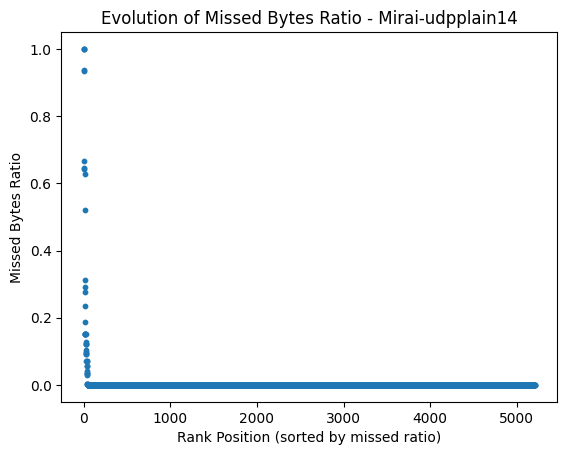

Statistics:
count    5207.000000
mean        0.002245
std         0.037420
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1801  CgFKc32AOBQmGvU5hf      1.000000  192.168.137.129      50836   
1035  CaqIM51eDNzMgr8k2b      1.000000   192.168.137.91      35105   
563   CoVlTQ1UscTvTZblCf      1.000000   192.168.137.91      49797   
5083    CILGc5FhR3gUq8U8      0.937110    192.168.137.1      18049   
4796  CRrPwr1s4ycD6YYCe1      0.935507    192.168.137.1      17915   
1190  C5Cgsf4qJBkLLQ3Dfk      0.665747  192.168.137.108      48646   
4823  CrMtA51GHhAvAcRjHc      0.646265  192.168.137.228      38774   
4824   C0ls6pnIPuhVe7jJ6      0.642173  192.168.137.228      38772   
4822  CnqAgF29iyOeXlFG82      0.627683  192.168.137.228      38776   
4728  CGDDPj4LMFfNiFmvGk      0.521944  192.168.

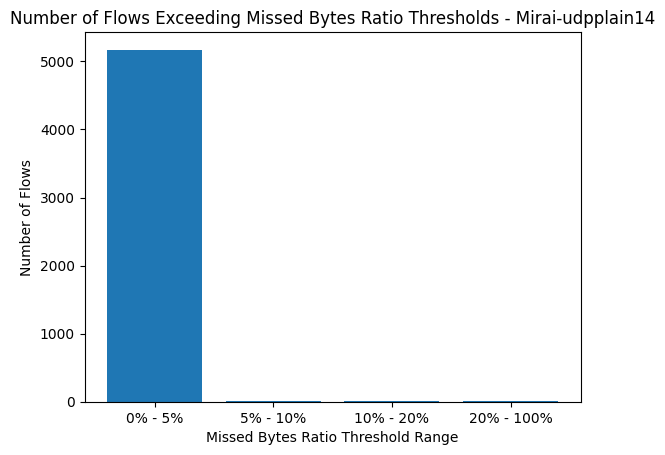

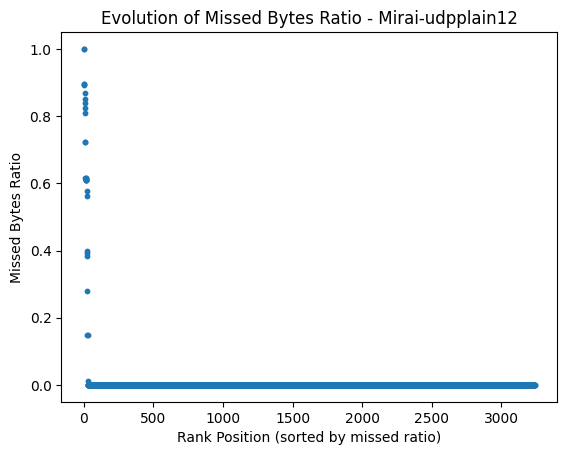

Statistics:
count    3239.000000
mean        0.005599
std         0.063629
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999999
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2127  Co8e2C1djzCencHap8      0.999999  192.168.137.129      49647   
3128  CD0SRr2wQtLEyuoxhc      0.999998  192.168.137.129      49632   
1810  CTtdch4q45akHjhlB6      0.895479   192.168.137.29      51900   
1756  CnU0QT1RwvosnIdUg1      0.895479  192.168.137.231      57360   
2810  CYTpOC3Ss6YMzTOoxb      0.893269  192.168.137.184      36687   
1811  CEFUkV1osnQTv8Pxwg      0.870161  192.168.137.191      45042   
1795  CXsFv21R1JcHSEJL11      0.851235   192.168.137.92      41504   
3112  CpgwHU2yzbTqfEURY3      0.838999  192.168.137.100      60571   
2822  C5rIbE3VGT7ylCK15g      0.824267  192.168.137.184      36689   
2161  CATyD84F9VL6PZqZkd      0.810563  192.168.

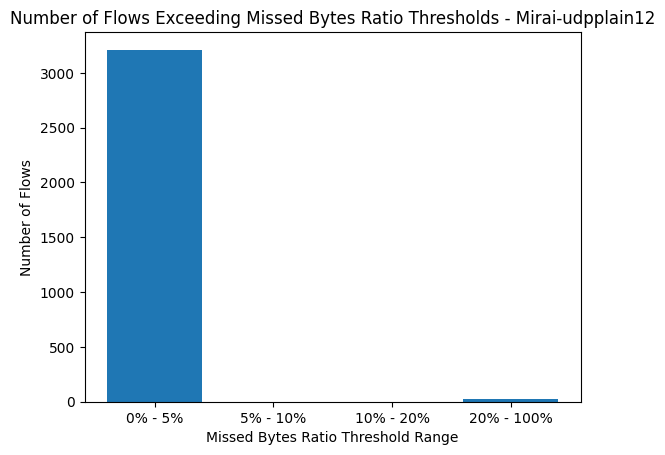

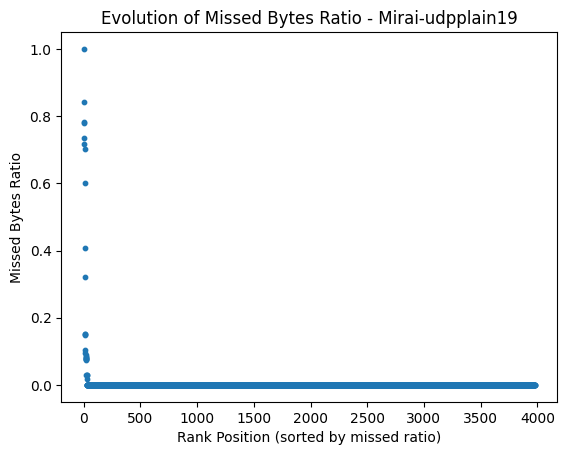

Statistics:
count    3977.000000
mean        0.002085
std         0.036276
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1401   COTeAsFPNRjOvbKak      1.000000   192.168.137.91      49961   
1714  CjE4KH1CmUI17rIZ1l      0.843125  192.168.137.172      44258   
3800  Cj2uj43kVjObiEjHb6      0.781995  192.168.137.100      47311   
759   CnAjd93SegP83ciVD8      0.778348  192.168.137.190      35087   
3870   CXT6mScZaCQMC0tjj      0.734441    192.168.137.1      31903   
1837   C7o9OF3Na6KdC1hTM      0.716964  192.168.137.100      50177   
1319  Ca7FSe3GIKzKgzNbR6      0.702229   192.168.137.49      33495   
3913  CgpsOI32udSvISHkog      0.601622  192.168.137.100      47312   
2006   C4uTQuA2kgzCHSPJk      0.408420  192.168.137.100      39376   
1954  CcPZMs2C9ajoPjLj2b      0.320155  192.168.

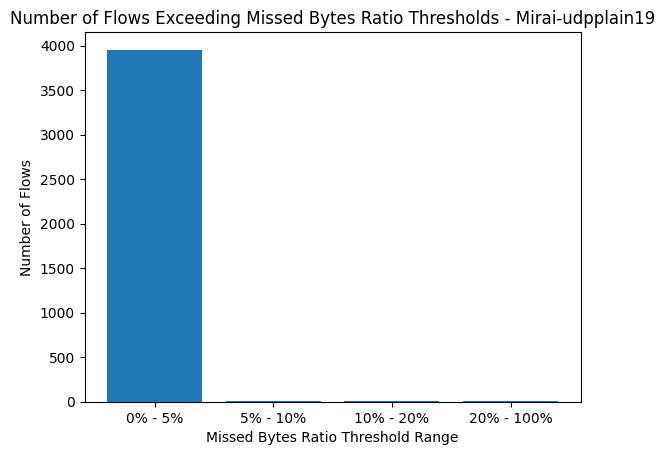

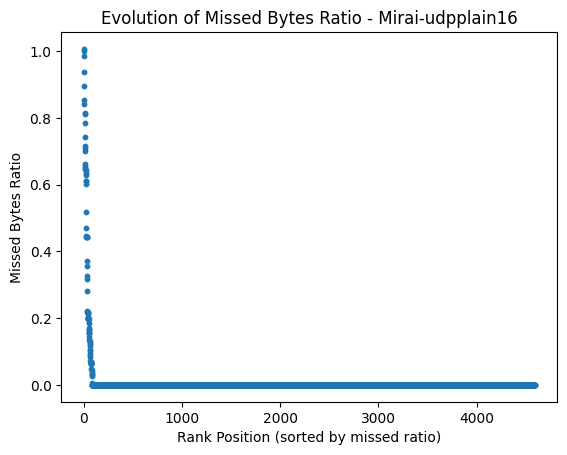

Statistics:
count    4592.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
350   CdN2o916Q6IRB9MkXa           inf  192.168.137.121      55810   
1654  CypdJM3se9Z5HviEda           inf  192.168.137.162      47054   
3757  CLmoJ647oswIg4rkki      1.006250  192.168.137.228      54148   
2688  CrmhLE20VCY47BO1Fb      1.000000   192.168.137.91      49892   
2142   C9ZFk6v3GKmYQKGYf      0.985093  192.168.137.158      50494   
418   CWcnIn4q17WY41BNRj      0.937500  192.168.137.185      50246   
658   CdOaxy4SXjclH3Iojg      0.893805  192.168.137.185      64979   
2947  C5GsJM3XMrwOzXQMZ4      0.852236  192.168.137.100      39351   
1458  CM8Vz83HdE1X6opIU9      0.840743  192.168.137.162      47050   
2991   CGIfL3qyYk1QeMd46      0.814401  192.168.137.121      58348   
4324  Cm4El62k24Tu

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


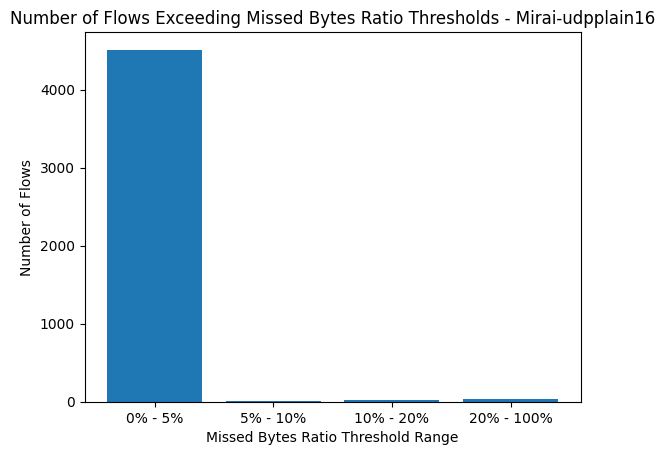

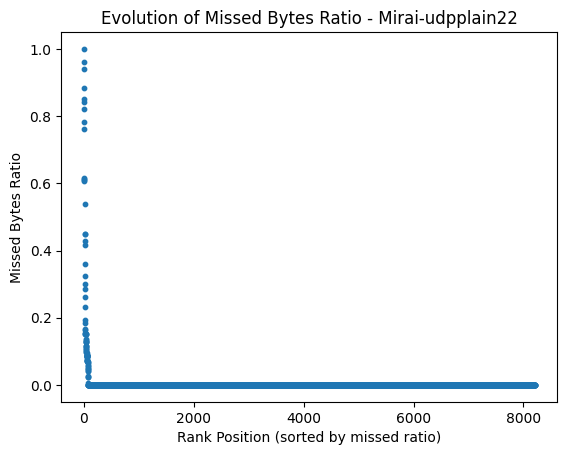

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    8205.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
4132  CA7YF41XfXikjCF01f           inf  192.168.137.190      41719   
4135   COspDEI1bU2Nx4t05           inf  192.168.137.190      44160   
7533  C1xbl91Wpa7ARyZORg      0.999995  192.168.137.129      52326   
1916  CLXPzE4r8ZjApjuZN8      0.959732  192.168.137.228      47464   
7449  CY4qBf3U0KtVyh95yk      0.940062    192.168.137.1      32915   
4398  CMeBKK2qPP25tPGOO9      0.884010    192.168.137.1      32733   
2901   CowMn14AmWqzdix7R      0.852363  192.168.137.100      54903   
5596  CzoLHw3atJUG4p5of2      0.842981    192.168.137.1      32903   
4276  CXiDJ62mhg71b4zVJ2      0.820305  192.168.137.108      49644   
4396   Cw3NnC1ujkdJsRBYh      0.783666  192.168.137.100      47783   
2313  C3p9St3aRg0Z

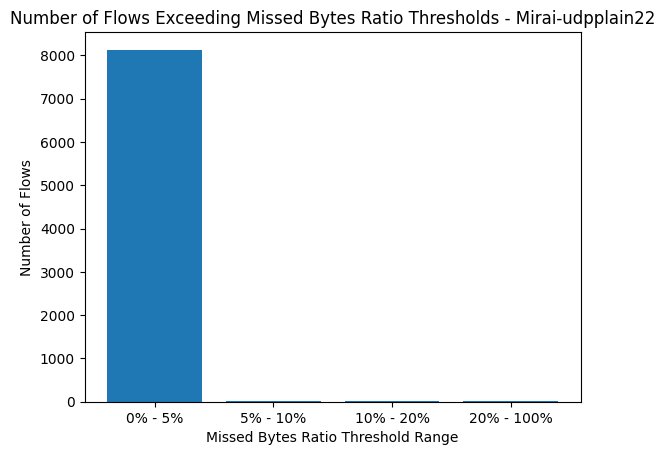

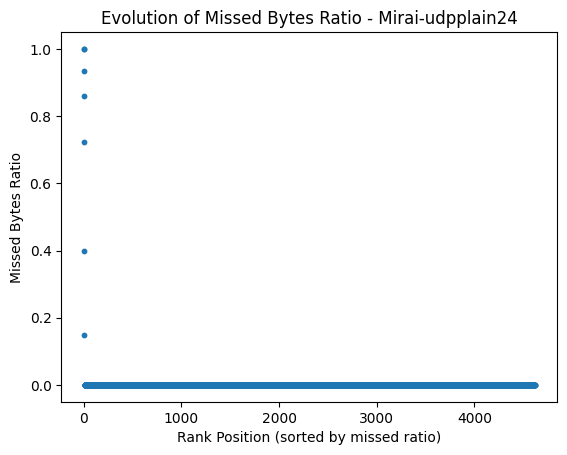

Statistics:
count    4617.000000
mean        0.001096
std         0.030551
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
3670  CVoHLh3FtIvouiGIE6      1.000000   192.168.137.91      56316   
3288   CofAJiVx5jmhHXBMf      1.000000   192.168.137.91      39698   
4033  CGzac918NHf9sIyva3      0.933368    192.168.137.1       5597   
4450  CBbu6I1wVKFFnOia8d      0.860019    192.168.137.1       5680   
299    Ci2qydABmAi9WR2k5      0.722923   192.168.137.49      45219   
563   CpCoxB1jXAF2RHH5Yd      0.398448  192.168.137.100      54922   
562   CNzI221jjCgJsr10Wk      0.147764  192.168.137.100      54921   
3081  CgiVCo4qkcNioHddTb      0.000000  192.168.137.121      42266   
3080  ChbUMa1dVHF8iDlX77      0.000000  192.168.137.121      57435   
3079  C7JbZu4bndF9R7J6Mg      0.000000  192.168.

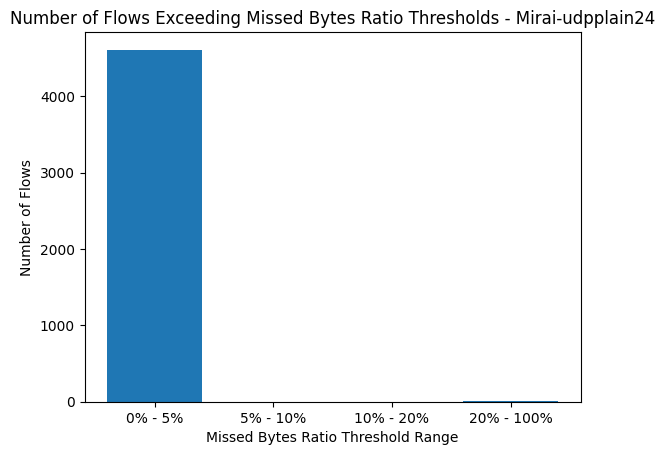

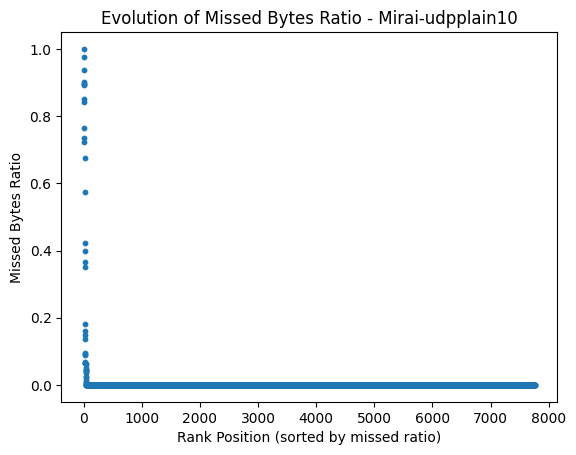

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    7760.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
194   C7bKm425pC0vqgNodl           inf  192.168.137.163      56368   
5721  CJ80ny3o4BXkZiVpDe           inf    192.168.137.1      13867   
4971    CRru5UT61GDtxJQC      0.999996  192.168.137.224      56135   
2954  C98ZHJ2seNt3Hm3rPe      0.974583   192.168.137.29      38176   
5984   CZBamqQlCmAO5QNV2      0.936759    192.168.137.1      13802   
6837   COqD46sEeu95c7iVh      0.903038    192.168.137.1      13895   
6904   CIOBfY1K4fg89k75l      0.895479  192.168.137.231      42290   
6933  CvTDLp3etEmBC9wsA2      0.895479   192.168.137.29      51882   
2223   CIugxTX4Wqr4tr6Lh      0.891785  192.168.137.228      48842   
7248  CpddI43lDGhum2jCMh      0.852144  192.168.137.190      33409   
6893  CxGSse2HgYAE

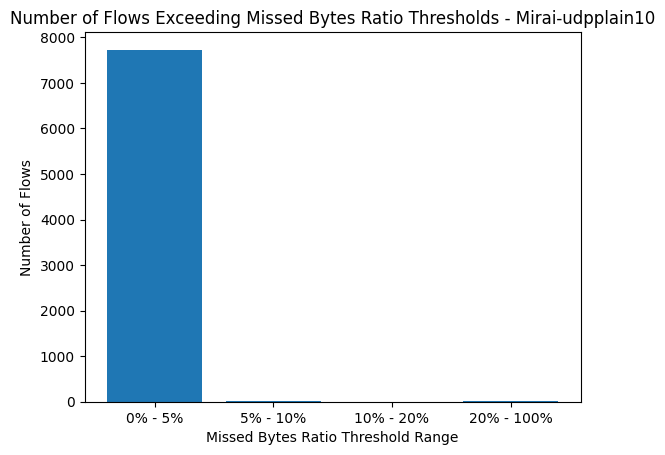

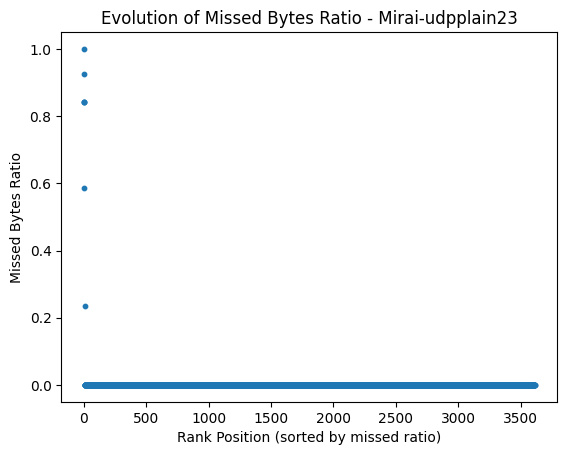

Statistics:
count    3613.000000
mean        0.001460
std         0.034822
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999975
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1466  CaDCHh33T9x6KhFcLe      0.999975  192.168.137.129      52412   
2339  Cngf4l4Rl9mPic31H3      0.925587    192.168.137.1      33061   
2907  CO0Z1B4Z63RAE6rXAk      0.842981    192.168.137.1      33175   
2908  CdJIhH2wMgV9yhX6J9      0.842981    192.168.137.1      33176   
331   Czfdrl1KdrHbhFdeP1      0.842981    192.168.137.1      33022   
3260  Cp0Asn1tcZ9ZQPmb4d      0.586425  192.168.137.190      49892   
2292  Cb9zzE4laS73Cojv2c      0.234903  192.168.137.129      52406   
2408  C4dxh13UtJufGnafXh      0.000000  192.168.137.179      45572   
2407   CriFoq5SiHycdtJI6      0.000000  192.168.137.129      62293   
2406  Cv8RjG3q2QEuK4M7j1      0.000000  192.168.

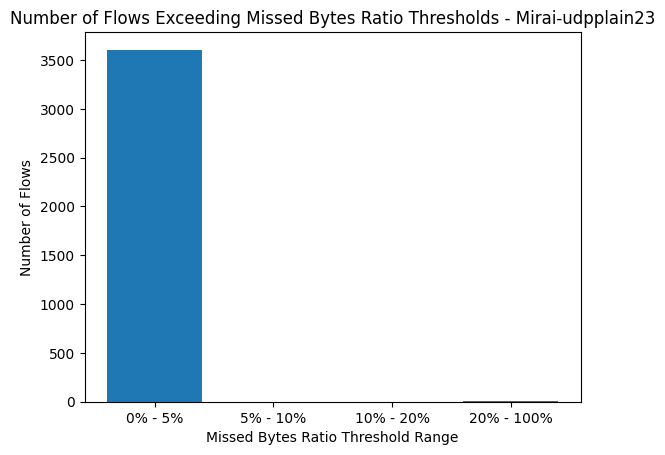

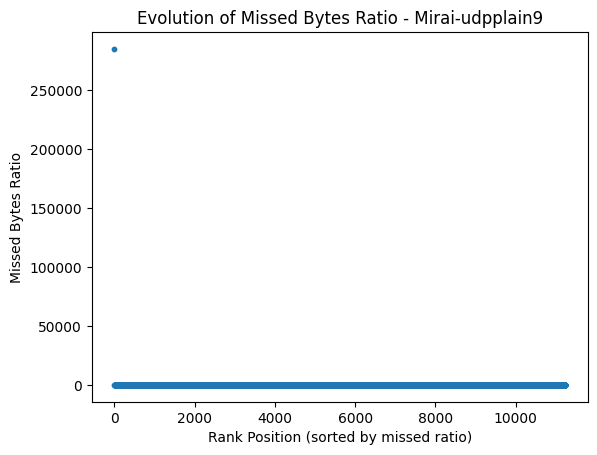

Statistics:
count    11240.0
mean         inf
std          NaN
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
10576  CBtsM14WkG4kjzY56i           inf  192.168.137.163      56362   
7562   Cddgx14DpZkWt8coTh           inf  192.168.137.163      56183   
7650    CZAvJoL7gPjI5Ifhf  2.847128e+05   192.168.137.91      33868   
4271    CLvol5mwxoBX0vp0c  9.999993e-01  192.168.137.224      56082   
5133   CbIXj14A57lx36biO3  9.999992e-01  192.168.137.224      56081   
587    CnynFr45LOhsBG0pTe  9.999987e-01  192.168.137.224      56046   
10815  CyjwMs4lZR6O2lQLn3  8.954790e-01   192.168.137.29      59076   
900    CQWYI81lCKDhHvM5B6  8.954638e-01   192.168.137.29      46996   
2841   CPowjJ1aiYZEIHrm9h  8.954638e-01   192.168.137.29      33944   
4582   CW2ifT1YWeTk2yVIX2  8.954638e-01   192.168.137.29      39446   

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


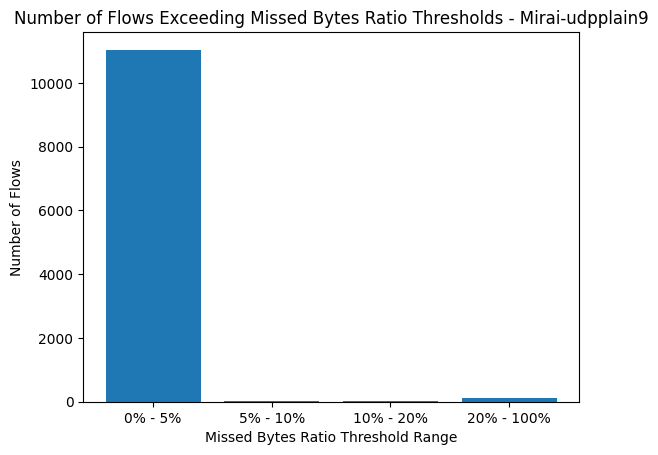

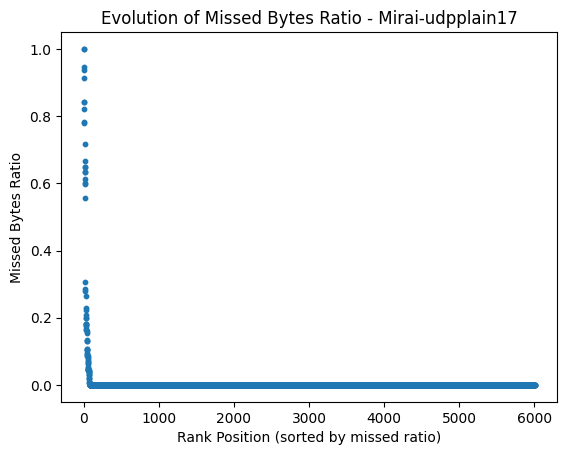

Statistics:
count    6004.000000
mean        0.003551
std         0.046290
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         0.999995
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
3824  CKBcZx45OQqWVVv98a      0.999995  192.168.137.228      44898   
4585   CSrdUlTLox4tAG7Qi      0.999990  192.168.137.129      50973   
3447  CB08Pz1j7nzNp22NWi      0.947220    192.168.137.1      18662   
507    C2NSP2V2RQ8BvuvI3      0.937500  192.168.137.185      51941   
5983   CB2DhC4mJ2H4bI5E4      0.912540    192.168.137.1      18748   
4478  CmU3Gy3FMDGYVXNSqh      0.842981    192.168.137.1      18784   
5372  CNMC4e1vzdFVwmznS7      0.842981    192.168.137.1      18842   
4407  CB5uAL1m9jBAn1hq9a      0.820305  192.168.137.108      48826   
1940  CLJoVa2QubRTfuso69      0.782974  192.168.137.100      47364   
2603  Ci5xZr1o2XLzserPje      0.778669   192.168

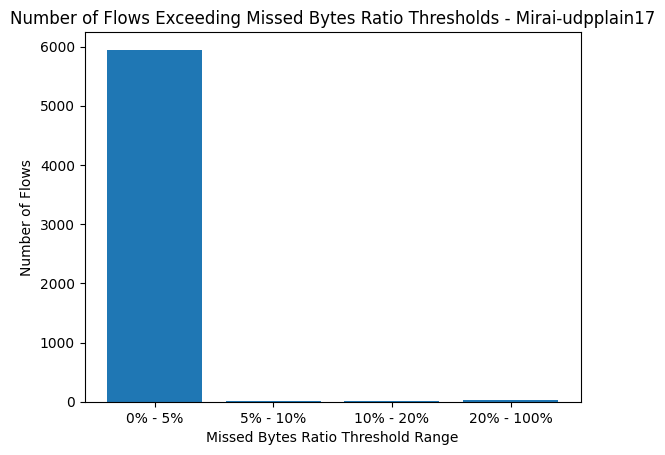

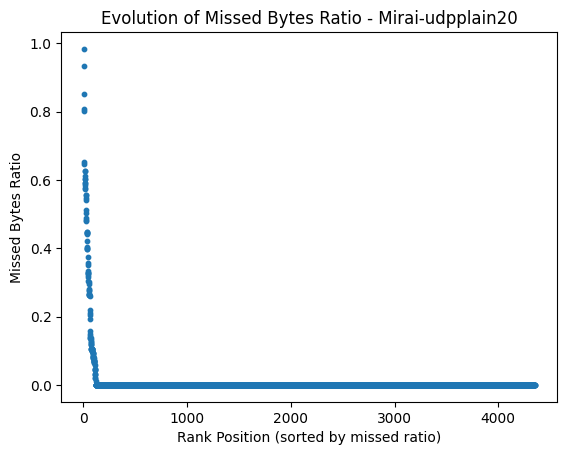

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    4352.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
1159  C1RjBa4zx025KNtASc           inf  192.168.137.121      47690   
3798  CN3kDR1ZwANqSboR48           inf    192.168.137.1      32119   
1890  CXdcXc4Gh6nGtwF1d7           inf  192.168.137.121      50492   
4340   CLkKovpywwR3RKOj6      0.984115    192.168.137.1      32123   
4345  ChNB7i3TKRZI9SA3Ec      0.934600  192.168.137.228      55792   
3601  CX31Mk2V6NQxd2tzD4      0.852246  192.168.137.100      33847   
1952  Cf0hLx4nemM6Akh4Yf      0.808340  192.168.137.228      51434   
3786  C9igR02Vg4UlP7tpG5      0.803685    192.168.137.1      32118   
2882  CLYYkN3h61zUYwChgb      0.652249  192.168.137.228      46432   
3600  CES5eY19grOsDFuVGg      0.648347  192.168.137.228      46638   
1377  C1RMUX2xAiRT

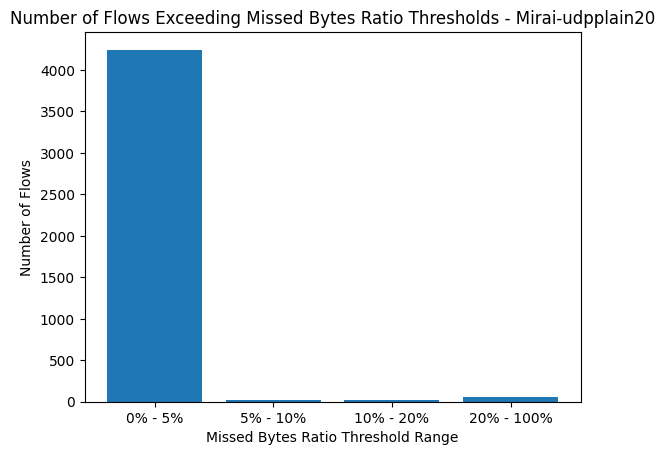

In [8]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Para DDoS HTTP Flood

In [9]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/ddos-http-flood"

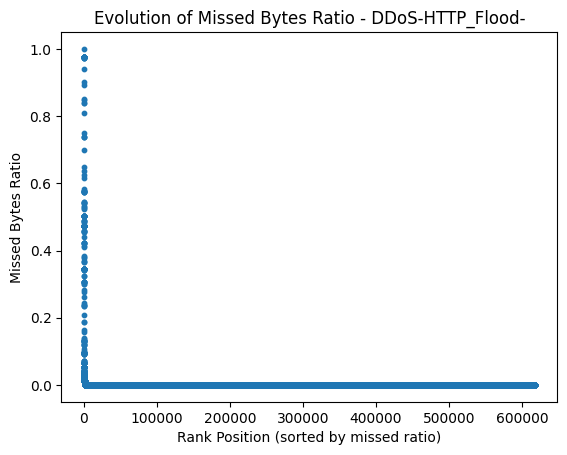

Statistics:
count    617189.000000
mean          0.000301
std           0.013245
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           0.999997
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
105505   CzXnT6iwvAAcaMUs7      0.999997  192.168.137.198      60697   
45127   CC545n4qbg0bwD1AD2      0.976744   192.168.137.41      53916   
33637   CS3mx74XyIlsDOWaP7      0.976744   192.168.137.41      53746   
35323    CwXdSmPJ3CCcR3tGj      0.976744   192.168.137.41      53795   
36071   CwHBI12dDVPQKFyl0h      0.976744   192.168.137.41      53814   
30528    C6e6q4ljI23RqdQI7      0.976744   192.168.137.41      53703   
43168   CQWMxn1jwiwXq4jfsg      0.976744   192.168.137.41      53889   
32995   CjTu9Y2RgL90GG3uRk      0.976744   192.168.137.41      53731   
35452   CYbwU03pAeDQr35cvf      0.976744   192.168.137.41      53799   
35679   CbFn

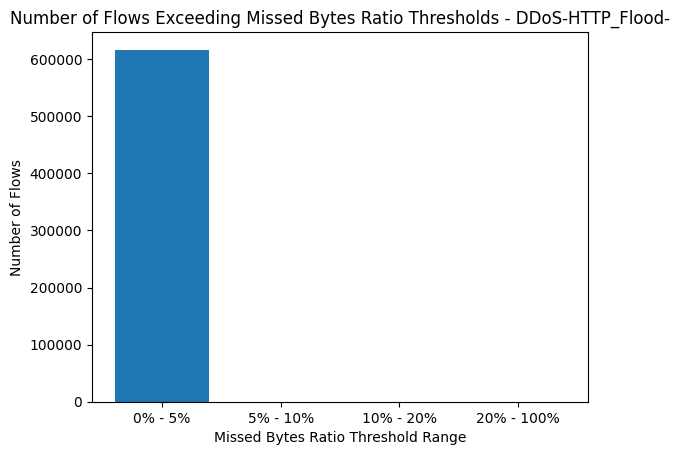

In [10]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Para DDoS PSHACK

In [11]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/ddos-pshack-flood"

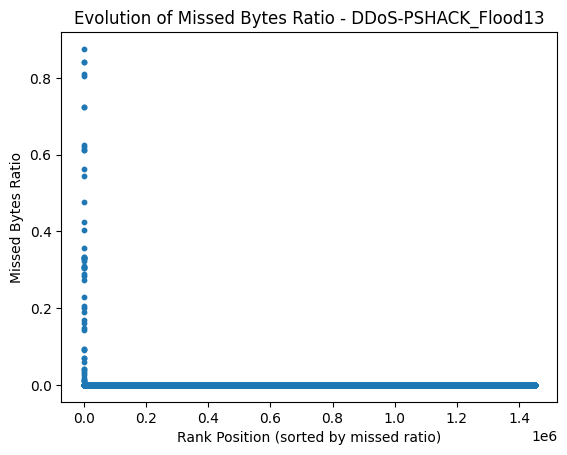

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    1450311.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
77297     CTV2V4omn4URUPl98           inf    192.168.137.1       7069   
990143    Cx7wVW0iNJTmkWcQb      0.875809  192.168.137.200      59765   
977687   CbiZfk4ihJLlFi1o9h      0.842981    192.168.137.1       7102   
6093     Cz96uB3Zh7Gfdm5Xwg      0.842981    192.168.137.1       7067   
992729    CZdNlgCM4nBBDhzfl      0.810870   192.168.137.38      41384   
77190    CIpQKU3G2sPcJ3ZrOd      0.804116    192.168.137.1       7068   
990099   ChgNsn4dfP0vuEIrKc      0.724614   192.168.137.76      53681   
991598   Cxf6Ie1cCfJEcUH5q1      0.724380  192.168.137.100      49762   
991601   Cn7mJQ1O3LWKDUEheb      0.625367  192.168.137.100      49764   
990147   CFpNTd1CA5VsOIYSb1      0

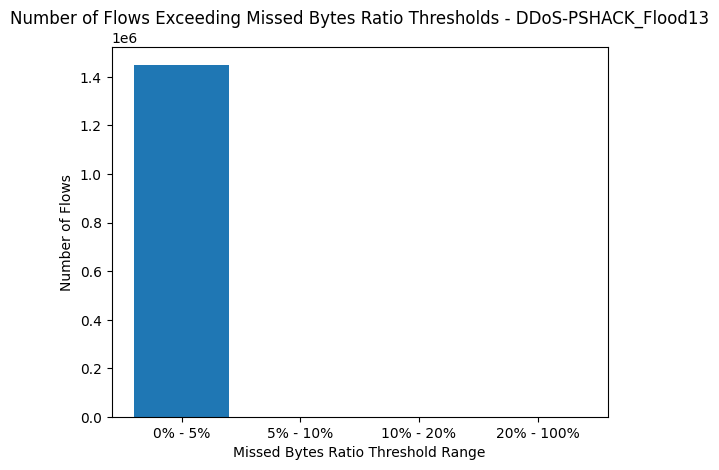

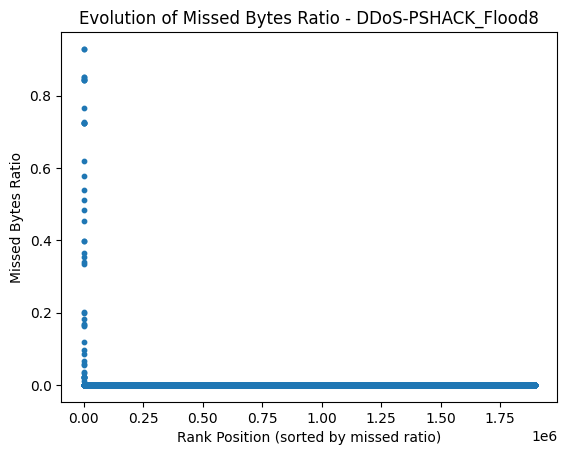

Statistics:
count    1.895017e+06
mean     9.743087e-06
std      2.515717e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.291384e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1331767  CRnjGR2MygZWI4CYBg      0.929138  192.168.137.247      32970   
503461    Cpmnzy59wmYEn54bb      0.929138  192.168.137.247      56422   
709620   C7PEod17boUF7GenWb      0.852144  192.168.137.177      51290   
1346637  CzInjs2bCbNHvN0VQa      0.852144  192.168.137.177      51387   
1445776  CG5iW443Lw6dxQInw1      0.844889   192.168.137.96      45536   
585902    CfxliE2kC05vKVwXk      0.843125  192.168.137.100      45892   
1368961  Crd8Zl3scHHQGKly7k      0.843125  192.168.137.100      34668   
29624    CAX8Yg3gzJAFz06SI5      0.843125  192.168.137.100      45868   
1331779  C5p1kC427iscHCRrDc      0.765503  192.168.137.200      48227   
29709    C

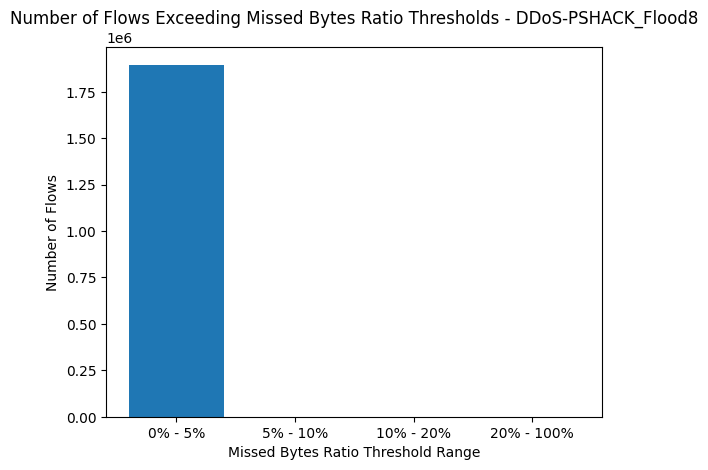

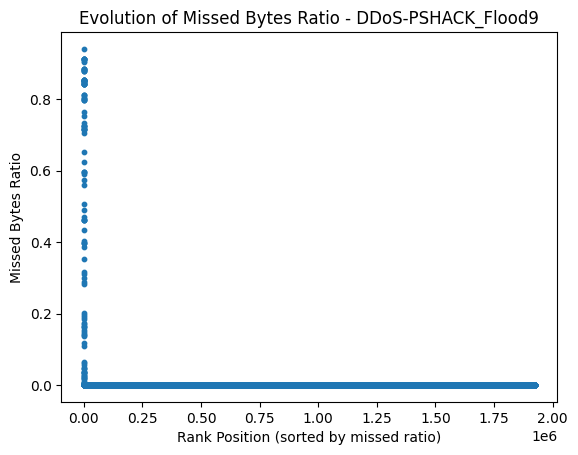

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    1923304.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1031451  CRjSih3uX9tRNXejsh           inf  192.168.137.163      35367   
51148    CBKrio2FWFJetkNkC1      0.941259   192.168.137.48      47156   
51159    CWUDkV2mCIEJvzMYAe      0.912339   192.168.137.48      46440   
51165     CGxlBk0XVJGMd6ro2      0.912339   192.168.137.48      44723   
51168    C7Ophq3BlJyBoRYioa      0.912339   192.168.137.48      41870   
51169     CE6C5w5kF8eKIOrf1      0.912339   192.168.137.48      52271   
51166    C0BB0f19hD93pQ4DF7      0.912339   192.168.137.48      47053   
51161    CfK7wc3VRfulNqr5pa      0.912283   192.168.137.48      51780   
51170    C2KhAv2uBMJxf9ACQh      0.907775   192.168.137.48      42750   
51167     CvOKM52WUDAKrCT04      0

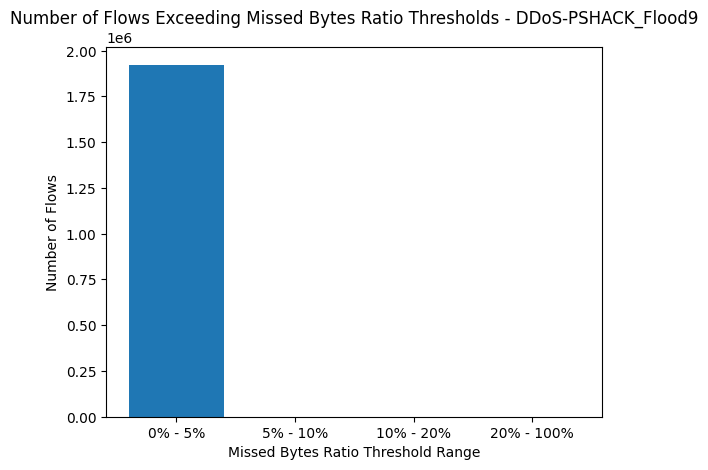

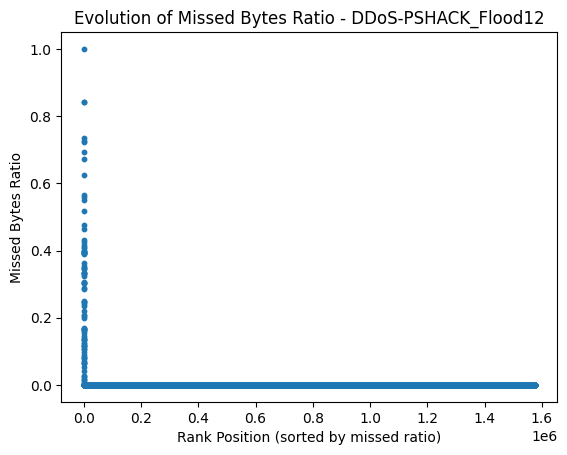

Statistics:
count    1.575133e+06
mean     1.653115e-05
std      2.725992e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999989e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1113067   CqCDlclJNNVlgDUX4      0.999999  192.168.137.139      61466   
628559   C80sTg252yfuizULf4      0.842981    192.168.137.1       7058   
1111799  CBp6YS1eCNF7lI8Kr8      0.842981    192.168.137.1       7065   
18624    Caj2QT1NVcFzjowmA5      0.734962   192.168.137.91      37004   
65818    CvvMiQ34xdtKmkWJEa      0.724614   192.168.137.76      34954   
75791    CzsklT3dNDsjrcPspd      0.724380  192.168.137.100      59488   
1575055  CH9Oe83ig8UpLGVrXl      0.692041  192.168.137.233      56508   
1097136  CCnfyo2DyLan6hCGs6      0.671243   192.168.137.84      49742   
75794    CJFZEe2jXlJfqeAPIb      0.625367  192.168.137.100      59490   
916253    

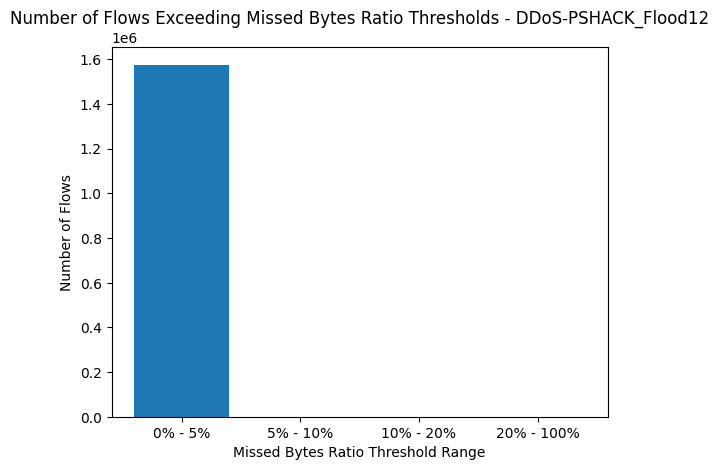

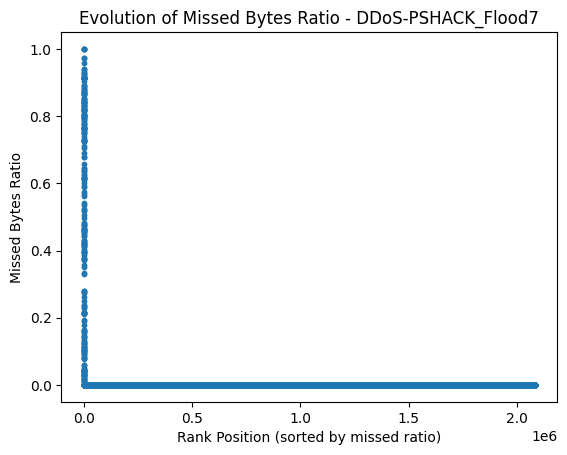

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    2082914.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1543680  CRfaV93DZweGPRkXOg           inf  192.168.137.163      35131   
1505529  C0jdWW1aCHGvOf8bZf      0.999999  192.168.137.150      49839   
253926    COFa5tCdBvPuYeZzb      0.999996  192.168.137.187      35240   
1586443  CHXZH61hEoU88Wb8z6      0.999992  192.168.137.139      61265   
555880   CVyZOp2xMP6sD7tT8f      0.999991  192.168.137.187      60991   
646878   CDPX5V2ARZTnnWcLx2      0.972699  192.168.137.150      64795   
646877   CBHh6T3lQNYlSucOF9      0.972696  192.168.137.150      64791   
1543636   CnTjZyApgzlz7HKya      0.957476   192.168.137.96      35332   
1543736  C7vXCa1uLFL6T2tPX6      0.941259   192.168.137.48      30399   
646876   C6OYcu2AmVyStOpZ1k      0

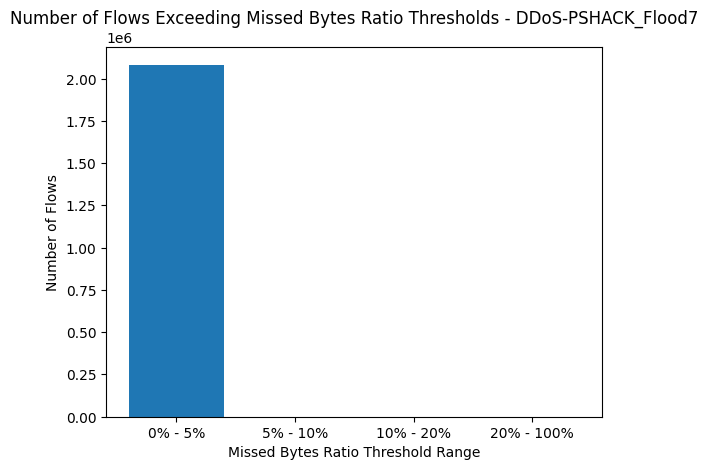

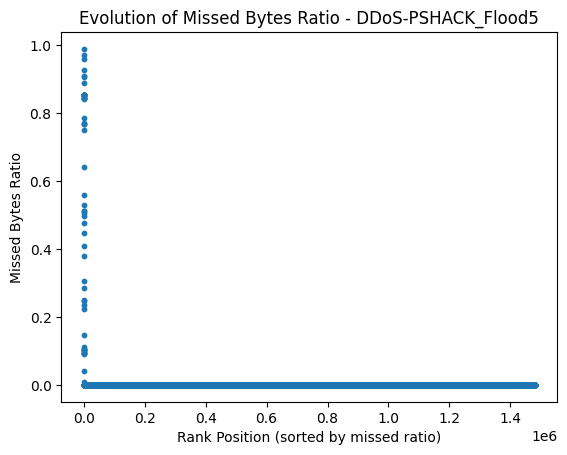

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    1480134.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
516533   CbZsEhQOhLMjksO7a           inf   192.168.137.65      35782   
21761   CNfrer4iBOjNeTMWT8      0.988693  192.168.137.210      55164   
21754   CDW5Ai4Cl138fccOw6      0.969391  192.168.137.210      49244   
531213  CuSQlL34nDE5yPJi18      0.959787  192.168.137.247      52468   
21762   CVxhN54AQiF8wk8jjd      0.926847  192.168.137.210      48390   
21766   CkqRl22qkbQZsVXWpa      0.908942  192.168.137.210      40920   
497220  C8WJqZ31mHjpD44m4k      0.905028  192.168.137.179      50204   
508794   C5s5ibWzNSfRw3My5      0.889379  192.168.137.156      24099   
24527   C9GMH41tYoEFGTZj5g      0.853631  192.168.137.210      48408   
21763   Ce2mWQ1FIgAJwTJTV4      0.853631  19

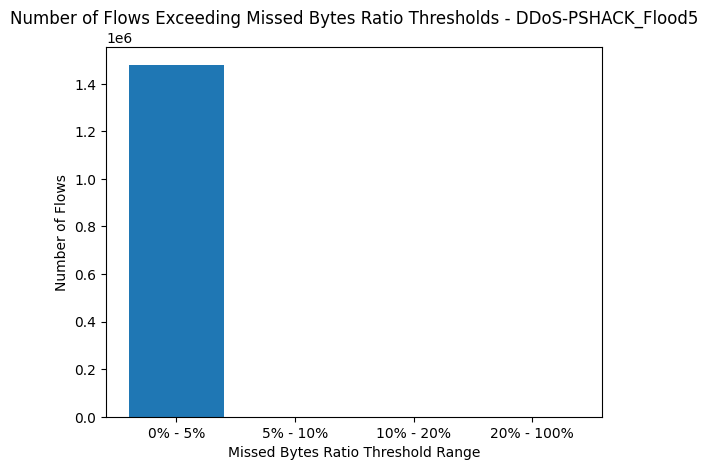

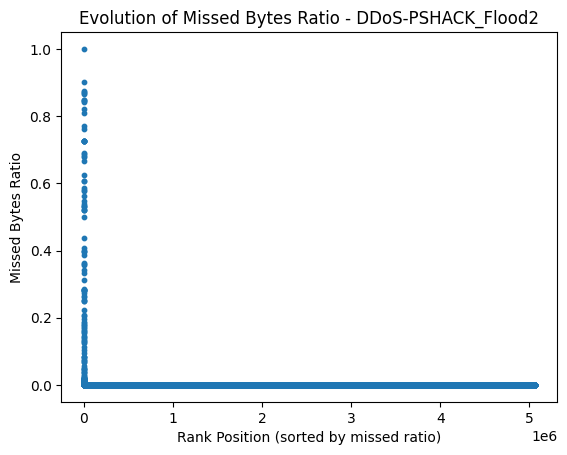

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    5059059.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
4125162  C3K95r1IJuRhy8ARx9           inf  192.168.137.150      59853   
4131153  CfiyvD3OCOhIXAbx4i      0.999999  192.168.137.187      36937   
4594923   Chxk3xpjtN7x049Lg      0.900361  192.168.137.115      25356   
4130630  CVaaHU1vU6N7t38QNi      0.875517  192.168.137.245      51290   
4130638  CTdvZ92X6Yc8xFtDDb      0.870954  192.168.137.245      51292   
4130661  C9pFdz112H7SLrofoa      0.868629  192.168.137.245      51293   
4128468  CgaGhw4V1iH8dre1C7      0.865106   192.168.137.91      48866   
4130576  CZusGz45CtelnMnoql      0.848607  192.168.137.253      38514   
4122679   CGNXvNiH9ZbaQ8399      0.848463  192.168.137.247      48760   
616868    Csh94xnEisvBgx3B7      0

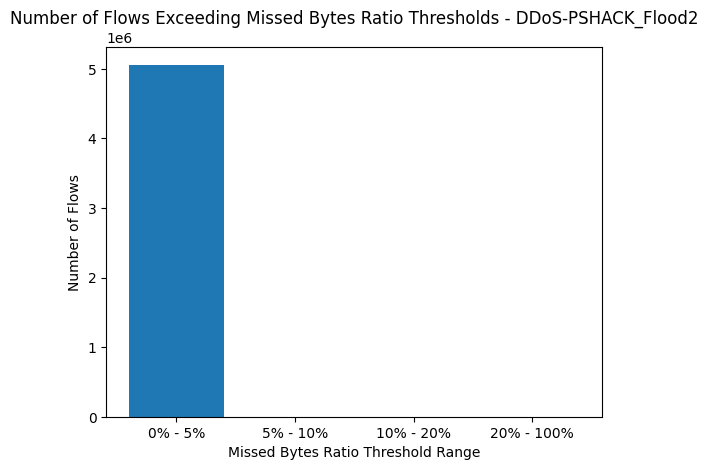

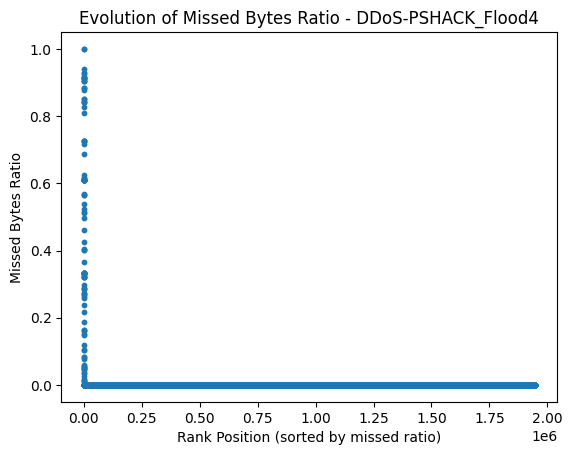

Statistics:
count    1.945476e+06
mean     2.544372e-05
std      4.104245e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999994e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
491719   CrVC0C2p2La1eRtcdh      0.999999  192.168.137.139      60847   
1024169   CEHVSs68re65mMp1c      0.999998   192.168.137.45      49394   
167962   Cayg203RFx8WPMLCMh      0.941259   192.168.137.48      53165   
90200    CJY4xL3kq689BuY5xd      0.929138  192.168.137.247      60076   
20119     CDCBV5NkrcS5PjsWj      0.928994  192.168.137.253      42956   
625536   Cc09Sq4OaTFB3IjLwb      0.920000  192.168.137.197      38719   
204704   CNNsfK1Vk8nntYKdSf      0.912339   192.168.137.48      42379   
222312   Cmt3TB452i6mh2Q4Jh      0.912339   192.168.137.48      49612   
225402   CLbFyP1Rp77n2W8G6g      0.912339   192.168.137.48      40092   
211448   C

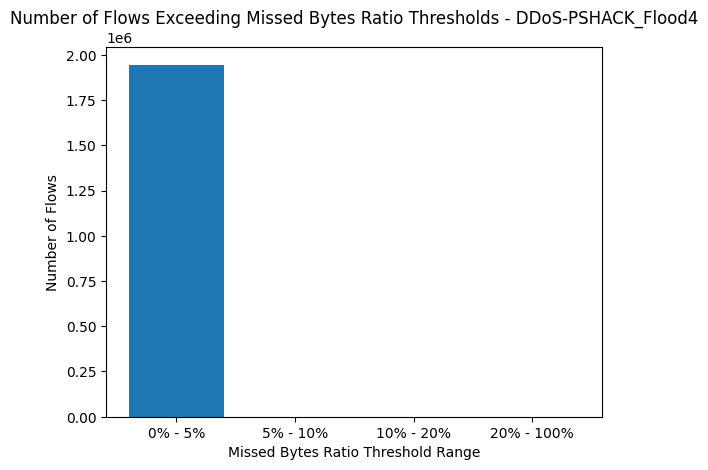

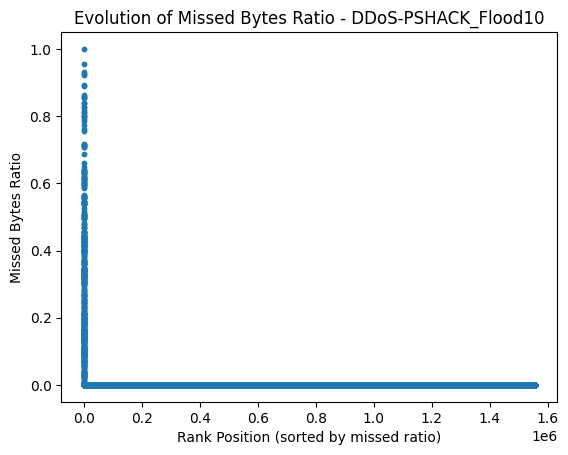

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    1555613.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1096322   Cx8agzg6K3Enlqc4e           inf  192.168.137.163      35577   
1028944   CujMrazgaYA2TRAr6           inf  192.168.137.163      35566   
1096053  CRy9aw2S9X1kJlSSWh           inf  192.168.137.163      35573   
1029185  Crkrg91aBYRbvImT76           inf  192.168.137.163      35570   
1027492  CFdgl64nDqM6nmj8al           inf  192.168.137.163      35562   
5301     CodW7l3rtXud2E1mY4      0.999996  192.168.137.139      61346   
1056197   CYDJ3dGhx1sLjx2ei      0.955756  192.168.137.149      46323   
1035369  CEu4qm36fYBjsXjkeh      0.931401   192.168.137.75      50504   
430030   COfGEz214yey10xdH1      0.925489   192.168.137.38      45634   
462842   CWN0j43LDXQ5FDFUmd      0

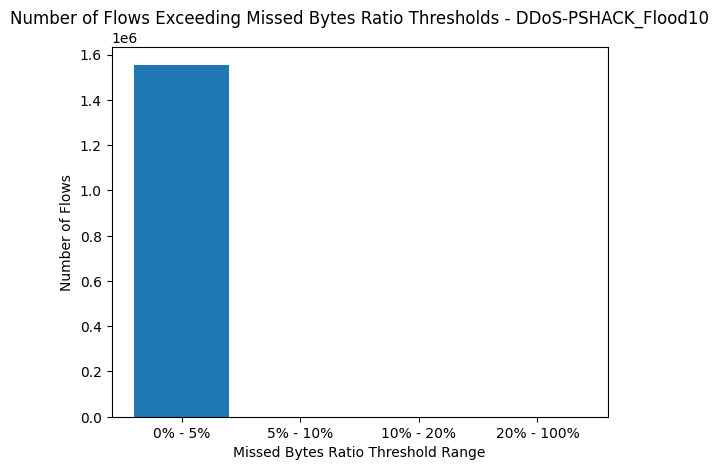

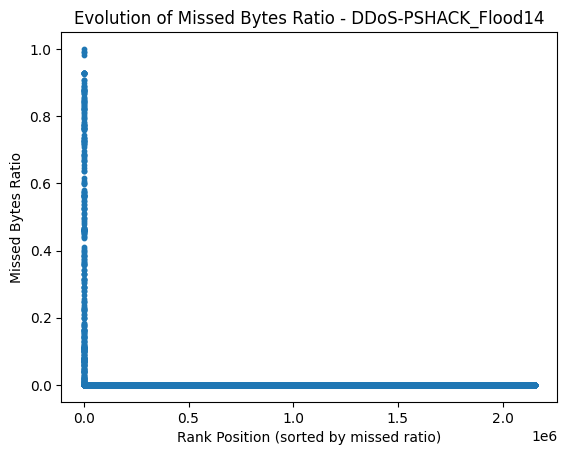

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    2153278.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
1278907   CpqfilBHDGiXAAUF7           inf   192.168.137.38      60340   
546813   Ch5K9O2wh1hAKbBO5h      0.999998  192.168.137.187      39260   
547021    CdYLlQg4SN16MfNd2      0.991559  192.168.137.150      51387   
1278897  CevIK333grcLHYzyY2      0.991555  192.168.137.150      51409   
1667100  CAd0IU20NOSXRZvhEa      0.981675   192.168.137.38      48010   
1255556  CPIlpH1C1tP7LHvDT5      0.929138  192.168.137.247      36180   
1687209  CXVVHr1FGU7cYsy7I5      0.929138  192.168.137.253      50596   
472535   CMthYe45gU7xmn0ykc      0.929138  192.168.137.247      36120   
513121   C5AcBx2cve3xwT8ghk      0.928994  192.168.137.253      59720   
1876605  CdLdS9477rT1CxAl78      0

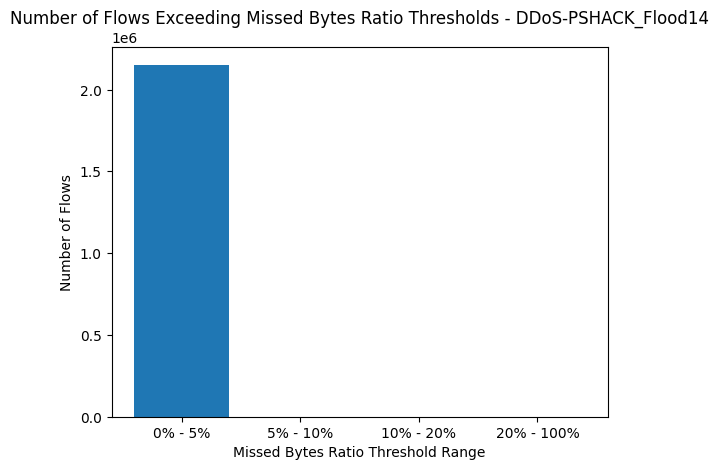

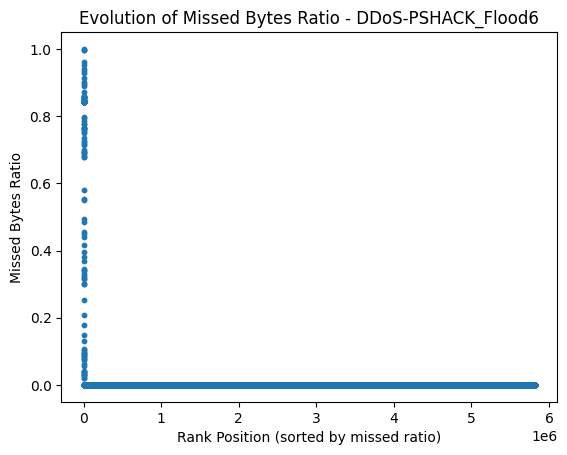

Statistics:
count    5.816336e+06
mean     1.165131e-05
std      2.970855e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.999998e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
6148      CMJvWKVVagvPYqr92      1.000000  192.168.137.139      60932   
5254887  CGq11z4prAuP6Xgeeg      0.997401  192.168.137.150      64652   
5301068  C58ZWP2zSd1UVzStTg      0.996034  192.168.137.150      64688   
5254701  CjFlwf1g7hDIPb2hCe      0.962089  192.168.137.150      64693   
5288562  C7hOQ11e48SGBA61g7      0.952548  192.168.137.150      64673   
5816183  CLP10e2G5kKsTw50za      0.941007  192.168.137.150      64698   
5254556  CkZhYt1wcj8FZ12Pdk      0.933144  192.168.137.150      64562   
5254618  CYd1CA30AMAOflVAd9      0.929138  192.168.137.247      53054   
5816254  CTZbZn4vpVCDxSir0k      0.913470  192.168.137.150      64662   
5254606  C

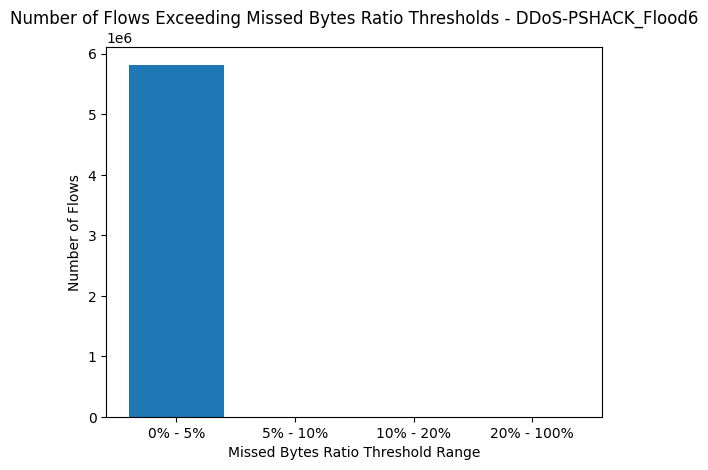

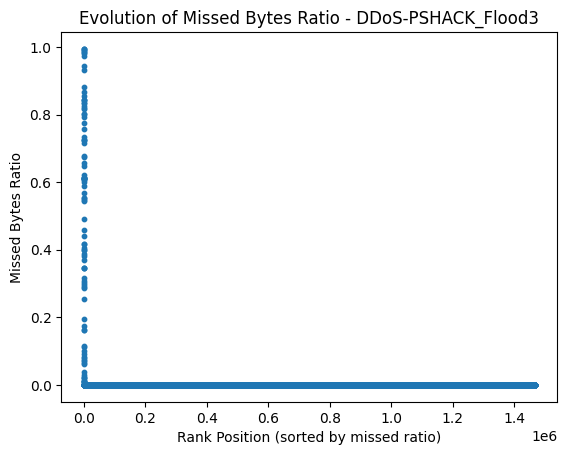

Statistics:
count    1.466230e+06
mean     3.278925e-05
std      4.779289e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      9.942638e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
509246     CCoGhm2LQEYliFO7      0.994264  192.168.137.247      39198   
508028    CjnWGWen4l6d6fmCe      0.992849    192.168.137.1       4170   
508048   CIj23I2a7qUEvCDJqj      0.992849    192.168.137.1       4180   
508060   CbQ5pe3FvueGXqqTW3      0.989303    192.168.137.1       4184   
508045    CNhwv4Krsk1Aumfj7      0.987828    192.168.137.1       4179   
508036   CZv4Ce3BMhz3yi1Cvb      0.981256    192.168.137.1       4173   
508057   Czvowt4yO8ZdHNmmq8      0.981256    192.168.137.1       4183   
508041   CpyN392suf5SyH1B5j      0.972724    192.168.137.1       4177   
508023   CcBmjr1ZXfusTmac6b      0.942978    192.168.137.1       4166   
508052   C

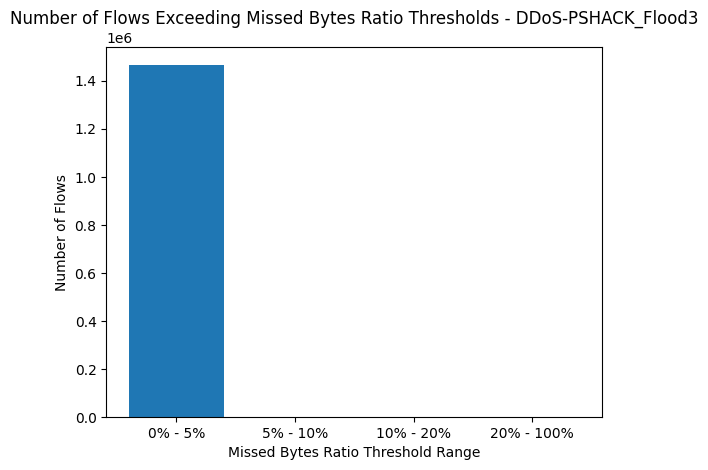

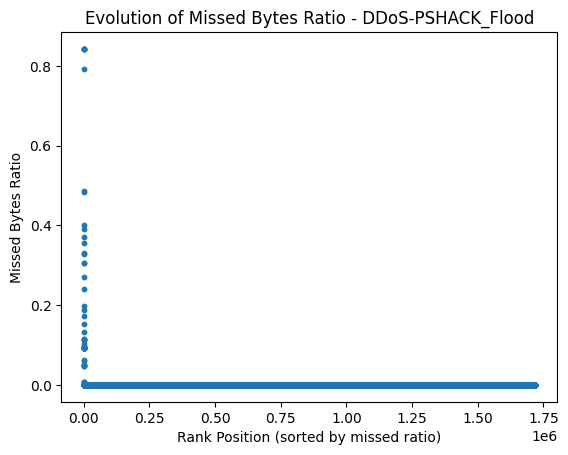

Statistics:
count    1.716826e+06
mean     6.883387e-06
std      1.778476e-03
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      8.429807e-01
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
777773   CvhaGX3HsIrS0Xqy31      0.842981    192.168.137.1       4053   
45297    CzK7hE4ESsyY71KeK7      0.842981    192.168.137.1       4008   
777772   CAI9DB20URRy5zveG1      0.842981    192.168.137.1       4052   
45298    CKt2Ei2IwVdtz124nj      0.842981    192.168.137.1       4009   
795248   CrbOGz2W8DnPLkZ4f8      0.793103  192.168.137.233      58424   
199327   CS0bUg4frjuTOMKLVk      0.485488  192.168.137.210      50916   
95137    C0pMfP1uXd7Sk0dLc5      0.484711  192.168.137.210      60366   
725591   CsQUMr2dUY4FTKWz3d      0.400000  192.168.137.210      54224   
779581    CV6Fr33bJ4gK6LzB7      0.392353  192.168.137.210      54168   
731423   C

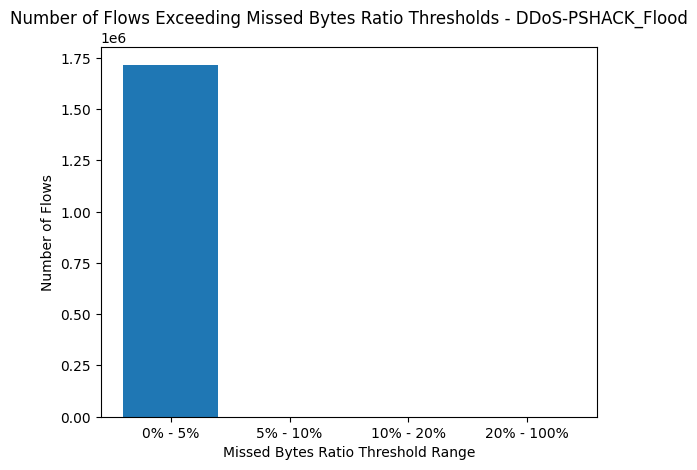

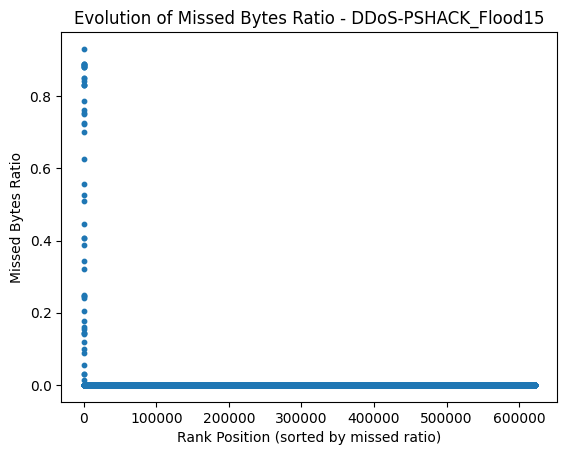

Statistics:
count    621632.000000
mean          0.000042
std           0.005469
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           0.930693
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
146      C0FZHqjEoyeolfC9f      0.930693  192.168.137.162      43210   
204       CQ8pInAzJaQPbvdG      0.888472   192.168.137.66      46918   
168     CdArY04BIXrsnA3Dt1      0.888472  192.168.137.118      37462   
171     C61QrC13ZVyiA0vAe9      0.888472  192.168.137.205      57690   
386996    CUWrU5CTXmSdLErZ      0.886993   192.168.137.38      34462   
235     Cp9q8w4iHga5WubSm6      0.885135   192.168.137.66      46922   
216     CQXkyb3i3nofRzUgCd      0.882028  192.168.137.205      57694   
227     CDUa7m1d2nl9ruUg0g      0.879805  192.168.137.205      57696   
225     Cod7DX1DoUaqykTydg      0.879805  192.168.137.118      37468   
553     CArN

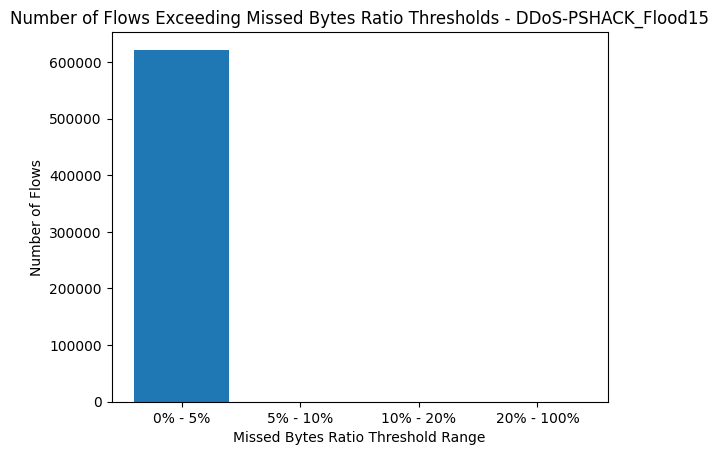

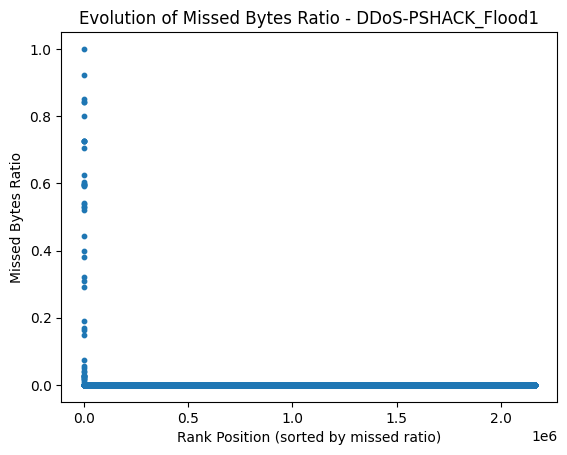

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    2162396.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                        uid  missed_ratio        id.orig_h  id.orig_p  \
41337     CO7qWEfDAIqpaTHu9           inf  192.168.137.163      33453   
904309   Cmk2re3tCiL11i17Ce      0.999986  192.168.137.150      59758   
1139501  Cae2pN12X5g0l6xZL1      0.921634  192.168.137.253      38462   
589576   COfy8x4V9oqre9bFeg      0.852144   192.168.137.36      33482   
485285    CGWYDBecUUx7fjxs7      0.843125  192.168.137.100      55460   
5963     CNUukN1i9GfZpTU3V7      0.842278   192.168.137.36      33415   
2162288  CckbrK3N8OWmdzHEDd      0.801426  192.168.137.206      52278   
703254    CQWbu5BGxalvoUwy9      0.724614   192.168.137.76      52831   
564066   CQrgAq1ZEjU1woXxbk      0.724614   192.168.137.76      40385   
1139467  CjdY2B1JmgihXBCfAf      0

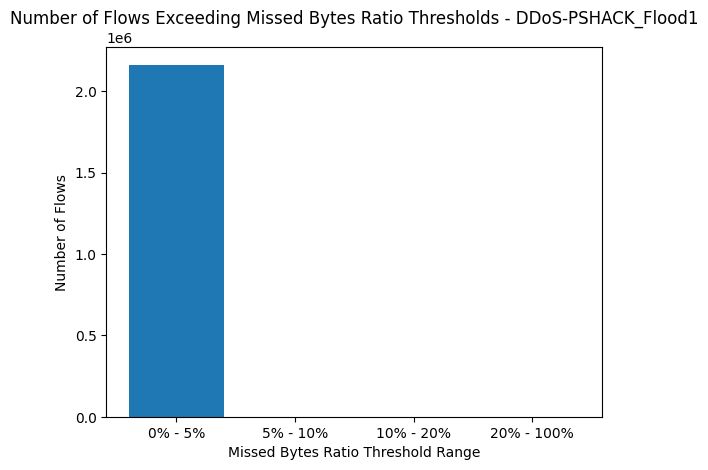

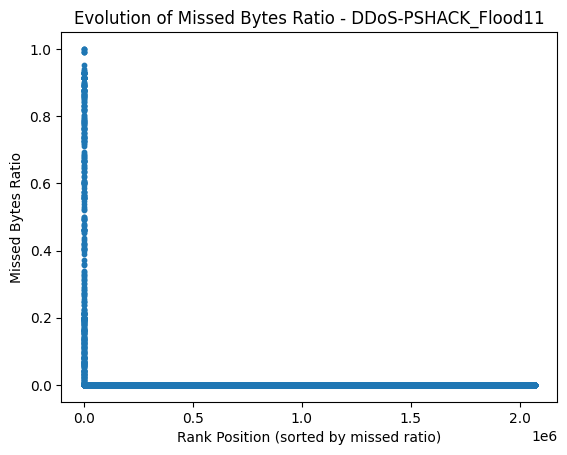

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    2069376.0
mean           inf
std            NaN
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
277976  CHha5H1LxKrQGemOo4           inf  192.168.137.163      35623   
958     CRyp0W1IsUEoy3Ou36           inf  192.168.137.163      35584   
694     Cy4DiO1hwurbu9ME52           inf  192.168.137.163      35580   
972536  CfJQUM1dGY9g3Mw0v5      0.999999  192.168.137.187      38930   
927227   CQZzCxUXKxZbUW7M7      0.999993  192.168.137.187      52137   
935415   CW07ug4RUNuWubdec      0.999988  192.168.137.187      43587   
278190   C9p4LS39cf2iMIIC2      0.991622  192.168.137.150      50685   
347039  Ce9jb53zQozC65kiS9      0.991620  192.168.137.150      50689   
274917  ChRgbE3rpOrj7hG7ad      0.991612  192.168.137.150      50671   
279861   CMtvE9dc9aRSpzey6      0.953048  19

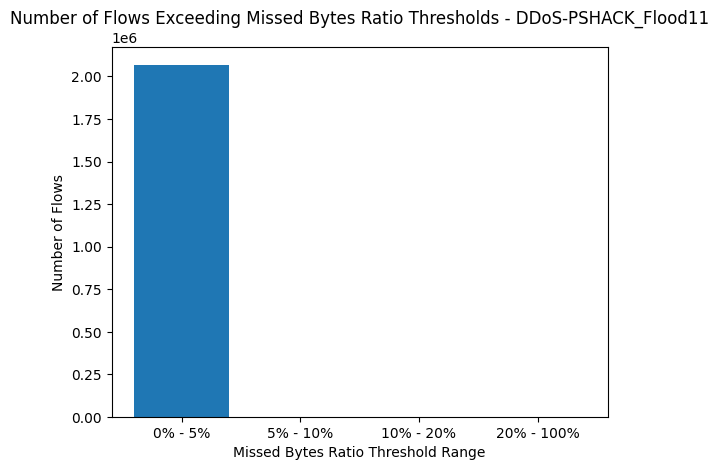

In [12]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Recon-OSScan

In [13]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/Recon-OSScan"

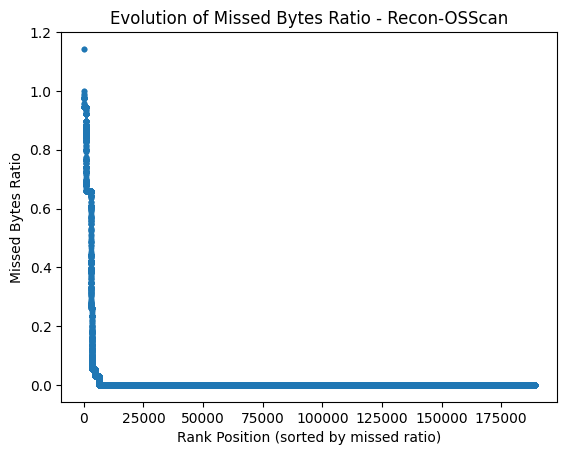

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    189036.0
mean          inf
std           NaN
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
89698   ChqoeE2S2WPTRqAC1k           inf  192.168.137.163      35806   
7428    CdsuSb4Tt6fLol8318           inf  192.168.137.238      49069   
153738   CvQMAZ2gnArgVn72x           inf  192.168.137.163      42100   
156749  C2XAqg3e9mQSzzmuq4           inf  192.168.137.163      42120   
158475  CNf80q11cCRVJIODBe           inf  192.168.137.163      42132   
104977  CfemIt3R3D56lvbrbl           inf  192.168.137.163      41850   
159765  C2C1bj4sjUoMKg5Gue           inf  192.168.137.163      42136   
160063  Cow3Uv1bIcjCzk3hwa           inf  192.168.137.163      42140   
162508  CwNzF339dVfzGoZ3Ja           inf  192.168.137.163      42148   
176592  Cx63Kw1HOg3Kd9pZQg           inf  192.168.13

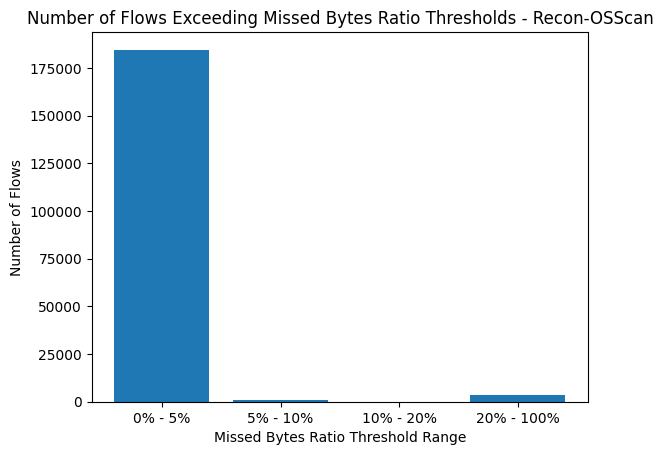

In [14]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Recon PortScan

In [15]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/Recon-PortScan"

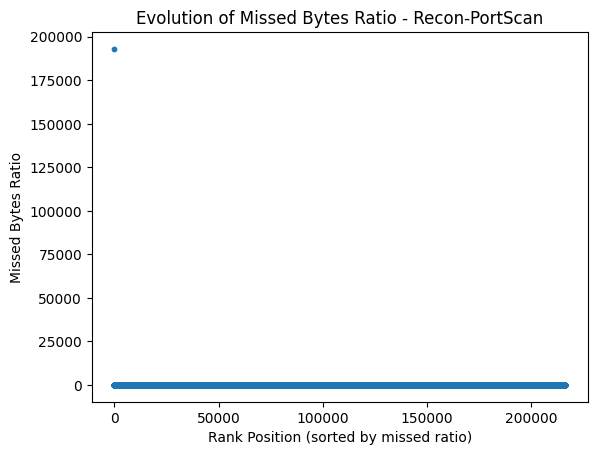

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    216408.0
mean          inf
std           NaN
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
29204   ChwXtr28ptuhNN21x2           inf  192.168.137.238      35926   
29203   CqvCLz4cgAo0MmAo3f           inf  192.168.137.238      59425   
113859   CpdxyVQTdbMHxtww6           inf  192.168.137.163      33883   
119757  ClSJLY3Iu4jTYa66L9           inf  192.168.137.163      33916   
140413   COUA7LQZyv7KOMPY6           inf  192.168.137.163      34049   
110743  CZRHU13hNxWsbi14k8           inf  192.168.137.163      56271   
108613  C0ETZ21r27eumHMkb3           inf  192.168.137.163      56253   
39710   CuhhOg3pehVwIZMSMe           inf  192.168.137.238      35970   
79905   C5JDlG3UJHYTqg4Gwk           inf  192.168.137.163      56058   
179826  CjOwsD1DxKqiigh96f           inf  192.168.13

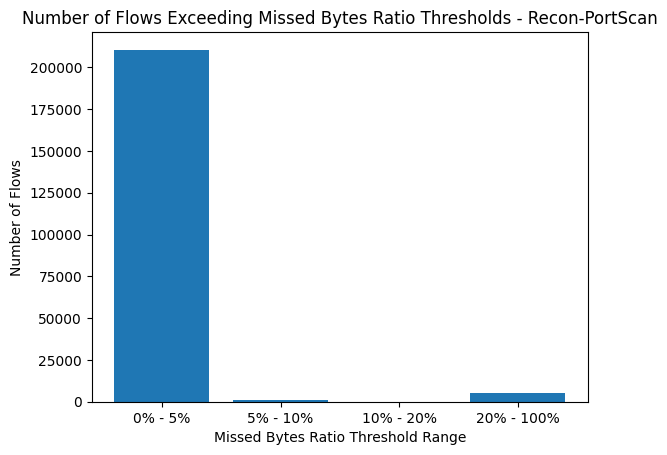

In [16]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## Dictionary BrutetForce

In [17]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/DictionaryBruteForce"

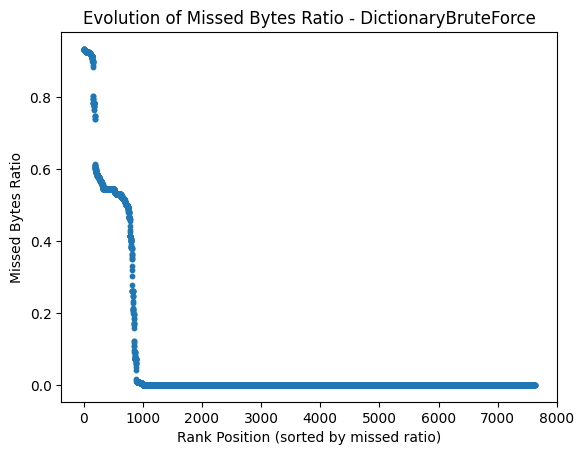

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    7626.0
mean        inf
std         NaN
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                     uid  missed_ratio        id.orig_h  id.orig_p  \
2072   CqZe45x8d7RRs7K13           inf  192.168.137.100      55486   
6638  CinUmD1ORxW6g2tZO1      0.934861   192.168.137.65      59198   
6791  CKhVpR2fY69Eu3eoWi      0.934861   192.168.137.65      59504   
6716   CljJ1ihOLvCJ1CUHf      0.934861   192.168.137.65      59340   
6637  C4Nw9L3yP4Kmi0RBtf      0.933894   192.168.137.65      59194   
6712  CvYPIB1MPSPnWd2Il6      0.933894   192.168.137.65      59350   
6761  CzwKwF4hLVac4Izdxl      0.932934   192.168.137.65      59450   
6679  Cdc5jd1c7jLSkgJRze      0.932934   192.168.137.65      59280   
6675  CqYOyL2vgqwyfdH0Fe      0.932934   192.168.137.65      59270   
6696  CyDwAw4hFCjmJb0mY6      0.932934   192.168.137.65      59314   
6709  CGwTdV2bVs1O

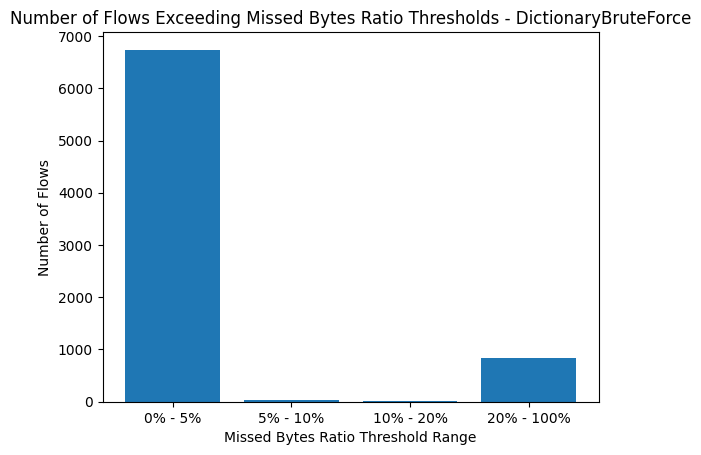

In [18]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)

## benign

In [20]:
main_directory = "/root/bbdd/logs-zeek/cic-iot-2023-logs/benign"

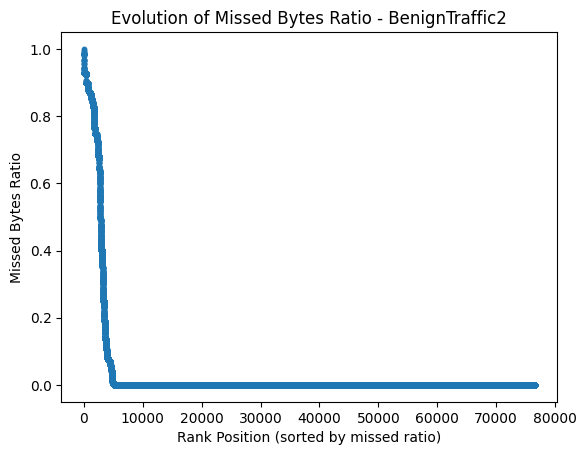

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    76534.0
mean         inf
std          NaN
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
71146  CBjESG19mtbXvu2Kqd           inf  192.168.137.131      41176   
71135  CWxjWk17iBZfEEzQ6d           inf  192.168.137.131      47244   
24638  CSZAJa4v3TxiHvqzfj           inf  192.168.137.131      37202   
24639  CwLHIa4E8dYIyjhLh4           inf  192.168.137.131      40193   
70573   CSwneUMQmaLpz4aDd           inf  192.168.137.154      50458   
43524  CkLs9j43j9M9gkHxR8           inf  192.168.137.154      48540   
45736  C2ZAmH1Z4vVxgqTlge           inf  192.168.137.154      48704   
72769  C0iXBH3ohLMkjzCXL1           inf  192.168.137.154      50586   
75075  CX6SM730WnP0RToTu4           inf  192.168.137.154      54620   
11221  CCQbgj1dCquN91zaz7      0.999988  192.168.137.253      60522   

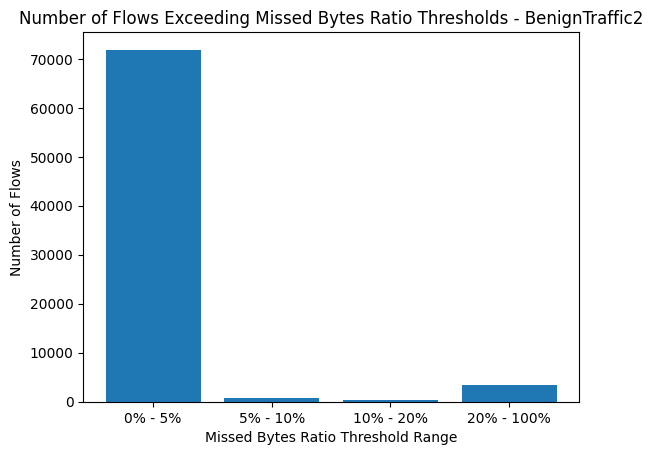

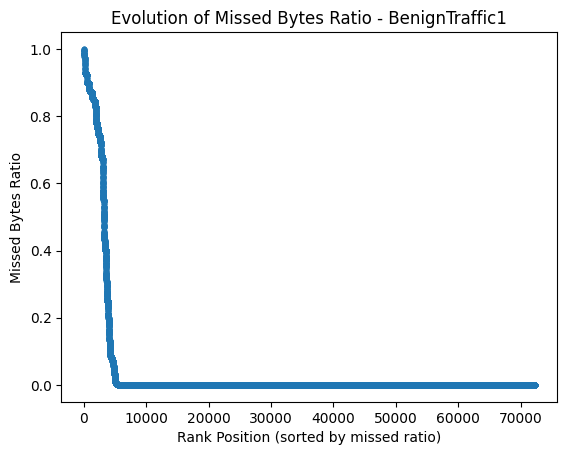

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    72271.0
mean         inf
std          NaN
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
61123  CS0pMY3AMOAVFOM8Dd           inf  192.168.137.154      48990   
23701  CCQ9Dm2qy9rzT0q4ei           inf  192.168.137.154      42618   
11241   CGjz7SXhVJt7jeBn3           inf  192.168.137.154      41780   
46284  C7orHm4NHcwujEbaT4      1.000000  192.168.137.128      39042   
12341   C0jyjl4V0mp7Trvw3      0.999998  192.168.137.253      50250   
61291  Cbpqbw4TKOsgQ2twYe      0.999993  192.168.137.253      55552   
34716  CE3Skm4OI4z12voOic      0.998176  192.168.137.172      45380   
9      CqVVh817mYGnxmthW3      0.997594  192.168.137.253      40944   
3775   C66Xny1ktQZLYi9jb8      0.995332  192.168.137.172      45994   
36979  CKvsyD4qC0pBHAMnN6      0.995118   192.168.137.83      57574   

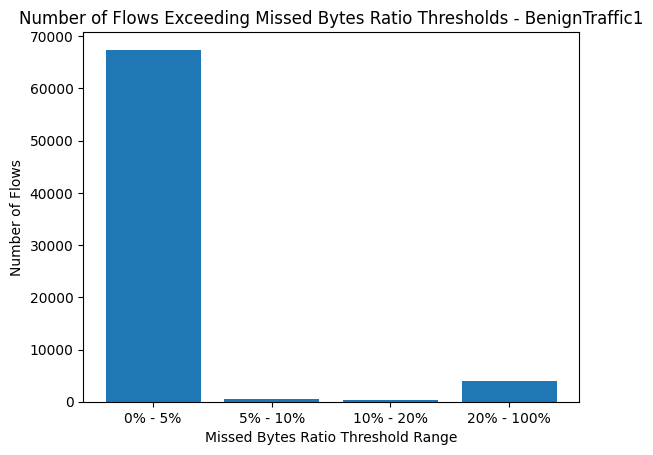

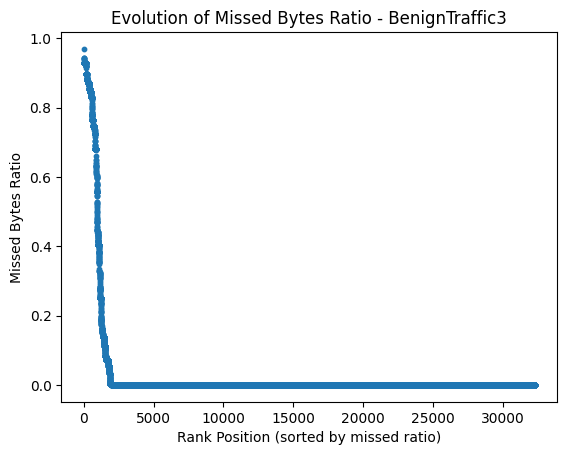

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    32278.0
mean         inf
std          NaN
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                      uid  missed_ratio        id.orig_h  id.orig_p  \
31601  CXCNXU1af4tEPF63Cc           inf  192.168.137.131      42020   
31600  CpxxMB4w3zhVifPbQi           inf  192.168.137.131      48089   
1036    C0pZ2Aa1ZHEApRLx7           inf  192.168.137.154      54788   
5736    CZ2r97IMI2dzrwXs2           inf  192.168.137.154      51264   
3769   CjAfTz3bdJasXOccuf           inf  192.168.137.131      38371   
3385   COCbxo2bDqLetWYar4           inf  192.168.137.154      51116   
3770    CavhfWK5VGGxeJJy1           inf  192.168.137.131      41362   
26551  CsvJDn1yc0vXogVNh6           inf  192.168.137.154      56732   
265     CuFcQt5D8wlxBvcXb      0.969671   192.168.137.58      59600   
14540  CGiTOh4loxBIh7OfAd      0.944157   192.168.137.41      54267   

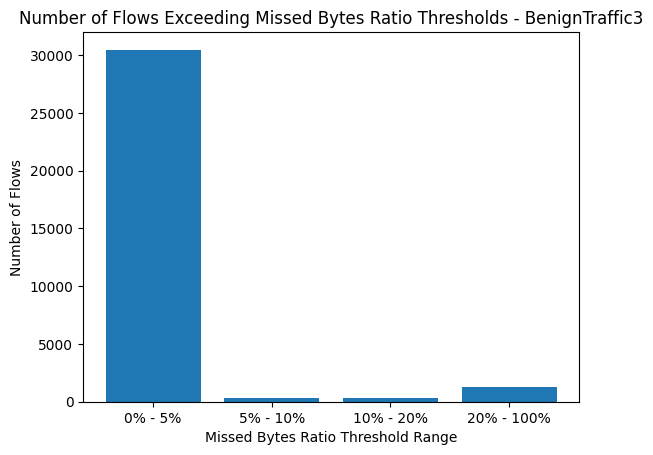

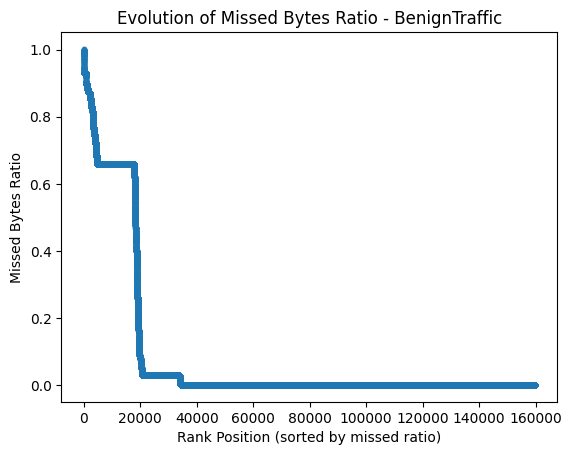

/root/jupyter-env/lib/python3.9/site-packages/pandas/core/nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


Statistics:
count    159711.0
mean          inf
std           NaN
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           inf
Name: missed_ratio, dtype: float64

Top 15 highest missed_bytes ratios:
                       uid  missed_ratio        id.orig_h  id.orig_p  \
39847   CcOmfS1hx4gkKgB7Xb           inf   192.168.137.51      58472   
64608   CrxRxi25719uZvoVhd           inf  192.168.137.253      53026   
63593   CAJGDD4ZjMmXkS5pG7      1.002415  192.168.137.253      47426   
63594   CEhQLQ3pF0J14Ff5mj      1.000000  192.168.137.253      47428   
63156    CY326s40vH43oAI9b      1.000000  192.168.137.253      44406   
22749   CBqm9P2dq6DF2Twt01      1.000000  192.168.137.227      59459   
159604  CxKa6U1MsmVvl7ILMc      0.999493  192.168.137.253      40940   
25496   CmeWsx3rX6X6FaoC3j      0.998549  192.168.137.172      55236   
62762    CAgLlAcnTshBBtvge      0.997564  192.168.137.253      47600   
146465  CSLJzg1MI8JAiJe2O2      0.997469   192.168.1

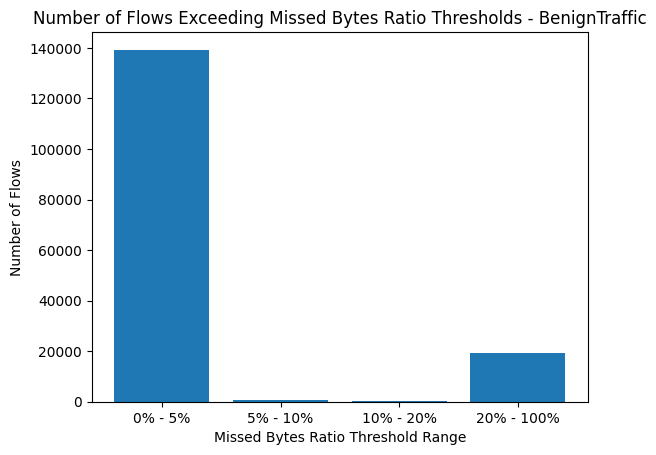

In [21]:
for folder in os.listdir(main_directory):
    folder_path = os.path.join(main_directory, folder)
    if os.path.isdir(folder_path):
        process_conn_log(folder_path)